In [1]:
# Importação de bibliotecas externas necessárias
from deap import base, creator, tools, benchmarks
import deap.cma as cma

import copy
import random
import math
import time
import logging
import threading

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from scipy.integrate import odeint
from scipy.integrate import solve_ivp

import sys
import os

# Importação de módulos personalizados
sys.path.append(os.path.abspath("..")) 
from Modules.Helper import Helper
from Modules.Solvers import Solvers
from Modules.Plotters import Plotters
from Modules.Equation import Equation

In [2]:
# Carrega os dados do sistema GRN5 e define as condições iniciais
labels = ['A', 'B', 'C', 'D']
df, max_data = Helper.load_data(filename='../Data/ABCD_DATA.txt', labels=labels)
initial_conditions = np.array([df[label].iloc[0] for label in labels])
t_span = (df['t'].iloc[0], df['t'].iloc[-1])  # Intervalo de tempo para simulações
t_eval = np.array(df['t'])  # Ponto de avaliação dos dados temporais
original = np.array(df[labels]).T  # Dados originais para cálculo de erro

# Limites nos valores dos coeficientes tau, k e n 
bounds = {
    'tau': (0.1, 5.0),
    'k': (0.1, 2.0),
    'n': (0, 30.0)
}

IND_SIZE = 22  # Tamanho do indivíduo (número total de coeficientes)
GENERATION_LIMIT = 5000
NO_IMPROVEMENT_LIMIT = 50
HARD_SIGMA_INCREASE_FACTOR = 10
TOLERANCE = 1E-4

In [3]:
# Representa um coeficiente com valor e limites
class Coefficient:
    def __init__(self, bounds_val):
        self.val = random.uniform(*bounds_val)  # Inicializa com valor aleatório dentro dos limites
        self.bounds_val = bounds_val
    
    def __repr__(self):
        return f"val={self.val}"

# Representa um coeficiente usado no CMA-ES com limites.
class CMACoefficient:
    def __init__(self, val, bounds_val):
        self.bounds_val = bounds_val
        self.val = self.limit_val(val)  # Ajusta o valor aos limites
    
    # Garante que o valor esteja dentro dos limites
    def limit_val(self, val):
        return max(self.bounds_val[0], min(val, self.bounds_val[1]))
    
    def __repr__(self):
        return f"val={self.val}"

# Representa um indivíduo contendo coeficientes e funções para manipulação
class Individual:
    def __init__(self, method='RK45', error='ABS'):
        # Estrutura do indivíduo contendo os coeficientes para cada variável
        self.coeffs = {
            'A': {
                'A': {'n': None, 'k': None},  # nAA & kAA
                'B': {'n': None, 'k': None},  # nAB & kAB
                'D': {'n': None, 'k': None},  # nAD & kAD
                'tau': None                   # tauA
            },
            'B': {
                'C': {'n': None, 'k': None}, # nBC & kBC
                'D': {'n': None, 'k': None}, # nBD & kBD
                'tau': None                  # tauB
            },
            'C': {
                'A': {'n': None, 'k': None}, # nCA & kCA
                'D': {'n': None, 'k': None}, # nCD & kCD
                'tau': None,                 # tauC
            },
            'D': {
                'A': {'n': None, 'k': None}, # nDA & kDA
                'D': {'n': None, 'k': None}, # nDD & kDD
                'tau': None,                 # tauD
            }
        }
        
        # Tamanho do indivíduo
        self.ind_size = IND_SIZE 
        
        # Fitness inicializado como infinito
        self.fitness = np.inf
        self.method = method
        self.error = error
     
    @staticmethod
    def list_to_ind(list_ind, method, error):
        i = 0
        ind = Individual(method=method, error=error)
        for key, label in ind.coeffs.items():
            label['tau'] = CMACoefficient(list_ind[i], bounds['tau'])
            i += 1
            for key, coeffs in label.items():
                if key != 'tau':
                    coeffs['n'] = CMACoefficient(list_ind[i], bounds['n'])
                    coeffs['k'] = CMACoefficient(list_ind[i+1], bounds['k'])
                    i += 2
        return ind
    
    def ind_to_list(self):
        ind_list = []
        for key, label in self.coeffs.items():
            ind_list.append(label['tau'].val)
            for key, coeffs in label.items():
                if key != 'tau':
                    ind_list.append(coeffs['n'].val)
                    ind_list.append(coeffs['k'].val)
        return ind_list
    
    @staticmethod
    def apply_bounds(population, method, error):
        for ind in population:
            list_ind = Individual.list_to_ind(ind, method, error)
            ind[:] = Individual.ind_to_list(list_ind)
    
    @staticmethod    
    def cma_evaluate(method, error, list_ind):
        ind = Individual.list_to_ind(list_ind, method, error)
        ind.calc_fitness()
        return ind.fitness,
    
    # Calcula o fitness do indivíduo simulando o sistema de ODEs
    def calc_fitness(self):
        try:
            equation = Equation(self.numerical_coeffs, labels)
            # Métodos do solve_ivp: RK45, DOP853, LSODA, BDF... 
            y = solve_ivp(self.system, t_span, initial_conditions, method=self.method, t_eval=t_eval, args=(equation, ), min_step=0.001).y
            
            if self.error == 'ABS':
                self.fitness = self.abs_error(original, y)
            elif self.error == 'MSE':
                self.fitness = self.MSE_error(original, y)
            elif self.error == 'MABS':
                self.fitness = self.mean_abs_error(original, y)
            elif self.error == 'SQUARED':
                self.fitness = self.squared_error(original, y)
            
            self.fitness = min(self.fitness, 1e6)
        except:
            # Trata exceções relacionadas ao solver
            print("Fitness Overflow")
            self.fitness = 1e6
            
    def calc_all_fitness(self):
        equation = Equation(self.numerical_coeffs, labels)
        # Métodos do solve_ivp: RK45, DOP853, LSODA, BDF... 
        y = solve_ivp(self.system, t_span, initial_conditions, method=self.method, t_eval=t_eval, args=(equation, ), min_step=0.001).y
        
        return {
            'ABS_Fitness': self.abs_error(original, y), 
            'SQUARED_Fitness': self.squared_error(original, y),
            'MSE_Fitness': self.MSE_error(original, y), 
            'MABS_Fitness': self.mean_abs_error(original, y), 
        }
     
       
    @staticmethod
    def system(t, y, equation):
        vals = [Solvers.norm_hardcoded(val, max_data[label]) for val, label in zip(y, labels)]
        N_A, N_B, N_C, N_D = vals
        
        dA = equation.complex_eqs(vals, 'A', [['-A', '-D'], ['+B', '-D'], ['+A', '-B', '+D']])
        dB = equation.complex_eqs(vals, 'B', [['-C'], ['+D']])
        dC = equation.complex_eqs(vals, 'C', [['+D'], ['-A']])
        dD = equation.complex_eqs(vals, 'D', [['-A'], ['-D']])

        return [dA, dB, dC, dD]
    
    @staticmethod
    def abs_error(original, pred):
        return sum(sum(abs(original-pred)))
    
    @staticmethod
    def squared_error(original, pred):
        return sum(sum( (original-pred)**2 ))**(1/2)
    
    @staticmethod
    def MSE_error(original, pred):
        return np.mean((original-pred)**2)
    
    @staticmethod
    def mean_abs_error(original, pred):
        return np.mean(abs(original-pred))
            
    @staticmethod
    def initialize_ind(bounds):
        ind = Individual()
        for key, label in ind.coeffs.items():
            label['tau'] = Coefficient(bounds['tau'])
            for key, coeffs in label.items():
                if key != 'tau':
                    coeffs['n'] = Coefficient(bounds['n'])
                    coeffs['k'] = Coefficient(bounds['k'])
                    
        ind.calc_fitness()
        return ind
    
    @property
    def numerical_coeffs(self,):
        
        numerical_coeffs = copy.deepcopy(self.coeffs)
        for key, label in numerical_coeffs.items():
            label['tau'] = label['tau'].val
            for key, coeffs in label.items():
                if key != 'tau':
                    coeffs['n'] = int(coeffs['n'].val)
                    coeffs['k'] = coeffs['k'].val
                    
        return numerical_coeffs
    
    def plot(self, method='RK45', comparison=True):
        methods = [self.method]
        results = {}
        equation = Equation(self.numerical_coeffs, labels)
        # Métodos do solve_ivp: RK45, DOP853, LSODA, BDF... 
        results[method] = solve_ivp(self.system, t_span, initial_conditions, method=method, t_eval=t_eval, args=(equation, ), min_step=0.001).y
        Plotters.plot_methods(results=results,t=t_eval, methods=methods, labels=labels)
        if comparison:
            Plotters.plot_comparison(results=results, t=t_eval, df=df, methods=methods, labels=labels)
            
    @staticmethod        
    def initialize_average_bounds(bounds, ind_size):
        averages = [np.mean(value) for value in bounds.values()]
        array = np.resize(averages, ind_size)
        return array   
        
    def __repr__(self):
        coeffs_repr = {k: v for k, v in self.coeffs.items()}
        return f"Individual (fitness={self.fitness}, coeffs={coeffs_repr}, ind_size={self.ind_size})"

In [4]:
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)

def instantiate_toolbox():
    # Criação do tipo de indivíduo e toolbox
    toolbox = base.Toolbox()

    # Inicializa estratégia CMA-ES
    centroids = Individual.initialize_average_bounds(bounds, IND_SIZE)
    strategy = cma.Strategy(centroid=centroids, sigma=10, lambda_=int(4+(3*np.log(IND_SIZE))))

    toolbox.register("generate", strategy.generate, creator.Individual)
    toolbox.register("update", strategy.update)

    # Estatísticas e parâmetros do algoritmo
    hof = tools.HallOfFame(1)
    stats = tools.Statistics(lambda individual: individual.fitness.values)
    stats.register("avg", np.mean)
    stats.register("std", np.std)
    stats.register("min", np.min)
    stats.register("max", np.max)
    return toolbox, hof, strategy, stats

Skipping already processed: seed=0, error=ABS, method=RK45
Skipping already processed: seed=0, error=ABS, method=DOP853
Skipping already processed: seed=0, error=ABS, method=LSODA
Skipping already processed: seed=0, error=SQUARED, method=RK45
Skipping already processed: seed=0, error=SQUARED, method=DOP853
Skipping already processed: seed=0, error=SQUARED, method=LSODA
Skipping already processed: seed=0, error=MSE, method=RK45
Skipping already processed: seed=0, error=MSE, method=DOP853
Skipping already processed: seed=0, error=MSE, method=LSODA
Skipping already processed: seed=0, error=MABS, method=RK45
Skipping already processed: seed=0, error=MABS, method=DOP853
Skipping already processed: seed=0, error=MABS, method=LSODA
Skipping already processed: seed=1, error=ABS, method=RK45
Skipping already processed: seed=1, error=ABS, method=DOP853
Skipping already processed: seed=1, error=ABS, method=LSODA
Skipping already processed: seed=1, error=SQUARED, method=RK45
Solver: DOP853, Error:

C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ivp\common.py:39: UserWarning: The following arguments have no effect for a chosen solver: `min_step`.
  warn("The following arguments have no effect for a chosen solver: {}."


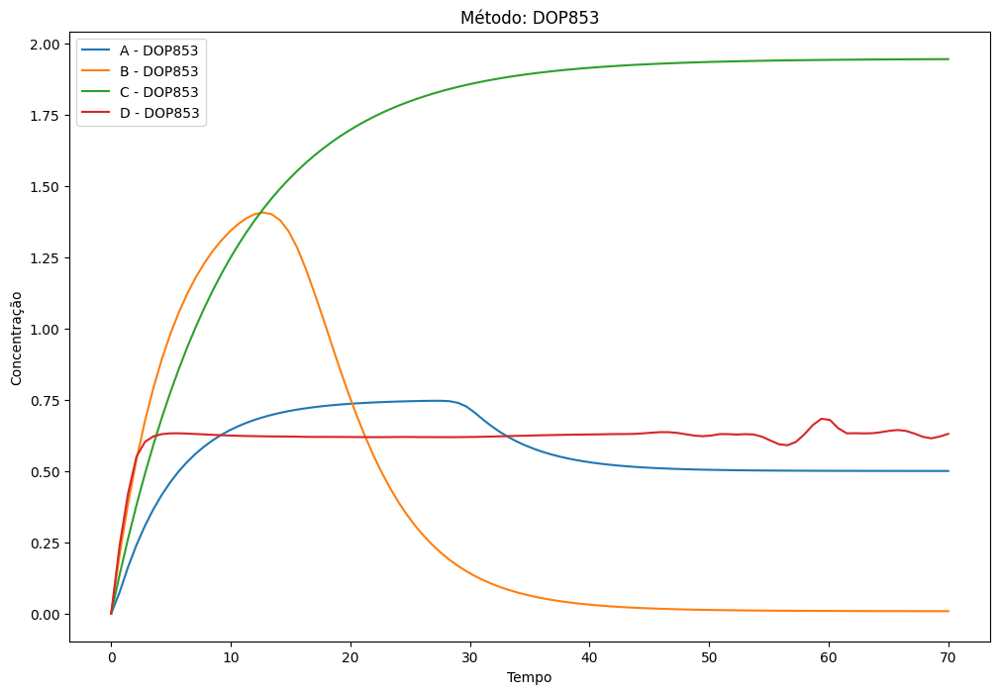

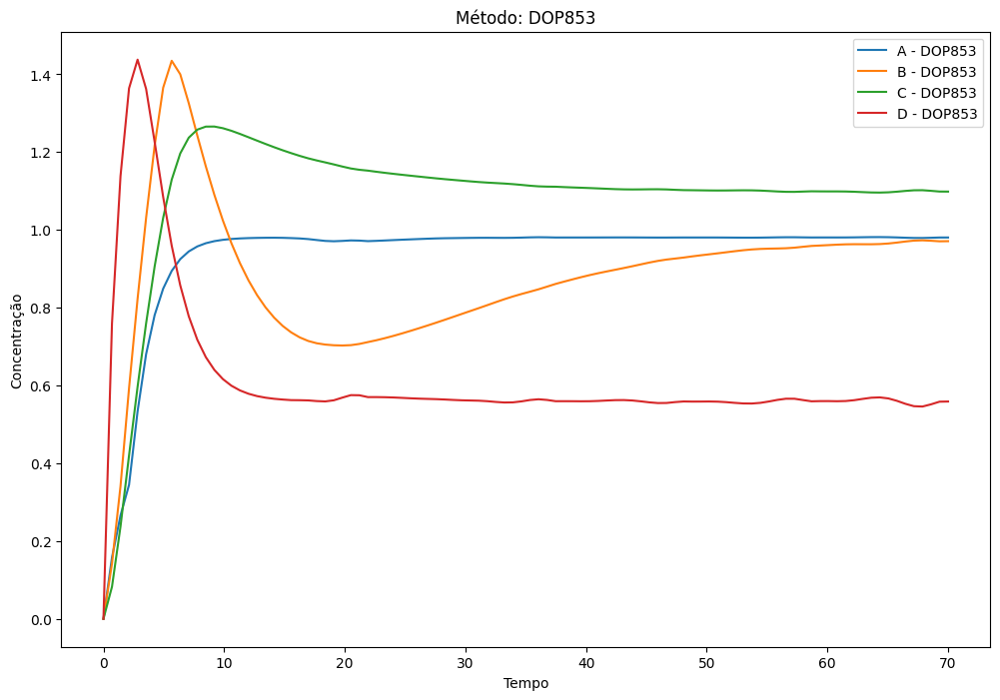

Sigma increased due to no improvement. New sigma: 1.004733208608598764, 'min': 3.8150599998062944, 'max': 3.8325103611381963}}}


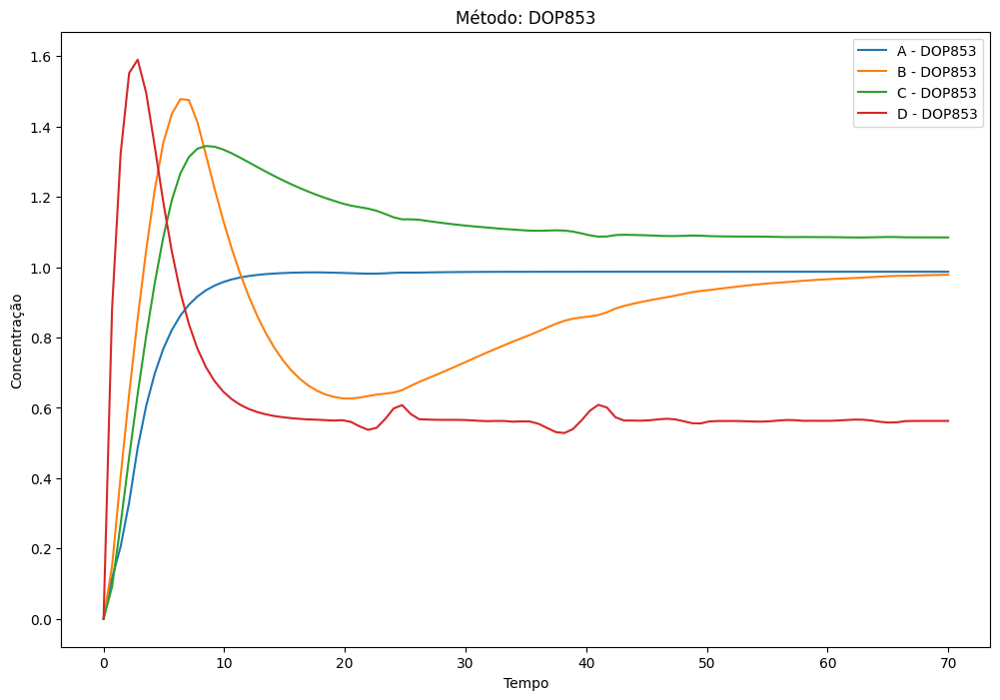

Sigma increased due to no improvement. New sigma: 4.713866682602718, 'min': 4.390883855495044, 'max': 13.320733243491546}}1}
Sigma increased due to no improvement. New sigma: 12.504162323665316, 'min': 7.4847853599455805, 'max': 19.76623907720856}}}
Sigma increased due to no improvement. New sigma: 12.48686286354281617, 'min': 7.769644476945311, 'max': 22.31954113765008}2}
Sigma increased due to no improvement. New sigma: 12.2612389468096237, 'min': 8.531946863103594, 'max': 19.261963252212695}}
Sigma increased due to no improvement. New sigma: 8.82801372012388391, 'min': 5.704694954175532, 'max': 7.33828339676577}}}}
Sigma increased due to no improvement. New sigma: 9.789020320082013847, 'min': 4.9818553415743105, 'max': 17.486972299391116}
Sigma increased due to no improvement. New sigma: 8.174669561401598347, 'min': 7.46298675020251, 'max': 16.499792774827302}}}
Sigma increased due to no improvement. New sigma: 7.46794498616981836, 'min': 6.400903327481635, 'max': 15.915427453471573

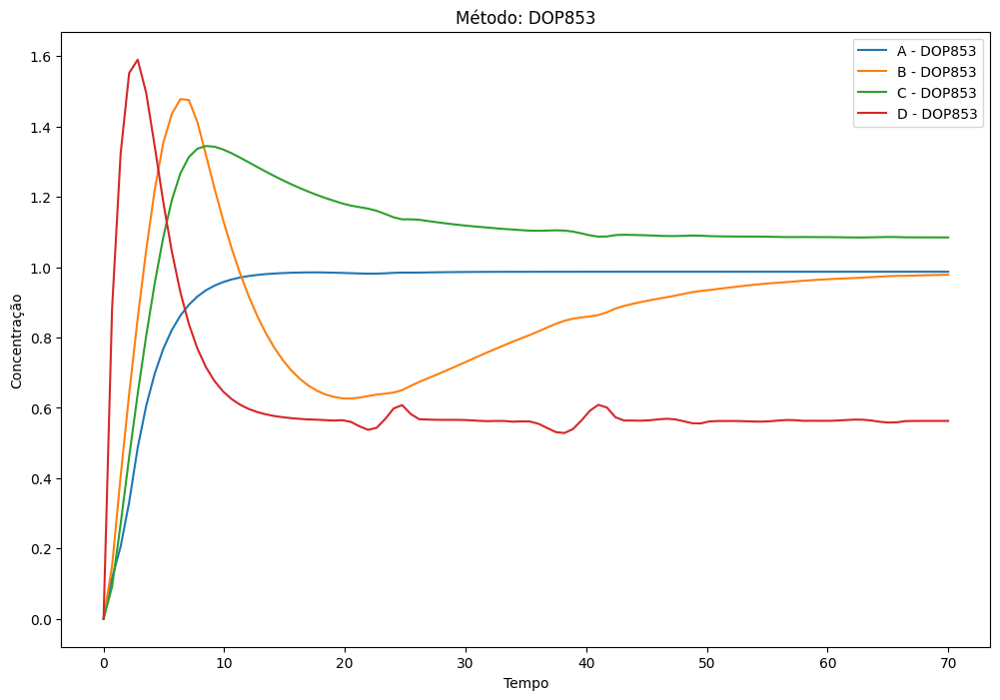

Sigma increased due to no improvement. New sigma: 15.659281665683428, 'min': 4.687821827846534, 'max': 17.073335848374334}}}
Sigma increased due to no improvement. New sigma: 154.131236591914962, 'min': 5.440889988278704, 'max': 17.109078274761778}}}
Sigma increased due to no improvement. New sigma: 159985111986142694, 'min': 5.662900512503475, 'max': 14.674032110617222}}}}
Sigma increased due to no improvement. New sigma: 12.9959456010801243, 'min': 4.309893535974012, 'max': 12.808993798454752}}}
Sigma increased due to no improvement. New sigma: 15.825178136339973, 'min': 5.101354974152747, 'max': 13.23480110604667}}}4}
Sigma increased due to no improvement. New sigma: 15.782445401011736, 'min': 4.337697715731104, 'max': 16.999539296943137}}}}
Sigma increased due to no improvement. New sigma: 15.403316477077854, 'min': 4.4851189810159635, 'max': 17.04839401628564}}}


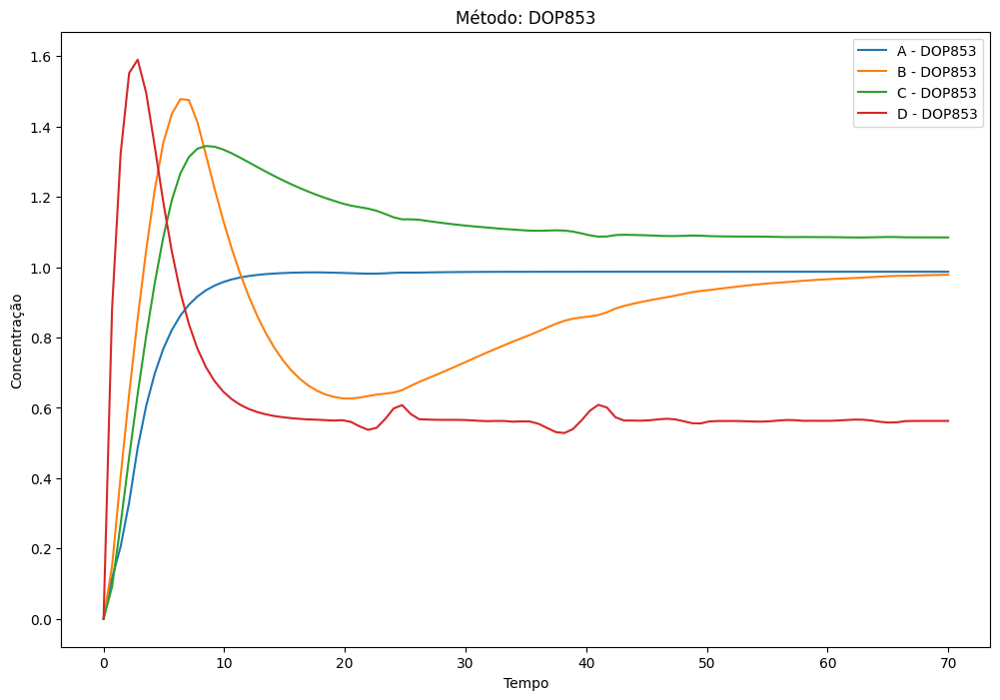

Sigma increased due to no improvement. New sigma: 15.4544685535135695, 'min': 4.822036878528671, 'max': 14.293648542750006}7}
Sigma increased due to no improvement. New sigma: 15.3991272783154747, 'min': 4.266730230460023, 'max': 9.656445827229522}}}
Sigma increased due to no improvement. New sigma: 15673083189875927, 'min': 4.224977323188691, 'max': 10.228497717665563}}}}}


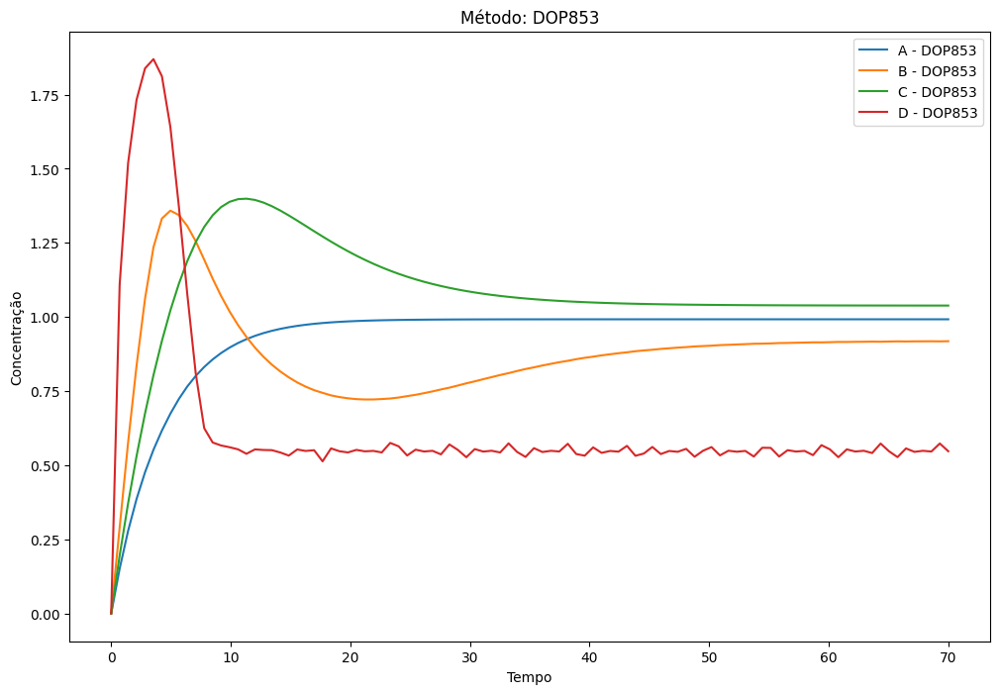

Sigma increased due to no improvement. New sigma: 1 0.005857470542995449, 'min': 3.4540061328578515, 'max': 3.4714175879994724}}
Sigma increased due to no improvement. New sigma: 1 0.003992310554163646, 'min': 3.4305823878534007, 'max': 3.4424437431608994}}
Sigma increased due to no improvement. New sigma: 1.99191213005859917864, 'min': 3.4330290789858067, 'max': 3.451531414974025}}}


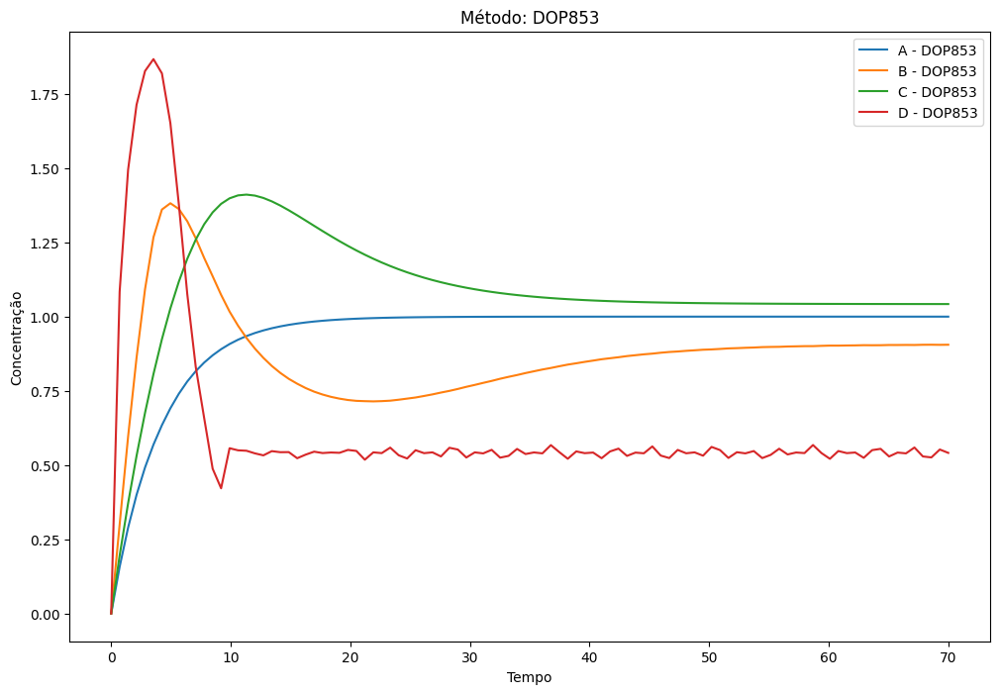

Sigma increased due to no improvement. New sigma: 4.45109822669924638995, 'min': 3.430935480907881, 'max': 3.444056972930597}13}
Force-stopping DOP853 for seed 1, error SQUARED due to timeout.665659752, 'min': 3.3777250427680707, 'max': 3.420936148042011}}
Skipping already processed: seed=1, error=SQUARED, method=LSODA
Skipping already processed: seed=1, error=MSE, method=RK45
Skipping already processed: seed=1, error=MSE, method=DOP853
Skipping already processed: seed=1, error=MSE, method=LSODA
Skipping already processed: seed=1, error=MABS, method=RK45
Skipping already processed: seed=1, error=MABS, method=DOP853
Skipping already processed: seed=1, error=MABS, method=LSODA
Skipping already processed: seed=2, error=ABS, method=RK45
Solver: DOP853, Error: ABS
Timeout reached for DOP853 on seed 1, error SQUARED0.014435851151527132, 'min': 3.3774724650847614, 'max': 3.421124102084936}


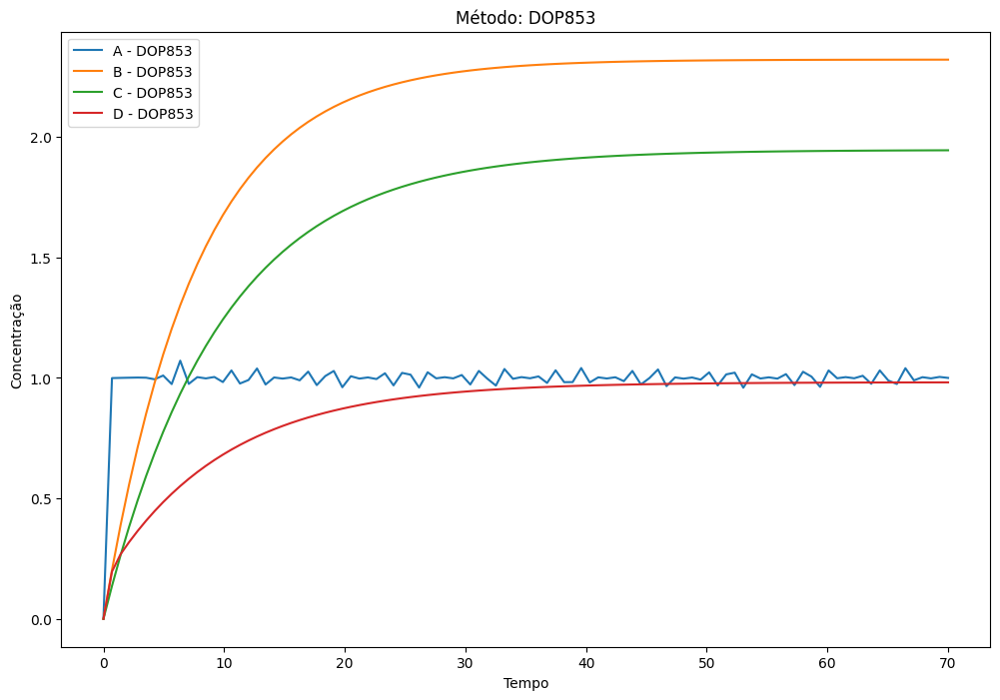

Sigma increased due to no improvement. New sigma: 1.428684637445896, 'min': 58.81695057188848, 'max': 95.61171087568441}}7}}
Sigma increased due to no improvement. New sigma: 1.4769103559661856 'min': 52.927334326389534, 'max': 115.89964099600799}}}
Sigma increased due to no improvement. New sigma: 5.1897290204103352, 'min': 74.39801162039743, 'max': 300.3069453202792}}}}
Sigma increased due to no improvement. New sigma: 6.1348350353794857, 'min': 85.68204774259303, 'max': 346.3016832229647}2}}
Sigma increased due to no improvement. New sigma: 5.840151693207635, 'min': 61.876660875890224, 'max': 298.2913339681719}}}}
Sigma increased due to no improvement. New sigma: 5.9012369028334035, 'min': 59.58906217600319, 'max': 128.82728174928158}}}


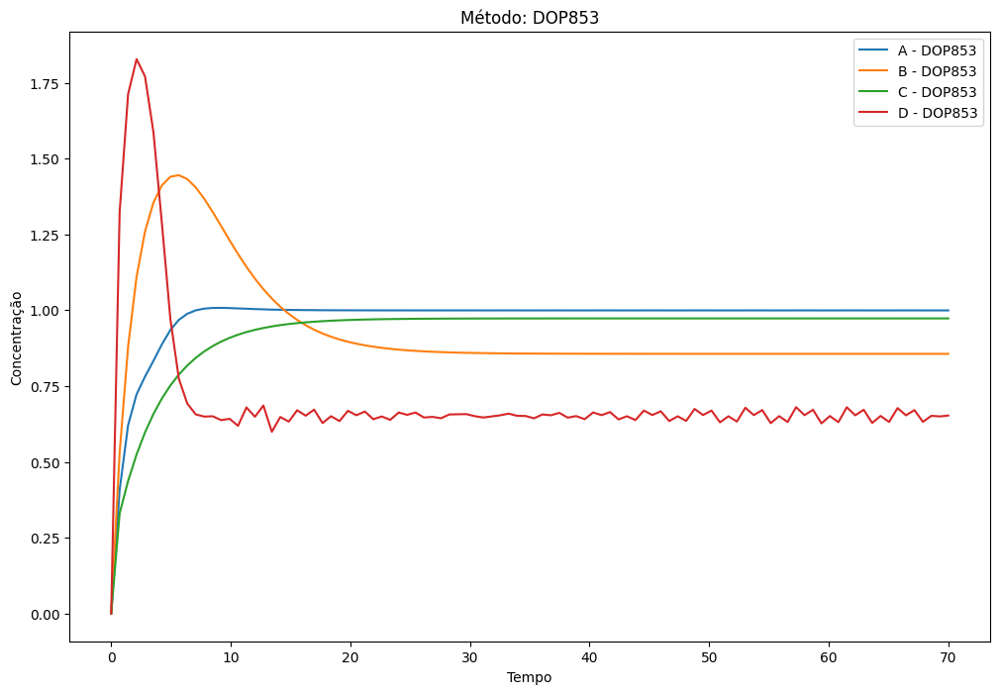

Sigma increased due to no improvement. New sigma: 8.3212065570959732, 'min': 60.305296677002545, 'max': 99.57045390679512}}
Sigma increased due to no improvement. New sigma: 5.0695194150997671, 'min': 54.517549023492506, 'max': 75.9176090641147}}}
Sigma increased due to no improvement. New sigma: 6.635965402638725, 'min': 57.442710945541684, 'max': 67.84158715101346}}}}
Sigma increased due to no improvement. New sigma: 10.20948597291814758, 'min': 42.36626906915226, 'max': 43.0626433992215}4}}


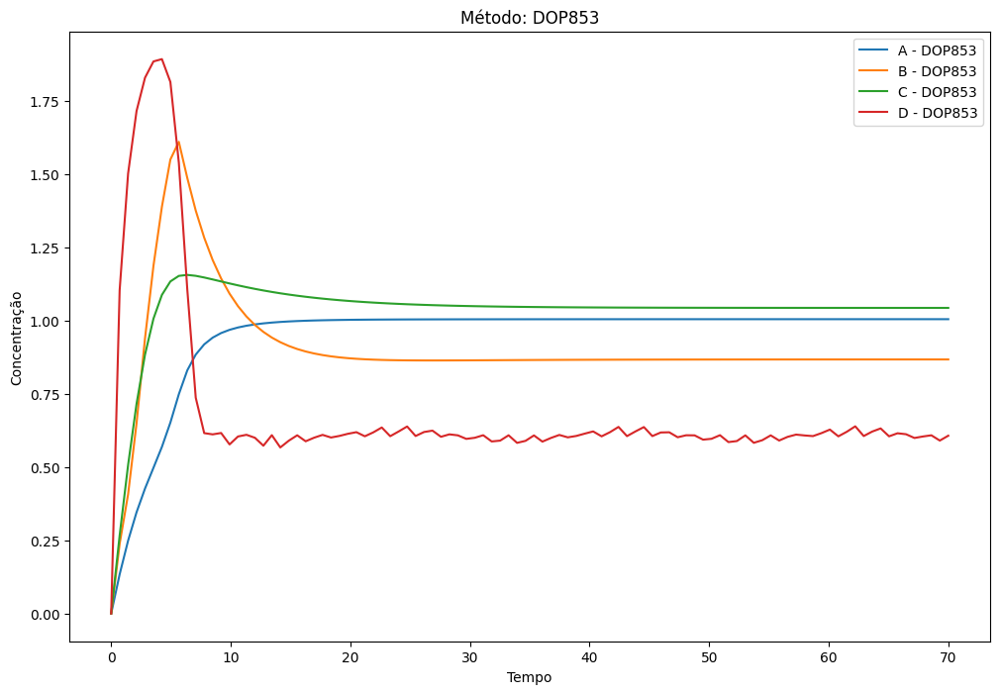

Sigma increased due to no improvement. New sigma: 2.50195323079248324, 'min': 42.60039709024191, 'max': 44.24700279335104}}
Sigma increased due to no improvement. New sigma: 5.088196166266046553, 'min': 43.97005551949111, 'max': 117.70885910042783}}
Sigma increased due to no improvement. New sigma: 9.904284344527229363, 'min': 47.8063641652096, 'max': 88.5756354601683}}}}
Sigma increased due to no improvement. New sigma: 10.518481617592944, 'min': 54.71146602455495, 'max': 75.32381408926636}5}}
Sigma increased due to no improvement. New sigma: 12.8865825695266842, 'min': 51.37331139912941, 'max': 71.34662534934529}}}
Sigma increased due to no improvement. New sigma: 156.574264498105816, 'min': 51.6278852207941, 'max': 150.28448455854553}}}}
Sigma increased due to no improvement. New sigma: 15114.60294727825236, 'min': 45.280700160770095, 'max': 380.39733079296406}
Sigma increased due to no improvement. New sigma: 15.507271057006946, 'min': 54.38450668855697, 'max': 149.05155042918184}}

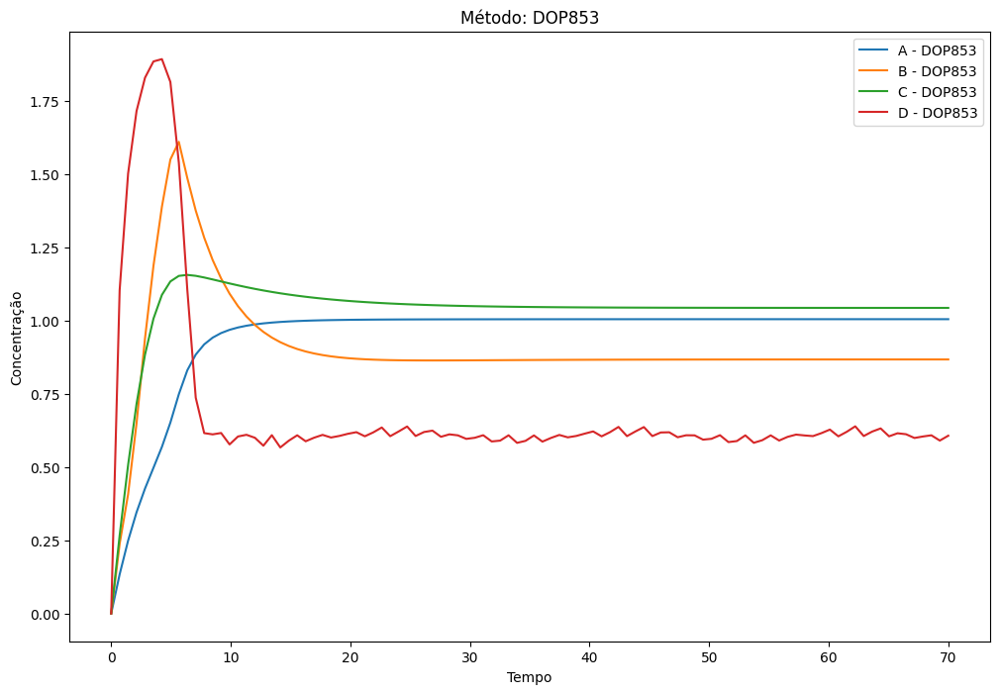

Sigma increased due to no improvement. New sigma: 15.730473362001791, 'min': 50.81284437629614, 'max': 66.03086487029327}3}}}
Sigma increased due to no improvement. New sigma: 15.467988239359697, 'min': 54.83337283373162, 'max': 63.52955869232578}42}
Sigma increased due to no improvement. New sigma: 155.042828883743795, 'min': 51.577474020709595, 'max': 176.74976642765972}
Sigma increased due to no improvement. New sigma: 1.678653003142487123, 'min': 35.86712577487627, 'max': 36.114362765487606}6}


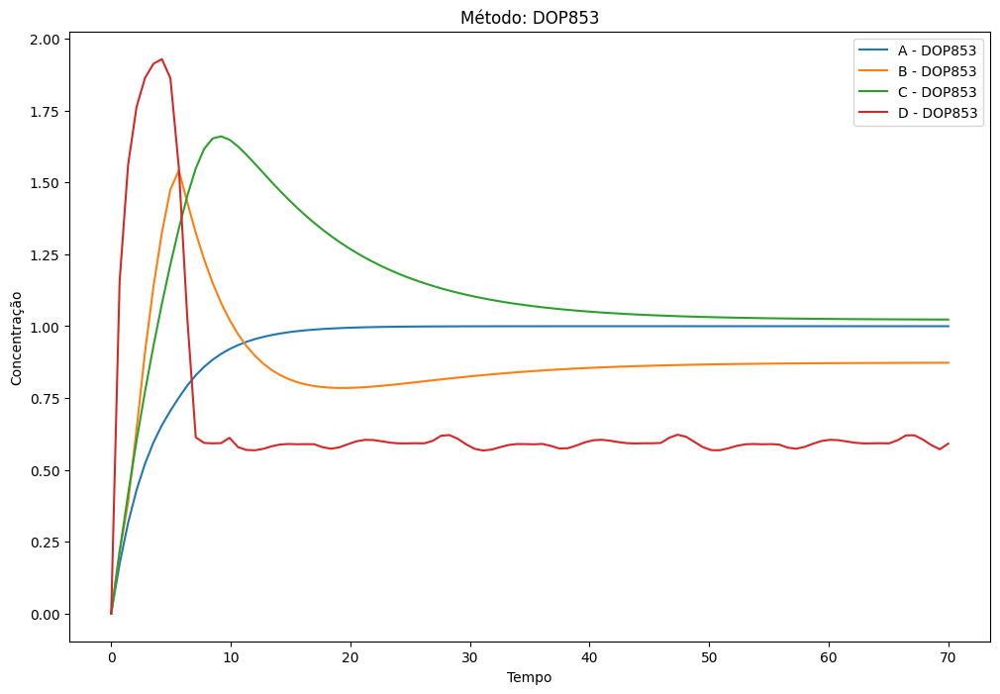

Force-stopping DOP853 for seed 2, error ABS due to timeout.569138569416, 'min': 35.3268580188123, 'max': 36.44313316205814}5}
Skipping already processed: seed=2, error=ABS, method=LSODA
Skipping already processed: seed=2, error=SQUARED, method=RK45
Solver: DOP853, Error: SQUARED
Timeout reached for DOP853 on seed 2, error ABSd': 0.250658129272673, 'min': 35.39131644554918, 'max': 36.33770336787146}


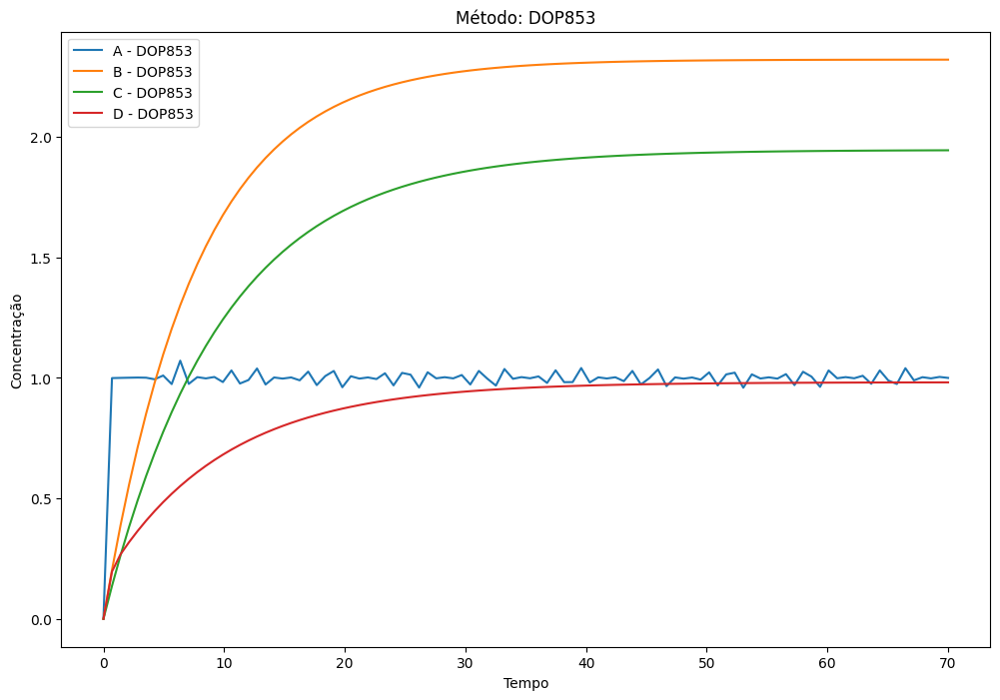

Sigma increased due to no improvement. New sigma: 10.13972009267423247, 'min': 4.050711283638022, 'max': 4.608439061210764}}
Sigma increased due to no improvement. New sigma: 2.7392271164373123, 'min': 4.764463400228373, 'max': 5.924989962953708}}}
Sigma increased due to no improvement. New sigma: 3.0968294375376617, 'min': 4.275754422402919, 'max': 12.805721107700316}}
Sigma increased due to no improvement. New sigma: 4.1998154493262047, 'min': 5.3151853947268926, 'max': 17.014548485613282}
Sigma increased due to no improvement. New sigma: 6.5820176557089344, 'min': 4.794902407809364, 'max': 26.105383250948513}}


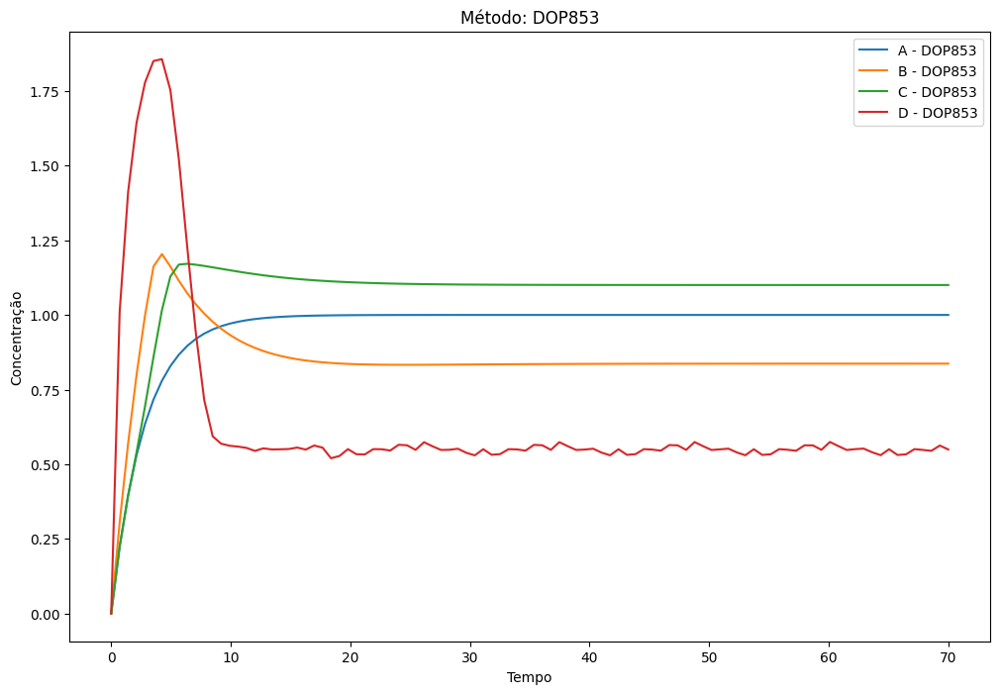

Sigma increased due to no improvement. New sigma: 9.6133074764287487, 'min': 5.090806335360641, 'max': 17.628843874975686}
Sigma increased due to no improvement. New sigma: 9.308875759575093 'min': 6.288142707421537, 'max': 11.425615593092825}8}1}
Sigma increased due to no improvement. New sigma: 13.032866613065291, 'min': 5.127228338366694, 'max': 7.531013276410363}}}
Sigma increased due to no improvement. New sigma: 9.8303301036909393, 'min': 4.295589036477019, 'max': 17.506809295431413}}}
Sigma increased due to no improvement. New sigma: 8.72399666719146, 'min': 4.193054884981316, 'max': 18.61978177371966}71}}


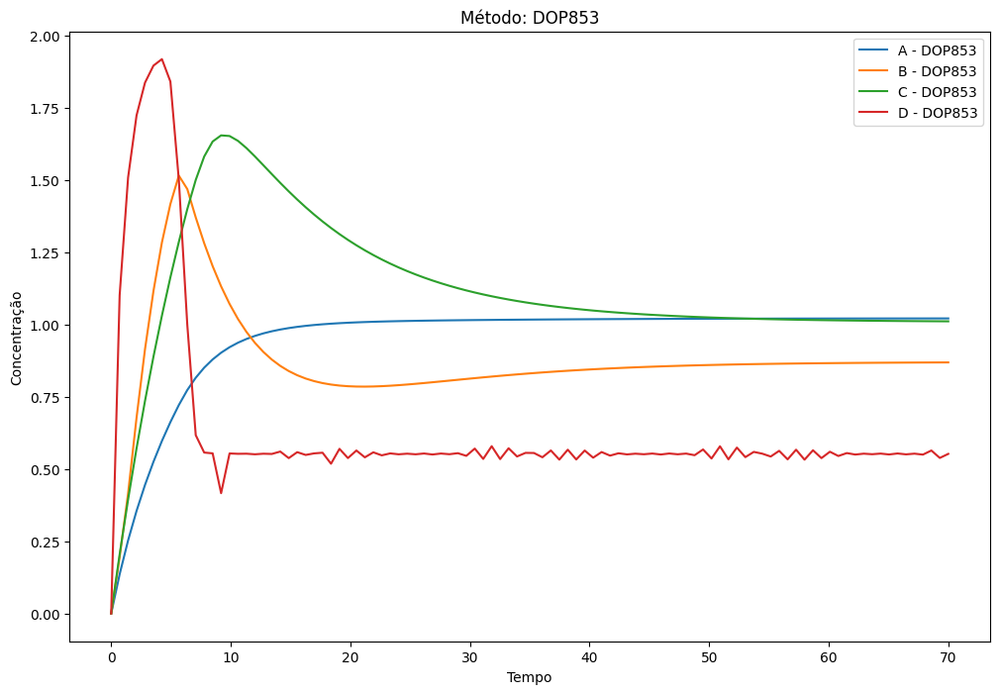

Sigma increased due to no improvement. New sigma: 1 0.004798572116401431, 'min': 3.306309900000868, 'max': 3.3224440084532794}}}
Sigma increased due to no improvement. New sigma: 2.7187847355839825341, 'min': 3.3074034402866395, 'max': 3.3607435355685897}}
Sigma increased due to no improvement. New sigma: 3.58219572652306048, 'min': 3.3260737363985315, 'max': 3.4761740921224975}5}}
Sigma increased due to no improvement. New sigma: 6.4312178338042979498, 'min': 3.309338382771474, 'max': 3.6337596552306173}}
Sigma increased due to no improvement. New sigma: 8.7973816911405337629, 'min': 3.4364039451607855, 'max': 3.8413640264566027}
Sigma increased due to no improvement. New sigma: 150.5544438136952692, 'min': 3.469249971476705, 'max': 5.132272714729811}}}
Sigma increased due to no improvement. New sigma: 15.4279048541673545, 'min': 4.364779664572483, 'max': 20.573397542872044}}}


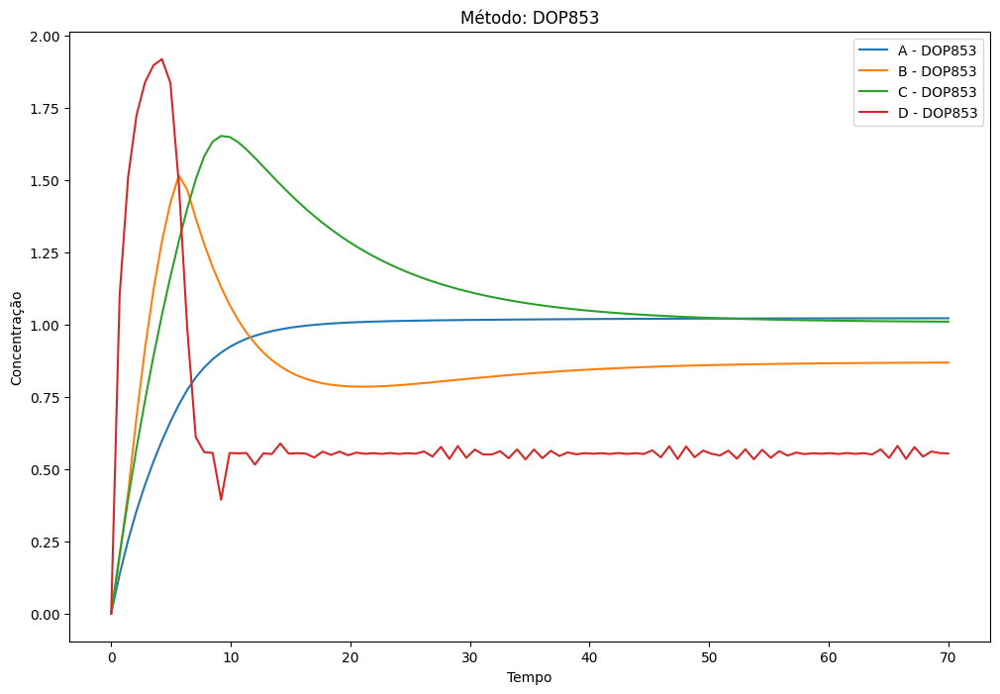

Sigma increased due to no improvement. New sigma: 150.6098800900206318, 'min': 3.455278203718748, 'max': 5.917828500818345}4}
Sigma increased due to no improvement. New sigma: 150.2143753256492117, 'min': 3.4628277943476795, 'max': 4.300157570007079}}
Sigma increased due to no improvement. New sigma: 14.9277716511616795, 'min': 3.319347223086243, 'max': 3.6413512786675257}83}
Sigma increased due to no improvement. New sigma: 15.033325917400565334, 'min': 3.39740742365648, 'max': 3.510108529506776}61}
Sigma increased due to no improvement. New sigma: 150.06409293803264993, 'min': 3.3499391607536984, 'max': 3.5655003152556275}
Sigma increased due to no improvement. New sigma: 15.035744839414954696, 'min': 3.368875976656304, 'max': 3.5274222480682145}}
Sigma increased due to no improvement. New sigma: 14.8106402835974035488, 'min': 3.3754690293211844, 'max': 3.4485300168557926}


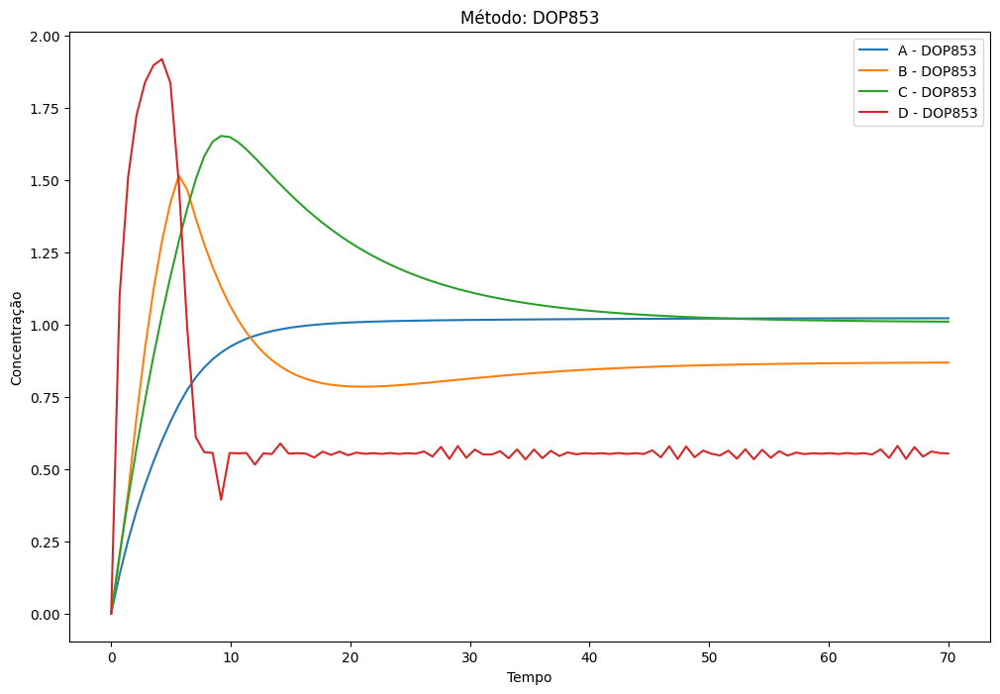

Sigma increased due to no improvement. New sigma: 8.9138474133762330898, 'min': 3.361802564424243, 'max': 3.4171588288770285}}}
Sigma increased due to no improvement. New sigma: 7.042399598956495895, 'min': 3.350851968672559, 'max': 3.3917756022336945}}}}
Force-stopping DOP853 for seed 2, error SQUARED due to timeout.990618, 'min': 3.401313747211136, 'max': 7.118160547160305}64}
Skipping already processed: seed=2, error=SQUARED, method=LSODA
Skipping already processed: seed=2, error=MSE, method=RK45
Skipping already processed: seed=2, error=MSE, method=DOP853
Skipping already processed: seed=2, error=MSE, method=LSODA
Skipping already processed: seed=2, error=MABS, method=RK45
Solver: DOP853, Error: MABS
Timeout reached for DOP853 on seed 2, error SQUARED1.9654008269529466, 'min': 3.386011787140841, 'max': 9.700725026576055}


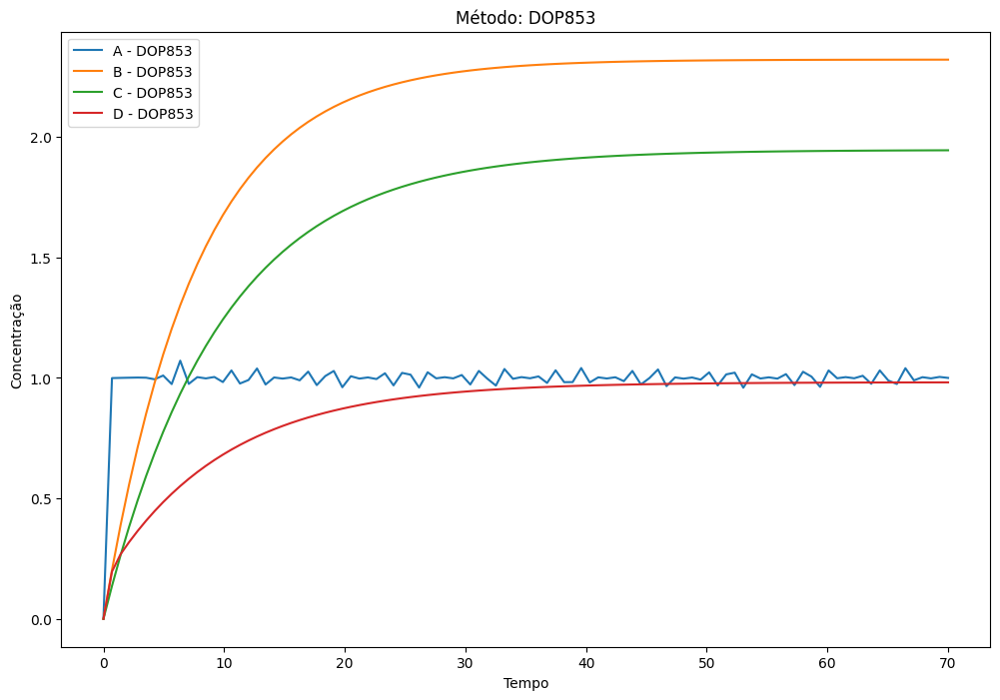

Sigma increased due to no improvement. New sigma: 10.023571711593614732, 'min': 0.1470423764297213, 'max': 0.2390292771892111}}3}
Sigma increased due to no improvement. New sigma: 1.476910355966185671, 'min': 0.1323183358159738, 'max': 0.2897491024900198}2}}}
Sigma increased due to no improvement. New sigma: 5.189729020410335098, 'min': 0.1859950290509936, 'max': 0.750767363300698}1}27}
Sigma increased due to no improvement. New sigma: 6.134835035379485074, 'min': 0.21420511935648257, 'max': 0.865754208057412}25}
Sigma increased due to no improvement. New sigma: 5.84015169320763544, 'min': 0.15469165218972555, 'max': 0.7457283349204294}4}5}
Sigma increased due to no improvement. New sigma: 5.9012369028334035876, 'min': 0.14897265544000804, 'max': 0.32206820437320394}


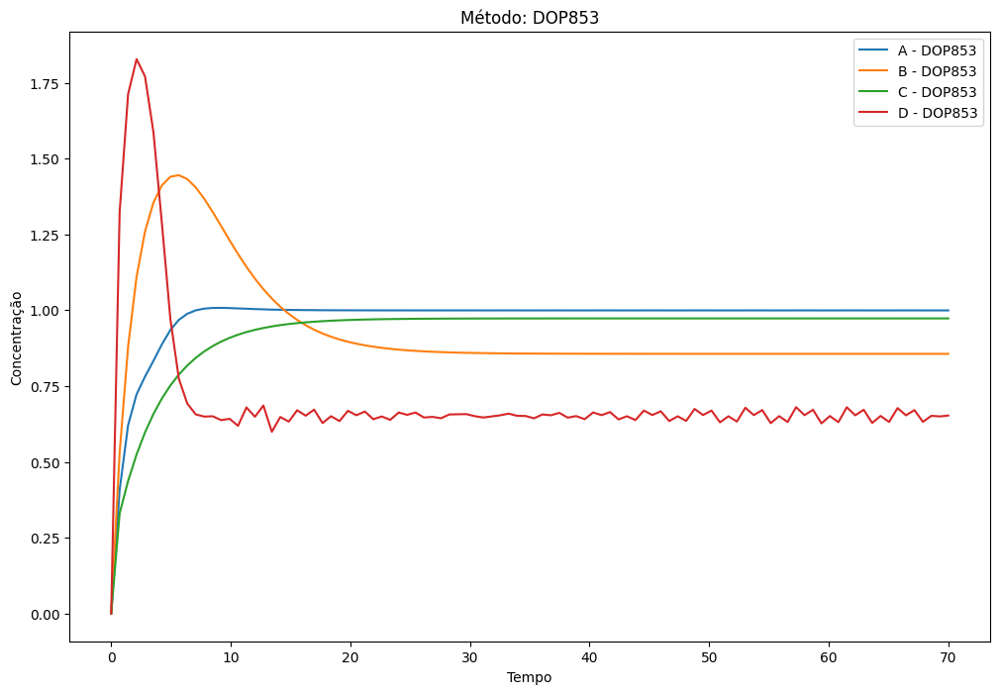

Sigma increased due to no improvement. New sigma: 8.3212065570959728086, 'min': 0.1507632416925064, 'max': 0.248926134766988}87}}
Sigma increased due to no improvement. New sigma: 5.0695194150997678167, 'min': 0.1362938725587313, 'max': 0.1897940226602869}}}}
Sigma increased due to no improvement. New sigma: 6.63596540263872560136, 'min': 0.14360677736385427, 'max': 0.1696039678775336}}
Sigma increased due to no improvement. New sigma: 1 0.0006644978983950784, 'min': 0.10503309343566668, 'max': 0.10776344435856781}}
Sigma increased due to no improvement. New sigma: 1.718302427299227846727, 'min': 0.10628780338616388, 'max': 0.10855267367927691}


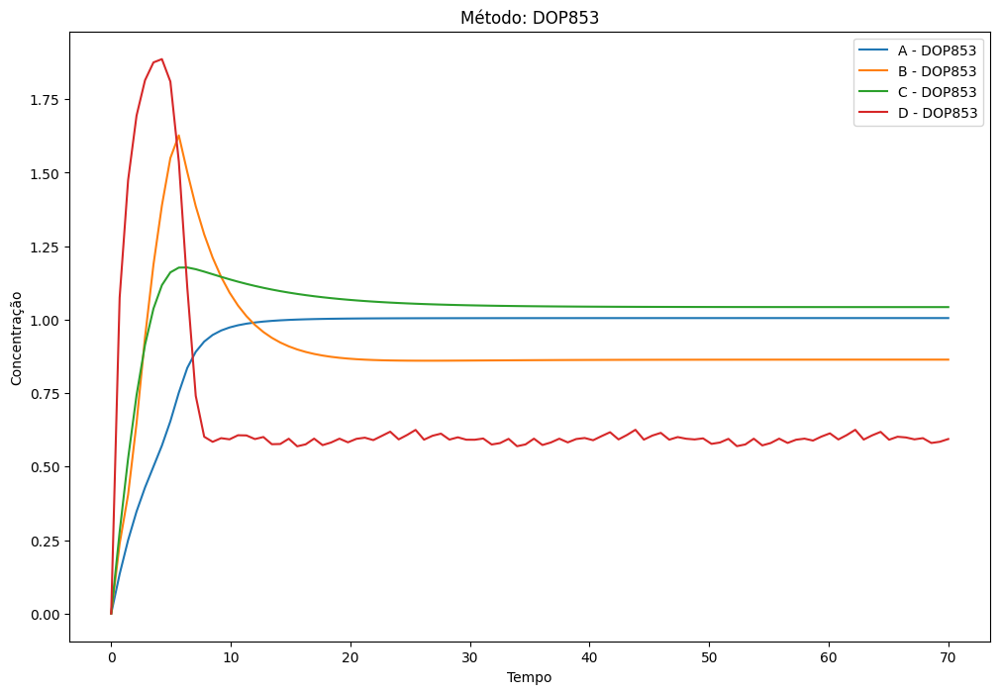

Sigma increased due to no improvement. New sigma: 3.4101411190640077070282, 'min': 0.1056855047736867, 'max': 0.11217704753745882}}
Sigma increased due to no improvement. New sigma: 7.34899805333870166829, 'min': 0.12115008506627875, 'max': 0.3184756015770244}}}}
Sigma increased due to no improvement. New sigma: 11.009313457420795546, 'min': 0.11892871611061412, 'max': 0.22252172176779253}7}
Sigma increased due to no improvement. New sigma: 10.53071323319818597069, 'min': 0.1313433225345795, 'max': 0.16529319650762325}}


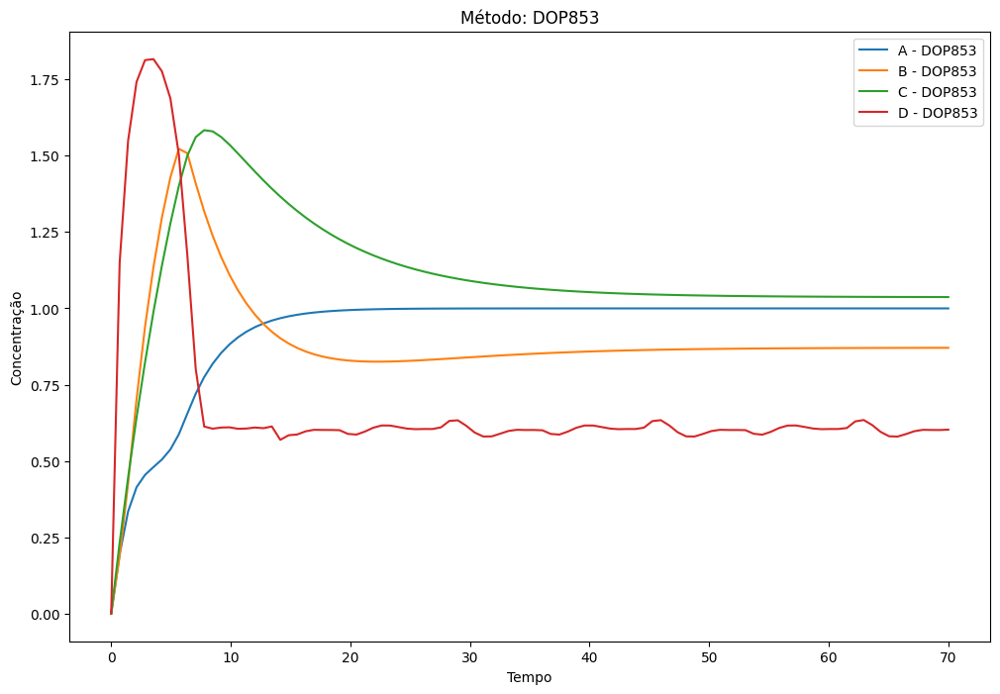

Sigma increased due to no improvement. New sigma: 1 0.000810099105403219, 'min': 0.09702955718692319, 'max': 0.09992623487043233}}}}
Sigma increased due to no improvement. New sigma: 1.101704755050280973659, 'min': 0.09550177040977666, 'max': 0.09770050390149787}8}
Force-stopping DOP853 for seed 2, error MABS due to timeout.167490150712587, 'min': 0.09487179624202303, 'max': 0.09660402904281148}
Skipping already processed: seed=2, error=MABS, method=LSODA
Skipping already processed: seed=3, error=ABS, method=RK45
Skipping already processed: seed=3, error=ABS, method=DOP853
Skipping already processed: seed=3, error=ABS, method=LSODA
Solver: RK45, Error: SQUARED


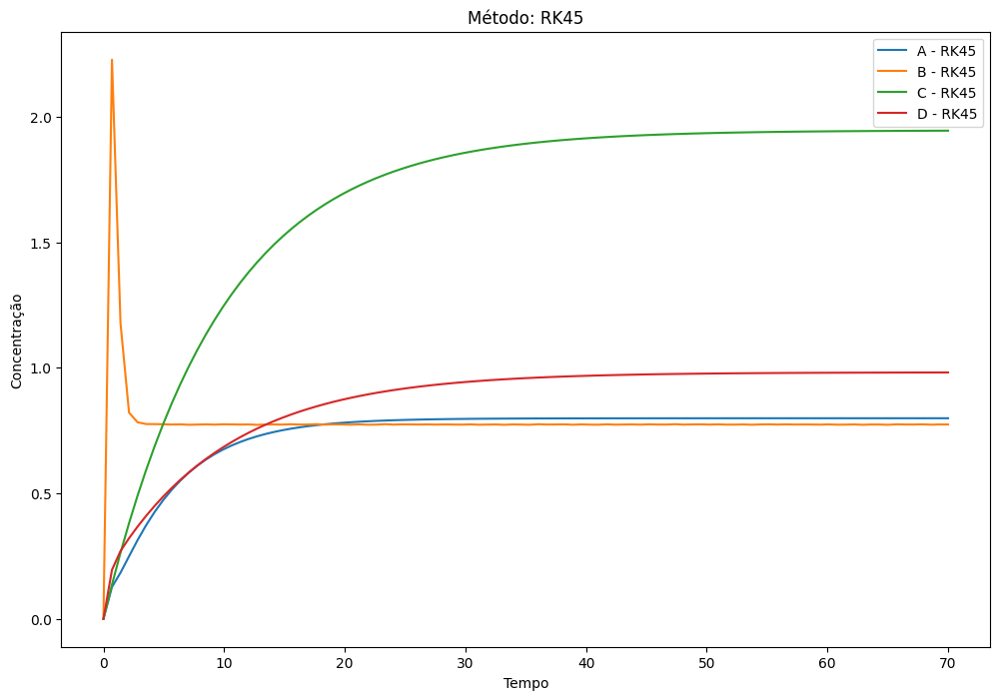

Timeout reached for DOP853 on seed 2, error MABStd': 0.0003479599811618035, 'min': 0.09529450824704874, 'max': 0.09663428235734262}
Sigma increased due to no improvement. New sigma: 1.040570711644568894, 'min': 4.580078531549831, 'max': 4.695379556971488}}
Sigma increased due to no improvement. New sigma: 2.6838691448536576in': 5.073579453154114, 'max': 17.2293696538937}9875}}}
Sigma increased due to no improvement. New sigma: 3.627962141710548, 'min': 8.067329638771714, 'max': 11.74681407734955}8}}
Sigma increased due to no improvement. New sigma: 9.4725007713302255, 'min': 9.088835344075925, 'max': 21.718461404860964}}


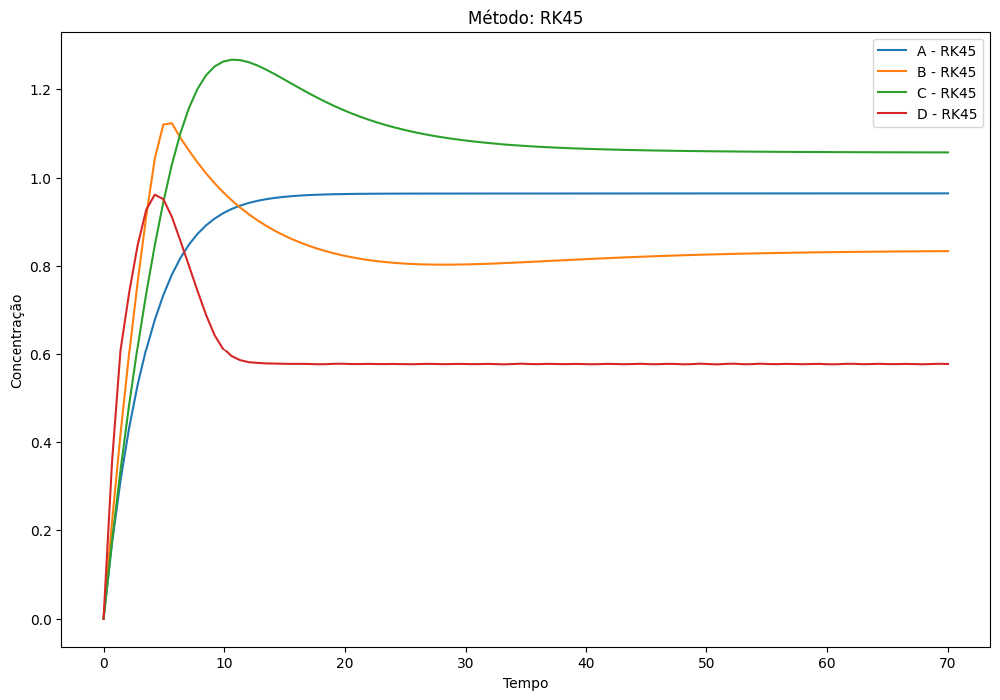

Sigma increased due to no improvement. New sigma: 8.29151037276974589, 'min': 9.52375264736897, 'max': 11.711389628004019}4}
Sigma increased due to no improvement. New sigma: 9.1692925310451162, 'min': 8.258828511864024, 'max': 12.862451075360362}}}
Sigma increased due to no improvement. New sigma: 10.5931095641014156, 'min': 8.750660752518643, 'max': 16.686183499742214}}
Sigma increased due to no improvement. New sigma: 9.3236913859725434, 'min': 7.960952504497652, 'max': 10.921459234370406}}}
Sigma increased due to no improvement. New sigma: 14.088907952045375, 'min': 7.997852495616115, 'max': 22.44319152634499}}}
Sigma increased due to no improvement. New sigma: 11.432310469241338, 'min': 5.534201696352934, 'max': 11.52460397614438}9}


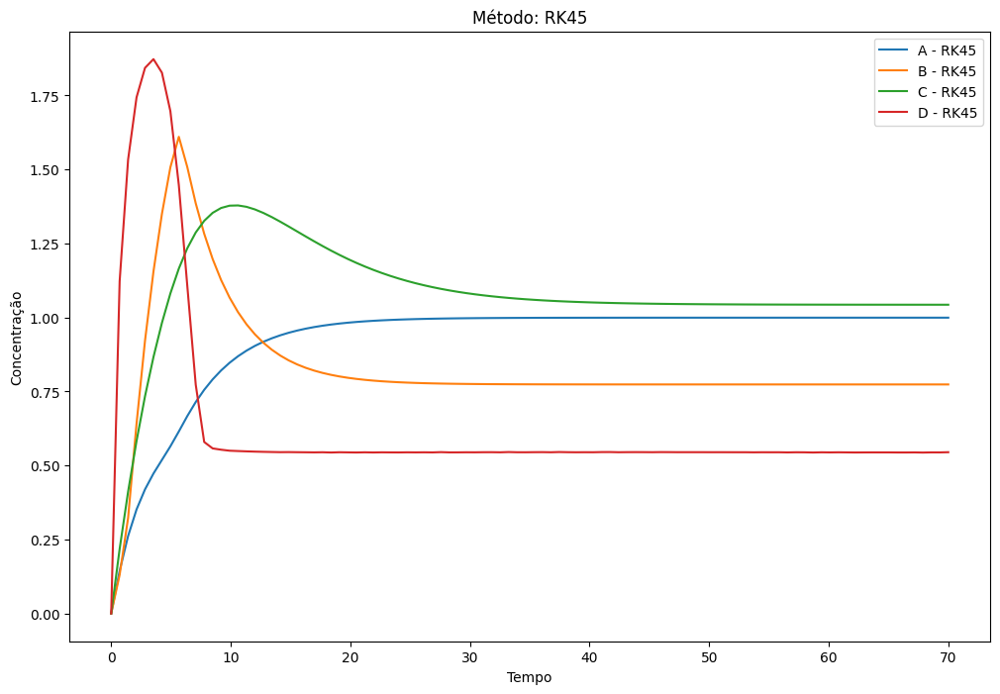

Sigma increased due to no improvement. New sigma: 10.0014187095724677253, 'min': 3.638749608207835, 'max': 3.6418467852633256}}}}


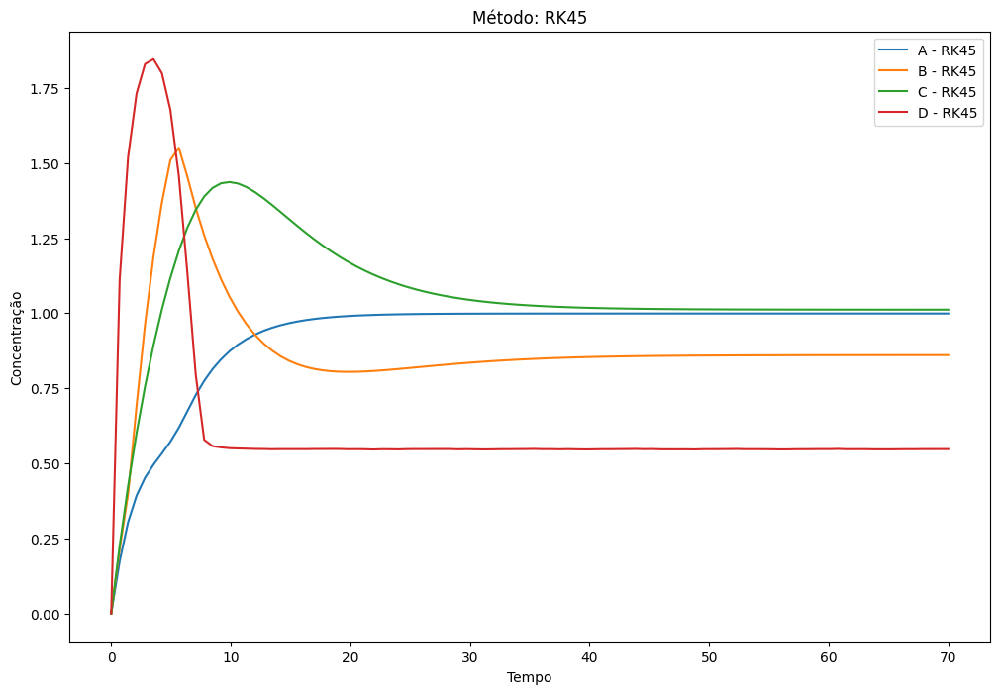

Sigma increased due to no improvement. New sigma: 1 0.0005211872654596237, 'min': 3.3654834400182, 'max': 3.3673127051221097}3}}
Sigma increased due to no improvement. New sigma: 1 0.0006221965356476509, 'min': 3.3448956175387874, 'max': 3.347314467418561}}}


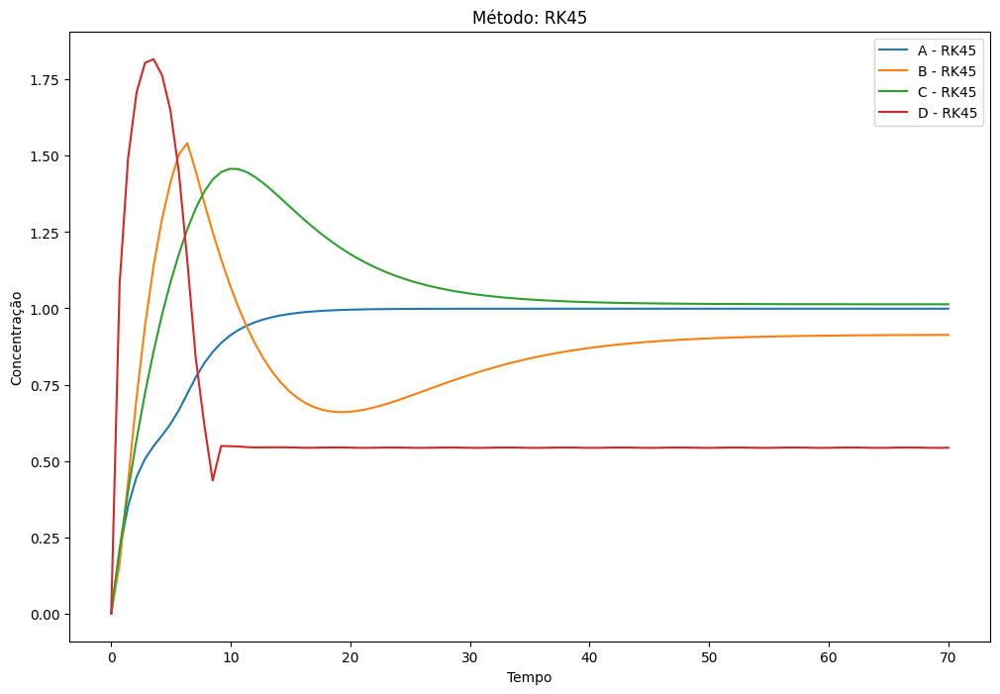

Sigma increased due to no improvement. New sigma: 1 0.0012772596172748371, 'min': 3.331757891735518, 'max': 3.3368421965935013}}
Sigma increased due to no improvement. New sigma: 1 0.00243591311136408, 'min': 3.312845835451926, 'max': 3.322633936658248}}}}}
Sigma increased due to no improvement. New sigma: 1.426308439973892364968, 'min': 3.3208495768358053, 'max': 3.323339860918979}}
Sigma increased due to no improvement. New sigma: 2.8734807069118534794, 'min': 3.3204474783225986, 'max': 3.342449552471375}}4}


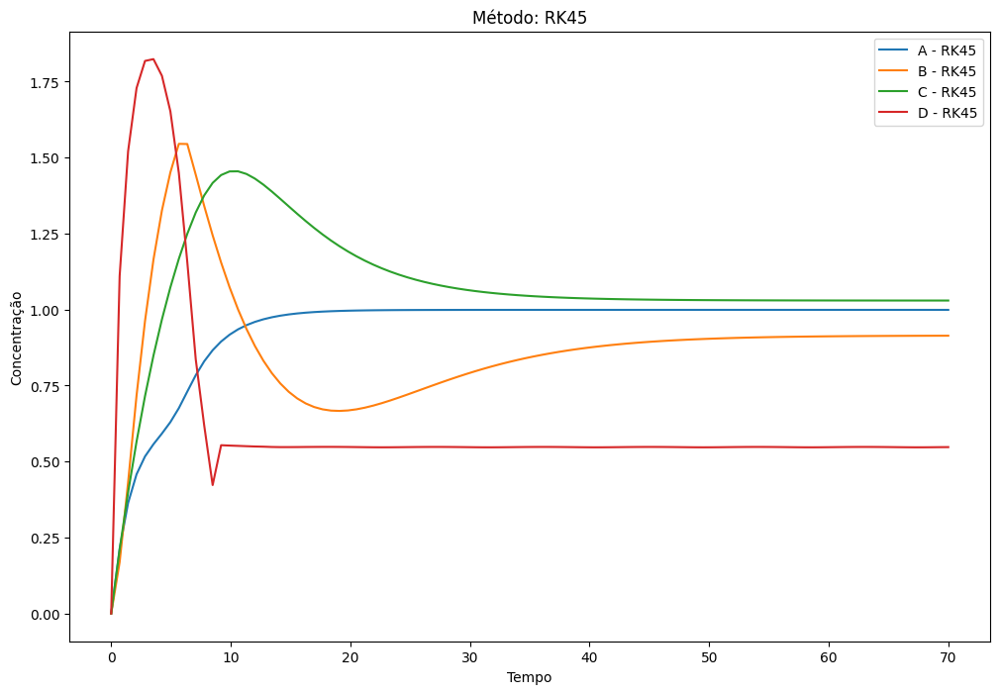

Sigma increased due to no improvement. New sigma: 1 0.00011288404342683995, 'min': 3.3071578664344417, 'max': 3.307510833242176}}
Sigma increased due to no improvement. New sigma: 18.916031514787879e-05, 'min': 3.3071668446094598, 'max': 3.3074926190794165}}}
Force-stopping RK45 for seed 3, error SQUARED due to timeout.23575223561, 'min': 3.307106123335455, 'max': 3.3075388714990237}}}}
Solver: DOP853, Error: SQUARED
Timeout reached for RK45 on seed 3, error SQUARED': 0.00010690820153112013, 'min': 3.307223707454349, 'max': 3.307573584052161}


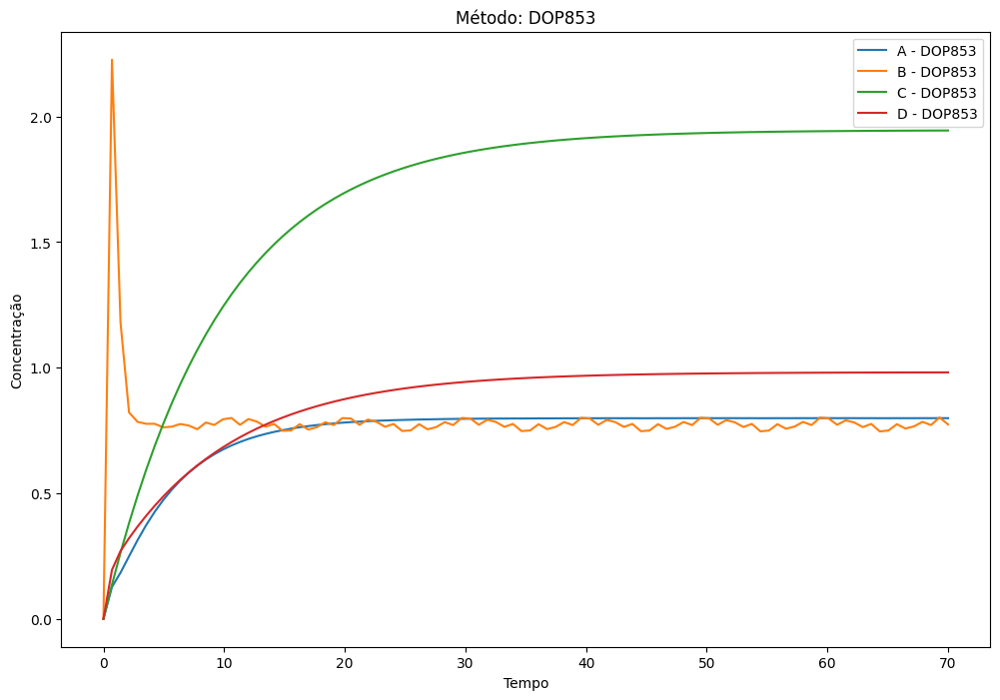

Sigma increased due to no improvement. New sigma: 1.6092083888599258, 'min': 5.3603335707725, 'max': 8.840811666945939}1}}}
Sigma increased due to no improvement. New sigma: 3.7119624173900396'min': 6.903070867597549, 'max': 21.0867895550145}86}}}}
Sigma increased due to no improvement. New sigma: 5.4451717838711255 'min': 6.553237226830332, 'max': 11.486071972080545}4}
Sigma increased due to no improvement. New sigma: 7.5682523330863934, 'min': 7.691271142827526, 'max': 22.31220472480786}6}}
Sigma increased due to no improvement. New sigma: 7.246023455478589, 'min': 5.408899810855284, 'max': 9.199932249456717}6}}
Sigma increased due to no improvement. New sigma: 7.4290873409169575, 'min': 4.874537598033152, 'max': 8.588005715501067}}}
Sigma increased due to no improvement. New sigma: 5.6262684474780205'min': 5.033008773005822, 'max': 8.465849340428436}91}}


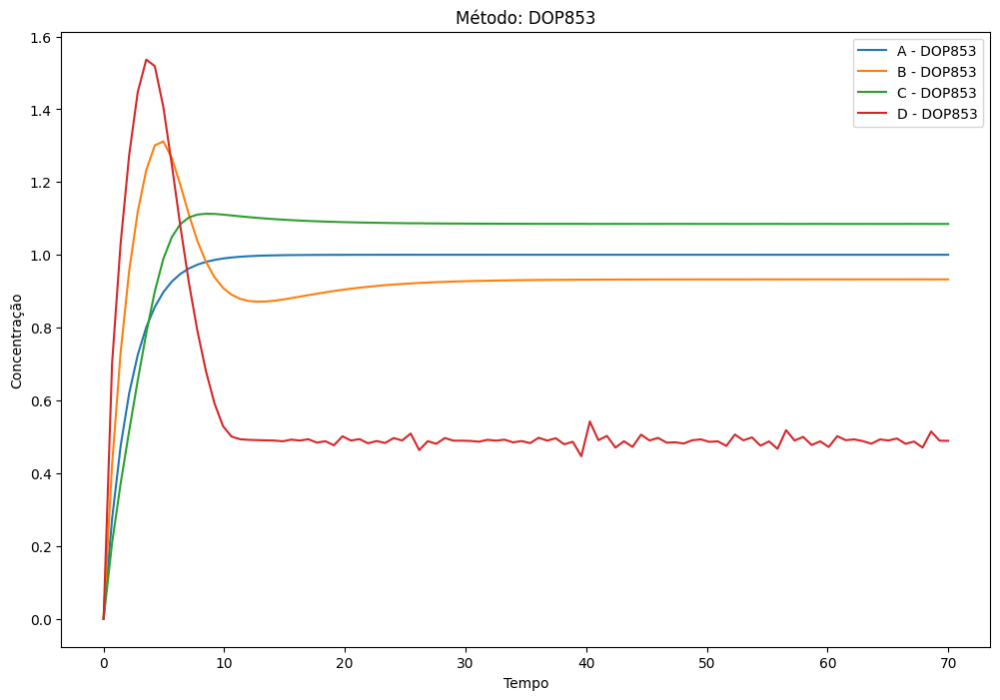

Sigma increased due to no improvement. New sigma: 7.0469528193512253, 'min': 4.542626688929479, 'max': 15.846437000248757}}
Sigma increased due to no improvement. New sigma: 9.0736636763816155, 'min': 4.356801874381121, 'max': 14.198255467251373}}
Sigma increased due to no improvement. New sigma: 15114452485814783, 'min': 6.648326598289769, 'max': 23.08821147372842}2}}
Sigma increased due to no improvement. New sigma: 153980551592856412, 'min': 6.751023166055565, 'max': 11.856422011408227}}
Sigma increased due to no improvement. New sigma: 12.2990563062727746, 'min': 5.613891857110382, 'max': 9.69131104607219}}}
Sigma increased due to no improvement. New sigma: 12.071871101623657, 'min': 7.436040671722977, 'max': 8.43696175465912}8}}
Sigma increased due to no improvement. New sigma: 15.497186796347764, 'min': 4.586953028573317, 'max': 19.017519812262897}}
Sigma increased due to no improvement. New sigma: 1598877822766305, 'min': 5.346138502094234, 'max': 8.976216843128137}}}}3}


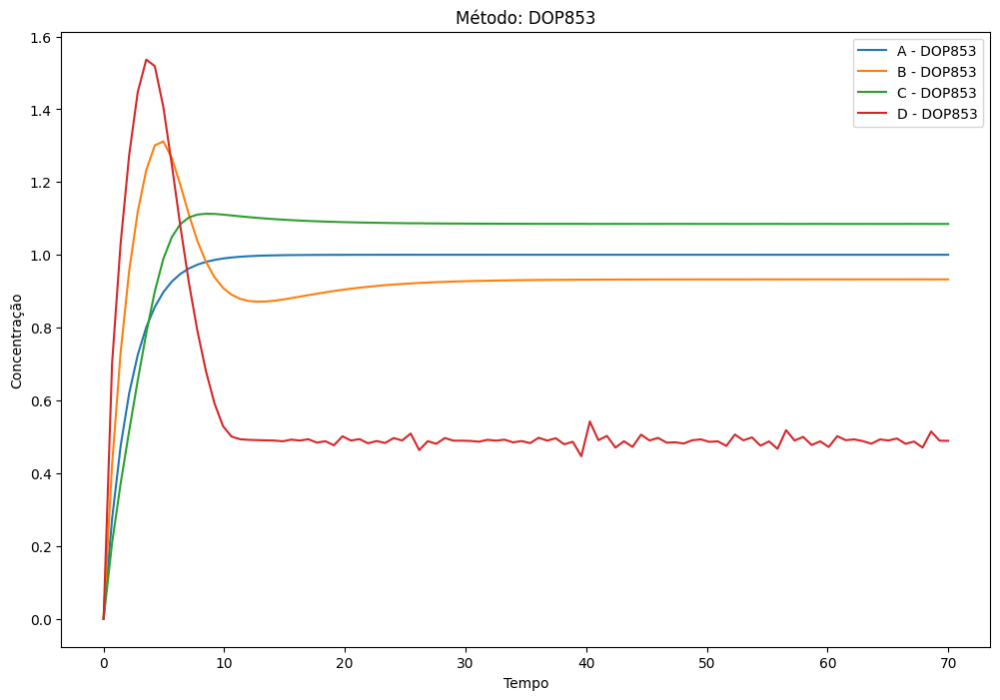

Sigma increased due to no improvement. New sigma: 15.1836300559708501, 'min': 5.869947940396026, 'max': 9.694854232400226}}}
Sigma increased due to no improvement. New sigma: 15.5808511648850694, 'min': 4.85293401764539, 'max': 9.348430684174089}47}}
Sigma increased due to no improvement. New sigma: 15.946111714985027, 'min': 5.1650217733781805, 'max': 21.488157618544815}}
Sigma increased due to no improvement. New sigma: 150.5075914421351564, 'min': 7.3629767439180975, 'max': 9.179570249716258}
Sigma increased due to no improvement. New sigma: 153.015155541750195, 'min': 4.656097306728865, 'max': 16.793840992078117}}
Sigma increased due to no improvement. New sigma: 15.2548575853873023, 'min': 4.965335624538894, 'max': 5.980093899720015}}}


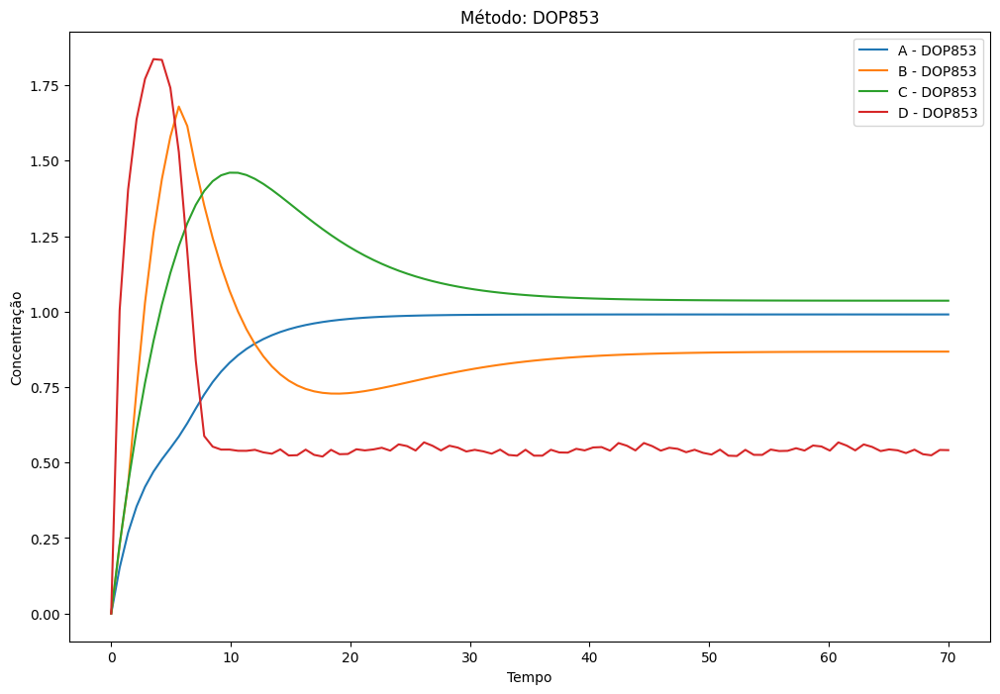

Sigma increased due to no improvement. New sigma: 10.001752230787367484, 'min': 3.4759950706564053, 'max': 3.4805124204467655}}}
Sigma increased due to no improvement. New sigma: 1.13457610459246437293, 'min': 3.462332741282889, 'max': 3.4848797719550695}}
Sigma increased due to no improvement. New sigma: 2.2855219251863237923, 'min': 3.469780921052801, 'max': 3.4901147799752605}}}}


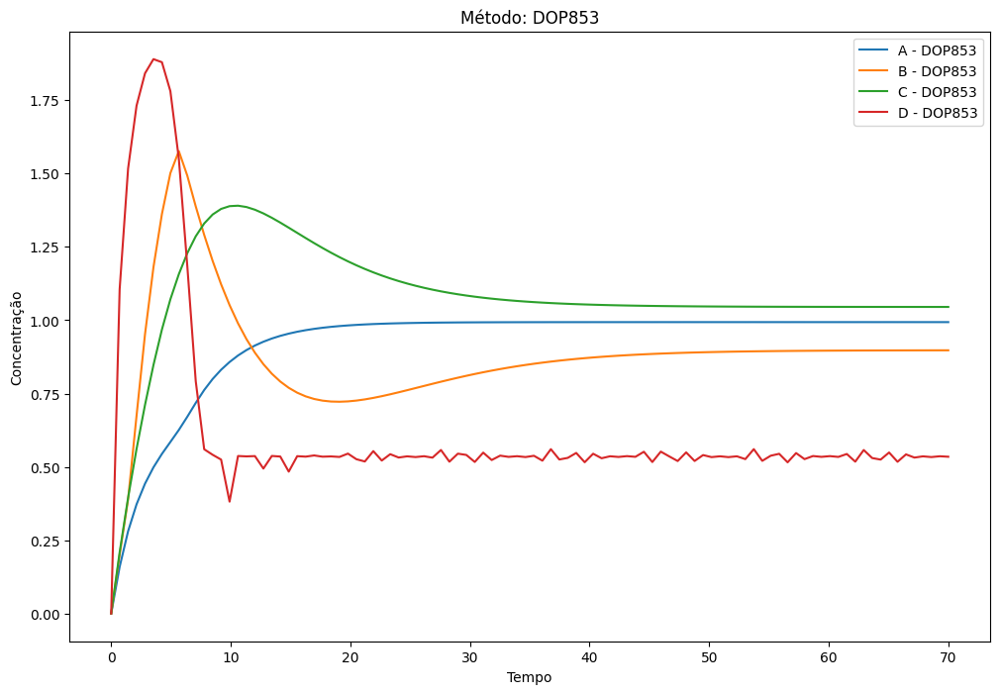

Sigma increased due to no improvement. New sigma: 1.41646501418106958373, 'min': 3.4250403990150367, 'max': 3.444734449901834}}}


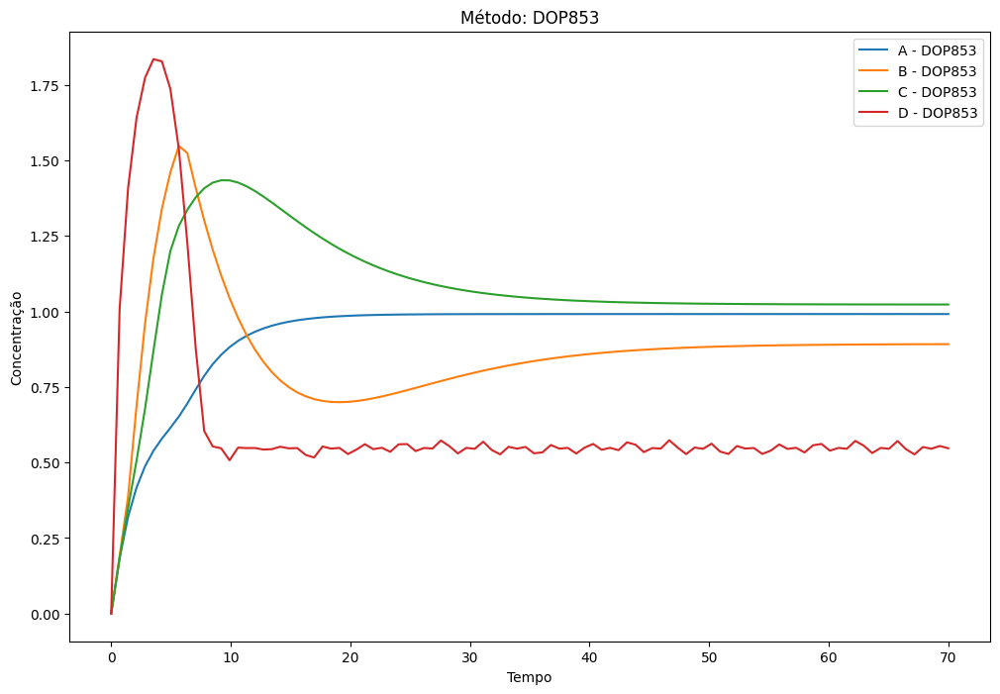

Sigma increased due to no improvement. New sigma: 1 0.004560608159417043, 'min': 3.4106057997588204, 'max': 3.421898960066246}4}
Timeout reached for DOP853 on seed 3, error SQUARED 0.0031760155140175073, 'min': 3.393922611508673, 'max': 3.406063857413025}}}
Skipping already processed: seed=3, error=SQUARED, method=LSODA
Solver: RK45, Error: MSE


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ivp\common.py:39: UserWarning: The following arguments have no effect for a chosen solver: `min_step`.
  warn("The following arguments have no effect for a chosen solver: {}."


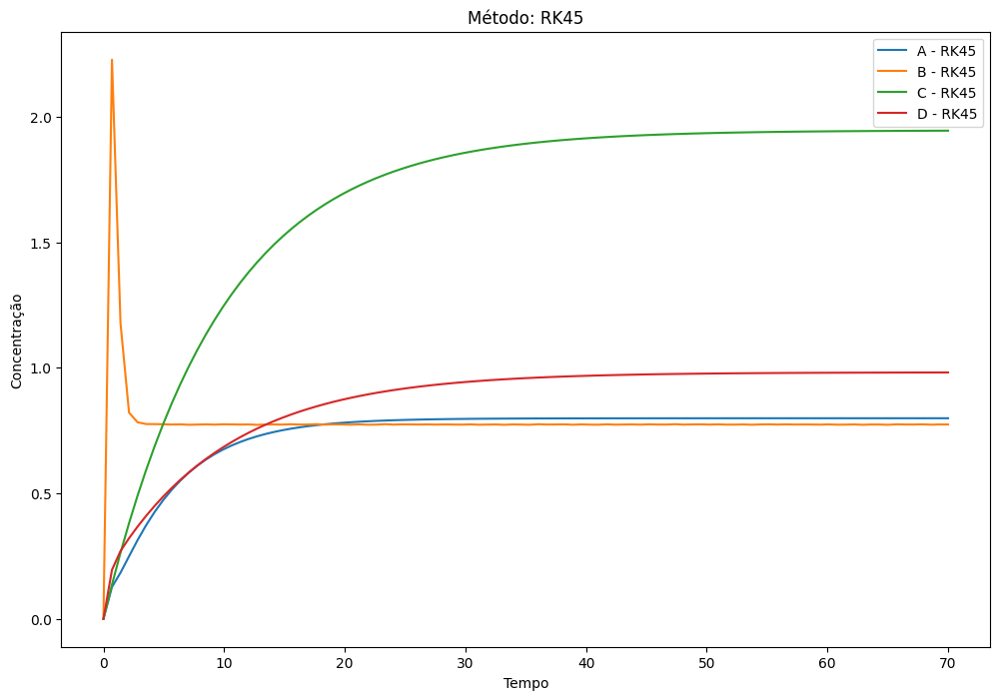

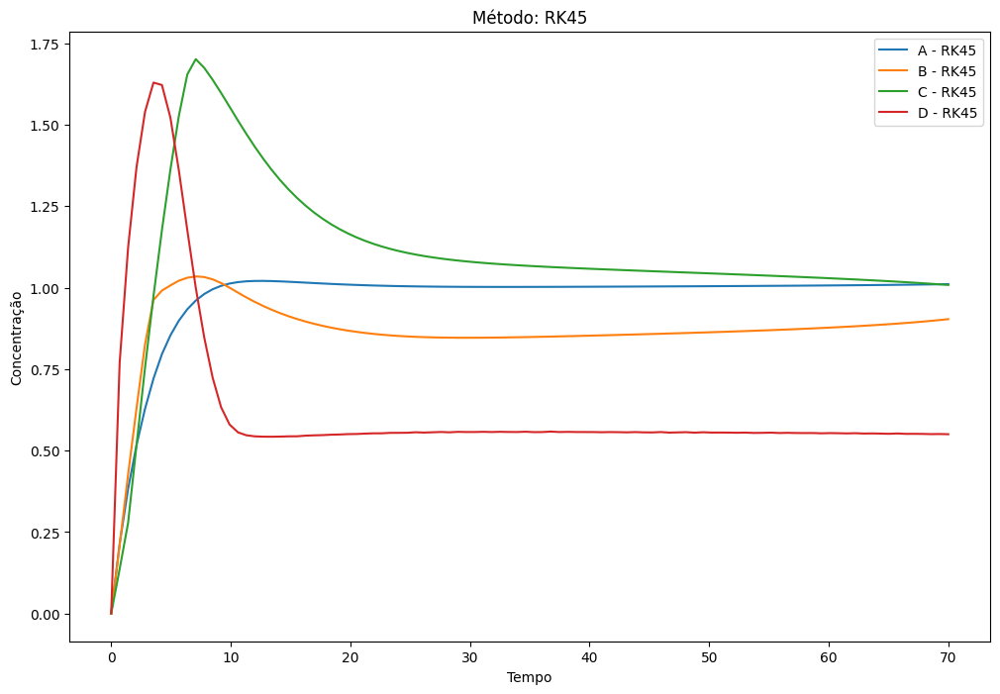

Sigma increased due to no improvement. New sigma: 10.13056670472104218, 'min': 0.03402195931247864, 'max': 0.5240358723326929}3698}6}}
Sigma increased due to no improvement. New sigma: 157921968384570022, 'min': 0.27354740741032524, 'max': 2.4903840562103463}}}}
Sigma increased due to no improvement. New sigma: 12.859887992716121507, 'min': 0.07677735549930688, 'max': 1.539659345636087}}
Sigma increased due to no improvement. New sigma: 15.47419768204075646, 'min': 0.2714980554195315, 'max': 2.0421369426723066}
Sigma increased due to no improvement. New sigma: 150.23504855943014488, 'min': 0.10299291719518504, 'max': 0.8763791277428455}
Sigma increased due to no improvement. New sigma: 9.381653044079101154, 'min': 0.07675043894464484, 'max': 1.2013177508622561}}}


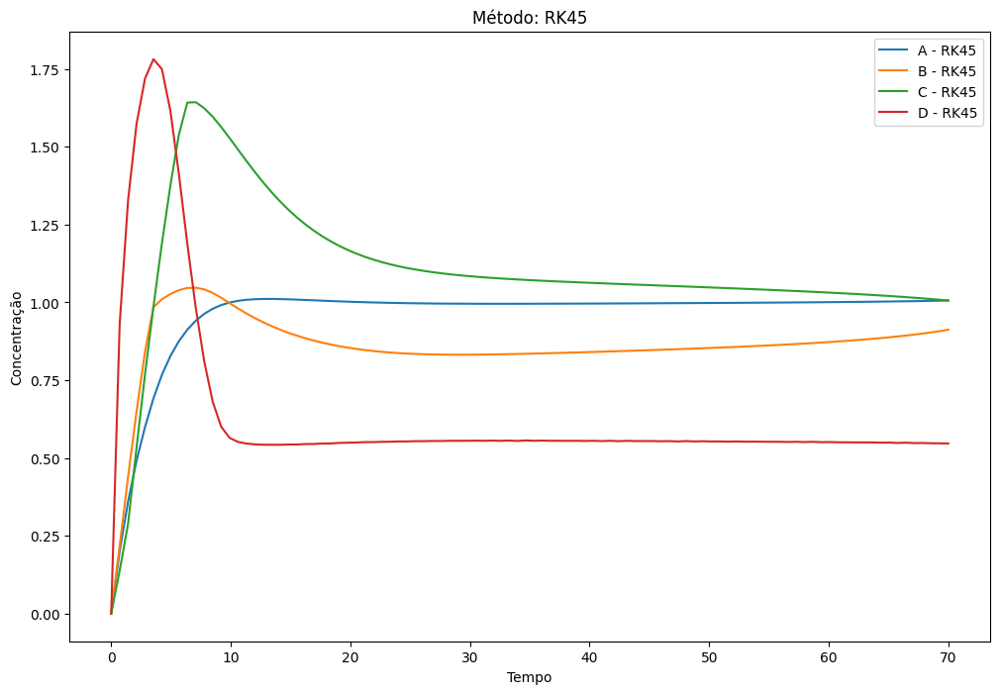

Sigma increased due to no improvement. New sigma: 11.978711165776371612, 'min': 0.0673548726510675, 'max': 0.2106841442584974}17}}
Sigma increased due to no improvement. New sigma: 150.685705728373309, 'min': 0.21747818365390315, 'max': 2.30973986469244}6}1}}
Sigma increased due to no improvement. New sigma: 15 0.1404580742127474, 'min': 0.07993235726909362, 'max': 0.530667645576454}177}}
Sigma increased due to no improvement. New sigma: 10.21839568980019713224, 'min': 0.05679479622990672, 'max': 0.08487583056850184}}
Sigma increased due to no improvement. New sigma: 10.428939617441877341111, 'min': 0.04973646161976931, 'max': 0.06563146976726823}}}
Sigma increased due to no improvement. New sigma: 13.28154804531248343237, 'min': 0.05635568326681668, 'max': 0.0731347571527907}}}}


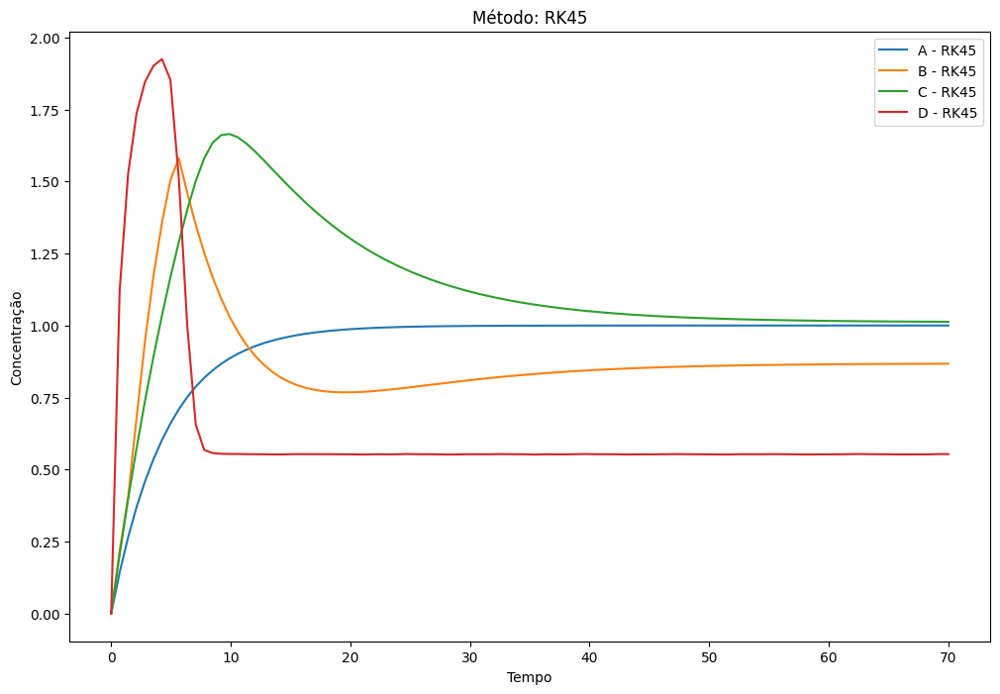

Sigma increased due to no improvement. New sigma: 1': 4.630644579910907e-06, 'min': 0.02708433592681527, 'max': 0.027102146687849916}}}
Sigma increased due to no improvement. New sigma: 1: 3.624530767984328e-05, 'min': 0.026208102370087877, 'max': 0.02631676238718199}}}}
Sigma increased due to no improvement. New sigma: 2.750235042630494759424, 'min': 0.026311964244456212, 'max': 0.0433476063120261}818}}
Sigma increased due to no improvement. New sigma: 5.975887065531619315393333, 'min': 0.026503043517133045, 'max': 0.027250565160034546}


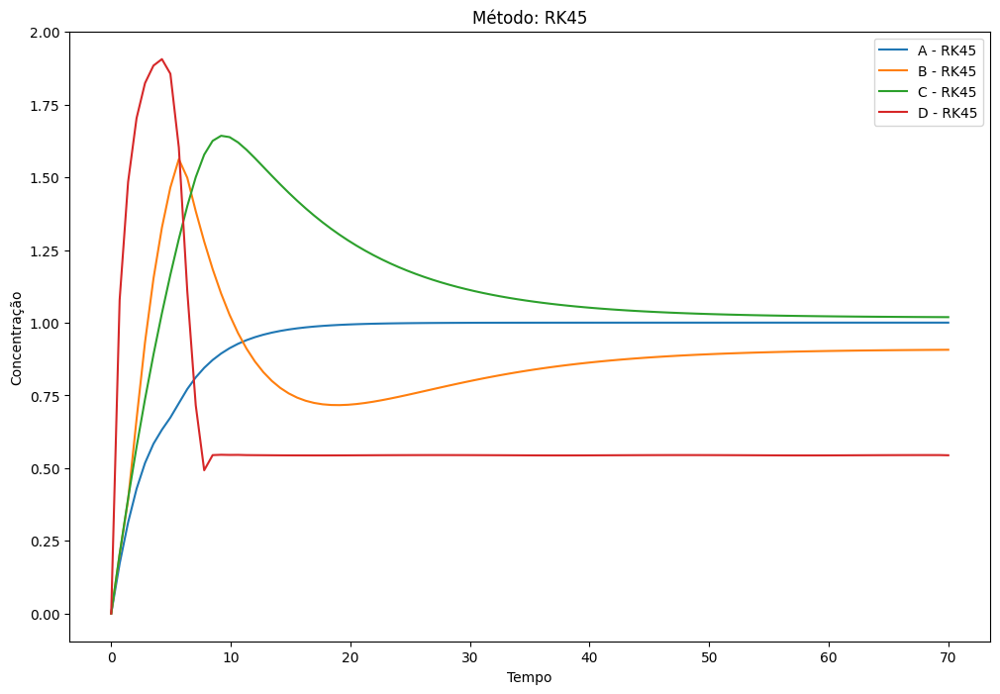

Sigma increased due to no improvement. New sigma: 8.78334350864153378612109, 'min': 0.02673209103362274, 'max': 0.02818924905754849}26}
Sigma increased due to no improvement. New sigma: 7.3555388304796795426e-05, 'min': 0.026497121536897685, 'max': 0.026777412579942497}}
Sigma increased due to no improvement. New sigma: 11.237105160297444405713, 'min': 0.02646367047360503, 'max': 0.030868969724567732}4}
Sigma increased due to no improvement. New sigma: 8.643819816173808594605783, 'min': 0.02642123732494446, 'max': 0.027010924331261607}}
Sigma increased due to no improvement. New sigma: 9.843719605004365089014, 'min': 0.026435067028923752, 'max': 0.034230177964252456}}7}
Sigma increased due to no improvement. New sigma: 8.892389694423585955e-05, 'min': 0.02647361922085964, 'max': 0.02666779490748796}46}}
Sigma increased due to no improvement. New sigma: 8.2736152955415554937e-05, 'min': 0.026427252156603992, 'max': 0.026560036420263153}}


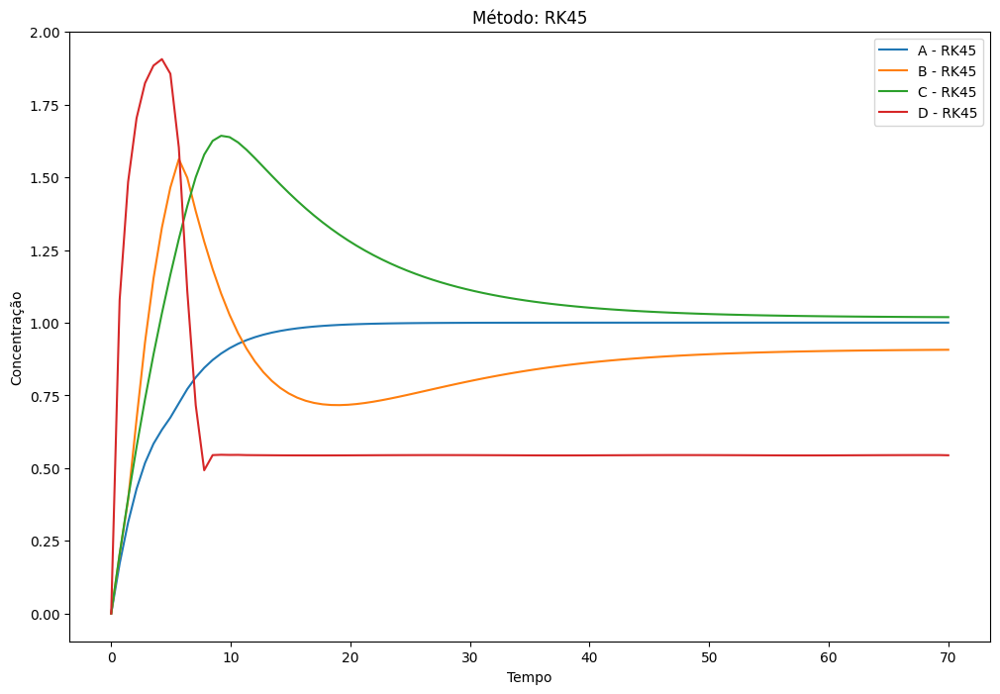

Sigma increased due to no improvement. New sigma: 6.873875581563245592e-05, 'min': 0.02647613067291936, 'max': 0.026676117820749384}}}}
Sigma increased due to no improvement. New sigma: 11.4664325913303884364, 'min': 0.026423455637189938, 'max': 0.03719631395867382}33}}}
Sigma increased due to no improvement. New sigma: 11.66249534647516553e-05, 'min': 0.0263967261599904, 'max': 0.026563951559514423}36}}
Sigma increased due to no improvement. New sigma: 8.7508269837996942046e-05, 'min': 0.026366422410409002, 'max': 0.02663154220733517}}}
Sigma increased due to no improvement. New sigma: 5.8531084820218685504e-05, 'min': 0.026387818480515187, 'max': 0.026518713996324397}}
Sigma increased due to no improvement. New sigma: 5.7262729578913080056e-05, 'min': 0.026364062606856312, 'max': 0.02653124879558729}}}


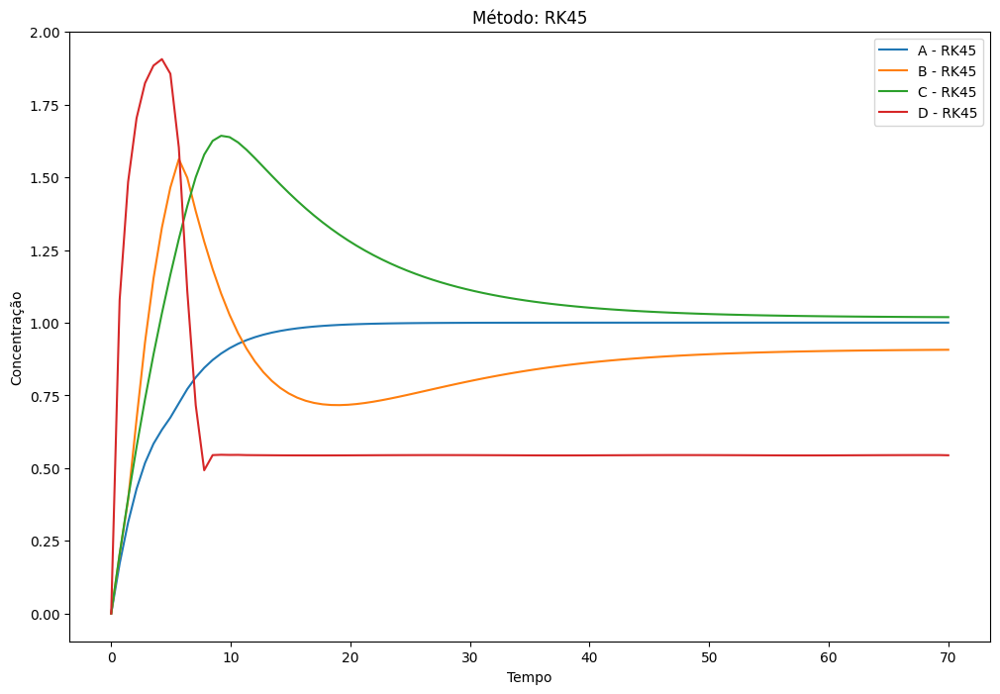

Sigma increased due to no improvement. New sigma: 6.1341940702718718917e-05, 'min': 0.026383605531807783, 'max': 0.026545084802987437}
Sigma increased due to no improvement. New sigma: 7.7231989037263792486e-05, 'min': 0.026378524647783657, 'max': 0.026512907643149695}}
Force-stopping RK45 for seed 3, error MSE due to timeout.22193223080162e-05, 'min': 0.026381553121419585, 'max': 0.02654422824798762}}}
Solver: DOP853, Error: MSE
Timeout reached for RK45 on seed 3, error MSE'std': 6.626465527327855e-05, 'min': 0.026385384670907522, 'max': 0.026546013659521136}


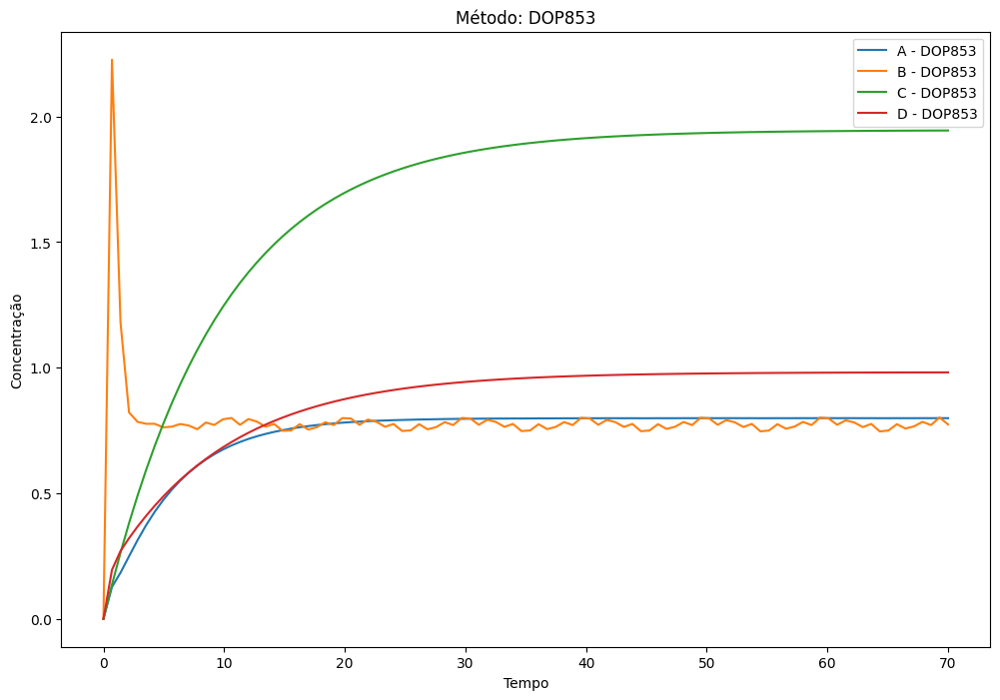

Sigma increased due to no improvement. New sigma: 1.6092083888599255071, 'min': 0.07183293997487668, 'max': 0.19539987732601857}}}
Sigma increased due to no improvement. New sigma: 3.71196241739003966, 'min': 0.11913096850768494, 'max': 1.1116317343436715}}4}}
Sigma increased due to no improvement. New sigma: 5.44517178387112552274, 'min': 0.10736229537778723, 'max': 0.32982462336953566}
Sigma increased due to no improvement. New sigma: 7.56825233308639397, 'min': 0.1478891294812286, 'max': 1.2445861992043457}8}46}
Sigma increased due to no improvement. New sigma: 7.2460234554785892631, 'min': 0.0731404929096758, 'max': 0.21159688348648423}}
Sigma increased due to no improvement. New sigma: 7.4290873409169576162, 'min': 0.05940279198659703, 'max': 0.18438460542369758}}
Sigma increased due to no improvement. New sigma: 5.6262684474780205331, 'min': 0.06332794327288395, 'max': 0.1791765126370815}}}


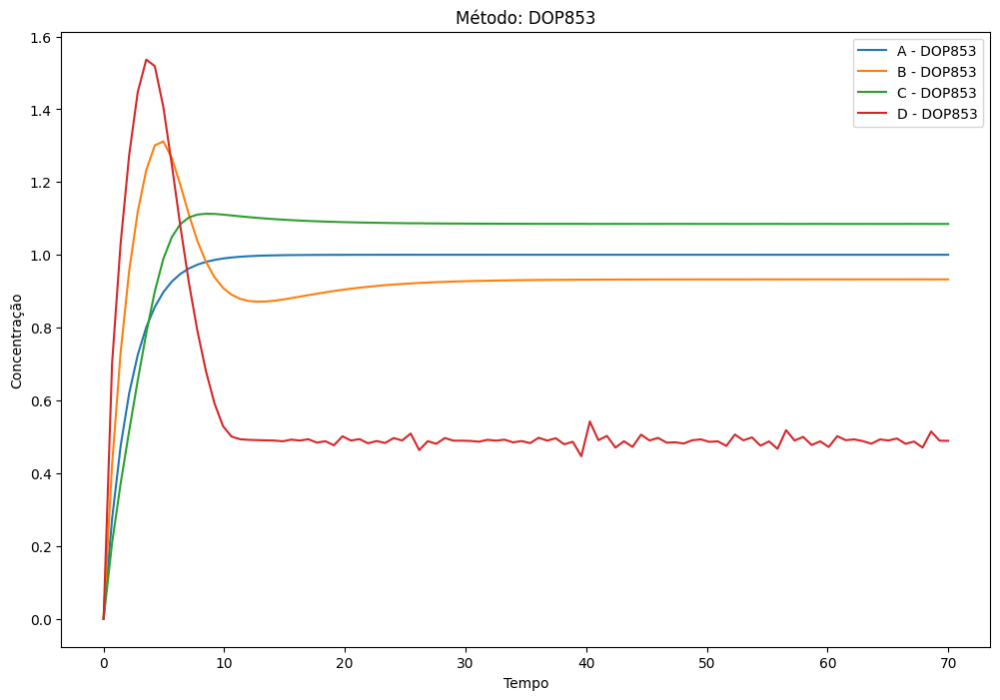

Sigma increased due to no improvement. New sigma: 7.0469528193512253733, 'min': 0.05158864308743603, 'max': 0.6277739140071321}}}
Sigma increased due to no improvement. New sigma: 9.073663676381615756, 'min': 0.04745430643152712, 'max': 0.5039761457833339}}2}}
Sigma increased due to no improvement. New sigma: 150.31091465332465934, 'min': 0.11050061639381799, 'max': 1.332663772639011}5}
Sigma increased due to no improvement. New sigma: 150.06596386301587062, 'min': 0.11394078447154722, 'max': 0.3514368572815135}}
Sigma increased due to no improvement. New sigma: 12.299056306272774918, 'min': 0.07878945445832566, 'max': 0.234803774479302}64}
Sigma increased due to no improvement. New sigma: 12.0718711016236585467, 'min': 0.13823675217879572, 'max': 0.17795580912395162}
Sigma increased due to no improvement. New sigma: 150.28262977613665413, 'min': 0.05260034521584488, 'max': 0.9041651495245298}}}
Sigma increased due to no improvement. New sigma: 150.0352228148212991, 'min': 0.0714529922

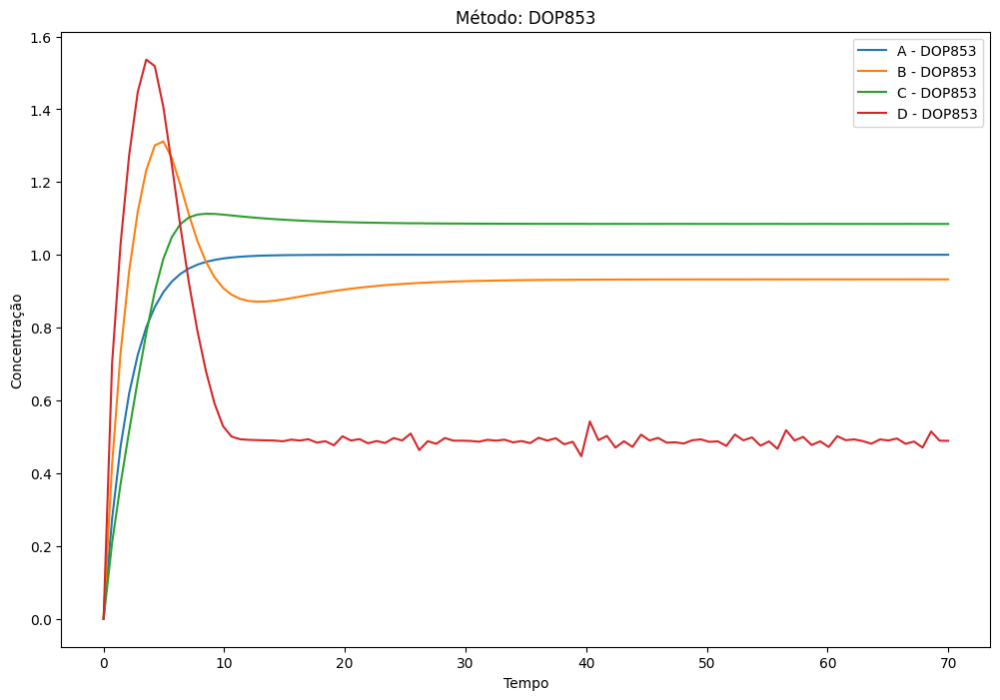

Sigma increased due to no improvement. New sigma: 15 0.045921280698469784, 'min': 0.08614072205739884, 'max': 0.23497549646872137}}
Sigma increased due to no improvement. New sigma: 15 0.055495440619117015, 'min': 0.05887742144904954, 'max': 0.218482890642019}}}
Sigma increased due to no improvement. New sigma: 15 0.2710647913737145, 'min': 0.06669362479867673, 'max': 1.1543522945985638}}6}
Sigma increased due to no improvement. New sigma: 15 0.0207908413669563, 'min': 0.13553356632869684, 'max': 0.21066127492368955}8}
Sigma increased due to no improvement. New sigma: 15 0.1652741663933789, 'min': 0.05419810532431949, 'max': 0.7050827381680085}}}}
Sigma increased due to no improvement. New sigma: 15 0.006936208412320792, 'min': 0.06163639466078765, 'max': 0.08940380762367132}


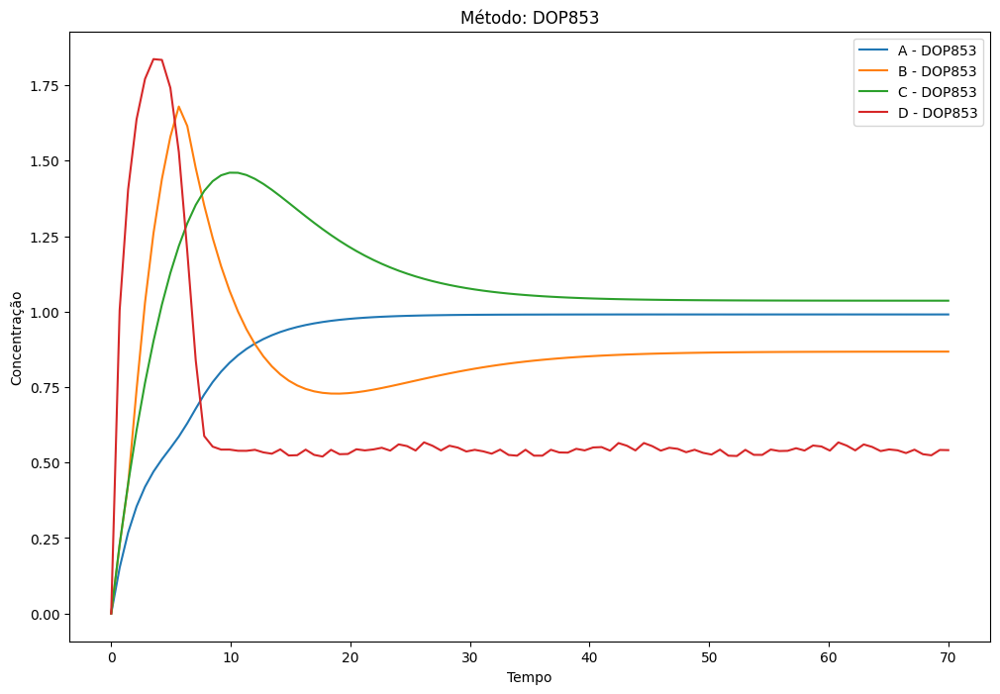

Sigma increased due to no improvement. New sigma: 1.1441586470328753504e-05, 'min': 0.03034742637254489, 'max': 0.030704592667599454}}}
Sigma increased due to no improvement. New sigma: 1.381878560927238461270234, 'min': 0.030072935088454343, 'max': 0.030417949857556817}
Sigma increased due to no improvement. New sigma: 1.6103452505182858616e-05, 'min': 0.02927721036396008, 'max': 0.029607022686210533}}}


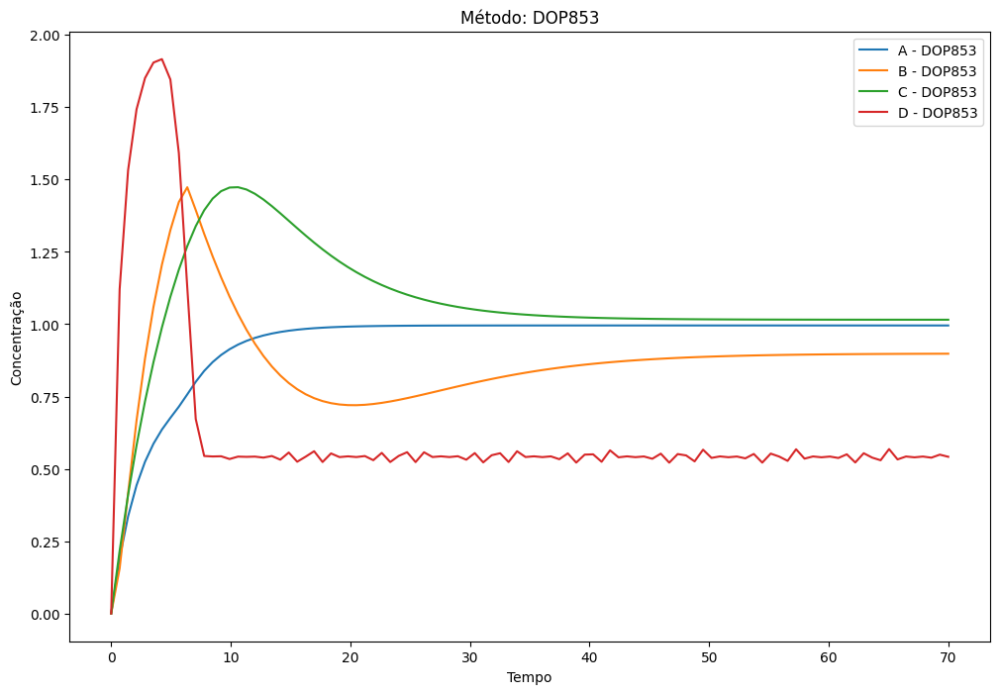

Sigma increased due to no improvement. New sigma: 1': 5.0317011334680664e-05, 'min': 0.026573375182569615, 'max': 0.026771359184701273}
Sigma increased due to no improvement. New sigma: 1.8222023728485548046e-05, 'min': 0.026601287812832518, 'max': 0.02682047283756238}}}
Sigma increased due to no improvement. New sigma: 1.697948101242849785096239, 'min': 0.026187688904235156, 'max': 0.026514547099543376}
Sigma increased due to no improvement. New sigma: 4.5244601051497225303e-05, 'min': 0.026176777547509657, 'max': 0.026514406456925932}}


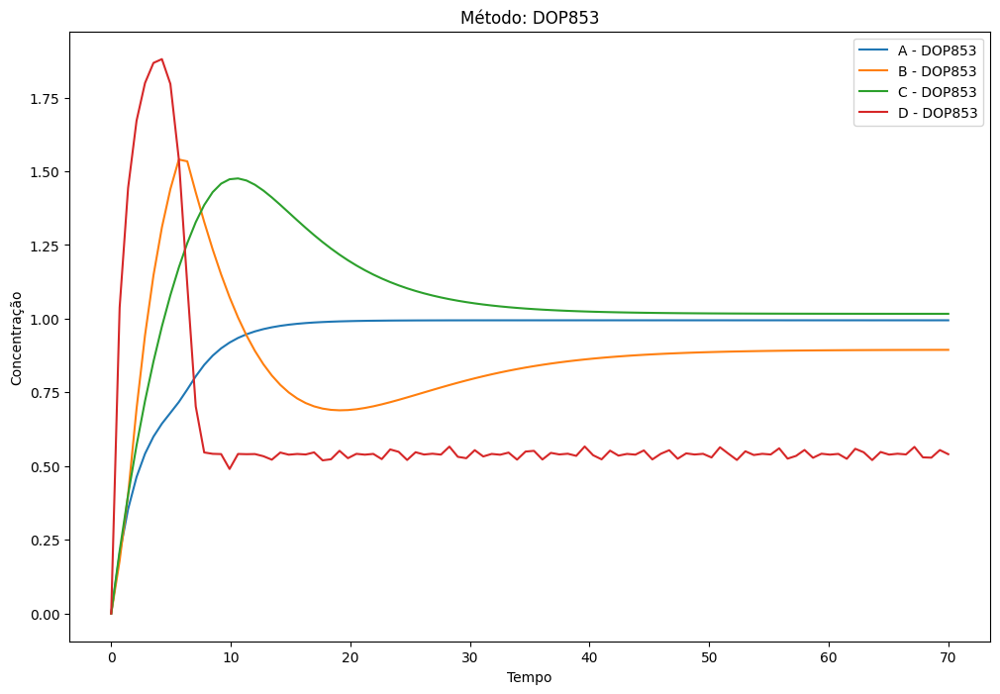

Sigma increased due to no improvement. New sigma: 14.10473781267699310436584, 'min': 0.026173545832047358, 'max': 0.02663694382955637}}
Force-stopping DOP853 for seed 3, error MSE due to timeout.751855487681667, 'min': 0.028213974988138175, 'max': 0.03510195316764861}}}
Skipping already processed: seed=3, error=MSE, method=LSODA
Skipping already processed: seed=3, error=MABS, method=RK45
Skipping already processed: seed=3, error=MABS, method=DOP853
Skipping already processed: seed=3, error=MABS, method=LSODA
Skipping already processed: seed=4, error=ABS, method=RK45
Skipping already processed: seed=4, error=ABS, method=DOP853
Skipping already processed: seed=4, error=ABS, method=LSODA
Solver: RK45, Error: SQUARED
Timeout reached for DOP853 on seed 3, error MSE'std': 0.01549182628780606, 'min': 0.028500923664900556, 'max': 0.08045176159034428}


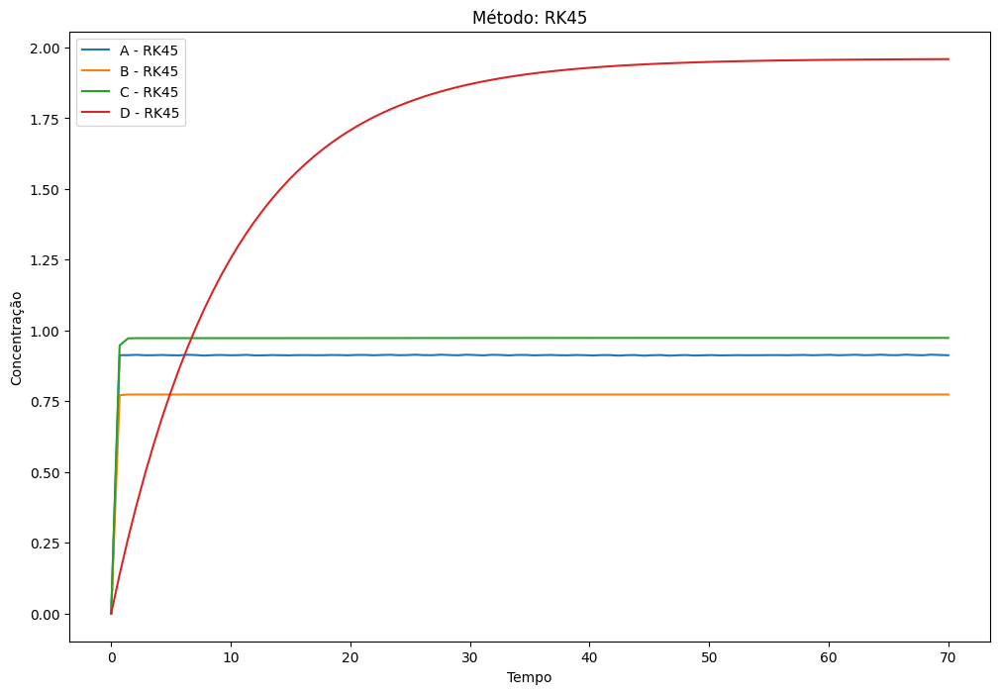

Sigma increased due to no improvement. New sigma: 1.9689603155304904 'min': 8.511888361974421, 'max': 26.060032078885758}}
Sigma increased due to no improvement. New sigma: 1.8950297648549388, 'min': 6.844807797619166, 'max': 10.871239442185558}}
Sigma increased due to no improvement. New sigma: 2.9540755679459236 'min': 7.333831666204927, 'max': 10.500406851418738}}}
Sigma increased due to no improvement. New sigma: 8.32108527022189574, 'min': 8.182343062277985, 'max': 17.32264094958801}}
Sigma increased due to no improvement. New sigma: 10.308496330212646, 'min': 6.6918516266639765, 'max': 14.370953767830553}


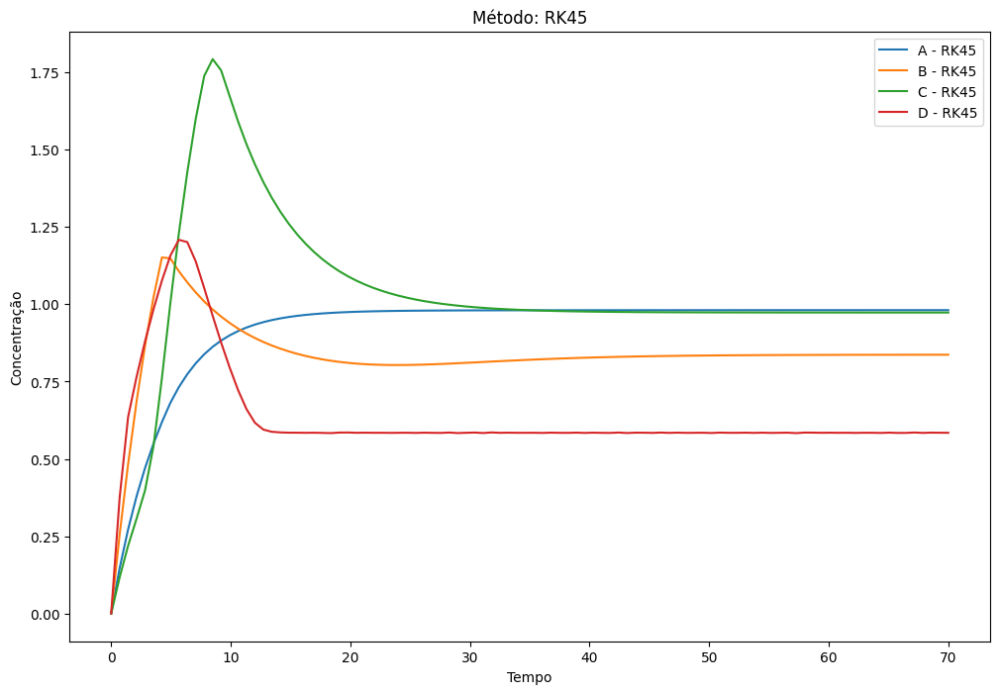

Sigma increased due to no improvement. New sigma: 10.1294397873560158, 'min': 3.3040822395781553, 'max': 3.795471978760469}}}}}
Sigma increased due to no improvement. New sigma: 1.6950083568672993076, 'min': 3.373527067613796, 'max': 3.529770367049857}}
Sigma increased due to no improvement. New sigma: 3.79890061808527985, 'min': 3.3530415141167853, 'max': 7.030982886760538}7}


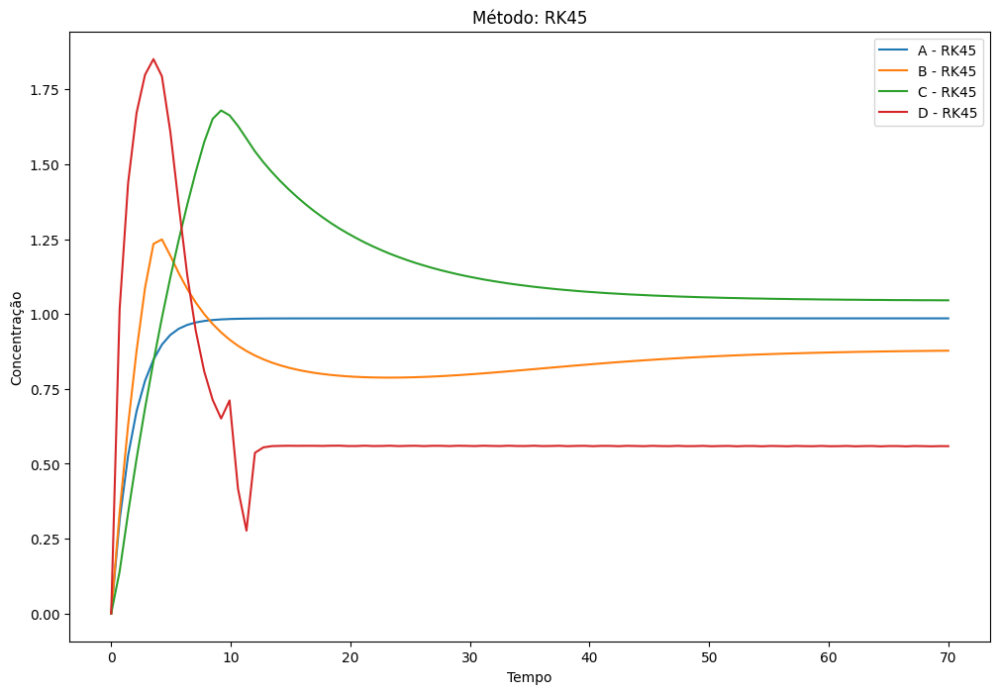

Sigma increased due to no improvement. New sigma: 7.1636578635783221, 'min': 3.9104860283267646, 'max': 22.817388859221403}}
Sigma increased due to no improvement. New sigma: 9.99030253526736103, 'min': 3.950807321611211, 'max': 4.7480786367167145}}}
Sigma increased due to no improvement. New sigma: 15.0945836316284105, 'min': 4.223202609971368, 'max': 8.50075675359608}}4}
Sigma increased due to no improvement. New sigma: 12.0351943691312179, 'min': 4.138579306795702, 'max': 17.35502852287511}}}
Sigma increased due to no improvement. New sigma: 10.8834091431210747, 'min': 4.191843846876601, 'max': 4.548575792504531}1}
Sigma increased due to no improvement. New sigma: 15.8846194272088763, 'min': 4.55900857733782, 'max': 10.48641711121682}2}}
Sigma increased due to no improvement. New sigma: 11.9818491073208373, 'min': 3.656601309482341, 'max': 7.825660711093837}2}
Sigma increased due to no improvement. New sigma: 158281315320194793, 'min': 3.8050564212361095, 'max': 10.428797663680047}}

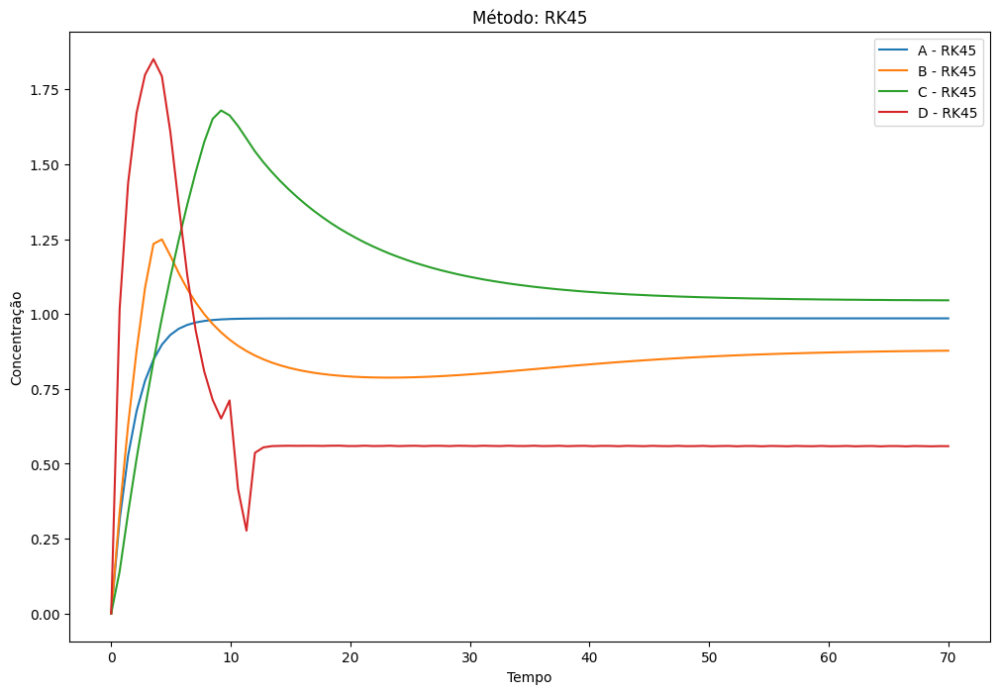

Sigma increased due to no improvement. New sigma: 15.325198679818684, 'min': 3.730861636073785, 'max': 4.771773316465343}16}}
Sigma increased due to no improvement. New sigma: 15.7121180593540244, 'min': 3.7092163197878953, 'max': 10.280967239110657}5}
Sigma increased due to no improvement. New sigma: 15.5505950236527604, 'min': 3.4792315497965514, 'max': 9.373447874381256}}}
Sigma increased due to no improvement. New sigma: 15.09586623427416421, 'min': 3.599345927116787, 'max': 3.899480856839118}}}
Sigma increased due to no improvement. New sigma: 15.5112509316844634, 'min': 3.595712358661811, 'max': 5.62881059579074}1}}}
Sigma increased due to no improvement. New sigma: 10.6297415528357578, 'min': 3.3707122794386533, 'max': 4.2457137794812}4}8}
Sigma increased due to no improvement. New sigma: 10.51077050669726302, 'min': 3.3244406184175883, 'max': 7.692166766067635}}}


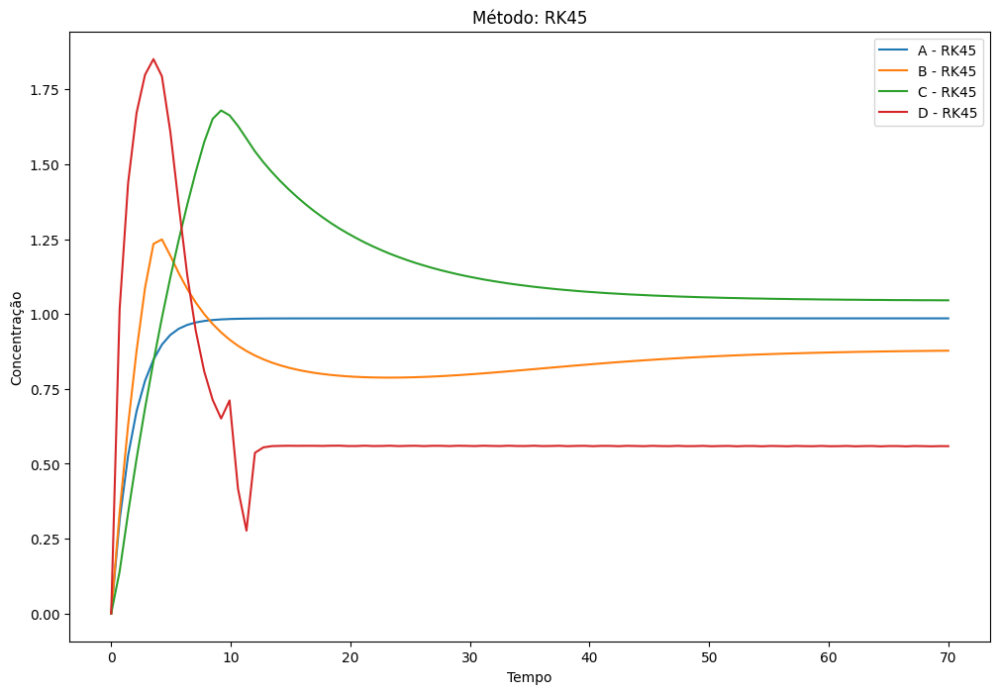

Sigma increased due to no improvement. New sigma: 150.27819736230275727, 'min': 3.316178139673157, 'max': 4.423988463861598}}
Sigma increased due to no improvement. New sigma: 10.960703794687276, 'min': 3.3220370561929826, 'max': 9.321565573842403}584}
Sigma increased due to no improvement. New sigma: 12.395094723194521836, 'min': 3.3038500013313437, 'max': 3.719861903069213}}}
Sigma increased due to no improvement. New sigma: 15.032912885140508816, 'min': 3.3250955432712015, 'max': 3.4210260428158565}}
Sigma increased due to no improvement. New sigma: 15.07466026787548681, 'min': 3.3193953325793966, 'max': 3.6169540064031716}}


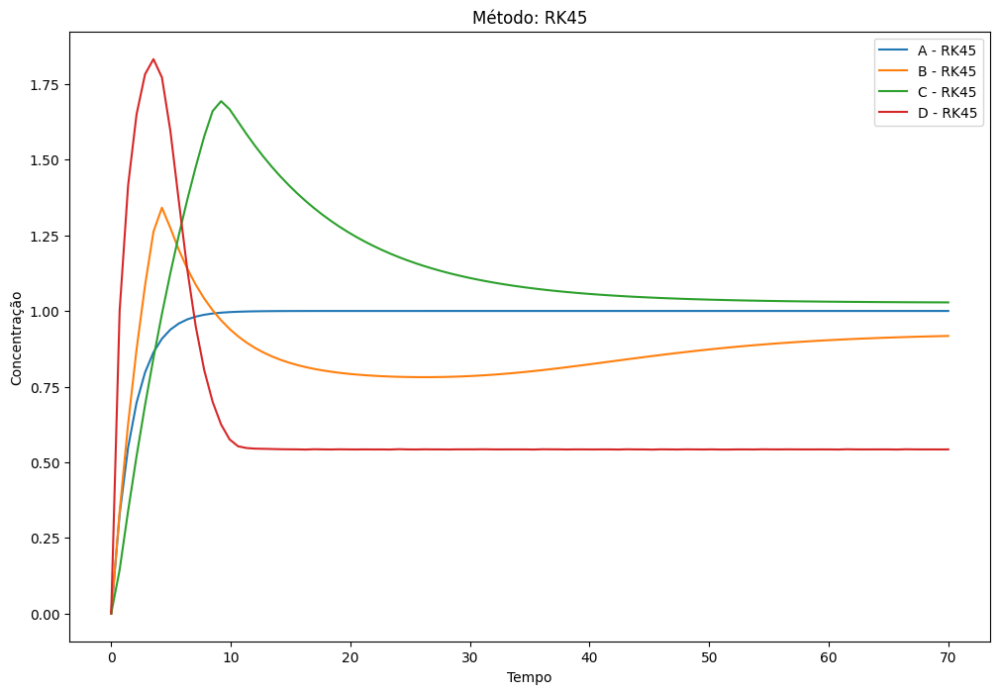

Sigma increased due to no improvement. New sigma: 10.0005939714961877877, 'min': 3.269860162579403, 'max': 3.2722043688417592}}}}
Sigma increased due to no improvement. New sigma: 1.37473260223331242994, 'min': 3.2688467716342813, 'max': 3.2722749834170077}}
Sigma increased due to no improvement. New sigma: 7.67862388412735391986, 'min': 3.26116444019515, 'max': 3.275518525820085}94}}
Sigma increased due to no improvement. New sigma: 15.021684384456050393, 'min': 3.2612156830559536, 'max': 3.340214782359278}}}


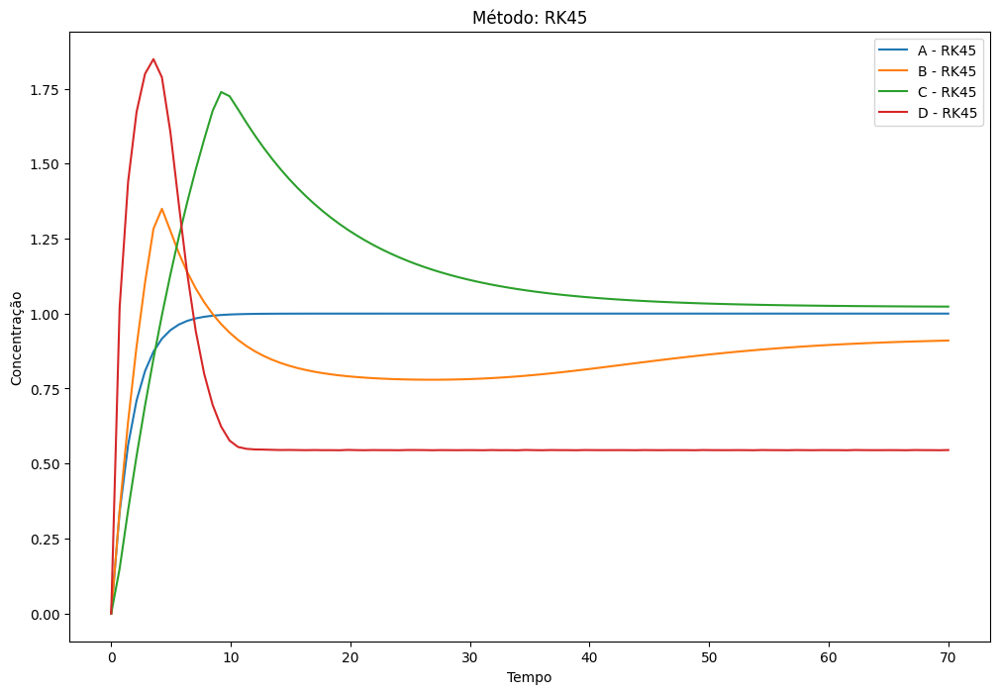

Sigma increased due to no improvement. New sigma: 3.164600046870150355371, 'min': 3.2494017025371305, 'max': 3.2540939988416286}
Sigma increased due to no improvement. New sigma: 8.46684518981926416014, 'min': 3.251723138183942, 'max': 3.2589719514248867}7}
Force-stopping RK45 for seed 4, error SQUARED due to timeout.6187930881, 'min': 3.2515717040773953, 'max': 3.2592146206358046}5}
Skipping already processed: seed=4, error=SQUARED, method=DOP853
Skipping already processed: seed=4, error=SQUARED, method=LSODA
Solver: RK45, Error: MSE
Timeout reached for RK45 on seed 4, error SQUARED: 0.0021473029775552154, 'min': 3.2532143582987016, 'max': 3.2614735499991125}


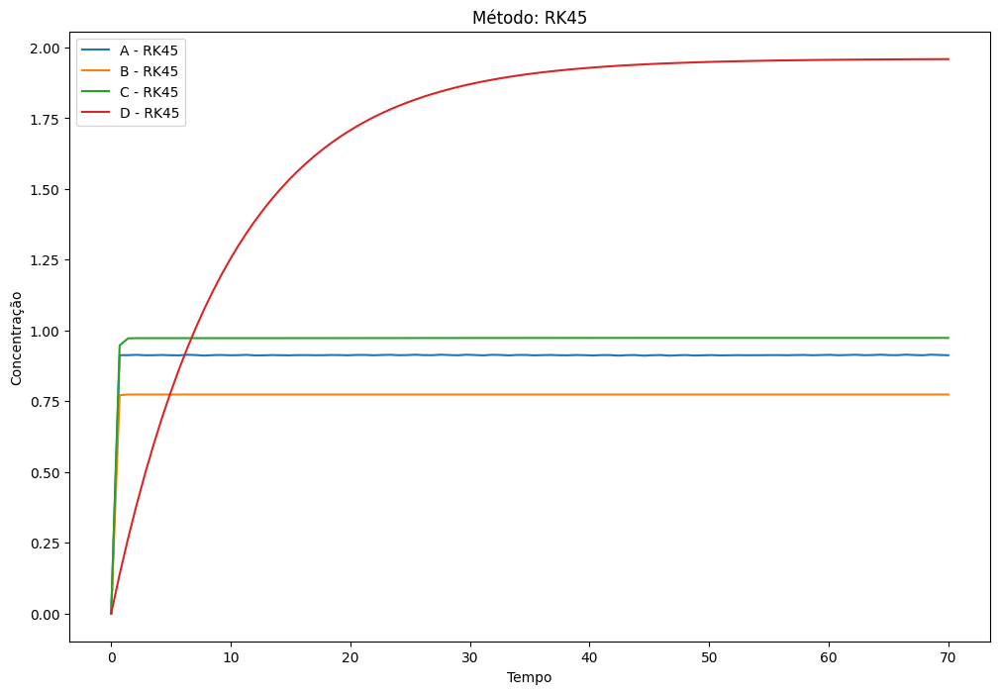

Sigma increased due to no improvement. New sigma: 1.96896031553049042, 'min': 0.1811306087167889, 'max': 1.6978131798813865}}6}
Sigma increased due to no improvement. New sigma: 1.89502976485493887, 'min': 0.11712848446587039, 'max': 0.2954596175233274}522}
Sigma increased due to no improvement. New sigma: 2.9540755679459236513, 'min': 0.13446271727057535, 'max': 0.2756463601133039}}}
Sigma increased due to no improvement. New sigma: 8.3210852702218951573, 'min': 0.16737684497202177, 'max': 0.7501847236708586}}}
Sigma increased due to no improvement. New sigma: 10.3084963302126469, 'min': 0.11195219548321328, 'max': 0.5163107804928079}}}


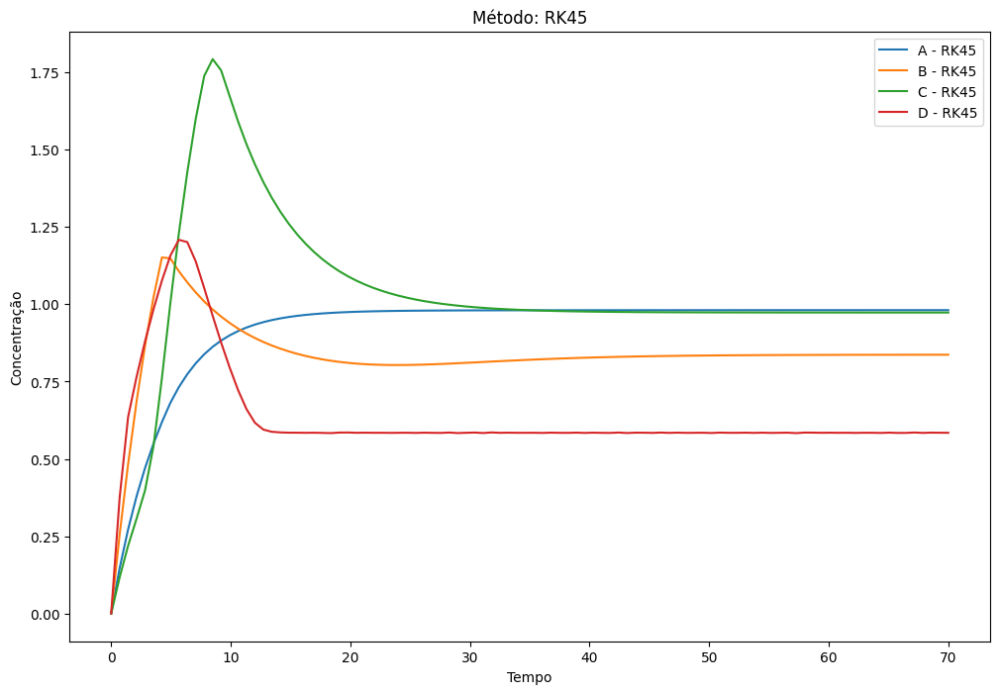

Sigma increased due to no improvement. New sigma: 1: 0.0022990700837587346, 'min': 0.027292398614739484, 'max': 0.03601401885388978}4}
Sigma increased due to no improvement. New sigma: 1.6950083568672993906287, 'min': 0.028451712189807344, 'max': 0.031148197110258208}
Sigma increased due to no improvement. New sigma: 3.79890061808527940097, 'min': 0.028107218488476457, 'max': 0.12358680088479888}6}


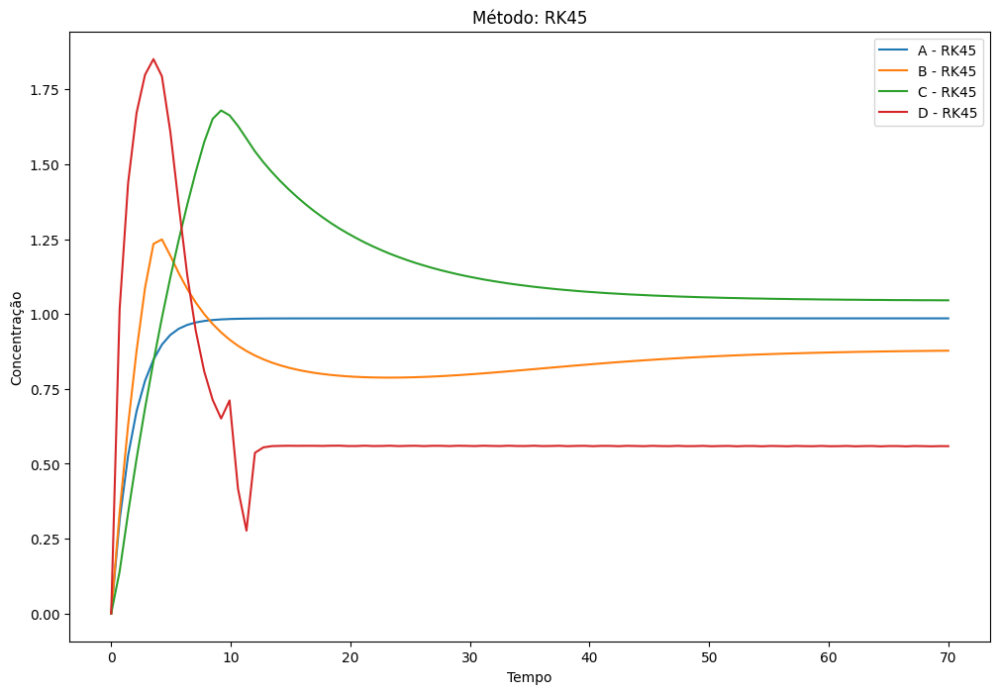

Sigma increased due to no improvement. New sigma: 7.1636578635783221487, 'min': 0.03822975244434709, 'max': 1.3015830858823028}62}}
Sigma increased due to no improvement. New sigma: 9.9903025352673619052, 'min': 0.03902219623124189, 'max': 0.05636062685111413}6}}}
Sigma increased due to no improvement. New sigma: 15 0.03475620142663338, 'min': 0.044588600712172424, 'max': 0.18065716345952335}}
Sigma increased due to no improvement. New sigma: 12.035194369131217498, 'min': 0.042819596696594006, 'max': 0.7529925375745212}2}}}
Sigma increased due to no improvement. New sigma: 10.8834091431210745944729, 'min': 0.043928887091493056, 'max': 0.051723854350395566}
Sigma increased due to no improvement. New sigma: 15 0.07058471850601905, 'min': 0.05196139802059955, 'max': 0.27491235957605237}6}
Sigma increased due to no improvement. New sigma: 11.9818491073208374963, 'min': 0.03342683284126993, 'max': 0.15310241391289428}4}}
Sigma increased due to no improvement. New sigma: 15 0.063407811927248

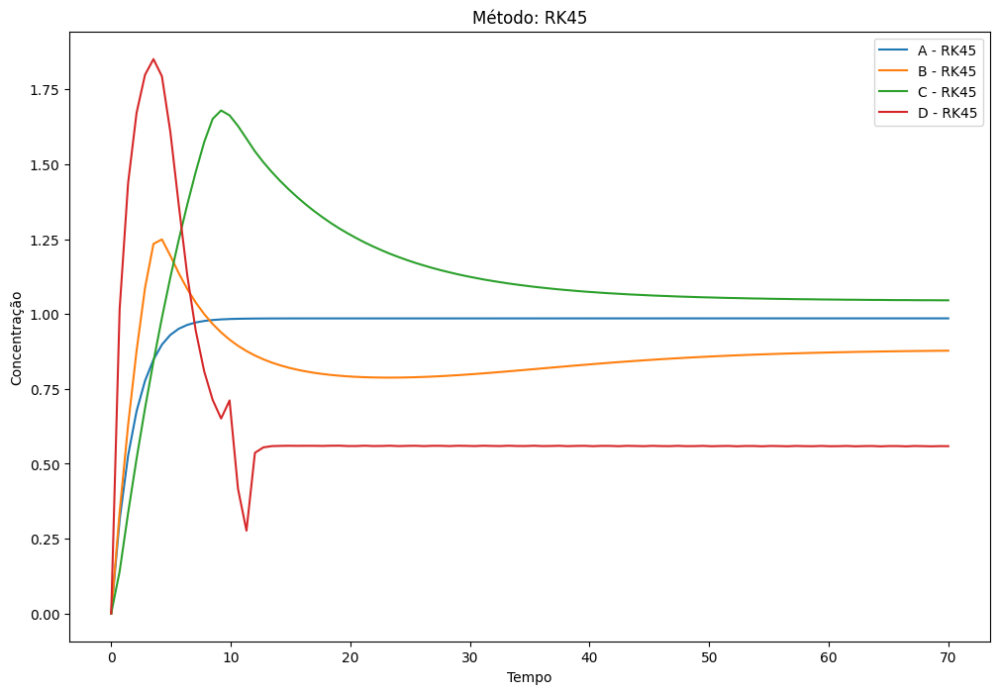

Sigma increased due to no improvement. New sigma: 15 0.00687517371465597, 'min': 0.034798321368817886, 'max': 0.05692455145932664}}}}
Sigma increased due to no improvement. New sigma: 15 0.06043631512463799, 'min': 0.03439571426745213, 'max': 0.2642457184291665}995}}
Sigma increased due to no improvement. New sigma: 15: 0.049674225915175584, 'min': 0.03026263044274929, 'max': 0.21965381263435627}}
Sigma increased due to no improvement. New sigma: 150.0018010014823730187, 'min': 0.032388227757630526, 'max': 0.03801487738213685}}
Sigma increased due to no improvement. New sigma: 15 0.011924010197008639, 'min': 0.032322868415583204, 'max': 0.07920877180821527}}}
Sigma increased due to no improvement. New sigma: 10.6297415528357576301, 'min': 0.028404253176896307, 'max': 0.0450652137431913}5}9}
Sigma increased due to no improvement. New sigma: 10.510770506697263038294, 'min': 0.027629763563461793, 'max': 0.14792357389248864}}


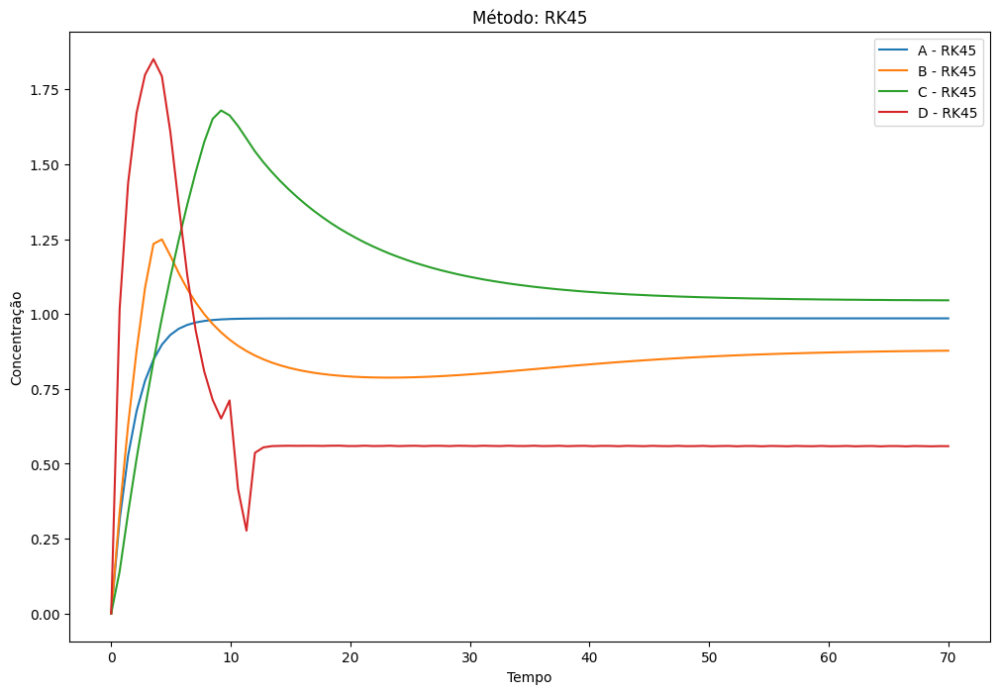

Sigma increased due to no improvement. New sigma: 15 0.005389837856089976, 'min': 0.02749259363511528, 'max': 0.04892918482095122}5}}
Sigma increased due to no improvement. New sigma: 10.96070379468727483623, 'min': 0.02758982550679834, 'max': 0.21722896186860957}3}}
Sigma increased due to no improvement. New sigma: 12.39509472319452137365, 'min': 0.027288562078242814, 'max': 0.03459343144476426}7}}
Sigma increased due to no improvement. New sigma: 15: 0.0005549516473098102, 'min': 0.027640650929705014, 'max': 0.029258547964060785}
Sigma increased due to no improvement. New sigma: 15 0.0012944270096703658, 'min': 0.0275459634348747, 'max': 0.032705890711089876}6}
Sigma increased due to no improvement. New sigma: 14.3581734370821339785305, 'min': 0.026981916548038526, 'max': 0.030316325285154863}


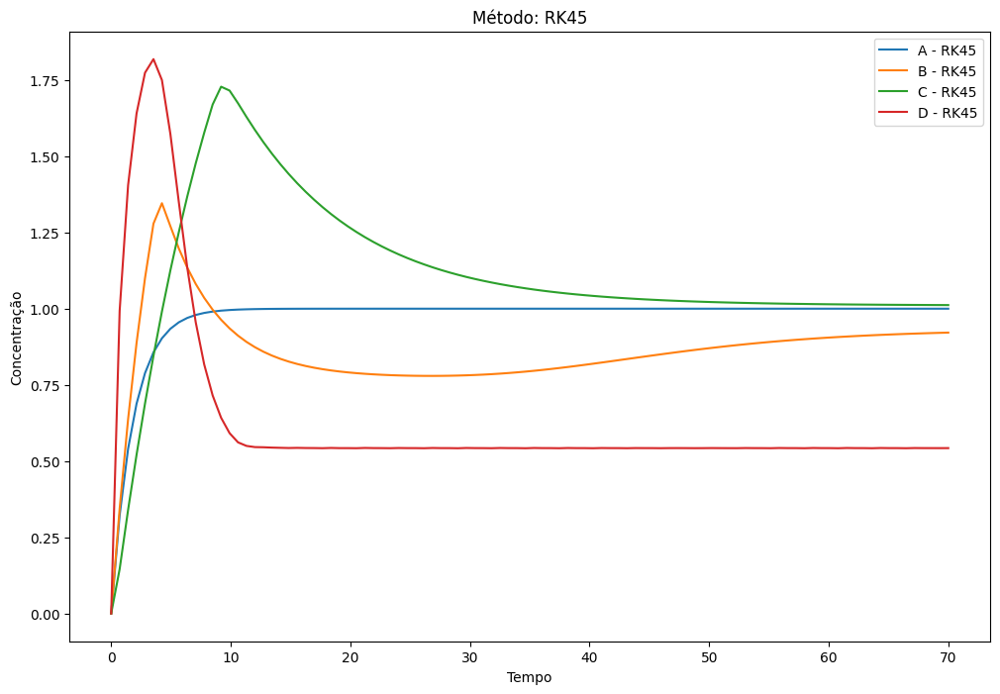

Sigma increased due to no improvement. New sigma: 5.63528786549789470538201, 'min': 0.026728263746583308, 'max': 0.027150701615760178}}
Sigma increased due to no improvement. New sigma: 15: 0.0009945056209401302, 'min': 0.02685516569211654, 'max': 0.03044895924804182}}5}
Sigma increased due to no improvement. New sigma: 3.393494779364812382e-05, 'min': 0.026462834394136818, 'max': 0.02651885670369016}5}}
Sigma increased due to no improvement. New sigma: 11.16031671111124221, 'min': 0.026455079075668214, 'max': 0.42065638875279193}51657}}
Sigma increased due to no improvement. New sigma: 15 8.343759204208797e-05, 'min': 0.026560936205019176, 'max': 0.026876466496924514}}}


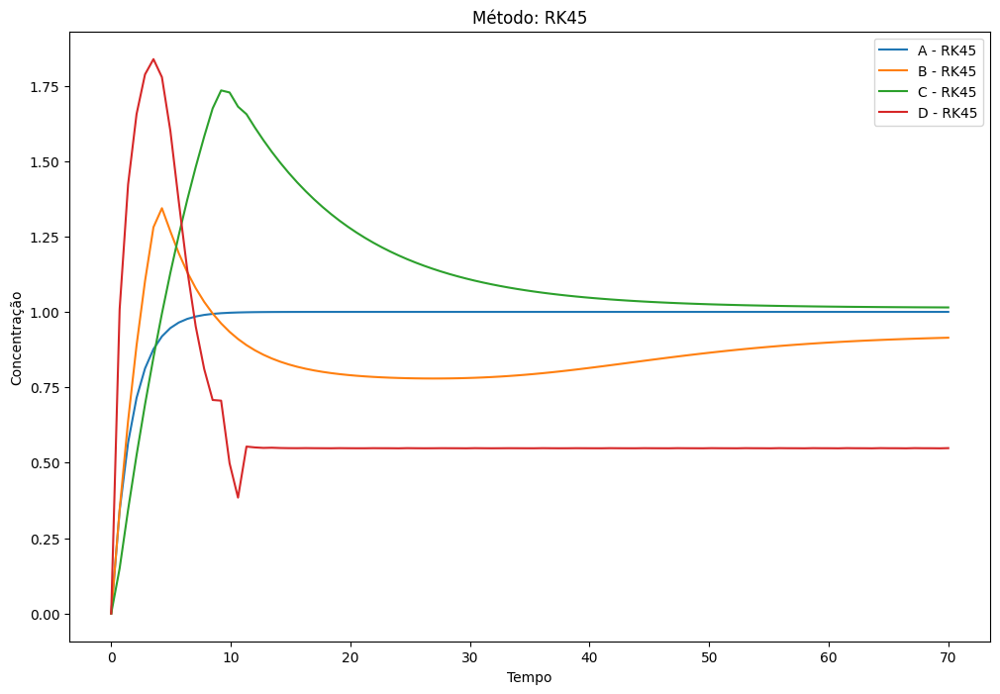

Sigma increased due to no improvement. New sigma: 15: 0.0001600953507819084, 'min': 0.026471473917001723, 'max': 0.027087491963658356}}
Sigma increased due to no improvement. New sigma: 15 0.0007135718063231145, 'min': 0.02646967724093852, 'max': 0.02918356883358669}}4}}
Sigma increased due to no improvement. New sigma: 15 0.11015250901261534, 'min': 0.026460510852807106, 'max': 0.44002960193783686}973}}
Force-stopping RK45 for seed 4, error MSE due to timeout.003976654965341528, 'min': 0.026536581594247904, 'max': 0.02810763903219354}}}
Solver: DOP853, Error: MSE
Timeout reached for RK45 on seed 4, error MSE, 'std': 0.00014698633986085096, 'min': 0.026547500051688423, 'max': 0.027017729925735163}


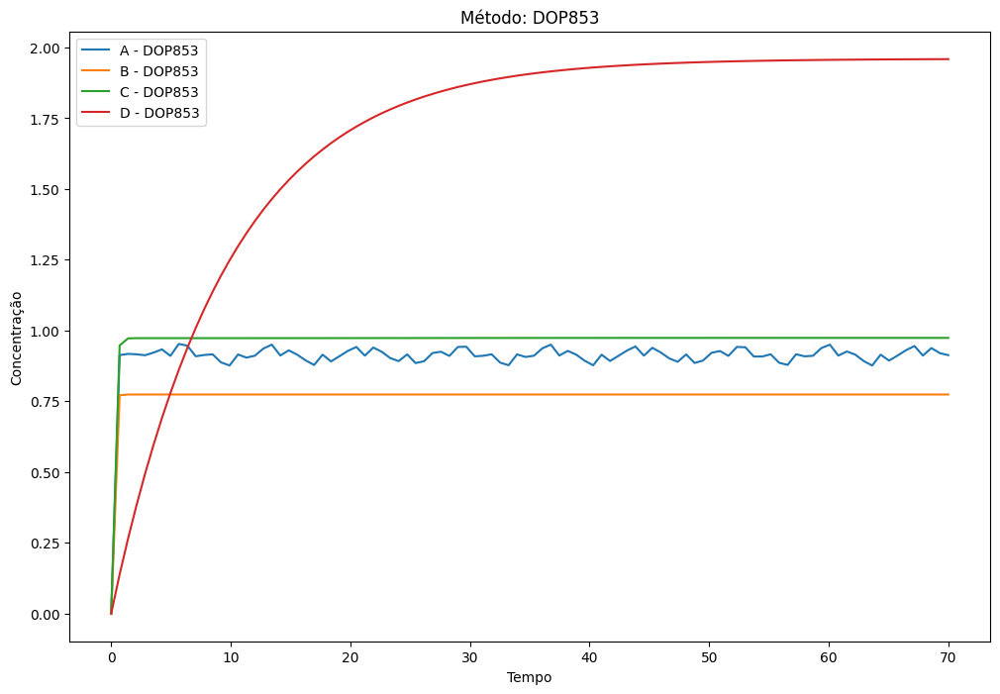

Sigma increased due to no improvement. New sigma: 2.1660162995637395267, 'min': 0.16887095353815462, 'max': 0.24101569609372311}
Sigma increased due to no improvement. New sigma: 2.4004532723591712613, 'min': 0.16645308275728177, 'max': 0.19285621799317887}}
Sigma increased due to no improvement. New sigma: 1.4695472879368399196, 'min': 0.15705105165984856, 'max': 0.32163134447558833}8}
Sigma increased due to no improvement. New sigma: 1.3568976033884974634, 'min': 0.13756197859413055, 'max': 0.1449410807226853}7}}
Sigma increased due to no improvement. New sigma: 2.3898090116305701704, 'min': 0.1375919485316443, 'max': 0.2075659529184847}}}}}
Sigma increased due to no improvement. New sigma: 4.0760640730569262871, 'min': 0.09014231940730635, 'max': 0.2744345834230726}1}


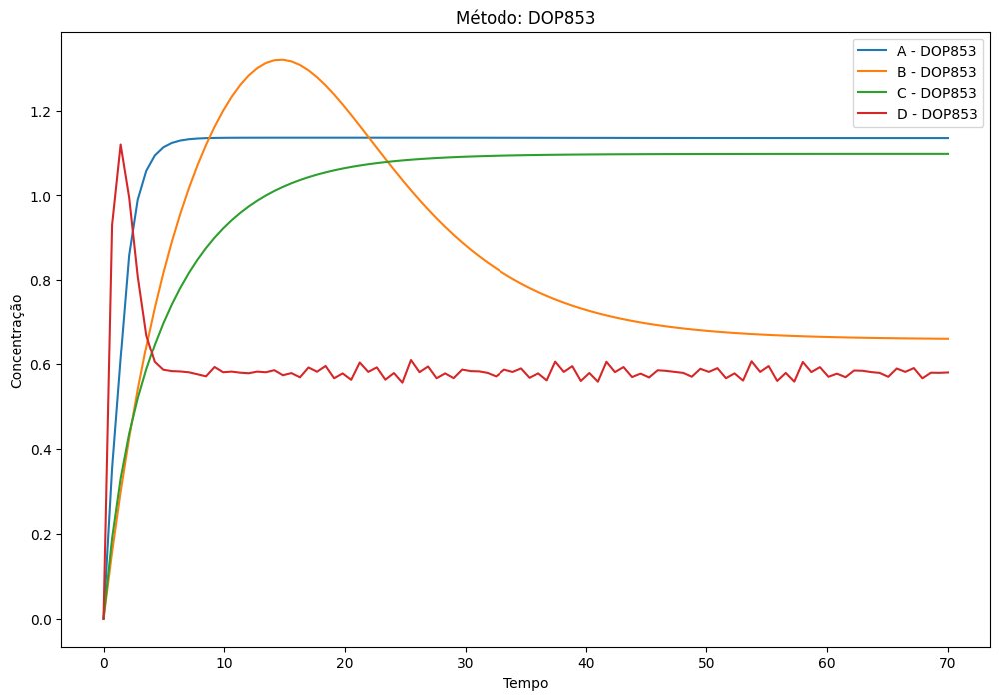

Sigma increased due to no improvement. New sigma: 5.337515116760993535, 'min': 0.10694622206840426, 'max': 0.5953638056599072}}
Sigma increased due to no improvement. New sigma: 1 0.0001869136569307379, 'min': 0.04310766124884462, 'max': 0.04371918540096725}5}}}
Sigma increased due to no improvement. New sigma: 1.6260830157306208035544, 'min': 0.04359625562492106, 'max': 0.04534902287362}76}}


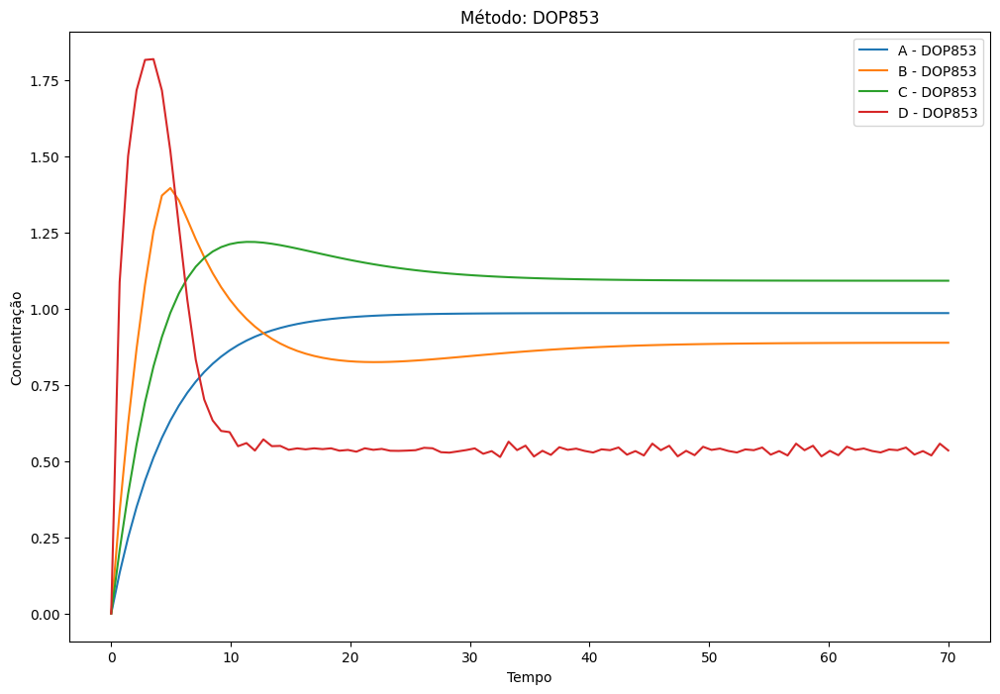

Sigma increased due to no improvement. New sigma: 1: 8.655821427933292e-05, 'min': 0.03810891943390187, 'max': 0.03840747032782547}}}}}
Sigma increased due to no improvement. New sigma: 1': 0.00022469603920667795, 'min': 0.03193326940139011, 'max': 0.032723905206937305}}
Sigma increased due to no improvement. New sigma: 1.95316539425283242367673, 'min': 0.031671711474475304, 'max': 0.032342014851640254}
Sigma increased due to no improvement. New sigma: 5.1739889223311987301, 'min': 0.03183017145411925, 'max': 0.7409754888804091}7445}}}


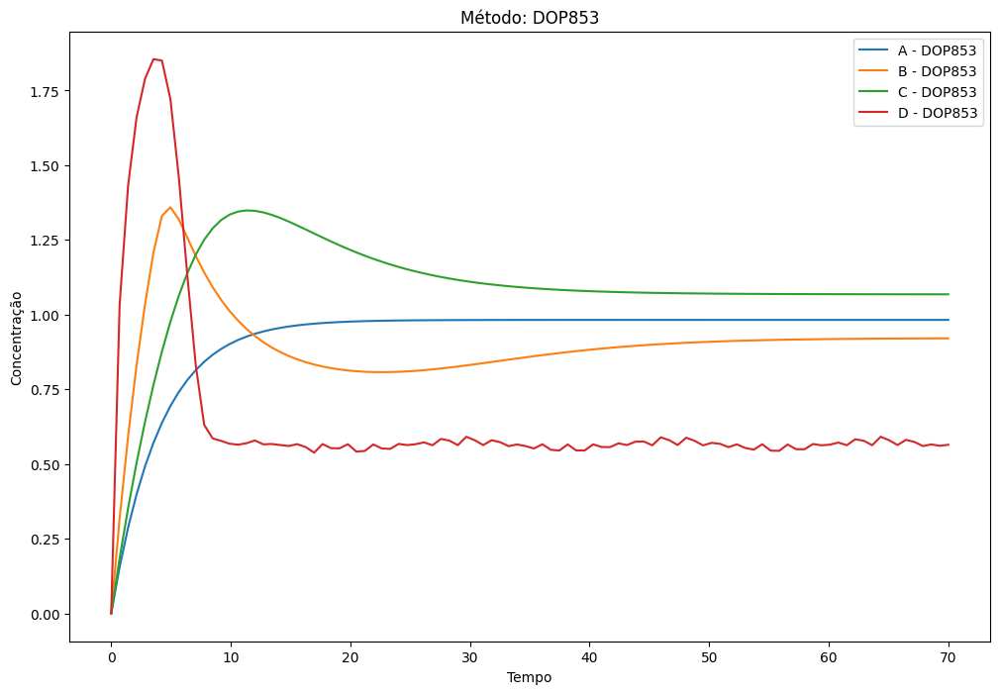

Sigma increased due to no improvement. New sigma: 10.5900899021483351825, 'min': 0.03234700432548908, 'max': 0.7775845751156243}}2}}
Sigma increased due to no improvement. New sigma: 15 0.04818728170315233, 'min': 0.03544469654382998, 'max': 0.2250820122944036}}}
Sigma increased due to no improvement. New sigma: 15 0.08710389191006702, 'min': 0.036577553007305495, 'max': 0.36944828223409326}5}
Sigma increased due to no improvement. New sigma: 15: 0.0021028326663681185, 'min': 0.034143061462985055, 'max': 0.04063632602976744}
Sigma increased due to no improvement. New sigma: 15 0.1883552780085707, 'min': 0.0426029423817034, 'max': 0.7534633996009349}5}5}}1}
Sigma increased due to no improvement. New sigma: 150.1633790694172548, 'min': 0.03822958125613686, 'max': 0.655525213292896}1}}}6}


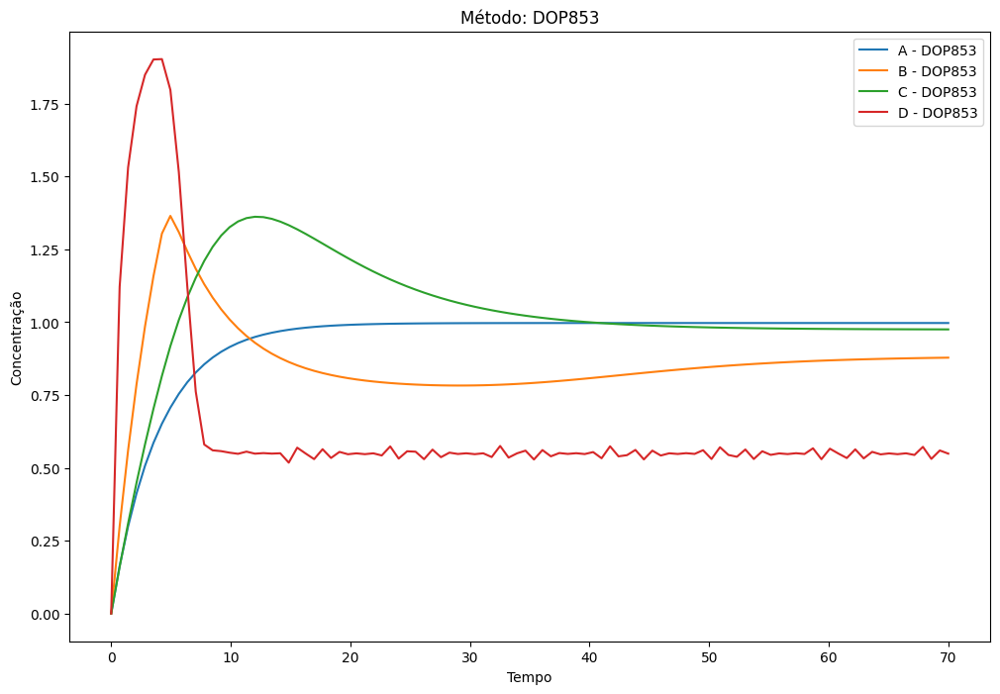

Sigma increased due to no improvement. New sigma: 3.415509773403409415832873, 'min': 0.02886285615556232, 'max': 0.02965582517341809}}}
Sigma increased due to no improvement. New sigma: 1.875677031807103251738, 'min': 0.027526810673649243, 'max': 0.076240656828372}8895}}
Sigma increased due to no improvement. New sigma: 3.3419942524735412778e-05, 'min': 0.027288161467309835, 'max': 0.02764234487799539}3}


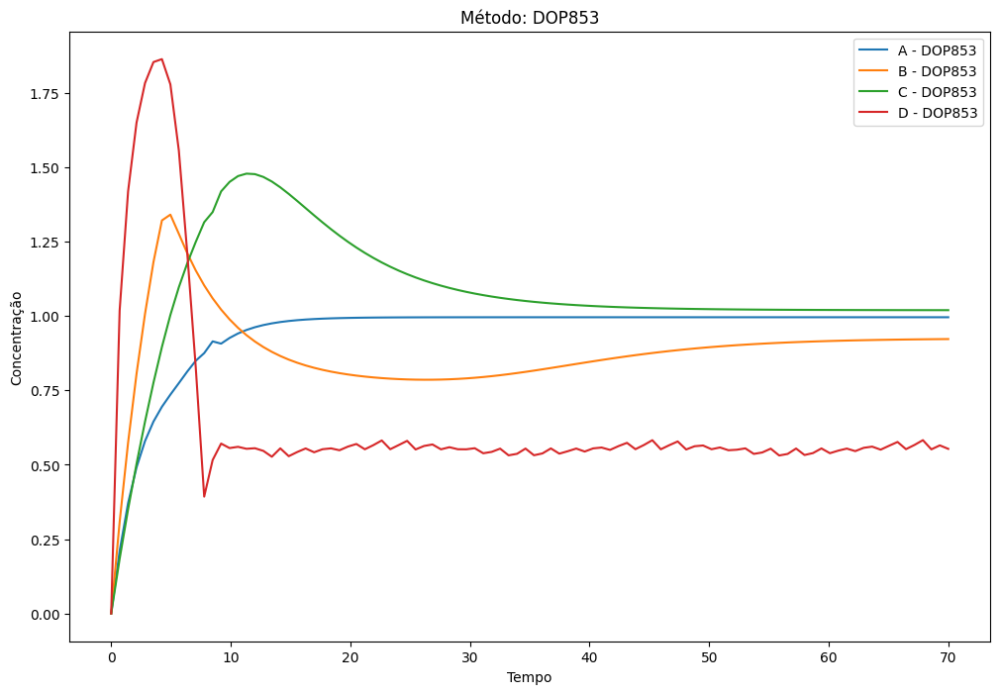

Sigma increased due to no improvement. New sigma: 9.794317079659654383734, 'min': 0.026816825357629658, 'max': 0.07050342300278595}22}}
Sigma increased due to no improvement. New sigma: 12.94953025329691235130711, 'min': 0.027533251864771326, 'max': 0.028097161823430278}
Force-stopping DOP853 for seed 4, error MSE due to timeout.23515421882074042, 'min': 0.026912101790918817, 'max': 0.02778026791485714}}
Skipping already processed: seed=4, error=MSE, method=LSODA
Skipping already processed: seed=4, error=MABS, method=RK45
Skipping already processed: seed=4, error=MABS, method=DOP853
Skipping already processed: seed=4, error=MABS, method=LSODA
Skipping already processed: seed=5, error=ABS, method=RK45
Solver: DOP853, Error: ABS
Timeout reached for DOP853 on seed 4, error MSEstd': 0.0003468672489773464, 'min': 0.026905208323547772, 'max': 0.028318845458236222}


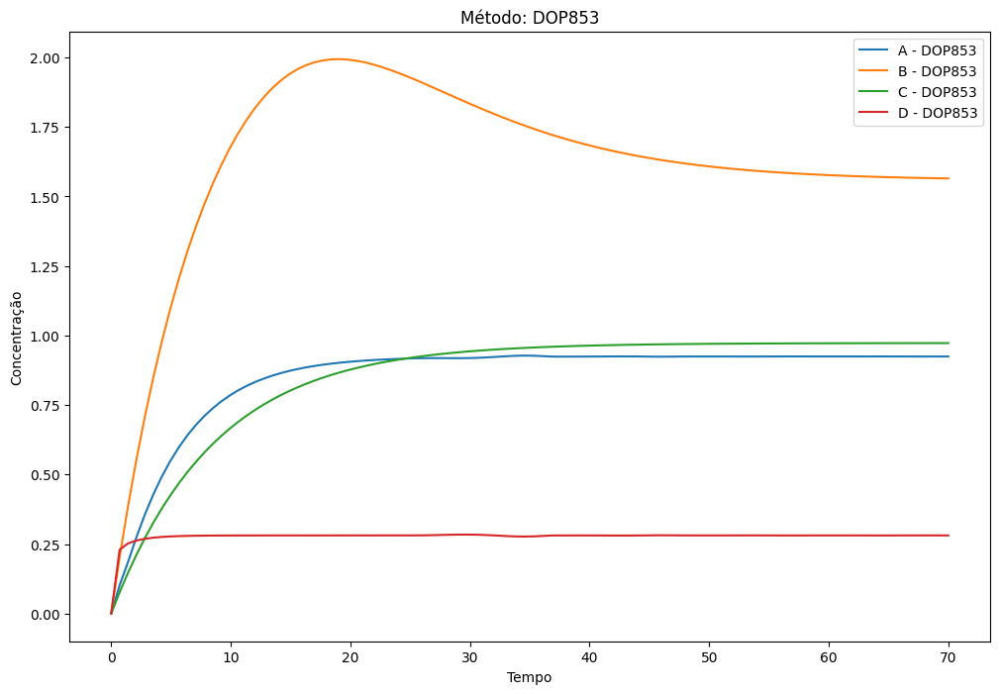

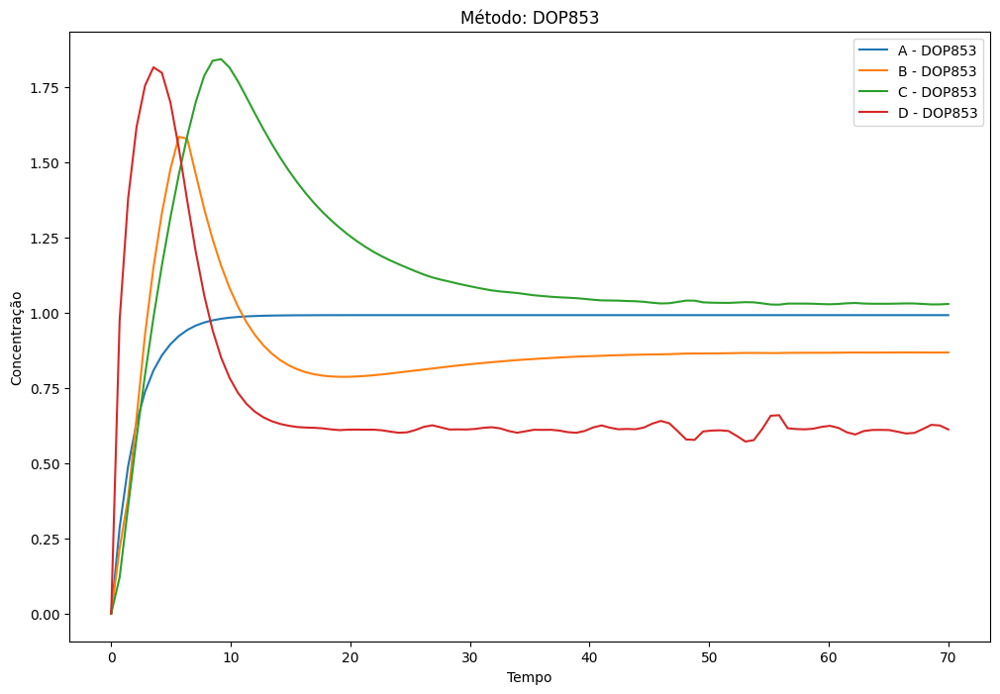

Sigma increased due to no improvement. New sigma: 10.07266434787913939, 'min': 35.8782318362832, 'max': 36.09108947394582}}2}
Sigma increased due to no improvement. New sigma: 2.9290063350932143, 'min': 49.92692613011152, 'max': 63.280790068682805}}
Sigma increased due to no improvement. New sigma: 5.135626819787365, 'min': 55.330286681681514, 'max': 78.55508432974534}}}}
Sigma increased due to no improvement. New sigma: 5.5305547899645315, 'min': 56.643915173811855, 'max': 110.01951639117462}
Sigma increased due to no improvement. New sigma: 10.1484100741715528, 'min': 57.36316011165003, 'max': 381.5607870564247}}
Sigma increased due to no improvement. New sigma: 11.749204838620933, 'min': 70.61648543492963, 'max': 347.187766056923}22}}
Sigma increased due to no improvement. New sigma: 12.575241448826679 'min': 67.40224123200112, 'max': 308.9376803794006}4}7}
Sigma increased due to no improvement. New sigma: 9.275983031360068 'min': 55.41862790588064, 'max': 71.17756340831541}}76}


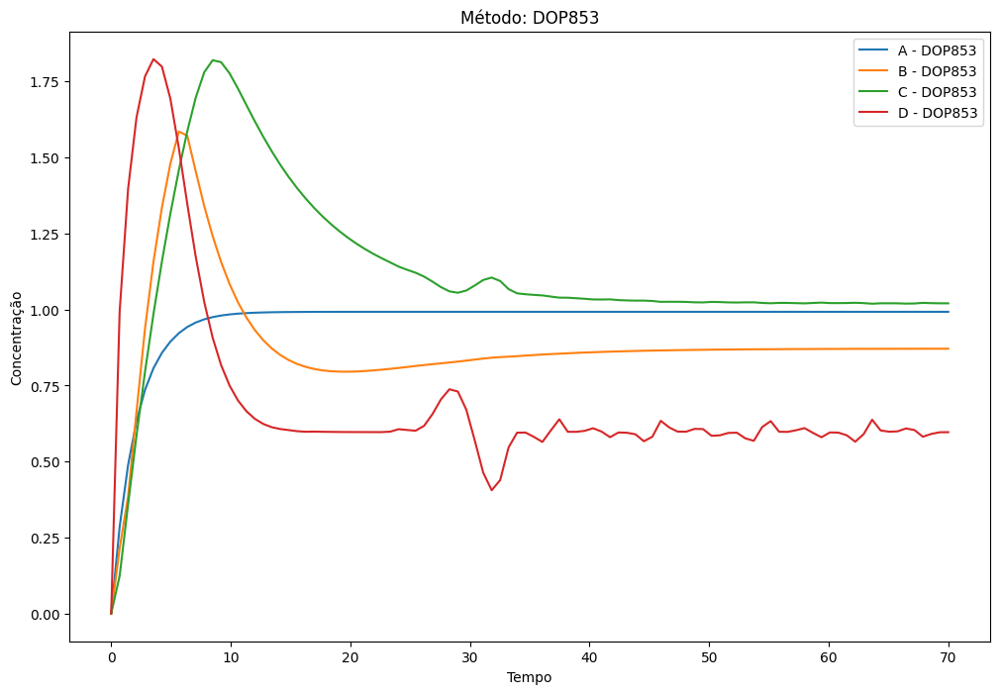

Sigma increased due to no improvement. New sigma: 7.2219939795026956, 'min': 61.35969225500591, 'max': 331.7353327743672}76}
Sigma increased due to no improvement. New sigma: 12.818308094918665, 'min': 51.64829832840594, 'max': 205.47837155046346}}}
Sigma increased due to no improvement. New sigma: 14.923953863585612, 'min': 54.33058764282915, 'max': 180.83665864391472}5}
Sigma increased due to no improvement. New sigma: 11.58040979482990325, 'min': 45.95946275243435, 'max': 62.00485003434006}}
Sigma increased due to no improvement. New sigma: 11.442790060293547, 'min': 50.08418014149374, 'max': 55.45338349702597}}}}}
Sigma increased due to no improvement. New sigma: 13.7949932355402754, 'min': 50.33091056836123, 'max': 67.21533944616432}}}
Sigma increased due to no improvement. New sigma: 15.667665519902856, 'min': 45.666451388672, 'max': 66.30905574459504}8}}}}}
Sigma increased due to no improvement. New sigma: 15.777893680566761, 'min': 54.69800035897731, 'max': 73.41445975795492}}}

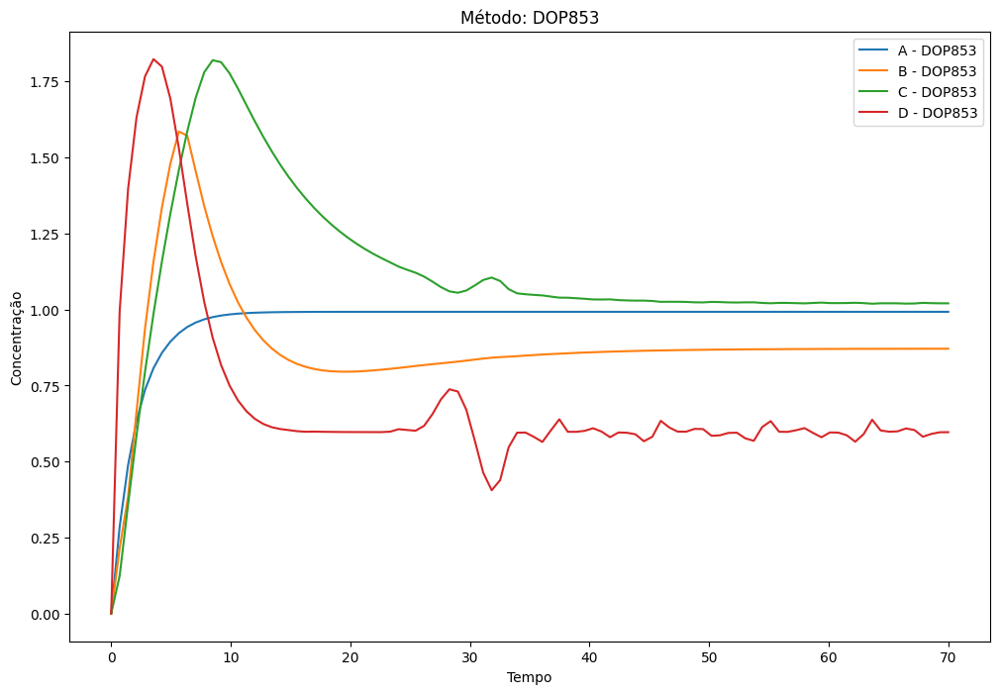

Sigma increased due to no improvement. New sigma: 153.191074793229284, 'min': 47.371684530006945, 'max': 58.29867500256918}}}
Sigma increased due to no improvement. New sigma: 15.7329075031513483, 'min': 51.88547085891762, 'max': 58.414741598553476}}
Sigma increased due to no improvement. New sigma: 15.070020865308273, 'min': 38.591374063736474, 'max': 70.76878827212525}}}
Sigma increased due to no improvement. New sigma: 15.5327217225611256, 'min': 46.93646723066264, 'max': 52.3457040337989}}}}
Sigma increased due to no improvement. New sigma: 152.355841762825509, 'min': 45.45539182906319, 'max': 52.413932414211295}}}
Sigma increased due to no improvement. New sigma: 15.7656098512508964, 'min': 39.728673550016666, 'max': 52.68918197247701}}
Sigma increased due to no improvement. New sigma: 15.6838035446510573, 'min': 39.36313919516543, 'max': 51.943324979446096}}}


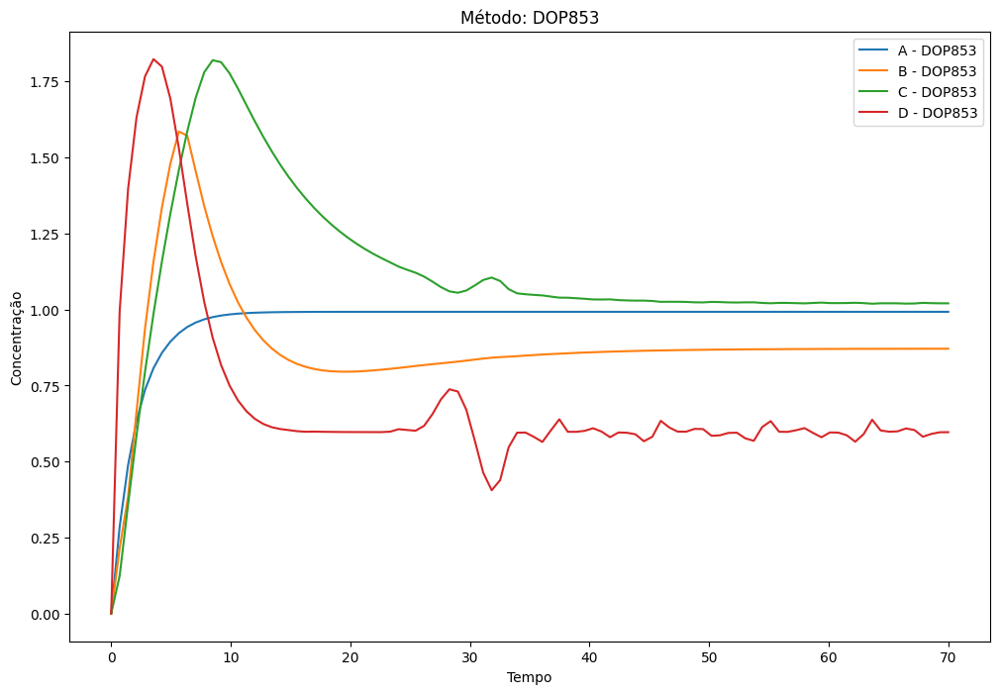

Sigma increased due to no improvement. New sigma: 15837307964468884, 'min': 38.91228724357912, 'max': 65.815873714155}61}}}}
Sigma increased due to no improvement. New sigma: 157.82341973299199, 'min': 37.15241939678208, 'max': 197.58105348622396}2}}
Sigma increased due to no improvement. New sigma: 154.11643948733395, 'min': 37.91253206785634, 'max': 87.36905398915675}}}}
Sigma increased due to no improvement. New sigma: 1517.905468196671862, 'min': 36.78755607815483, 'max': 106.79154871707168}
Sigma increased due to no improvement. New sigma: 15.5474306865844686, 'min': 41.548789789516974, 'max': 43.646432816653316}}
Sigma increased due to no improvement. New sigma: 1512.339007102823246, 'min': 37.7221715916891, 'max': 84.76717416948628}}}
Force-stopping DOP853 for seed 5, error ABS due to timeout.16736175, 'min': 45.41746364755486, 'max': 221.68487334236698}6}}
Skipping already processed: seed=5, error=ABS, method=LSODA
Skipping already processed: seed=5, error=SQUARED, method=RK45


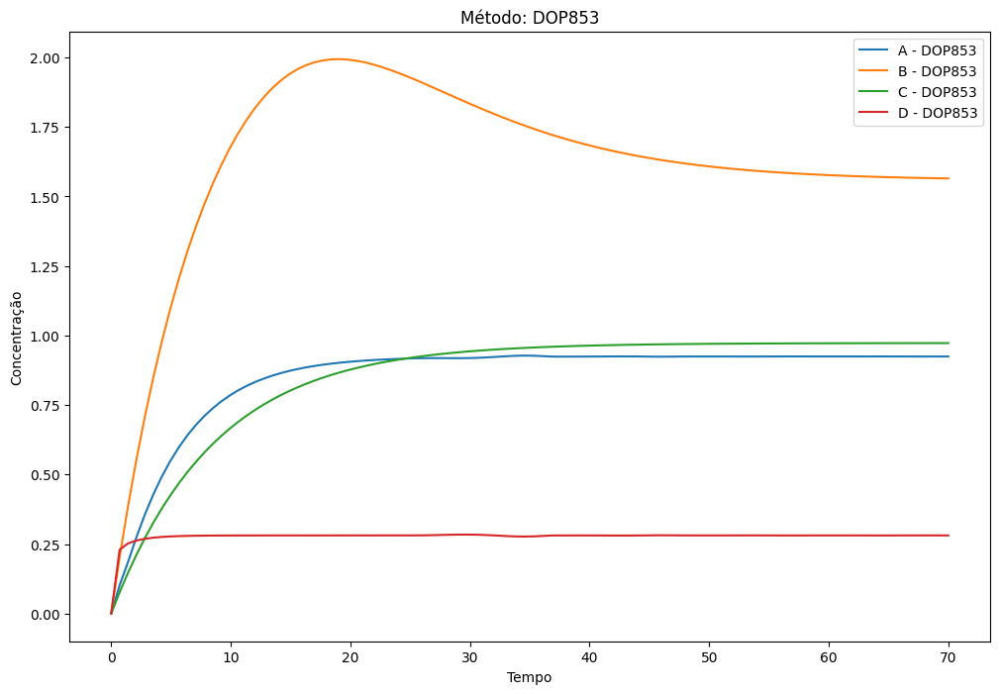

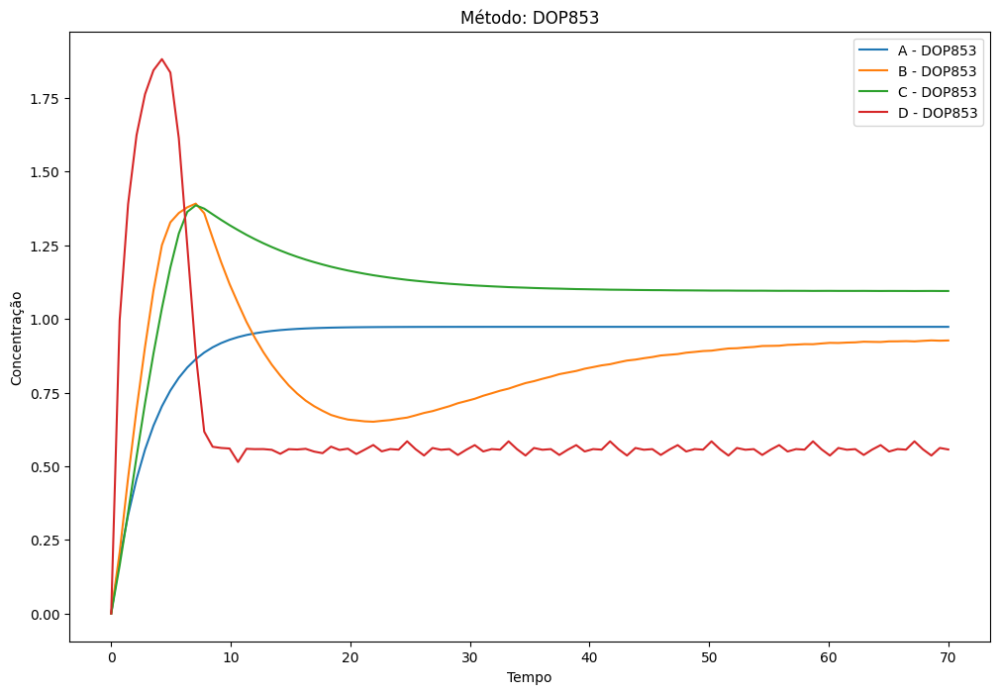

Sigma increased due to no improvement. New sigma: 1: 0.0001431140159255714, 'min': 0.03018278208194136, 'max': 0.03076533320098564}}}}
Sigma increased due to no improvement. New sigma: 2.2364645308653481116, 'min': 0.04660335274853388, 'max': 0.14009051314817744}}21}
Sigma increased due to no improvement. New sigma: 11.627514081475756053, 'min': 0.04809265611598783, 'max': 0.3950990029962152}}


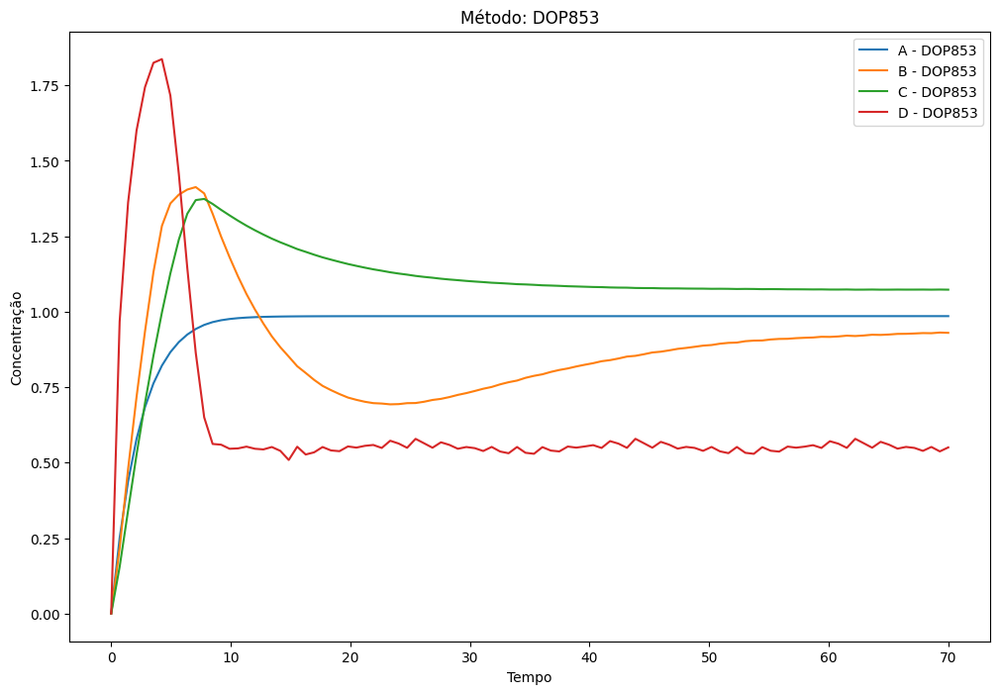

Sigma increased due to no improvement. New sigma: 150.2924072560839008, 'min': 0.08493794170538344, 'max': 1.1709672060513474}}6}
Sigma increased due to no improvement. New sigma: 11.96515948813765129, 'min': 0.0860214786915043, 'max': 0.6909042509798475}5}}}
Sigma increased due to no improvement. New sigma: 9.083164146708251051032, 'min': 0.04909774234595567, 'max': 0.09045624064208821}}
Sigma increased due to no improvement. New sigma: 8.695688345169314809877, 'min': 0.07741081394836584, 'max': 0.09696897356937298}}
Sigma increased due to no improvement. New sigma: 5.08059669609891584482, 'min': 0.04047084145486759, 'max': 0.05988758321884606}885}
Sigma increased due to no improvement. New sigma: 11.764253771821458787, 'min': 0.07314252480996056, 'max': 0.28301675966000434}7}
Sigma increased due to no improvement. New sigma: 10.708982543721365755095, 'min': 0.03842342912892341, 'max': 0.04968255216582031}
Sigma increased due to no improvement. New sigma: 10.03002217315474599197, 'min

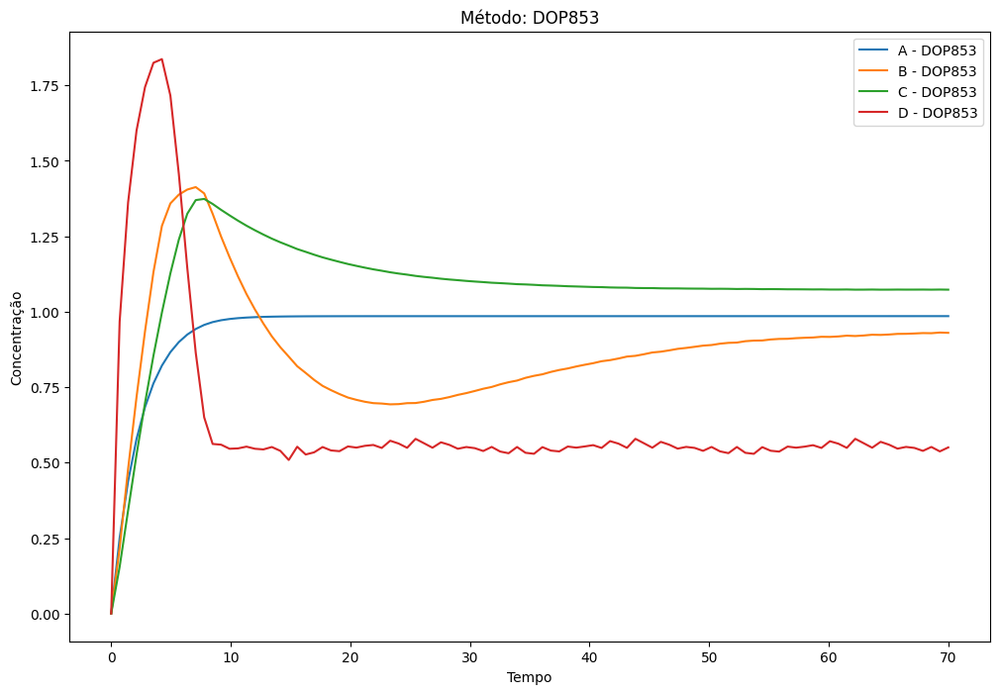

Sigma increased due to no improvement. New sigma: 11.2171432023982320922, 'min': 0.03148430824297038, 'max': 0.5386048722426497}}}}
Sigma increased due to no improvement. New sigma: 14.6944609117308291827, 'min': 0.031656834464230184, 'max': 0.27441956868770395}}
Sigma increased due to no improvement. New sigma: 15: 0.06176127275682441, 'min': 0.037059565984643016, 'max': 0.2735939784208992}}5}
Sigma increased due to no improvement. New sigma: 15 0.011598637400048843, 'min': 0.03435845476414612, 'max': 0.07599432676429481}1}


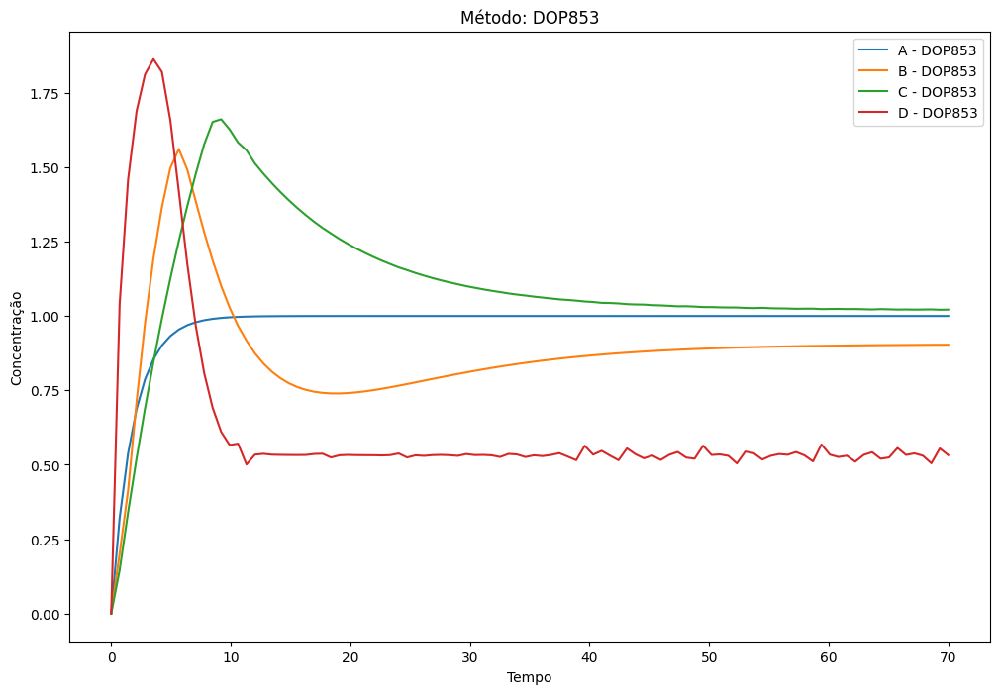

Force-stopping DOP853 for seed 5, error MSE due to timeout.8543277817166e-05, 'min': 0.024038504322362052, 'max': 0.02410362313661918}}
Skipping already processed: seed=5, error=MSE, method=LSODA
Skipping already processed: seed=5, error=MABS, method=RK45
Skipping already processed: seed=5, error=MABS, method=DOP853
Skipping already processed: seed=5, error=MABS, method=LSODA
Skipping already processed: seed=6, error=ABS, method=RK45
Solver: DOP853, Error: ABS
Timeout reached for DOP853 on seed 5, error MSE'std': 2.1954981612127598e-05, 'min': 0.02403626292425829, 'max': 0.024117510906259423}


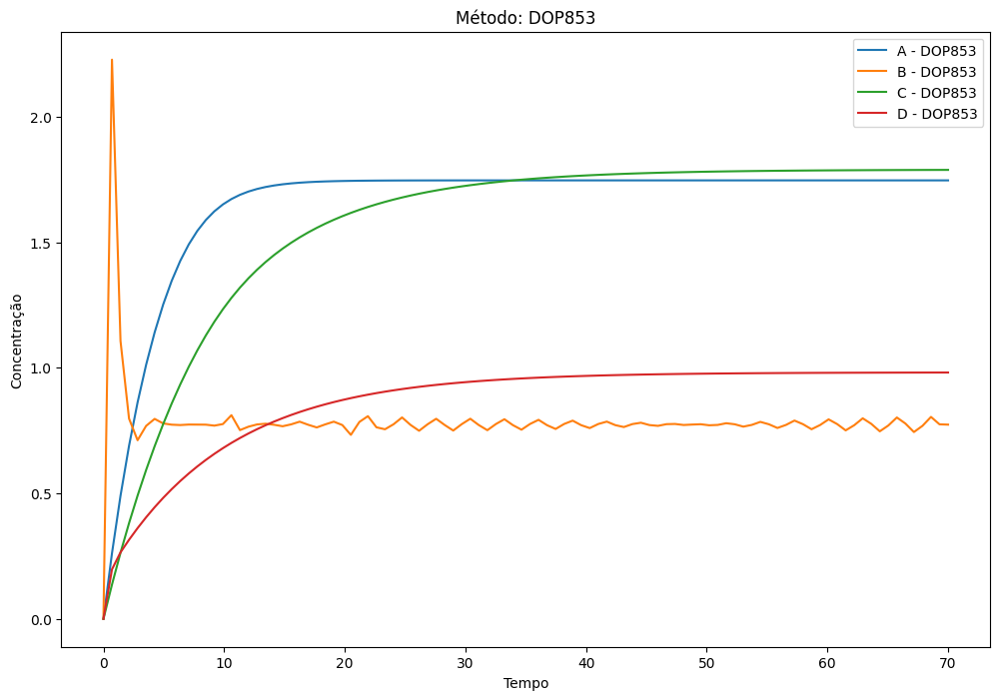

Sigma increased due to no improvement. New sigma: 1.8832950401147883, 'min': 58.193596408952274, 'max': 71.0811811429015}7}}
Sigma increased due to no improvement. New sigma: 1.860146695240561, 'min': 52.44007088907647, 'max': 63.354071762509314}5}}
Sigma increased due to no improvement. New sigma: 2.7665222934640257, 'min': 61.74538120575436, 'max': 310.70648476582033}6}


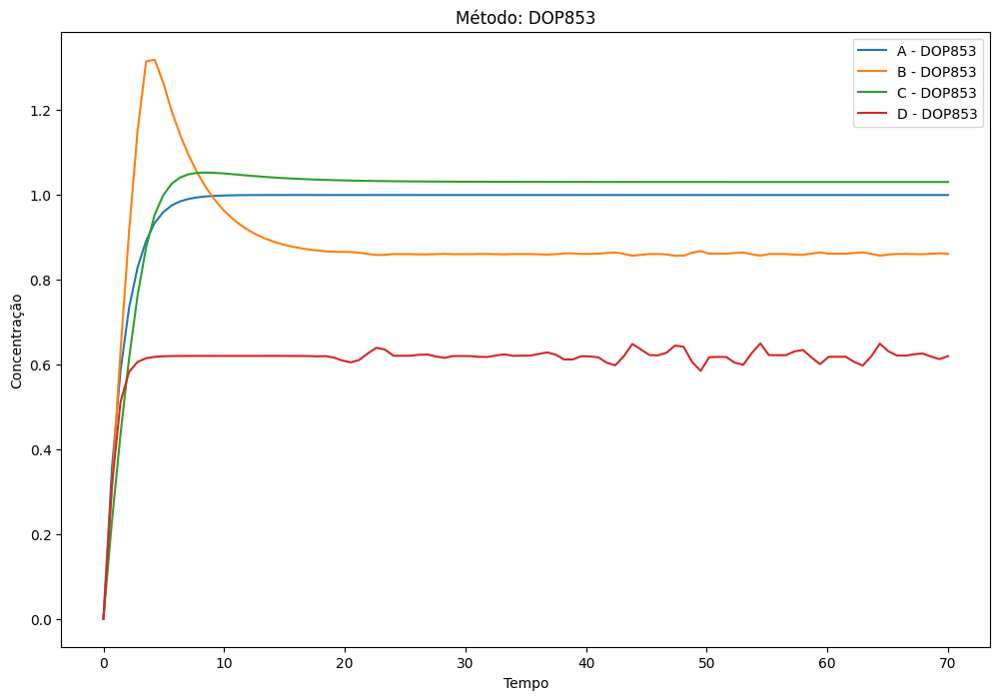

Sigma increased due to no improvement. New sigma: 6.52998211958491467, 'min': 68.57939321837529, 'max': 153.03314607097366}
Sigma increased due to no improvement. New sigma: 11.3133742268589285, 'min': 96.37091689061079, 'max': 136.25673704741862}}
Sigma increased due to no improvement. New sigma: 13.853076345107613 'min': 83.39447469061008, 'max': 253.68112097019022}}}
Sigma increased due to no improvement. New sigma: 13.687255546068297, 'min': 54.62829771079725, 'max': 355.2394317375519}}}}
Sigma increased due to no improvement. New sigma: 9.5700654659436166, 'min': 61.26874456955372, 'max': 74.56353112369955}}}
Sigma increased due to no improvement. New sigma: 7.038448463228823, 'min': 57.11876309453182, 'max': 118.66623587778517}7}
Sigma increased due to no improvement. New sigma: 12.555160378093191, 'min': 55.278383651889506, 'max': 152.55664134831343}}
Sigma increased due to no improvement. New sigma: 11.314030703372262, 'min': 57.05016452052418, 'max': 91.67362845837482}}}
Sigma

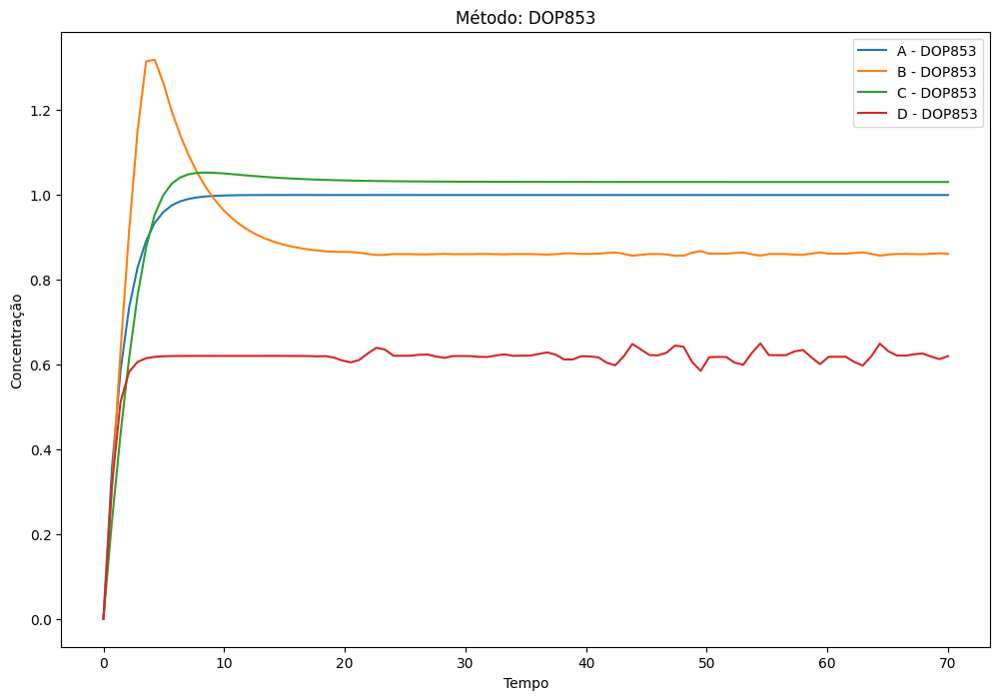

Sigma increased due to no improvement. New sigma: 15104.60779724587276, 'min': 89.28408566208824, 'max': 511.80356348443087}}
Sigma increased due to no improvement. New sigma: 15192741409530278, 'min': 56.98513418301626, 'max': 78.58438469824708}63}}
Sigma increased due to no improvement. New sigma: 156.785541058096964, 'min': 55.36044414751471, 'max': 109.50809939228074}}
Sigma increased due to no improvement. New sigma: 154.88448803690644, 'min': 61.14402467698829, 'max': 255.59213588516167}5}
Sigma increased due to no improvement. New sigma: 11.552940519753133 'min': 51.76288702374712, 'max': 57.406672374977}70034}}


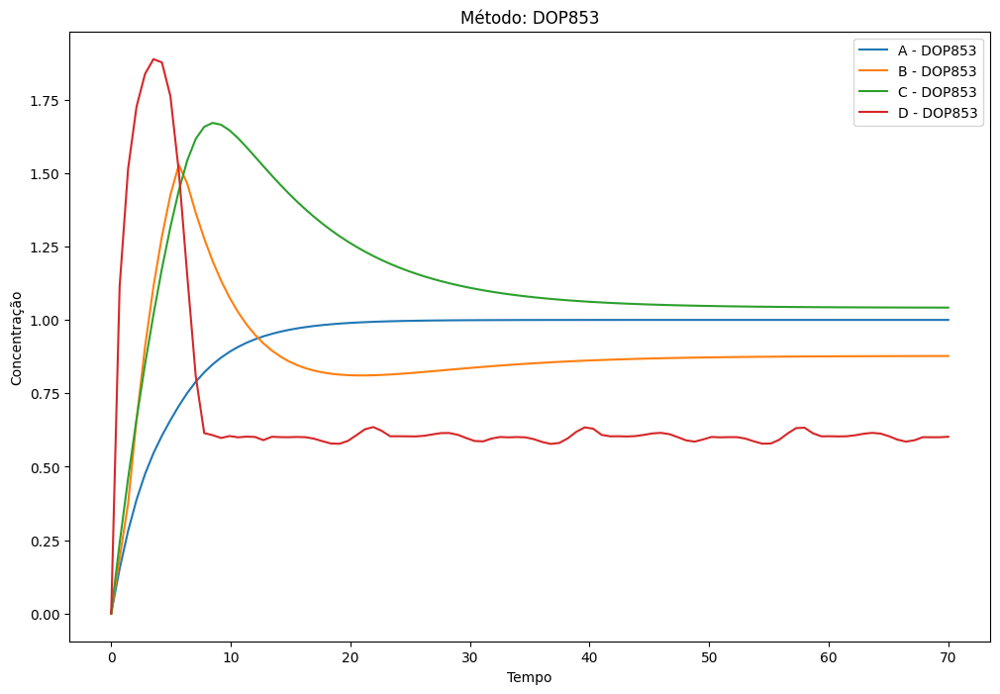

Sigma increased due to no improvement. New sigma: 10.24238496474592378, 'min': 37.431042582598934, 'max': 38.43900284313627}}}
Sigma increased due to no improvement. New sigma: 2.335084740770995385, 'min': 37.10283037605487, 'max': 38.169351911778335}}
Sigma increased due to no improvement. New sigma: 8.08689415172547302, 'min': 37.38341334977952, 'max': 41.67796469006401}}5}


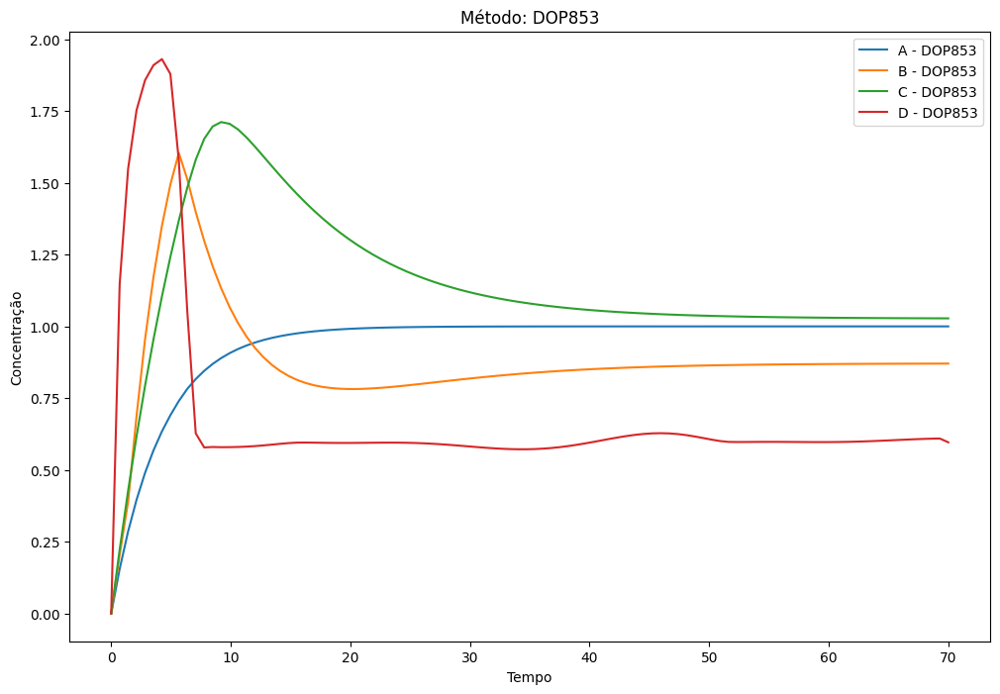

Force-stopping DOP853 for seed 6, error ABS due to timeout.790095330643, 'min': 35.8207934067742, 'max': 36.606495001052814}}}
Skipping already processed: seed=6, error=ABS, method=LSODA
Skipping already processed: seed=6, error=SQUARED, method=RK45
Solver: DOP853, Error: SQUARED
Timeout reached for DOP853 on seed 6, error ABSd': 0.26222669096979334, 'min': 35.83624385811796, 'max': 36.80121502547905}


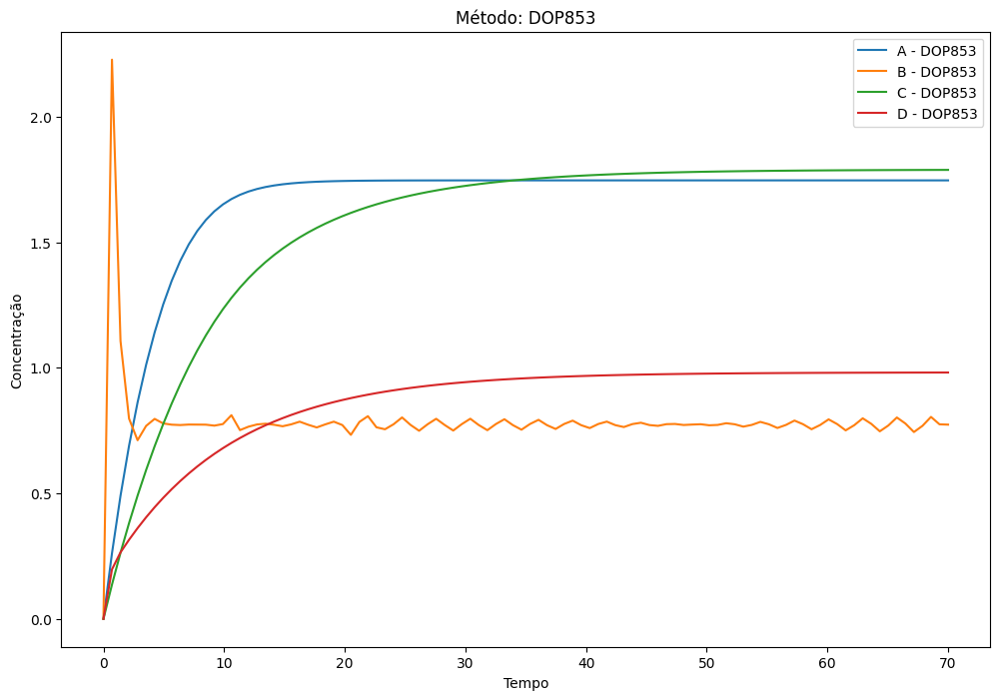

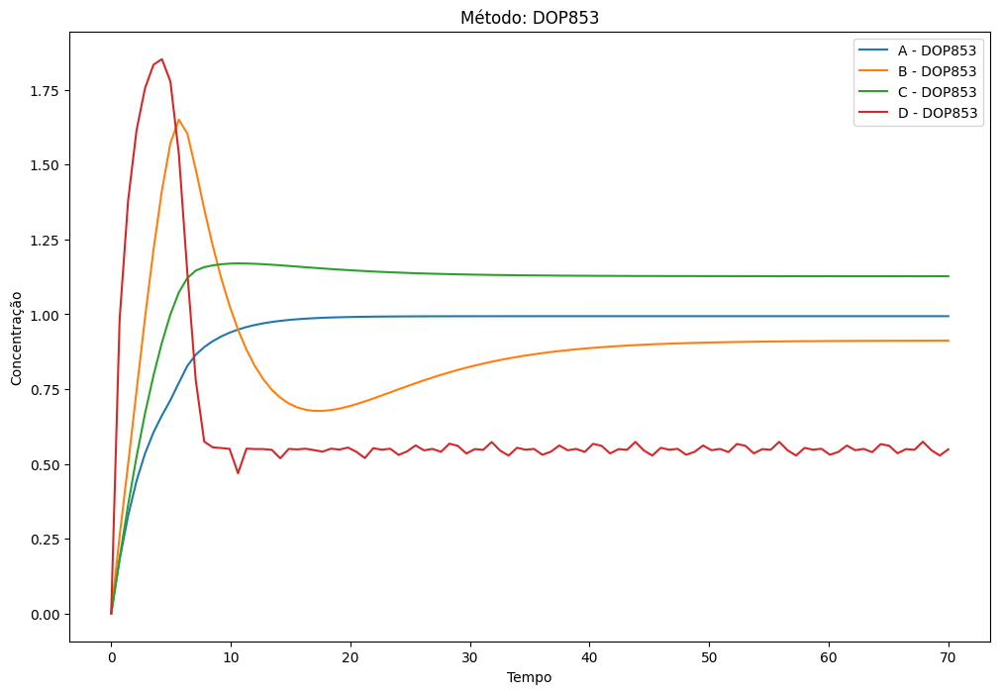

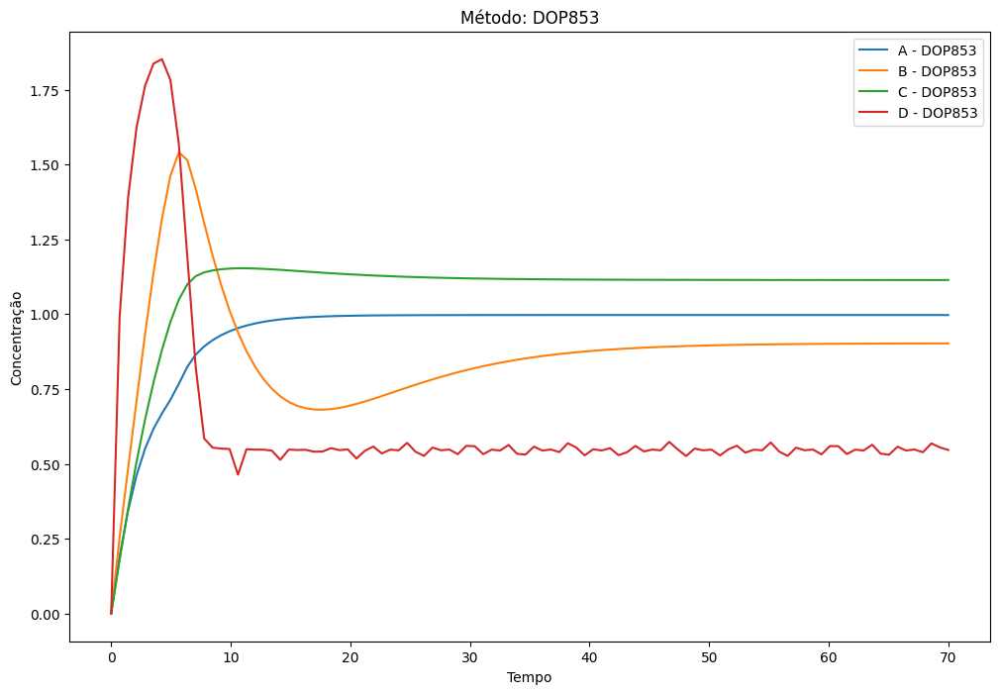

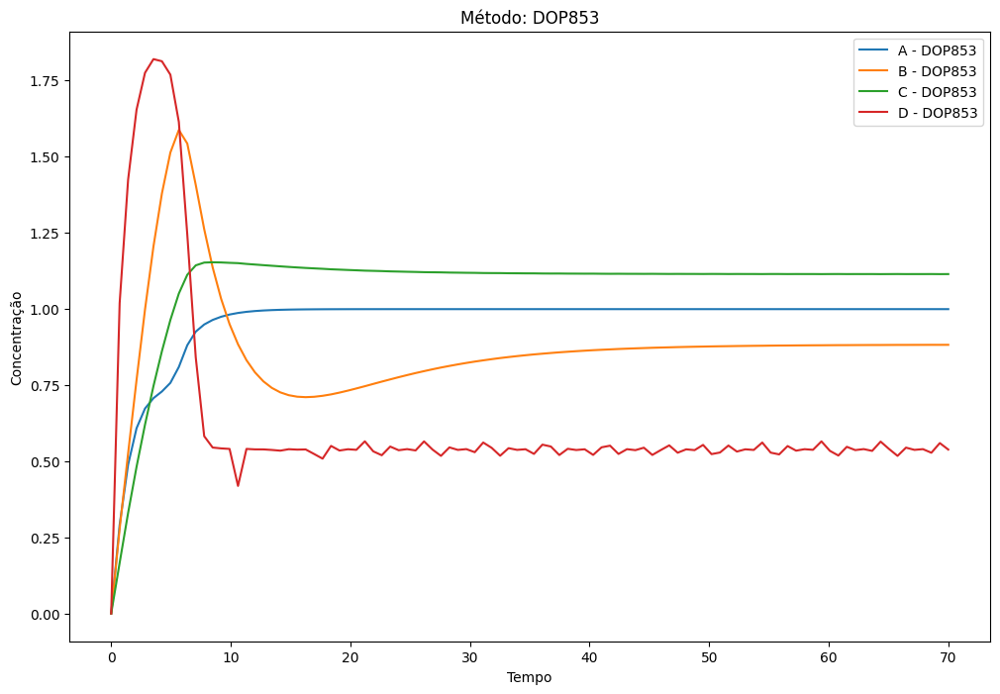

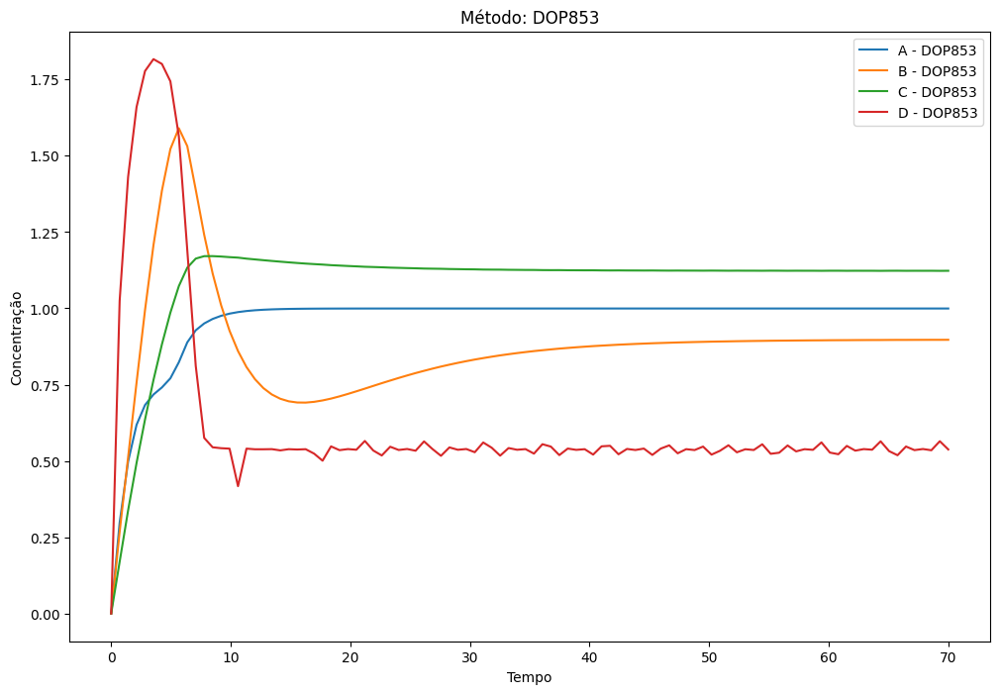

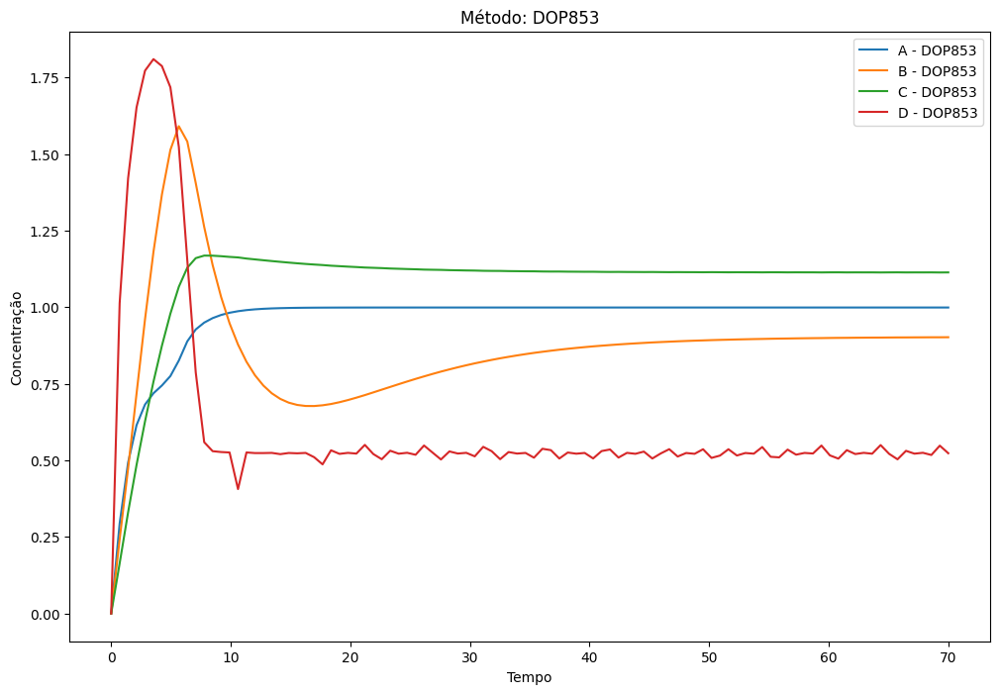

Force-stopping DOP853 for seed 6, error SQUARED due to timeout.664285636, 'min': 3.623145141216882, 'max': 3.637913279252277}4}}
Skipping already processed: seed=6, error=SQUARED, method=LSODA
Solver: RK45, Error: MSE
Timeout reached for DOP853 on seed 6, error SQUARED 0.005697581564435266, 'min': 3.6231601981353445, 'max': 3.639115694862463}


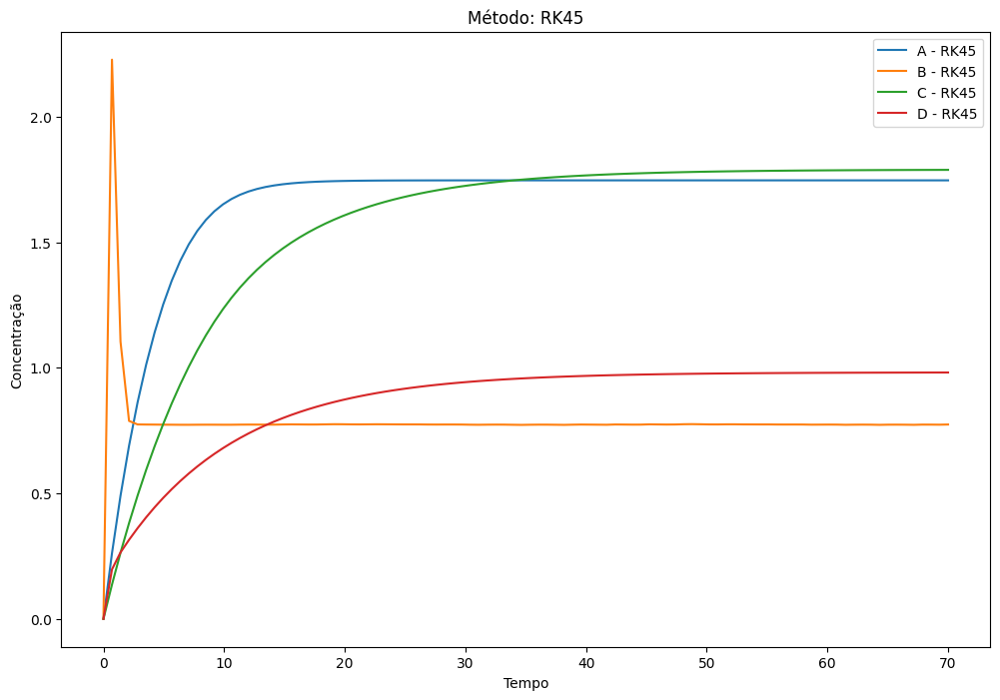

Sigma increased due to no improvement. New sigma: 2.5518093397630212209, 'min': 0.16037858371376865, 'max': 0.24386748535444305}


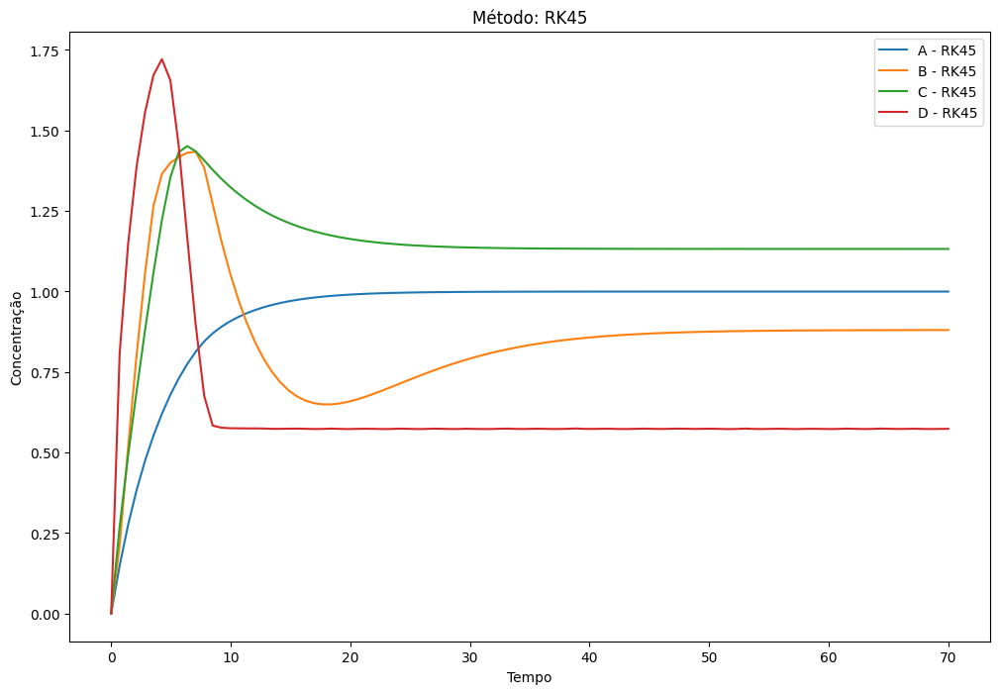

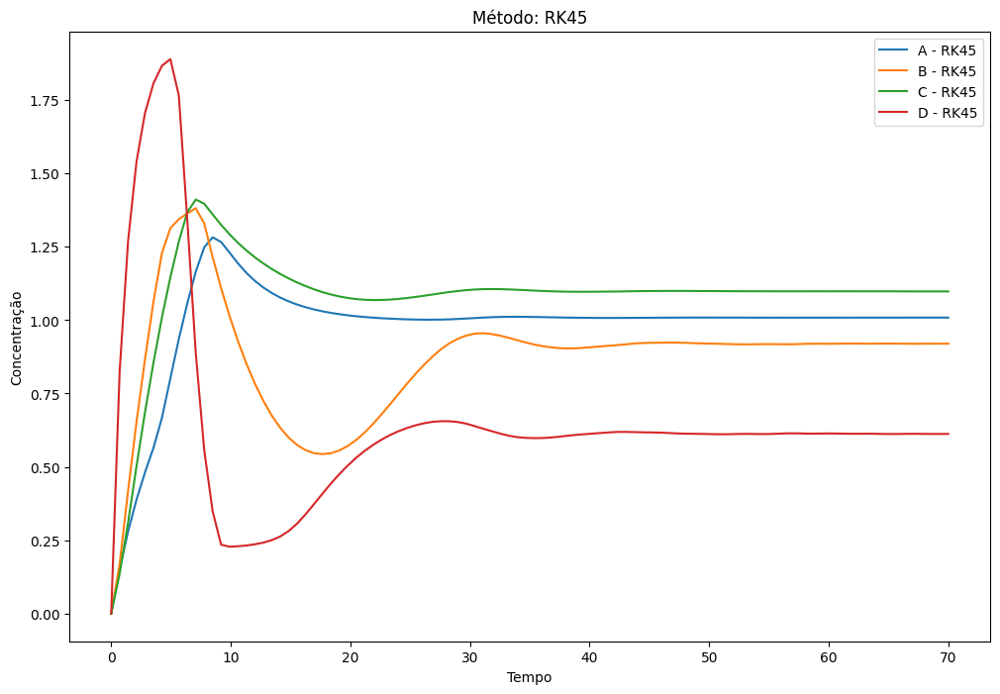

Sigma increased due to no improvement. New sigma: 1': 0.00012158693614724135, 'min': 0.02651620978747549, 'max': 0.026931570871027946}}
Sigma increased due to no improvement. New sigma: 150.6390201022026919, 'min': 0.0804961483694468, 'max': 2.4023056426732454}55}}7495}
Sigma increased due to no improvement. New sigma: 150.5427025969697021, 'min': 0.08679606187586099, 'max': 2.0924096089158555}4}}
Sigma increased due to no improvement. New sigma: 11.96224216379599743, 'min': 0.06257569810418884, 'max': 2.1061800219280395}}}}
Sigma increased due to no improvement. New sigma: 150.02751153743021022, 'min': 0.07268948024398848, 'max': 0.17706281302399046}4}
Sigma increased due to no improvement. New sigma: 11.39080183493427670146, 'min': 0.05670113239631867, 'max': 0.13410553540846554}}
Sigma increased due to no improvement. New sigma: 10.412551193573682790175, 'min': 0.05689344310123249, 'max': 0.07654473638245562}
Sigma increased due to no improvement. New sigma: 8.1934162300629372798346

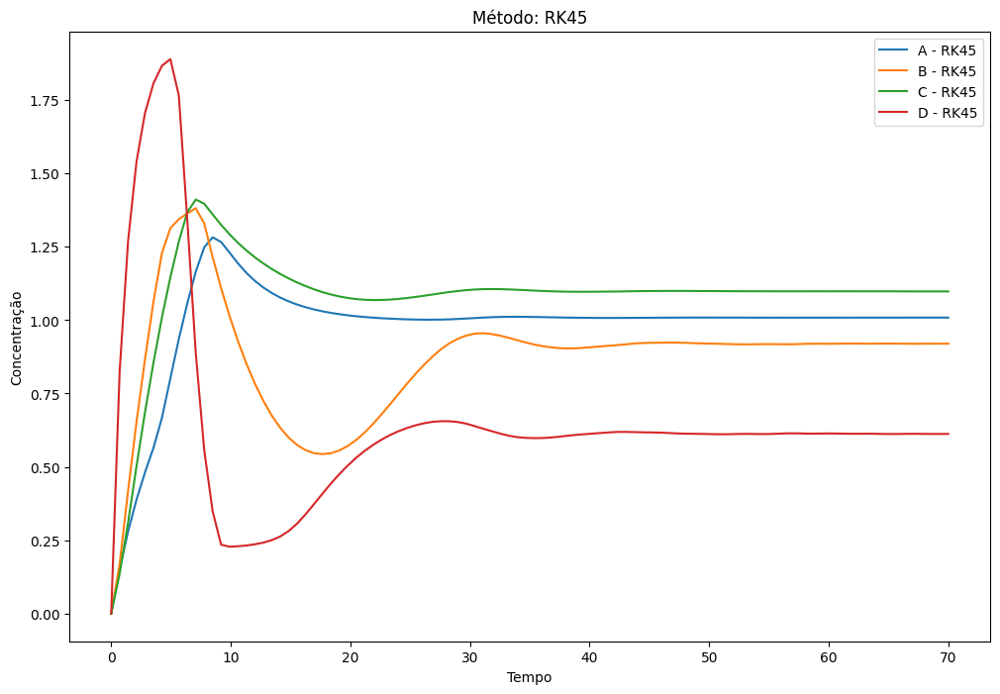

Sigma increased due to no improvement. New sigma: 13.1272986003546331831, 'min': 0.050906283691917215, 'max': 0.07643469284572064}}}}
Sigma increased due to no improvement. New sigma: 11.73139468907801617838, 'min': 0.043122777520627965, 'max': 0.06652894882602686}}
Sigma increased due to no improvement. New sigma: 15: 0.02629253486810263, 'min': 0.04027797883563192, 'max': 0.14341178729429424}}}
Sigma increased due to no improvement. New sigma: 15 0.005215749778112856, 'min': 0.04571671210423177, 'max': 0.06676844286087902}4}
Sigma increased due to no improvement. New sigma: 15: 0.04417346654236527, 'min': 0.03201619878361016, 'max': 0.18079172597608167}}}
Sigma increased due to no improvement. New sigma: 15 0.008582056764162103, 'min': 0.04634774417646802, 'max': 0.0788774869815651}3}}
Sigma increased due to no improvement. New sigma: 15 0.0021811463314307515, 'min': 0.03169949876926615, 'max': 0.04062551062774594}04}


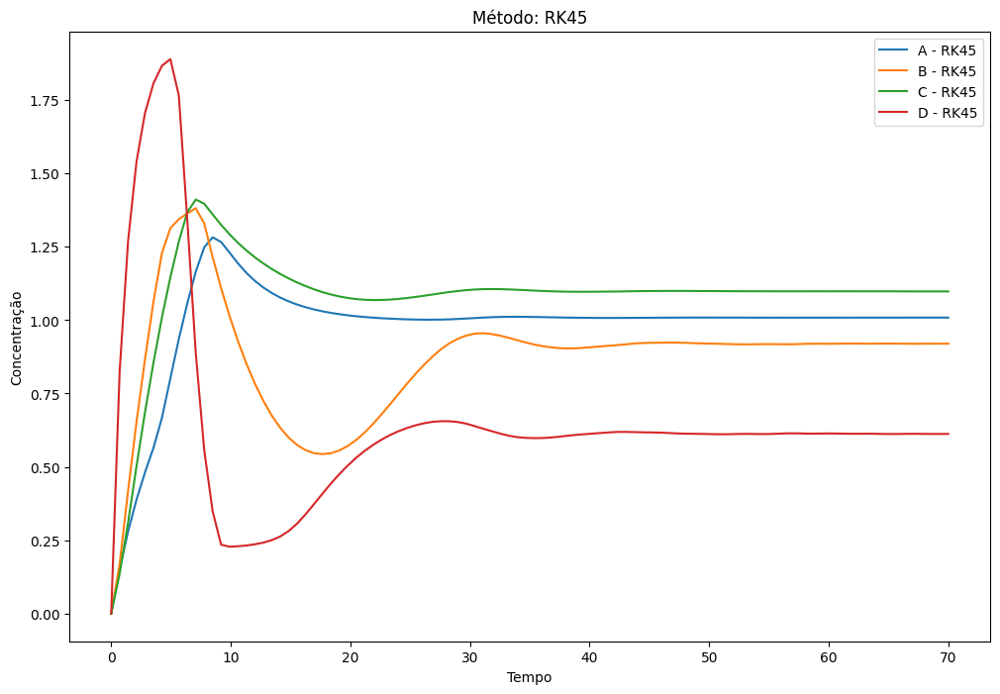

Sigma increased due to no improvement. New sigma: 15 0.22975454255216385, 'min': 0.03182992537551222, 'max': 0.668905137242937}9}91}
Sigma increased due to no improvement. New sigma: 15 0.22498082824388058, 'min': 0.03034814343142406, 'max': 0.6743511552712833}}}6}
Sigma increased due to no improvement. New sigma: 15 0.17618143187941013, 'min': 0.028039829484263742, 'max': 0.6938179262037142}}5}
Sigma increased due to no improvement. New sigma: 15 0.004601357347047875, 'min': 0.03520294956945805, 'max': 0.05057986487851509}}5}}
Sigma increased due to no improvement. New sigma: 15 0.0011057057678479285, 'min': 0.029983876326490543, 'max': 0.03375074156122759}}
Sigma increased due to no improvement. New sigma: 15 0.0023613020957112926, 'min': 0.03267435845163076, 'max': 0.041359669537139945}}}
Timeout reached for RK45 on seed 6, error MSE 'std': 0.0018885773383218105, 'min': 0.039274329950029045, 'max': 0.04630356159186807}}
Force-stopping RK45 for seed 6, error MSE due to timeout.
Skipp

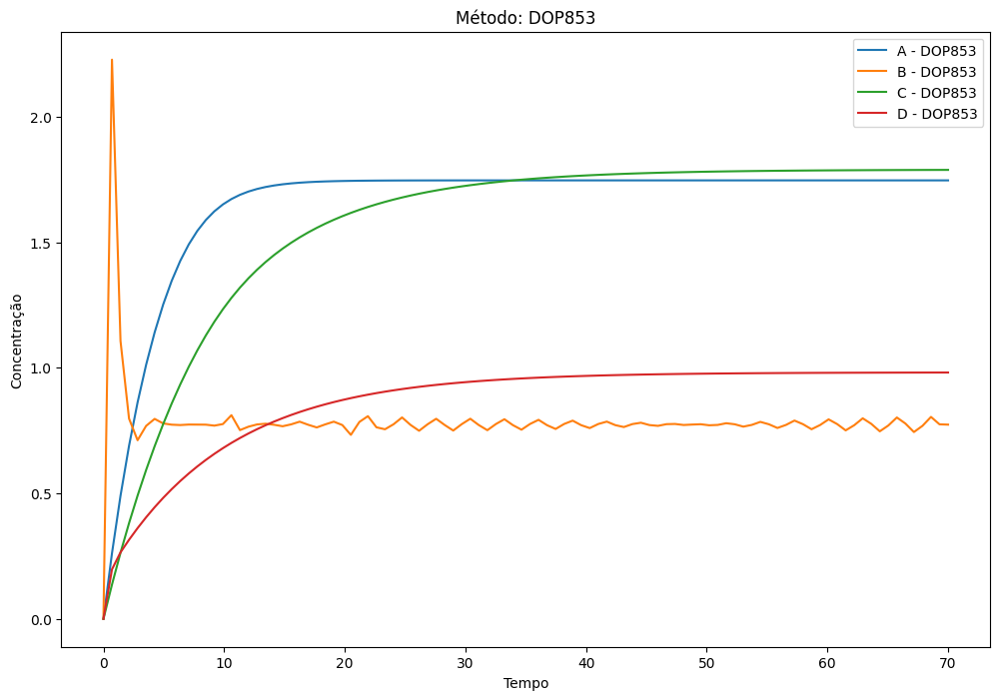

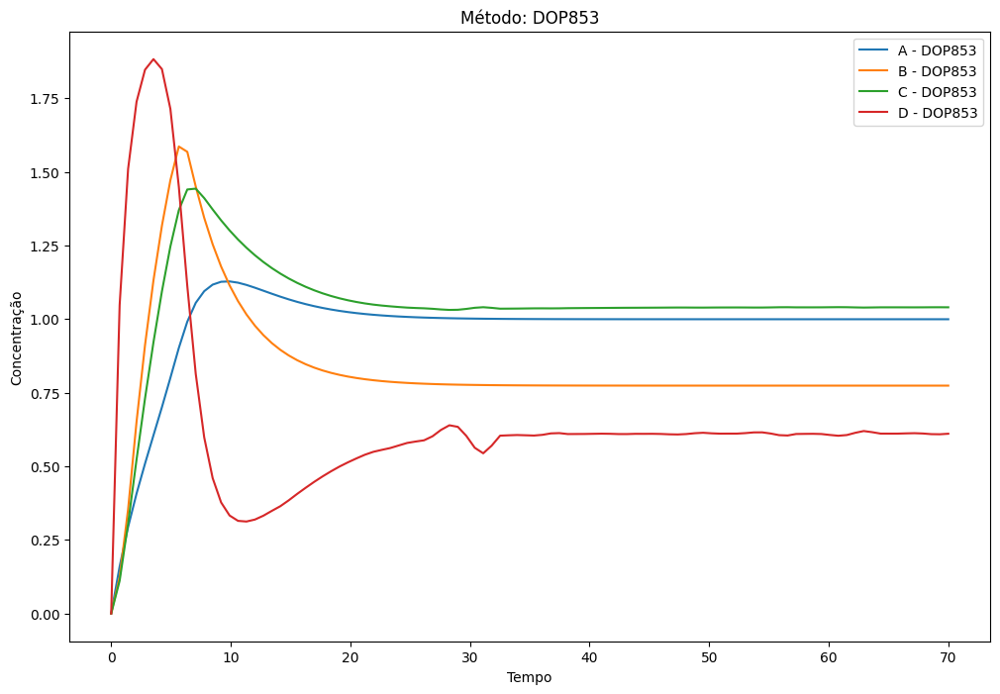

Sigma increased due to no improvement. New sigma: 1 0.00011396505421585076, 'min': 0.10065304503819929, 'max': 0.1010885695381889}}
Sigma increased due to no improvement. New sigma: 2.48850269582114164424, 'min': 0.10956607488440977, 'max': 0.2645136929814519}}
Sigma increased due to no improvement. New sigma: 5.476929833257244828, 'min': 0.1474879038156647, 'max': 0.22440326466415011}}}
Sigma increased due to no improvement. New sigma: 5.14693159736922850137, 'min': 0.12820895709898164, 'max': 0.17835892793050656}
Sigma increased due to no improvement. New sigma: 6.9797255426772615733, 'min': 0.13552078437335552, 'max': 0.2992550190526948}}}
Sigma increased due to no improvement. New sigma: 7.4804446829240495833, 'min': 0.15483514576080062, 'max': 0.37105565116248856}
Sigma increased due to no improvement. New sigma: 5.4952015668230587502, 'min': 0.18367588448418565, 'max': 0.3408509238371096}}}
Sigma increased due to no improvement. New sigma: 5.40574496791935214358, 'min': 0.1081554

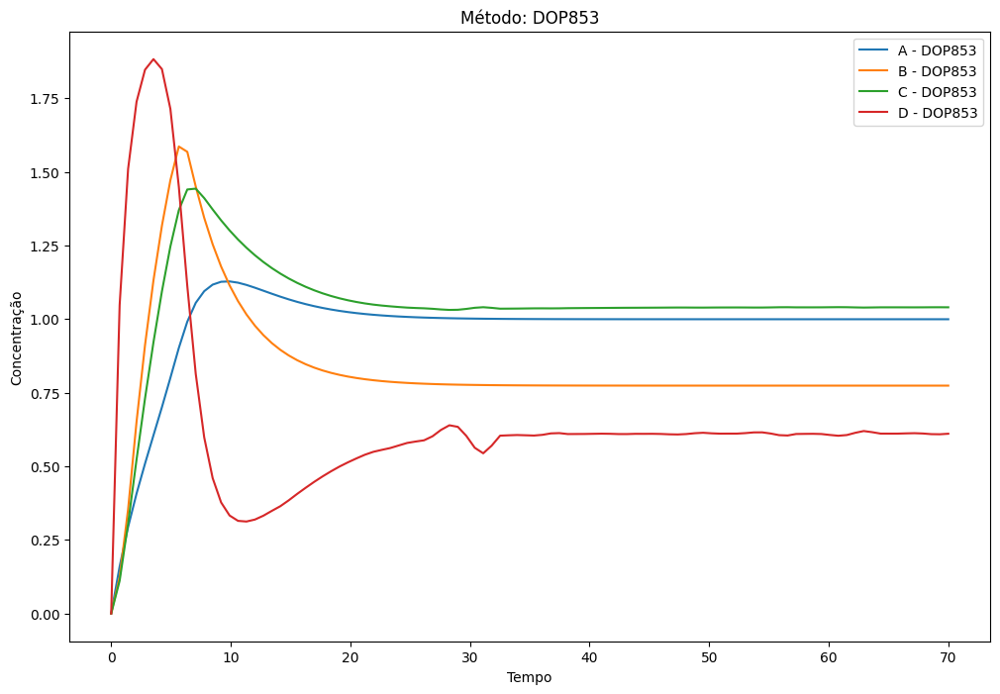

Sigma increased due to no improvement. New sigma: 10.2598289884164528079, 'min': 0.13728526684198503, 'max': 0.17319286395365335}}
Sigma increased due to no improvement. New sigma: 9.81771261962663144049, 'min': 0.11623258601889948, 'max': 0.16277267374839569}}
Sigma increased due to no improvement. New sigma: 13.69502334282962563446, 'min': 0.13384155518972868, 'max': 0.2024005243149761}}
Sigma increased due to no improvement. New sigma: 11.1259648202192661966, 'min': 0.11794414174293656, 'max': 0.4523619531672338}}}
Sigma increased due to no improvement. New sigma: 12.7516243644450252172, 'min': 0.1253031974933028, 'max': 0.16961235654087198}}}
Sigma increased due to no improvement. New sigma: 150.005709871973815084, 'min': 0.11580489217147177, 'max': 0.13809636013638252}}
Sigma increased due to no improvement. New sigma: 15 0.02715845980343491, 'min': 0.12019237718482521, 'max': 0.2251245115629622}}}
Sigma increased due to no improvement. New sigma: 15 0.06960913484186547, 'min': 0.

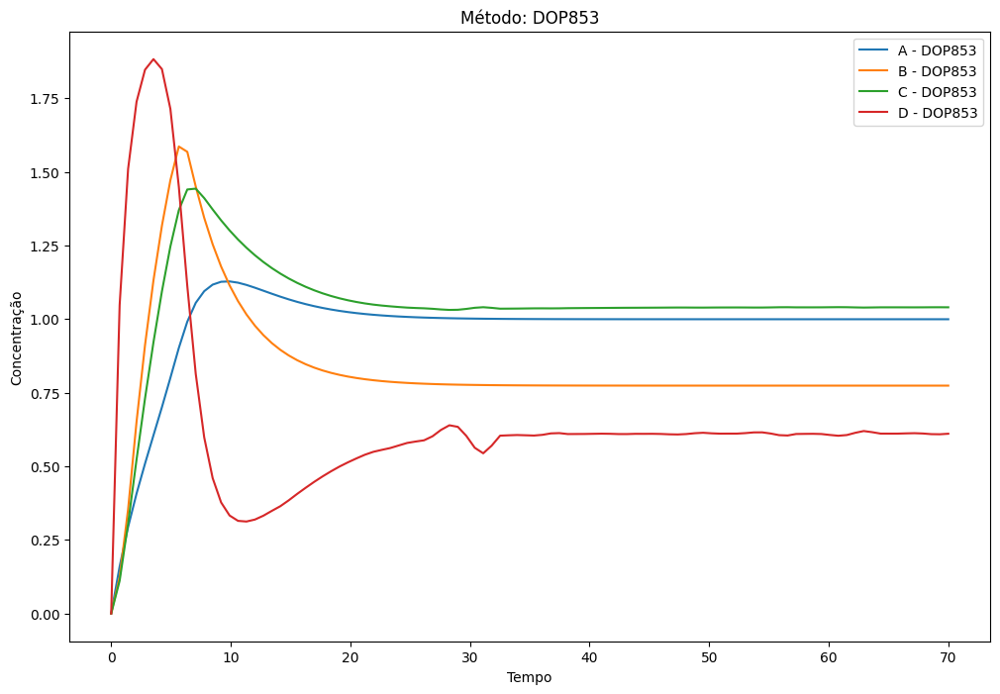

Sigma increased due to no improvement. New sigma: 14.790857508861404140425, 'min': 0.10469358059250299, 'max': 0.12990365233248435}
Sigma increased due to no improvement. New sigma: 11.21816930124541601965, 'min': 0.1047027451656426, 'max': 0.11717639173138046}3}
Sigma increased due to no improvement. New sigma: 1.80313447028205020844706, 'min': 0.0910126461120902, 'max': 0.09188453613589875}}
Sigma increased due to no improvement. New sigma: 3.1547637120924859362653, 'min': 0.09049473571291143, 'max': 0.09224402671364768}}
Sigma increased due to no improvement. New sigma: 5.4980590689152234306154, 'min': 0.09063480154412151, 'max': 0.09244229011095713}}


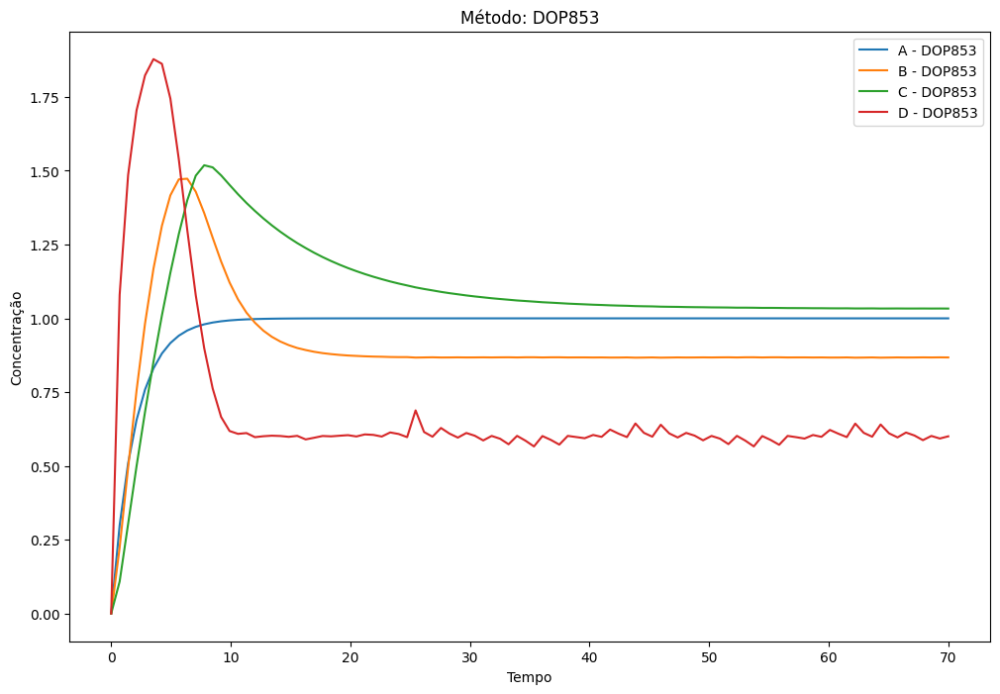

Sigma increased due to no improvement. New sigma: 10.40843714631489557, 'min': 0.09102290923236872, 'max': 0.9904649400035334}98}5}
Sigma increased due to no improvement. New sigma: 12.86489679261543427555, 'min': 0.09064405180584975, 'max': 0.10520525551387414}}
Sigma increased due to no improvement. New sigma: 10.395472112030134084698, 'min': 0.09113306533885053, 'max': 0.09302566764996227}}
Sigma increased due to no improvement. New sigma: 11.275085662276356267748, 'min': 0.0906254564948057, 'max': 0.09275105218109701}}}
Sigma increased due to no improvement. New sigma: 7.52320889984183254424396, 'min': 0.09004537514002951, 'max': 0.09079598619385125}
Sigma increased due to no improvement. New sigma: 15 0.004371456984636468, 'min': 0.0902500634198833, 'max': 0.10567660860352573}}}
Sigma increased due to no improvement. New sigma: 150.0006994525392494908, 'min': 0.0917531244526702, 'max': 0.09405486406968944}4}}


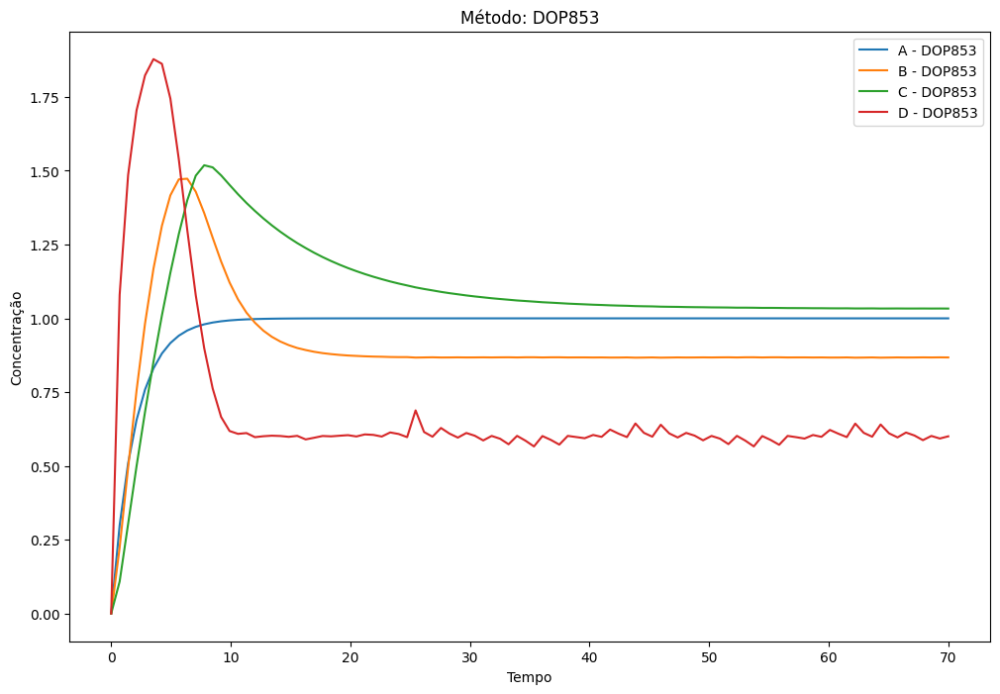

Force-stopping DOP853 for seed 6, error MABS due to timeout.150884780986357, 'min': 0.08823038366909394, 'max': 0.08977590796834856}
Solver: LSODA, Error: MABS
Timeout reached for DOP853 on seed 6, error MABStd': 0.000510383583440496, 'min': 0.08841855765337098, 'max': 0.09058923035936431}


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated error test failures (internal error).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


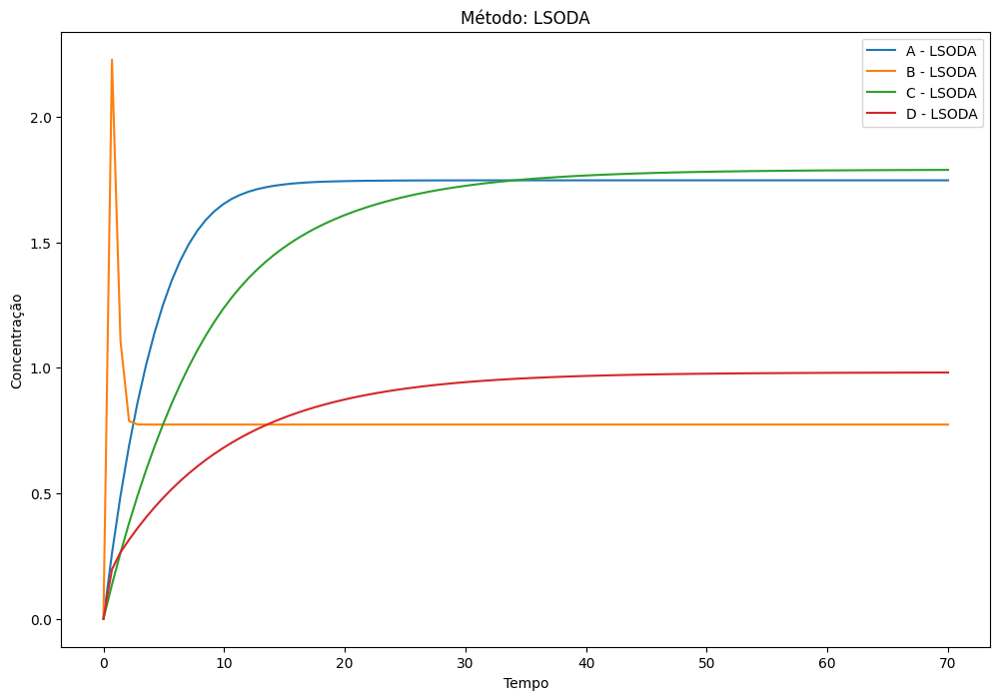

Sigma increased due to no improvement. New sigma: 1.73804360033411861, 'min': 0.2525645113658133, 'max': 0.47712999132678446}08}}
Sigma increased due to no improvement. New sigma: 3.10149020390055555056, 'min': 0.2735437303831464, 'max': 0.47580276012625106}


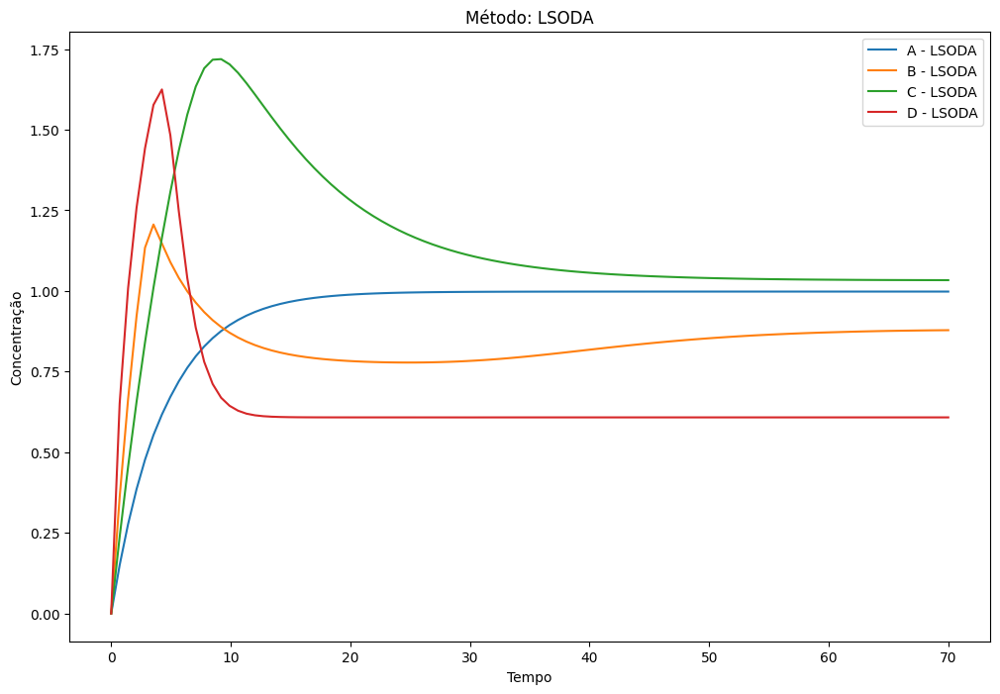

Sigma increased due to no improvement. New sigma: 10.0012616000388957983, 'min': 0.10052770398018528, 'max': 0.10507971352355262}}}
Sigma increased due to no improvement. New sigma: 7.652181806412774101, 'min': 0.1454461022236161, 'max': 0.8641250477264686}223}
Sigma increased due to no improvement. New sigma: 10.55959755478054213, 'min': 0.2858054844597492, 'max': 0.8330520307309512}}
Sigma increased due to no improvement. New sigma: 15.12286830877298542, 'min': 0.363016478536179, 'max': 0.7816625425083604}4}


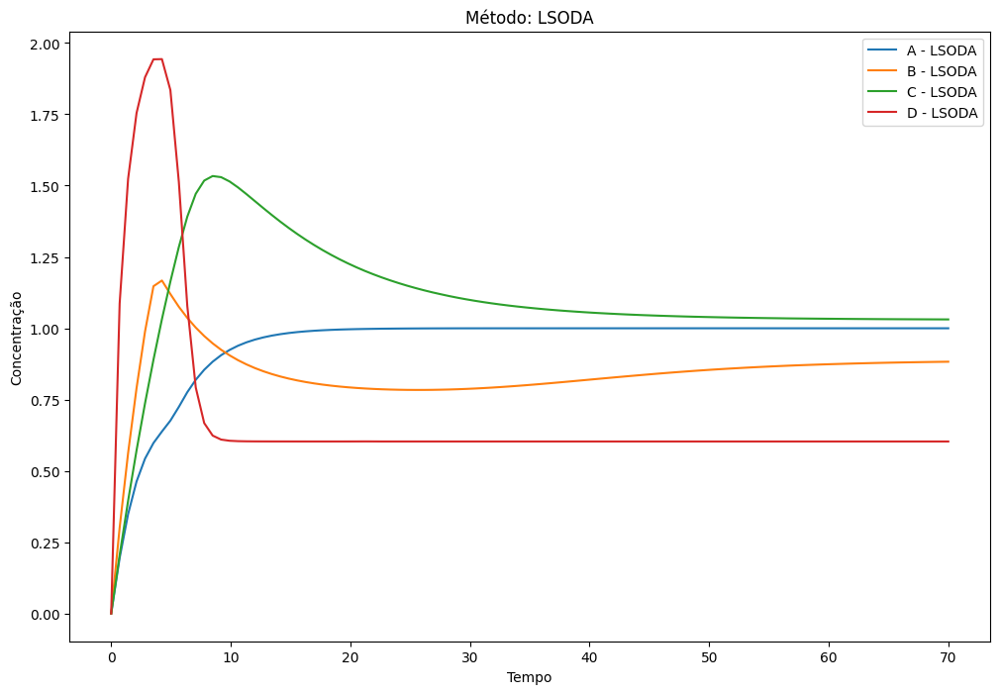

Sigma increased due to no improvement. New sigma: 13.01453378524355513, 'min': 0.1494134619327631, 'max': 0.604299271197725}56}}
Sigma increased due to no improvement. New sigma: 150.1098868479341256, 'min': 0.3908854899049415, 'max': 0.7778493674182198}}}}
Sigma increased due to no improvement. New sigma: 15 0.04332479568476256, 'min': 0.1597338101446953, 'max': 0.32148321822825116}
Sigma increased due to no improvement. New sigma: 12.4995540197687113959, 'min': 0.13627546015334244, 'max': 0.4608963721269487}5}


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated convergence failures (perhaps bad Jacobian or tolerances).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


Sigma increased due to no improvement. New sigma: 10.10261217520189466319, 'min': 0.13214278238850977, 'max': 0.1917407909898504}}
Sigma increased due to no improvement. New sigma: 150.012778074365675147, 'min': 0.1549977101171332, 'max': 0.1999738228240502}2}
Sigma increased due to no improvement. New sigma: 150.007596233218533225, 'min': 0.13399900158023256, 'max': 0.1573990858098245}}}
Sigma increased due to no improvement. New sigma: 11.196537833469585502, 'min': 0.11996329331792623, 'max': 0.5840029982638313}}}}}


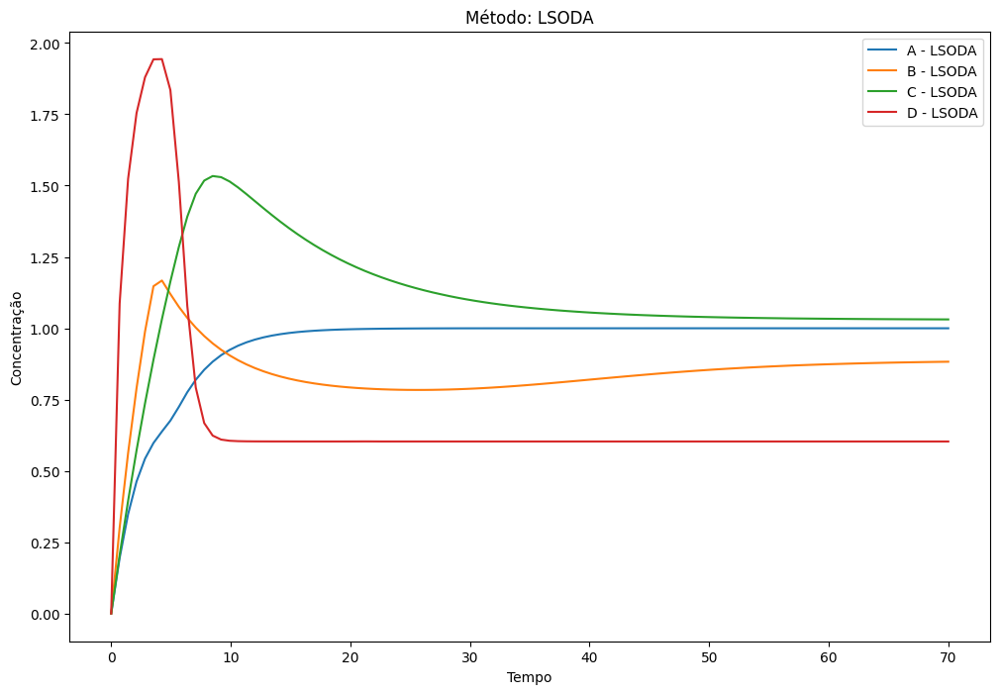

Sigma increased due to no improvement. New sigma: 14.39081566599539745963, 'min': 0.11058265165369803, 'max': 0.18882081132074158}
Sigma increased due to no improvement. New sigma: 15 0.02501538948979828, 'min': 0.11323518609814108, 'max': 0.21246407579731233}}
Sigma increased due to no improvement. New sigma: 150.007498142446966913, 'min': 0.12706680222093772, 'max': 0.15767428402320427}}}
Sigma increased due to no improvement. New sigma: 15 0.0024382618339079125, 'min': 0.12832876472247123, 'max': 0.13662809011422972}
Sigma increased due to no improvement. New sigma: 15 0.007247662685053686, 'min': 0.11898827479330713, 'max': 0.1489219524469232}}}
Sigma increased due to no improvement. New sigma: 15 0.016193449464470468, 'min': 0.10145625843453968, 'max': 0.156583980873769}}}
Sigma increased due to no improvement. New sigma: 15 0.014173181788436882, 'min': 0.13176307670095433, 'max': 0.18636195793666985}}


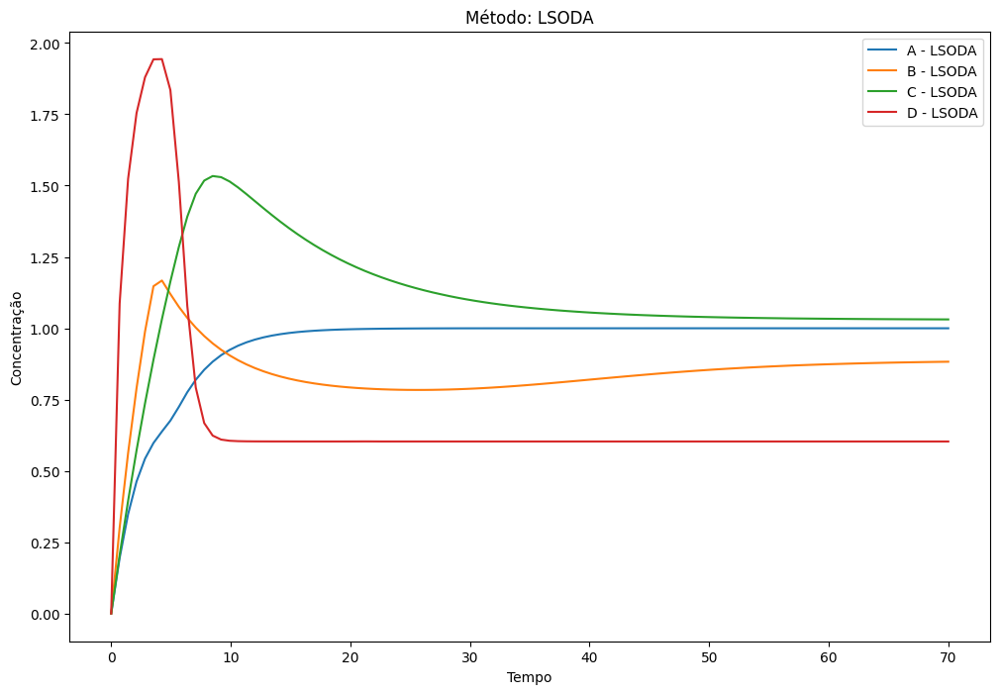

Sigma increased due to no improvement. New sigma: 150.0029213527573911176, 'min': 0.12534258910316864, 'max': 0.13517211429970413}


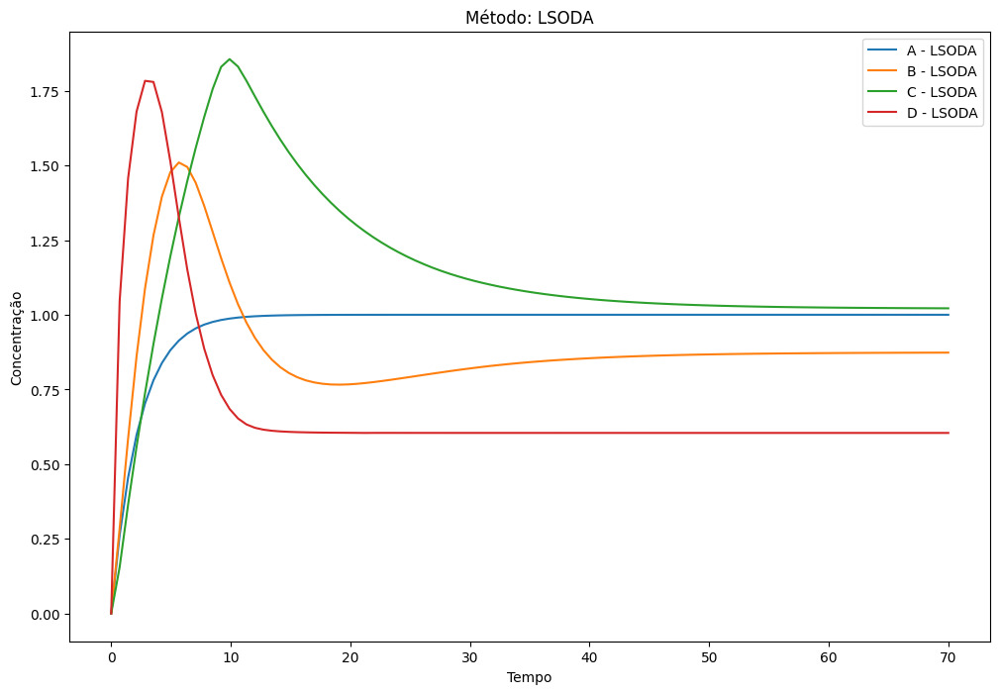

Sigma increased due to no improvement. New sigma: 1.20896973427160556e-05, 'min': 0.08625750571043814, 'max': 0.08651503758772552}2}
Sigma increased due to no improvement. New sigma: 1.130641744753438456514, 'min': 0.0858340523432886, 'max': 0.09231002306851943}73}
Sigma increased due to no improvement. New sigma: 1.109266022599782147e-05, 'min': 0.08537814473344867, 'max': 0.08545790411304528}}
Sigma increased due to no improvement. New sigma: 1.0113722460450734732e-05, 'min': 0.085236870909076, 'max': 0.08531104308056142}3}


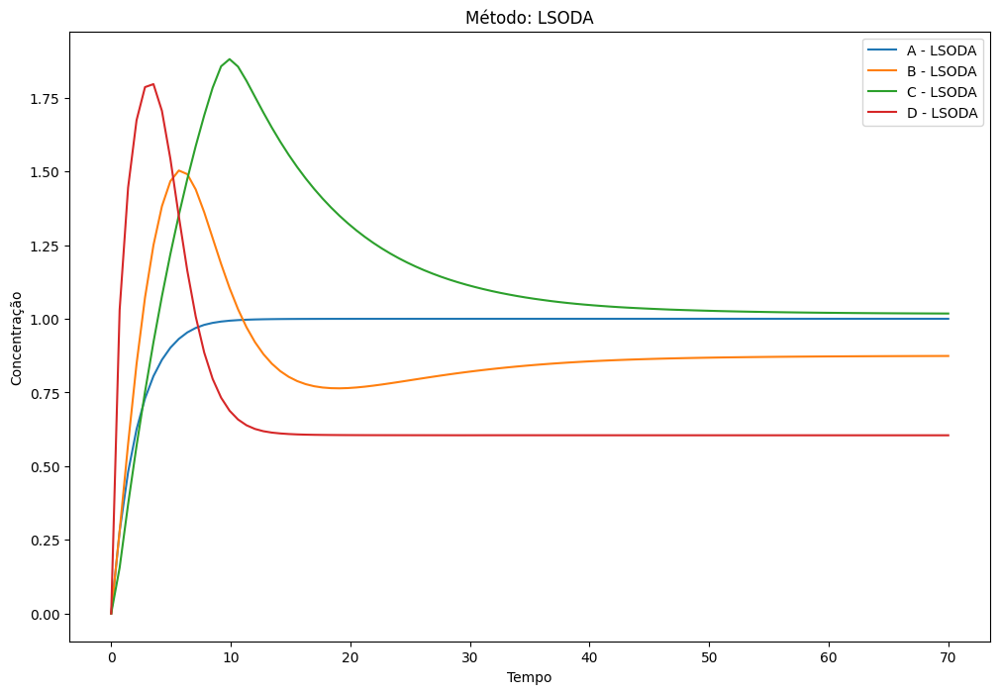

Sigma increased due to no improvement. New sigma: 1.3123157479806766507e-05, 'min': 0.08505057091529666, 'max': 0.08512036217862251}
Sigma increased due to no improvement. New sigma: 2.522744472102155230772, 'min': 0.08498504806976935, 'max': 0.10032550260407866}}}
Sigma increased due to no improvement. New sigma: 1.0517777624129030135e-05, 'min': 0.08472660943688119, 'max': 0.08477329919729477}
Sigma increased due to no improvement. New sigma: 2.558329138351544806e-05, 'min': 0.08467207257543428, 'max': 0.0847228656052216}1}


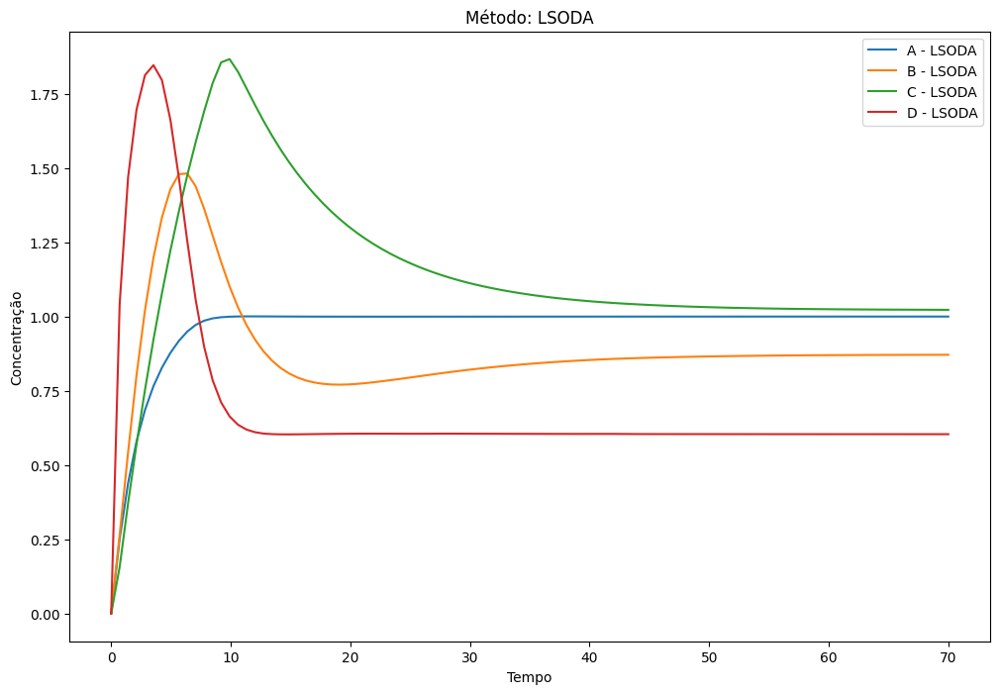

Sigma increased due to no improvement. New sigma: 3.4320157480214437652e-05, 'min': 0.08467700517505355, 'max': 0.08475841059408978}
Sigma increased due to no improvement. New sigma: 2.0916861104588462865e-05, 'min': 0.08437144830315724, 'max': 0.08447648793717534}
Sigma increased due to no improvement. New sigma: 4.137917847031813821e-05, 'min': 0.08432965047382249, 'max': 0.08452906441466626}}


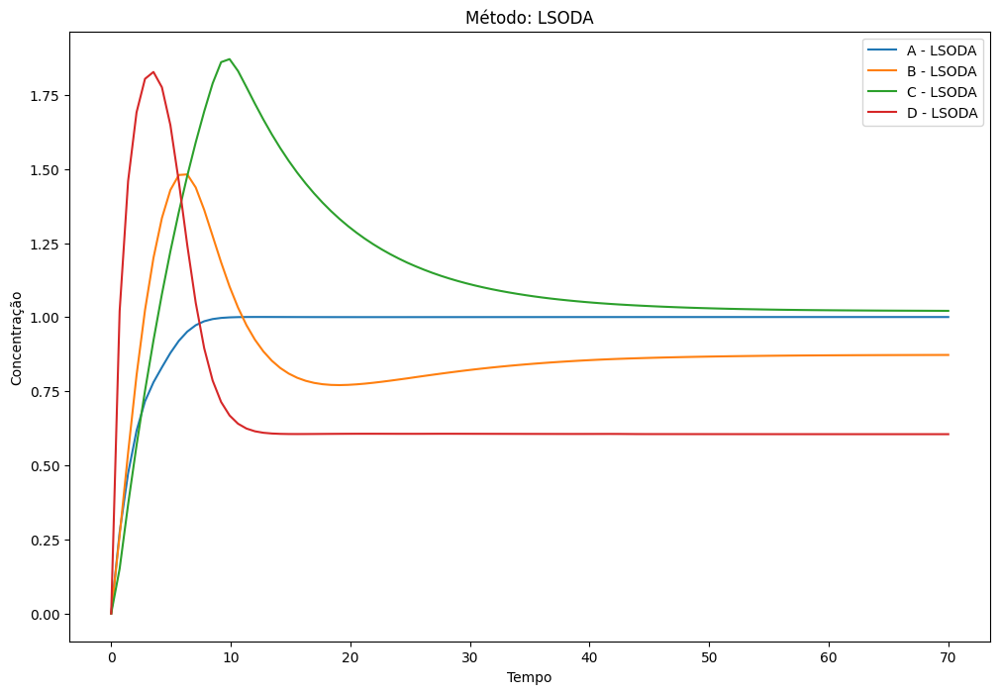

Sigma increased due to no improvement. New sigma: 15 0.00178691839653592, 'min': 0.0843381567602708, 'max': 0.09025418435261187}23}}
Sigma increased due to no improvement. New sigma: 15 0.0015165983062250903, 'min': 0.08454916970298475, 'max': 0.09038883937001295}}
Sigma increased due to no improvement. New sigma: 4.1065607636034445788e-05, 'min': 0.08385007105853047, 'max': 0.08394092729621924}
Sigma increased due to no improvement. New sigma: 12.056174338768958920609, 'min': 0.08382335959144789, 'max': 0.08436331858288479}}


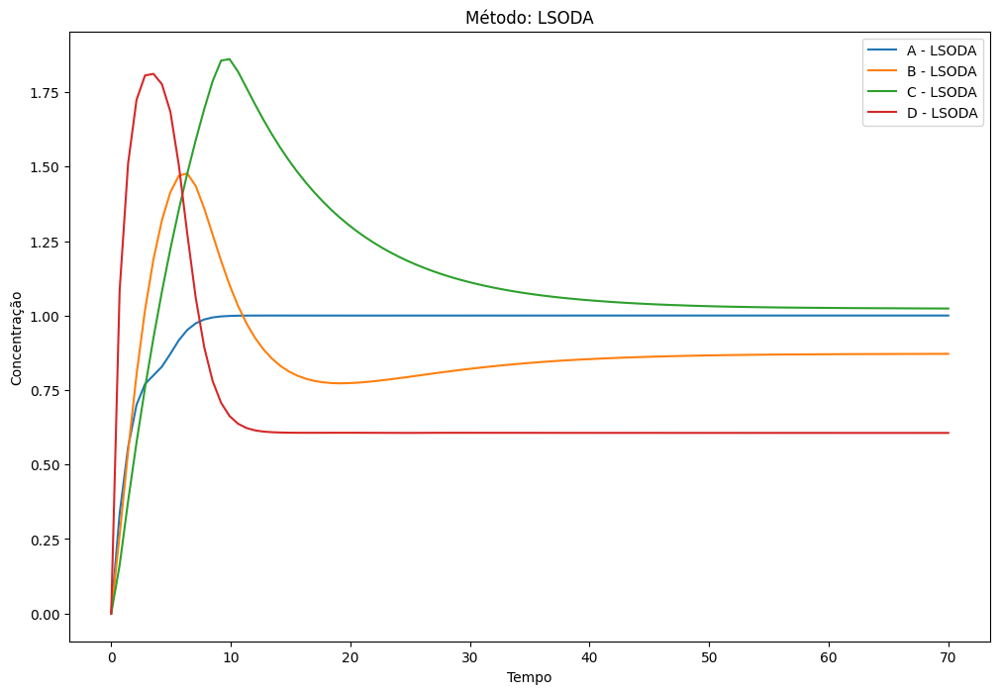

Sigma increased due to no improvement. New sigma: 15 0.003381222863514327, 'min': 0.08382677948273734, 'max': 0.09457253192550256}2}
Sigma increased due to no improvement. New sigma: 12.91360914394805364e-05, 'min': 0.08362684602012718, 'max': 0.08374063563889206}}
Sigma increased due to no improvement. New sigma: 15 0.0003872910161453322, 'min': 0.08373681142640979, 'max': 0.08505184865397512}}
Sigma increased due to no improvement. New sigma: 15 0.00022562282201706642, 'min': 0.08392735391652134, 'max': 0.08463450166289953}
Solver: RK45, Error: ABS 0.08524016971916916, 'std': 0.0018361286378845009, 'min': 0.08393929851728768, 'max': 0.0912448044292569}}}


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ivp\common.py:39: UserWarning: The following arguments have no effect for a chosen solver: `min_step`.
  warn("The following arguments have no effect for a chosen solver: {}."


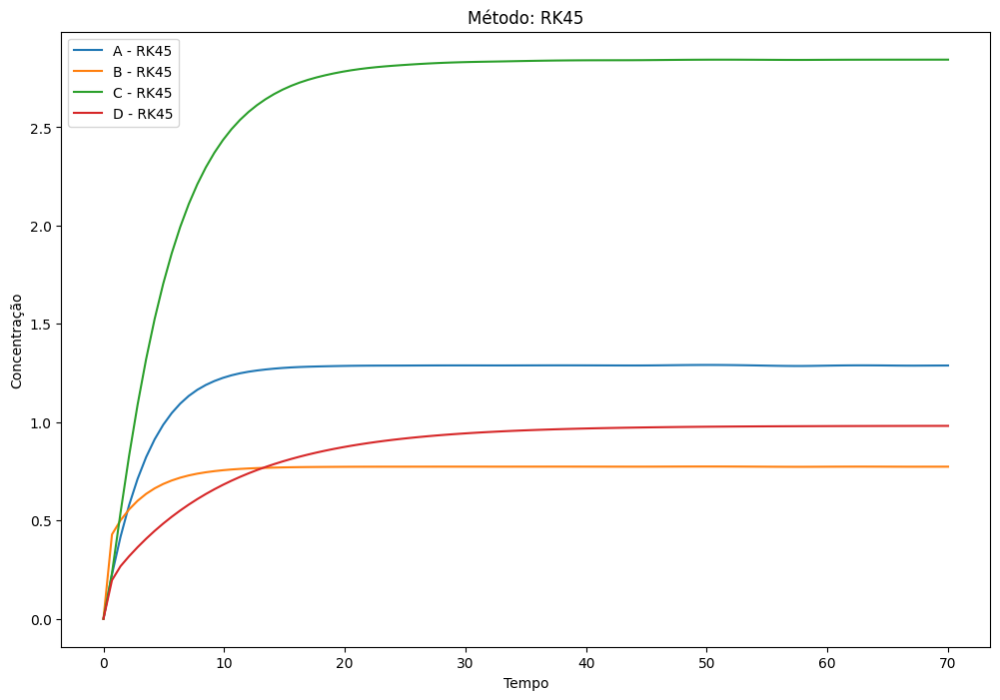

Sigma increased due to no improvement. New sigma: 1.5100930411380149, 'min': 105.31724870791201, 'max': 141.6036829651979}}
Sigma increased due to no improvement. New sigma: 2.03983178175219635, 'min': 106.6518876969244, 'max': 134.74010162789986}}
Sigma increased due to no improvement. New sigma: 4.9442660599345867, 'min': 100.67816883091864, 'max': 298.26586471503396}}
Sigma increased due to no improvement. New sigma: 9.21341826279071425, 'min': 110.44940807823814, 'max': 449.74307408726355}
Sigma increased due to no improvement. New sigma: 11.723864424741876, 'min': 51.56242934360885, 'max': 93.09198705014838}4}}


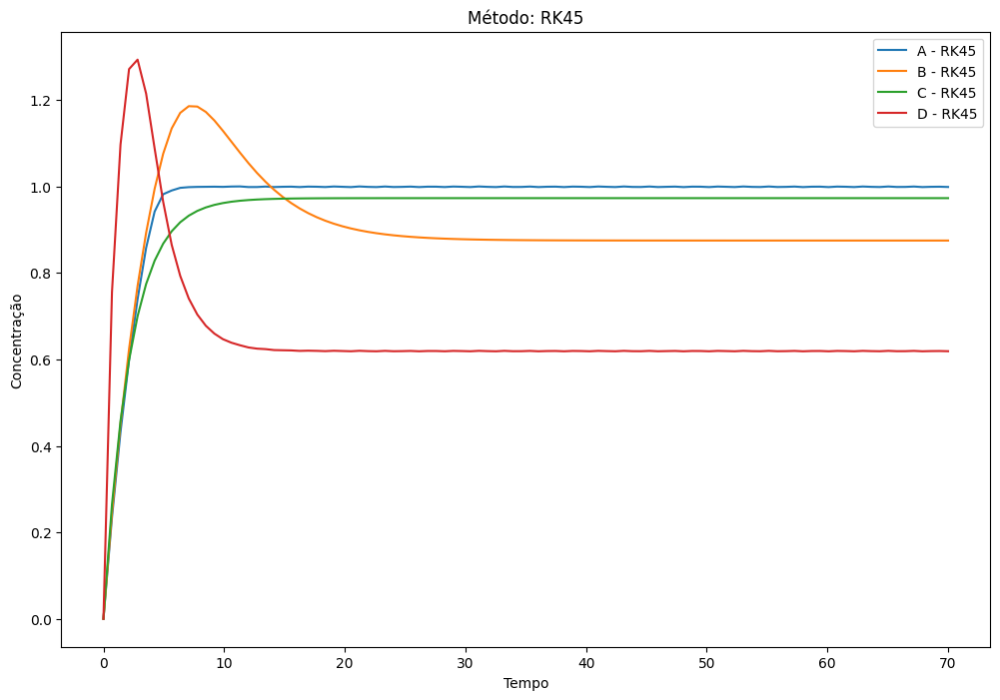

Sigma increased due to no improvement. New sigma: 3.069472390662205, 'min': 68.80985121749637, 'max': 137.4759877038862}}}}}
Sigma increased due to no improvement. New sigma: 7.25652004420694756, 'min': 57.53940675448604, 'max': 132.80416659514708}}
Sigma increased due to no improvement. New sigma: 12.679125595490197, 'min': 99.51767841119282, 'max': 320.3126971628233}}}}
Sigma increased due to no improvement. New sigma: 12.697009963874608, 'min': 116.29671436686702, 'max': 398.29655801017515}}
Sigma increased due to no improvement. New sigma: 13.773872500462252, 'min': 104.4827857198672, 'max': 131.7388705719945}}}}
Sigma increased due to no improvement. New sigma: 14.117454417061786, 'min': 75.28015563677323, 'max': 132.1863791004213}}}}
Sigma increased due to no improvement. New sigma: 13.1789038600397447, 'min': 83.0726565725056, 'max': 158.84732499055053}}}
Sigma increased due to no improvement. New sigma: 15.5218879164959, 'min': 59.349630142241594, 'max': 134.2052221158307}}}}}


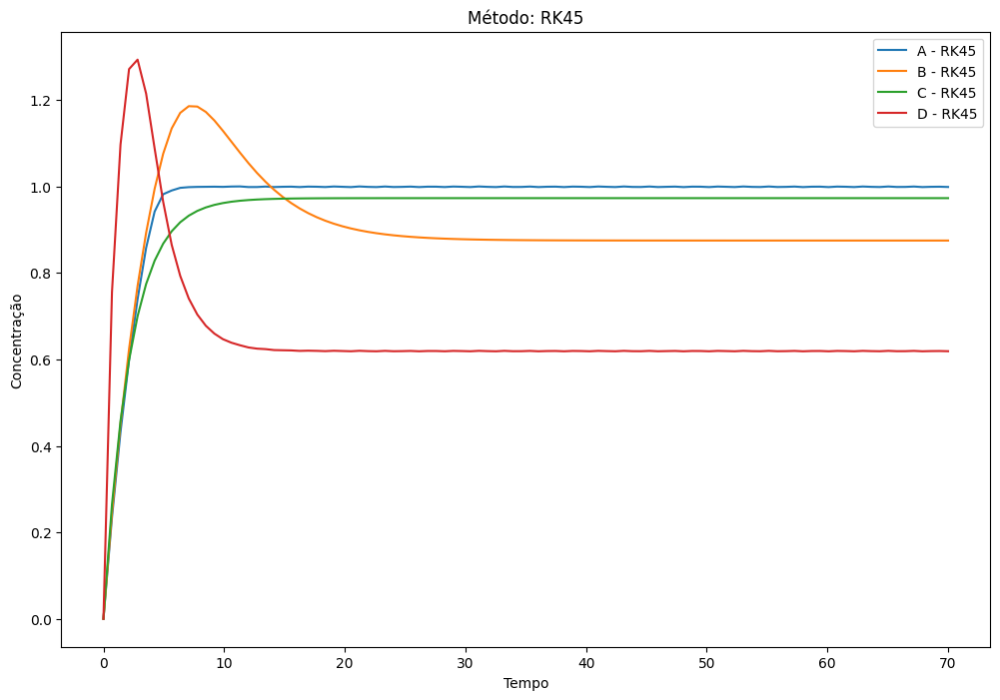

Sigma increased due to no improvement. New sigma: 15157.64430013149453, 'min': 65.6026256948374, 'max': 535.919021469463}03}
Sigma increased due to no improvement. New sigma: 156.061999413011729, 'min': 105.73048706261815, 'max': 129.49640119979588}}
Sigma increased due to no improvement. New sigma: 155.266286255800242, 'min': 101.8011816167577, 'max': 183.58712346113705}}}
Sigma increased due to no improvement. New sigma: 1520.18800551291187, 'min': 68.46349200513832, 'max': 158.329670528297}6}}}
Sigma increased due to no improvement. New sigma: 152.67748463668122, 'min': 64.5788661303661, 'max': 207.6087768485586}9}}}}


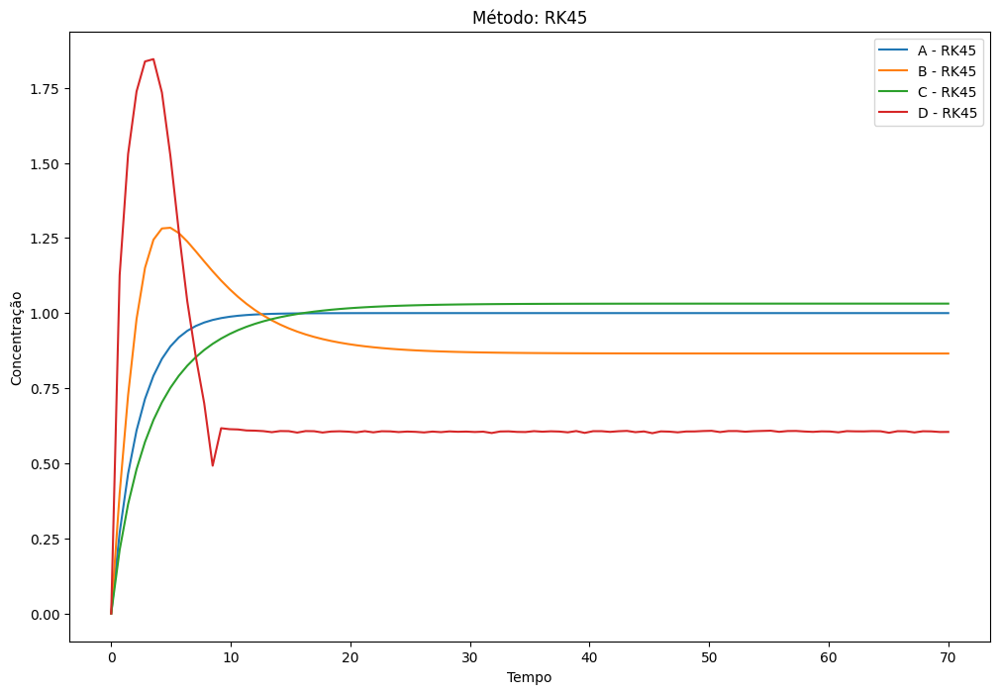

Sigma increased due to no improvement. New sigma: 10.00206035554142418, 'min': 43.64274736677738, 'max': 43.649837578555015}}4}}


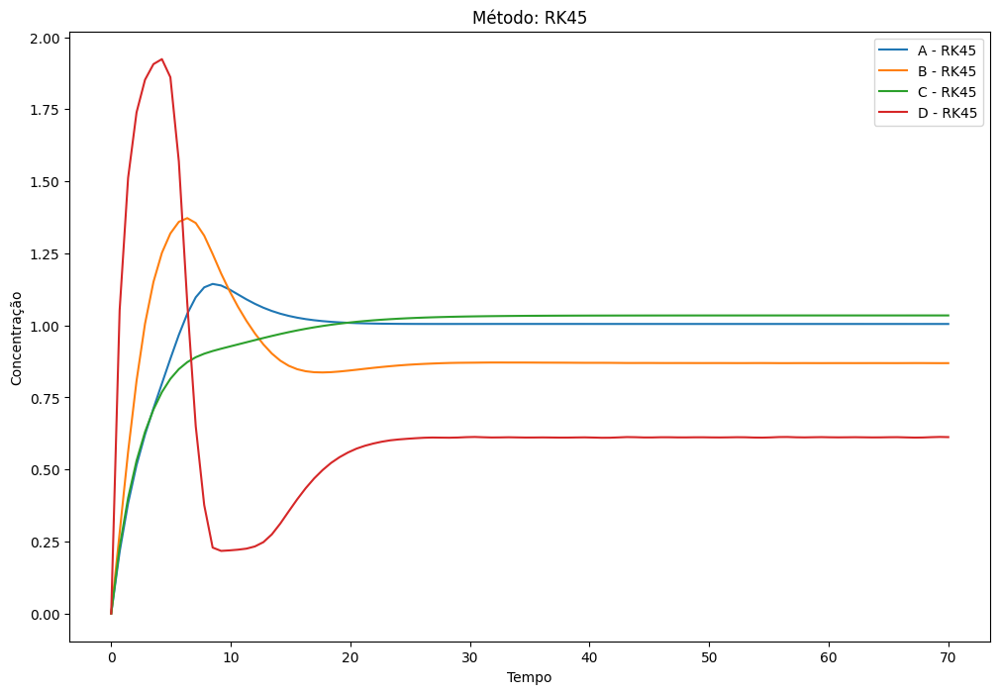

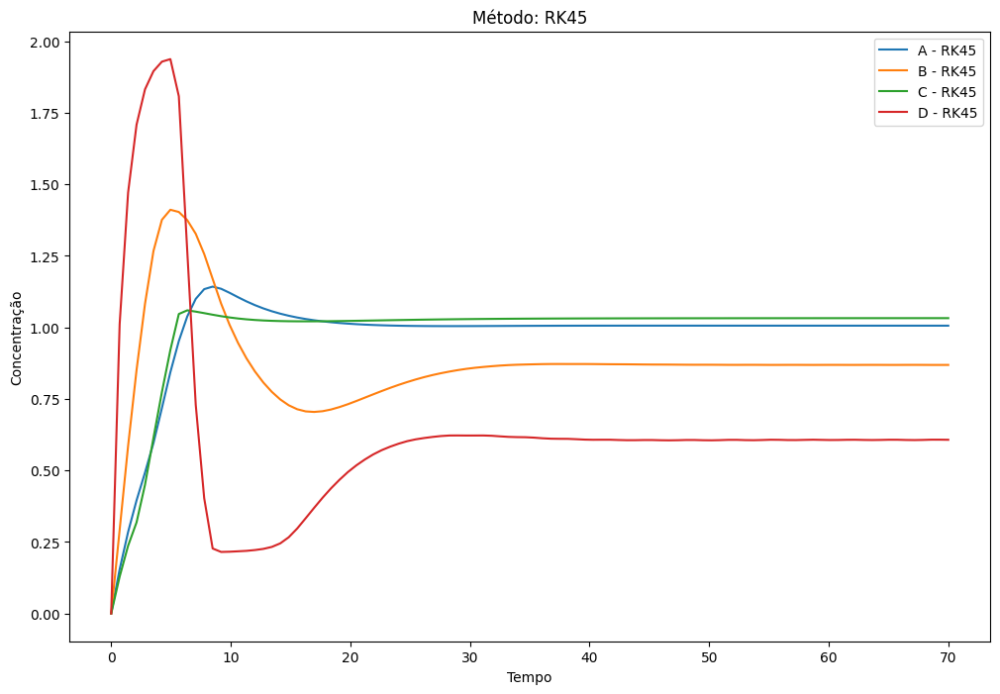

Sigma increased due to no improvement. New sigma: 10.006075612516397067, 'min': 35.27425495006837, 'max': 35.296703224970166}6}
Sigma increased due to no improvement. New sigma: 10.004644310681862609, 'min': 35.20385230852799, 'max': 35.217648121394255}}}


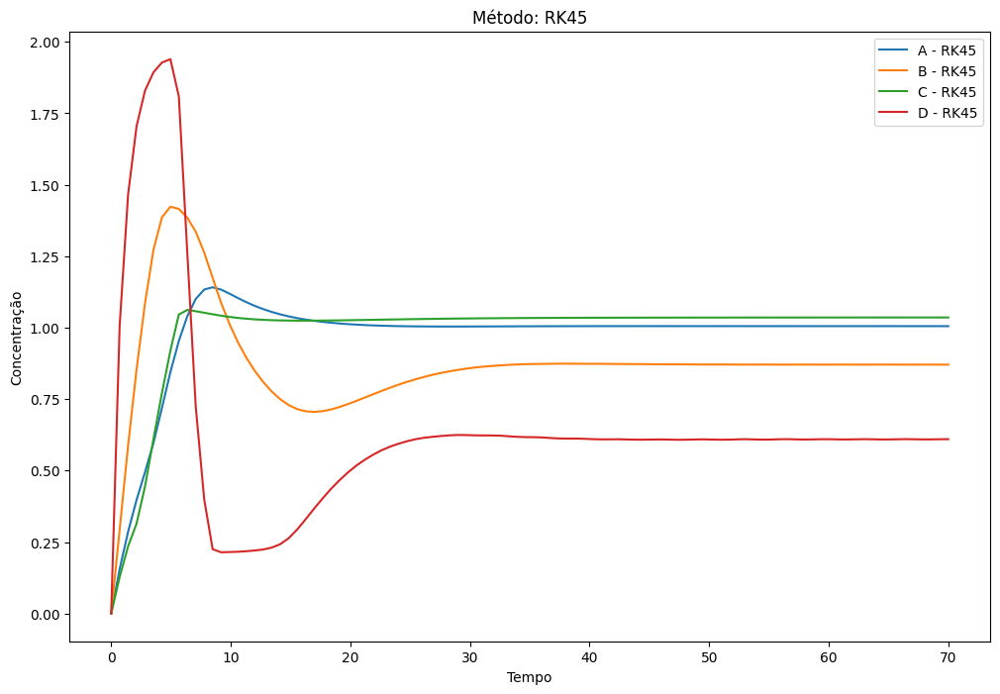

Sigma increased due to no improvement. New sigma: 1 0.0060920236146837755, 'min': 35.187111437402116, 'max': 35.199409460952104}


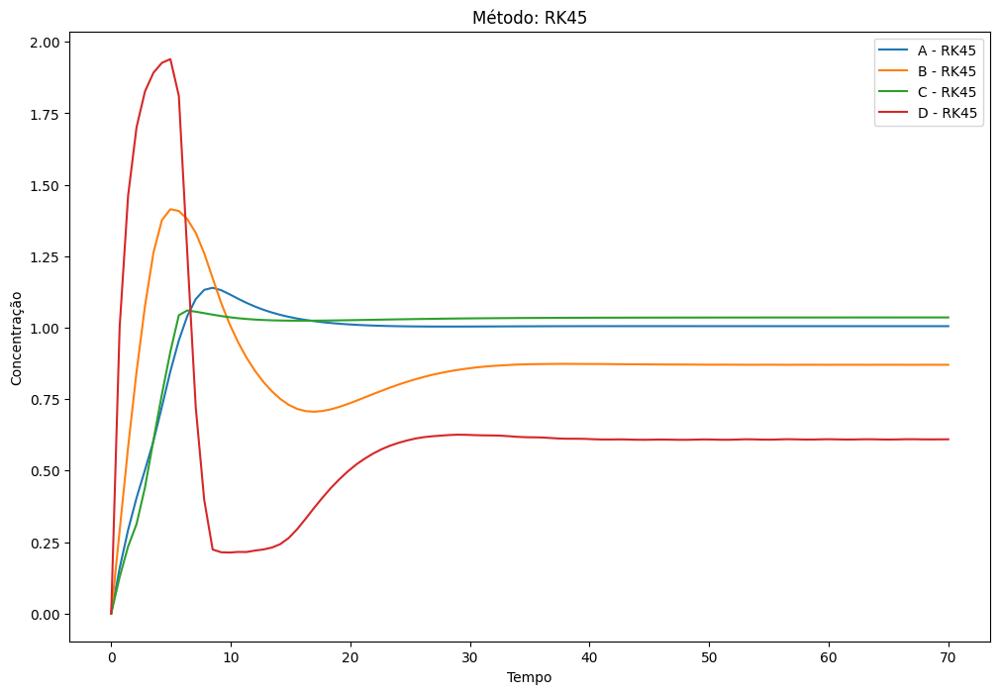

Sigma increased due to no improvement. New sigma: 10.006360915741198, 'min': 35.096651717269694, 'max': 35.11541613630222}27}}
Sigma increased due to no improvement. New sigma: 1 0.0015400392154411875, 'min': 35.10602024445891, 'max': 35.11174545903174}}
Sigma increased due to no improvement. New sigma: 1.14159421429339906716, 'min': 35.107979097257214, 'max': 35.113719769466314}
Sigma increased due to no improvement. New sigma: 1 0.0016403990470475467, 'min': 35.10726386843778, 'max': 35.113146488646436}
Sigma increased due to no improvement. New sigma: 1.6102360806518905147, 'min': 35.10779023714053, 'max': 35.13617954179964}5}}}


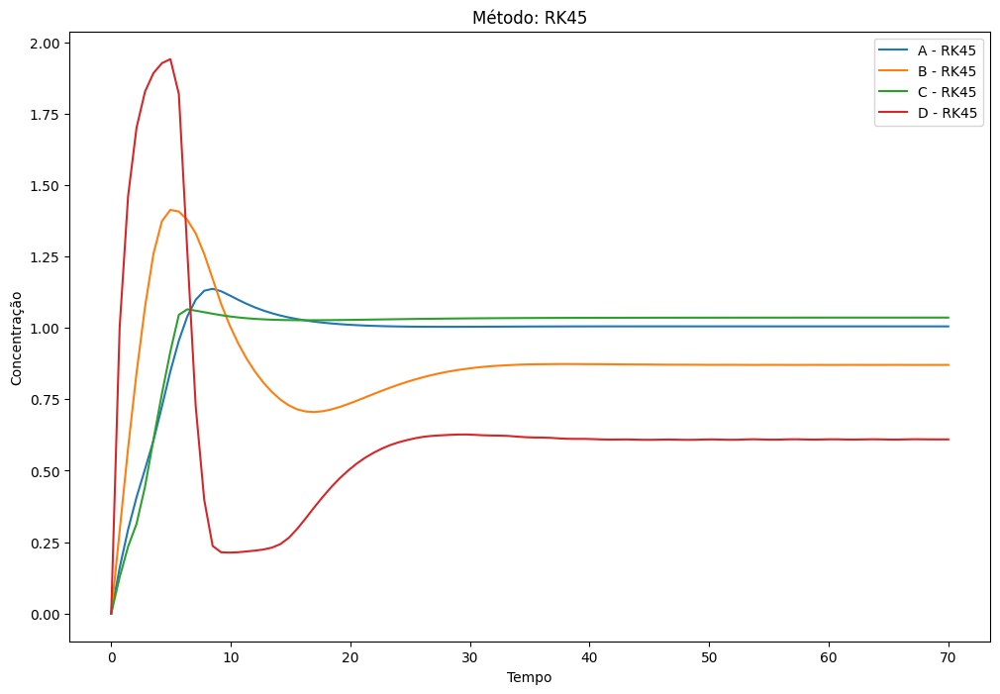

Sigma increased due to no improvement. New sigma: 1 0.004465890387748815, 'min': 35.0192851283011, 'max': 35.03211139845253}}}}
Sigma increased due to no improvement. New sigma: 10.001762916441550045, 'min': 35.00864690496552, 'max': 35.015898375813094}}5}
Sigma increased due to no improvement. New sigma: 1.66768327601908638305, 'min': 35.006740215568335, 'max': 35.01750147701898}}


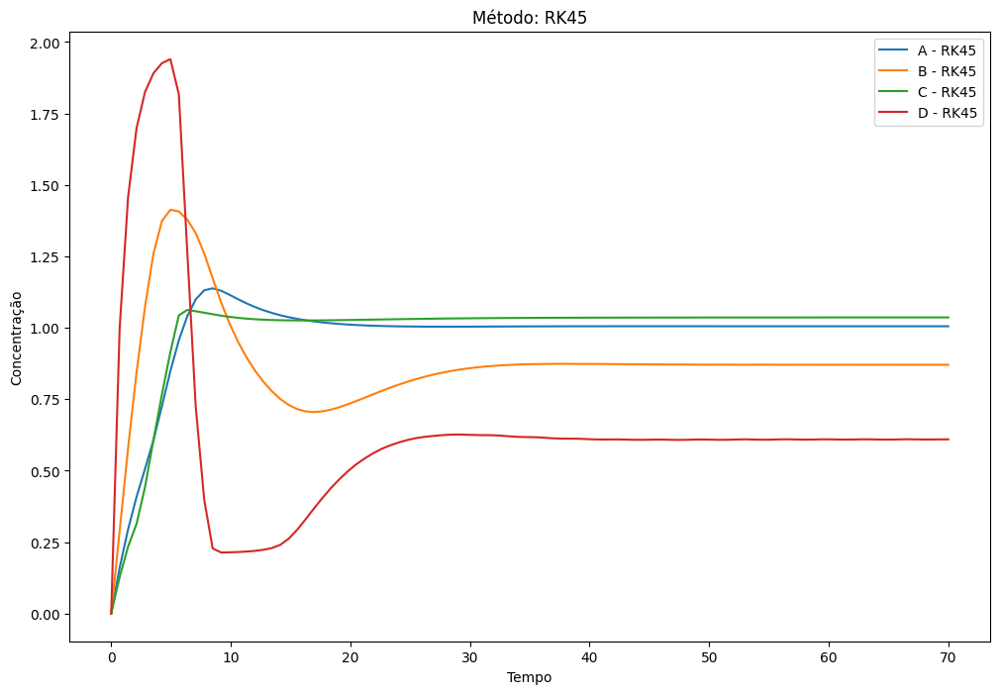

Sigma increased due to no improvement. New sigma: 2.9071147560502265584, 'min': 35.00906721749394, 'max': 35.69986701400263}5}
Force-stopping RK45 for seed 7, error ABS due to timeout.49563980747577, 'min': 35.00578595974432, 'max': 35.05848219513233}5}}}
Solver: DOP853, Error: ABS
Timeout reached for RK45 on seed 7, error ABSstd': 0.023135356623074668, 'min': 35.004657991803526, 'max': 35.059969966558796}


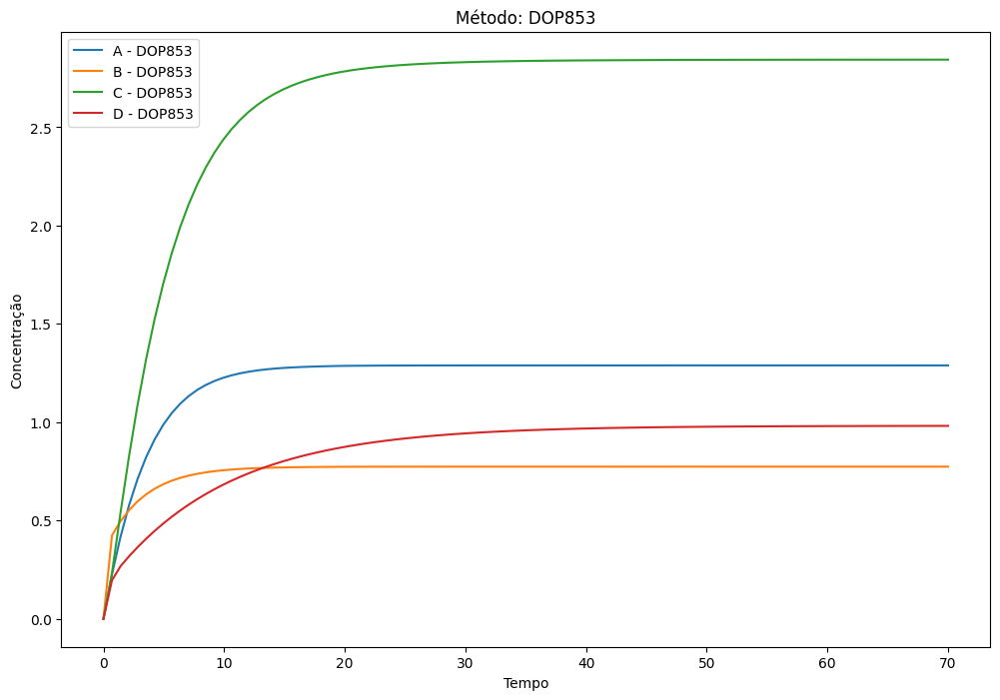

Sigma increased due to no improvement. New sigma: 1.6005193566838283, 'min': 105.48443763324863, 'max': 140.85148326903325}}
Sigma increased due to no improvement. New sigma: 1.224033813508774, 'min': 83.04600830869296, 'max': 126.30235025110504}}}}
Sigma increased due to no improvement. New sigma: 2.51109692311862446, 'min': 104.64142072911893, 'max': 157.34969506352883}
Sigma increased due to no improvement. New sigma: 3.4185646123382614, 'min': 82.9982347120951, 'max': 122.07401631814416}8}
Sigma increased due to no improvement. New sigma: 6.5512664585329386, 'min': 112.81675147798735, 'max': 334.6825503889584}3}


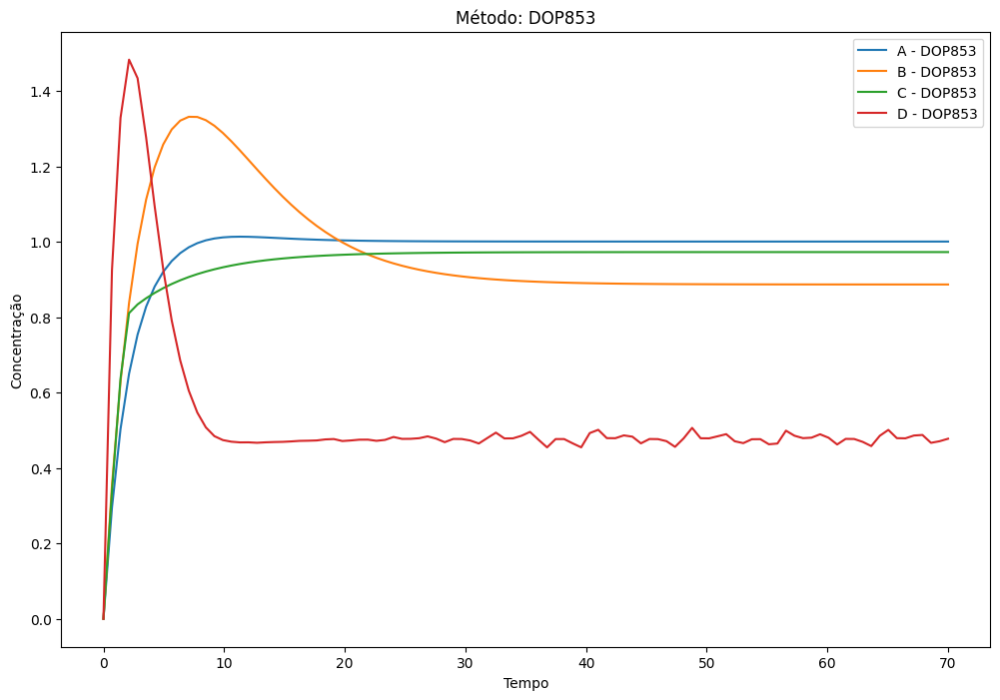

Sigma increased due to no improvement. New sigma: 6.932165273963598, 'min': 63.865422097751015, 'max': 354.24399930438165}}
Sigma increased due to no improvement. New sigma: 7.040767772673834, 'min': 59.93220600083306, 'max': 94.80860199060108}}5}}
Sigma increased due to no improvement. New sigma: 3.0993471356304743, 'min': 54.592975838885856, 'max': 57.52848322496029}}
Sigma increased due to no improvement. New sigma: 7.440774732315677 'min': 58.50180830214274, 'max': 408.1337123691626}47}}}
Sigma increased due to no improvement. New sigma: 8.018141926760995, 'min': 60.23236073113558, 'max': 66.00641438265173}}}}


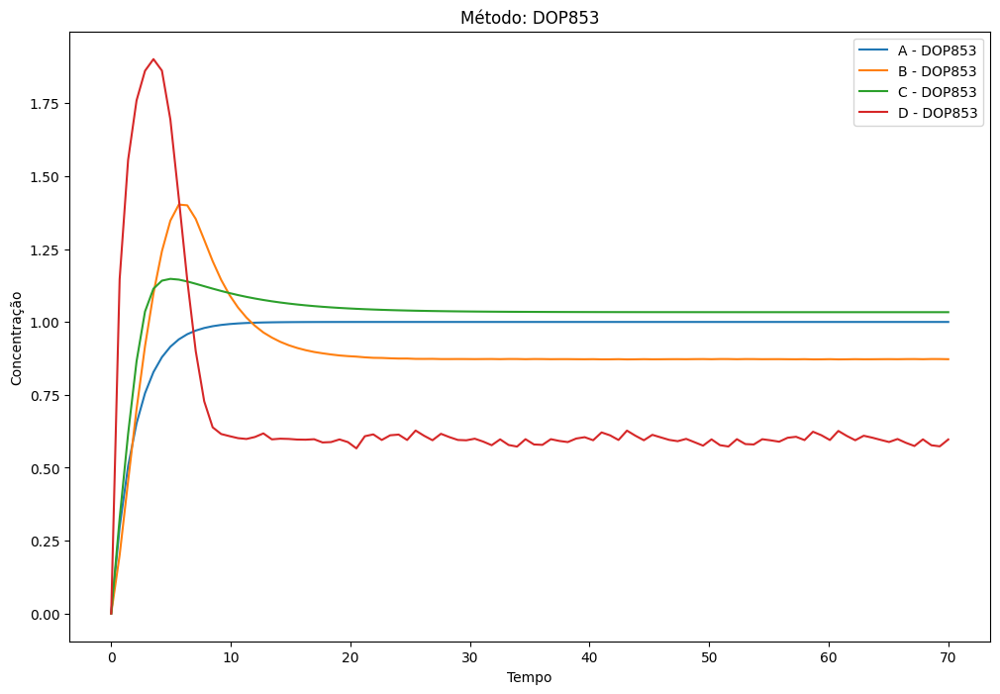

Sigma increased due to no improvement. New sigma: 10.20383733129324308, 'min': 40.96594162659353, 'max': 41.631387647891515}}}
Sigma increased due to no improvement. New sigma: 2.75713937828659954, 'min': 40.94774592791643, 'max': 43.171157369279676}}}
Sigma increased due to no improvement. New sigma: 5.01490691793995753, 'min': 41.52284781130951, 'max': 45.84446105440802}3}}
Sigma increased due to no improvement. New sigma: 9.96368297758417235, 'min': 42.92053942209472, 'max': 56.175769980713405}}}
Sigma increased due to no improvement. New sigma: 12.51761711177916955, 'min': 43.587188274324774, 'max': 461.022170917798}}}
Sigma increased due to no improvement. New sigma: 154.952758654985521, 'min': 45.6634362798179, 'max': 61.46889045963947}4}}}


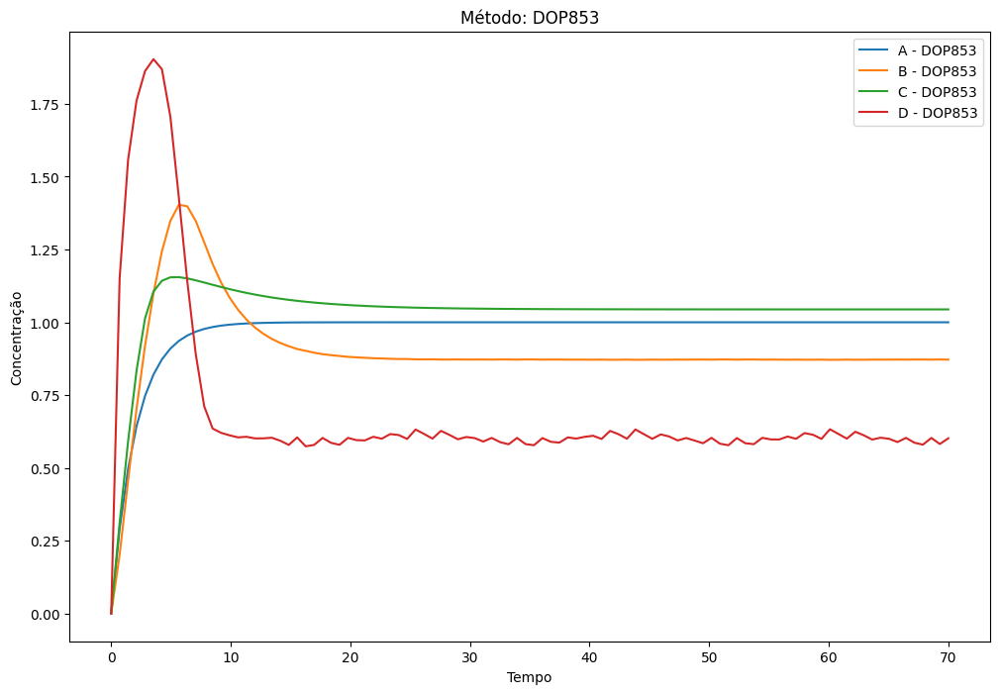

Sigma increased due to no improvement. New sigma: 14.77676002966263645, 'min': 42.218631939710235, 'max': 49.552292835317346}
Sigma increased due to no improvement. New sigma: 15.666011339690238, 'min': 54.65156866882054, 'max': 64.93125374514824}}}}
Sigma increased due to no improvement. New sigma: 15.251476640517122, 'min': 49.16561841386682, 'max': 118.97937054855667}}}}
Sigma increased due to no improvement. New sigma: 15.729782584229412, 'min': 45.78806575138194, 'max': 64.51980527669598}}}}
Sigma increased due to no improvement. New sigma: 15.358231766572318, 'min': 45.556295699188055, 'max': 59.93909641686024}}}}
Sigma increased due to no improvement. New sigma: 14.051383981202372, 'min': 42.28317218985672, 'max': 52.335232917863095}}}
Sigma increased due to no improvement. New sigma: 11.8189636414494963, 'min': 40.91309064747561, 'max': 48.54971850808782}4}


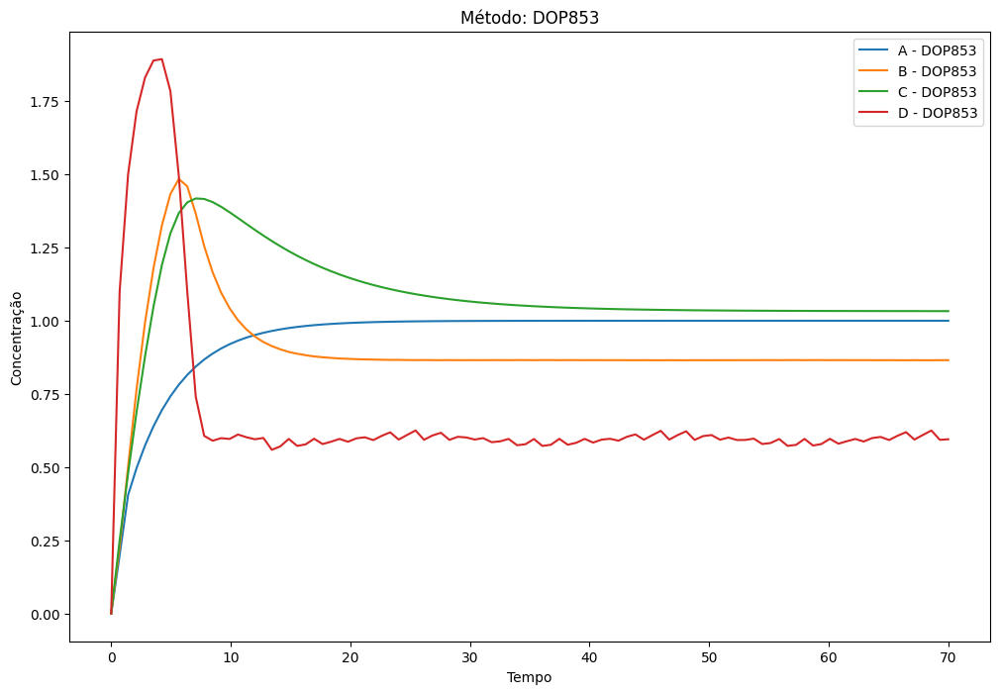

Sigma increased due to no improvement. New sigma: 1.9590111553681928456, 'min': 39.21843647991893, 'max': 39.54114128868329}4}
Force-stopping DOP853 for seed 7, error ABS due to timeout.067027406, 'min': 39.71777126771014, 'max': 47.856045813601924}5}
Solver: LSODA, Error: ABS


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated error test failures (internal error).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


Timeout reached for DOP853 on seed 7, error ABStd': 0.5881961364622881, 'min': 39.868891099358876, 'max': 41.514778329269916}


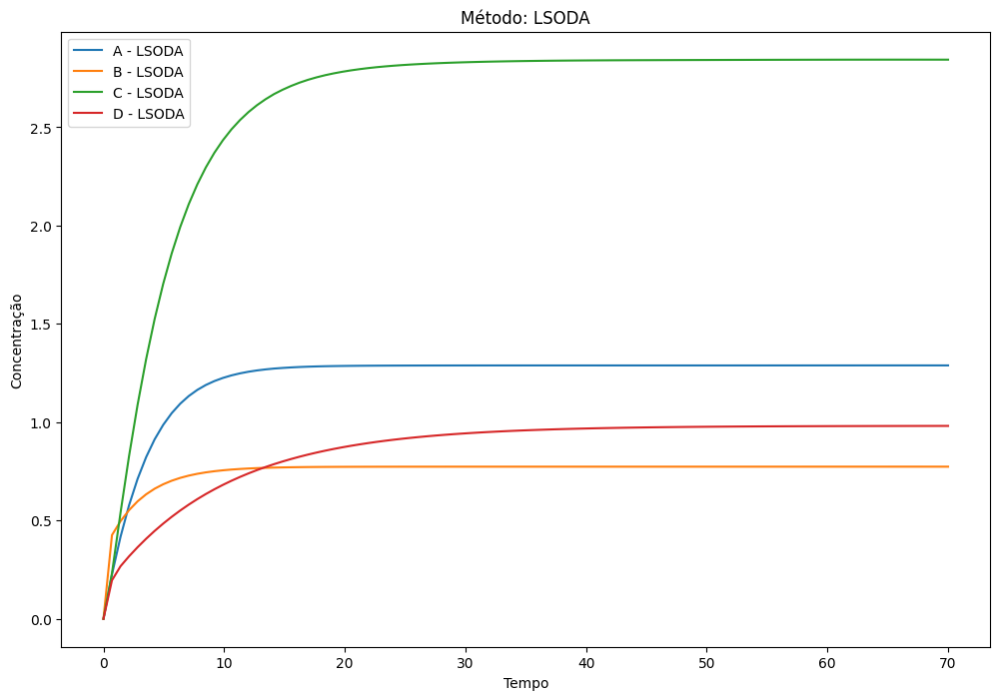

C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated convergence failures (perhaps bad Jacobian or tolerances).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


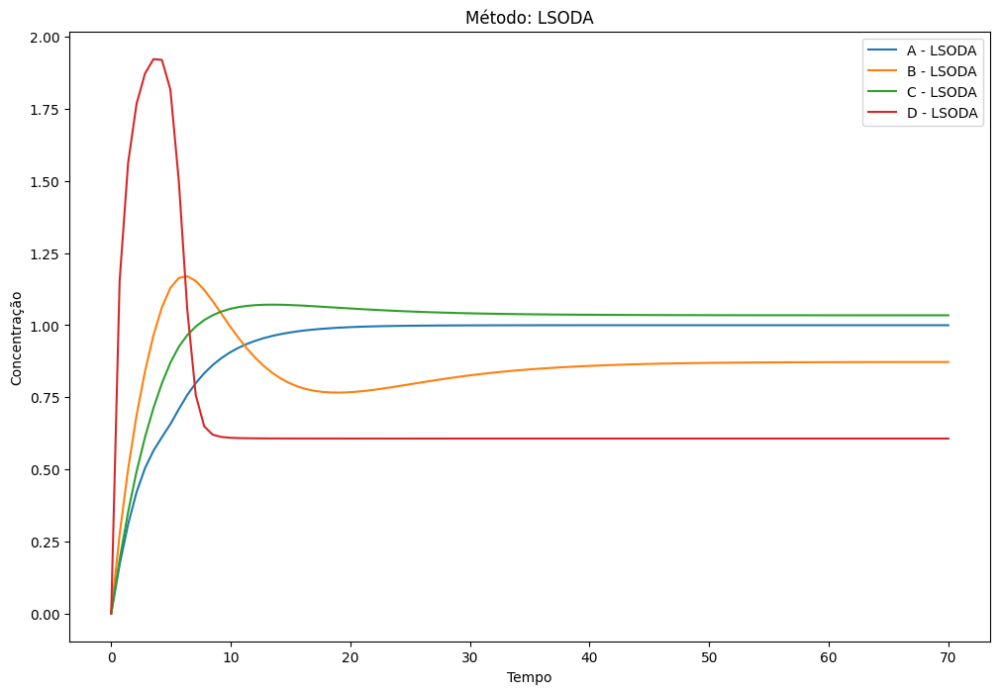

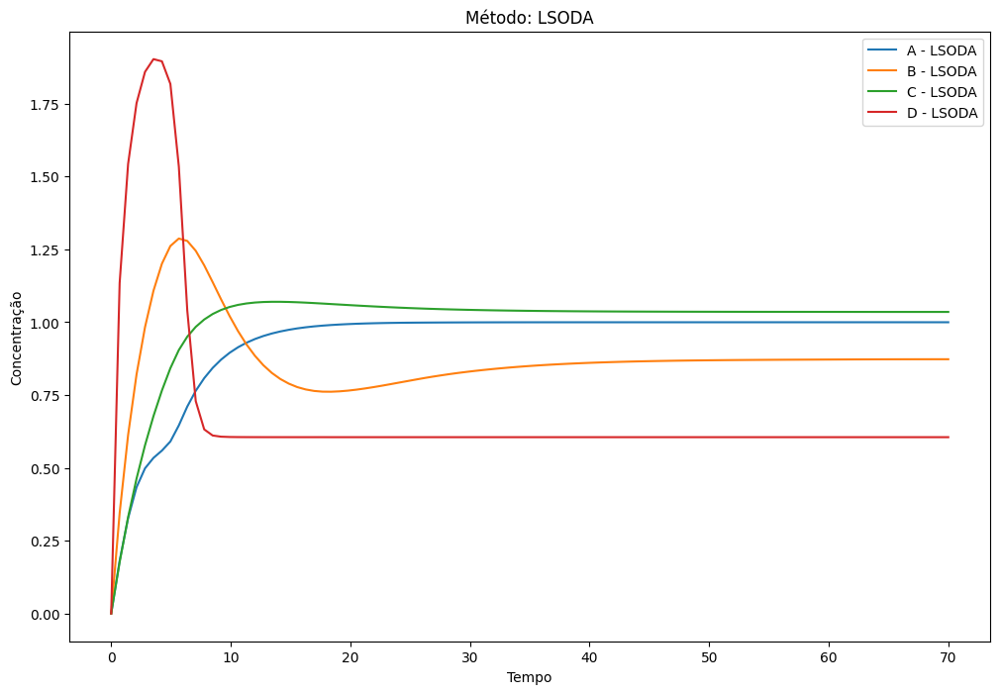

Sigma increased due to no improvement. New sigma: 10.0038441044421880805, 'min': 41.73362060813763, 'max': 41.74613969581392}}}
Sigma increased due to no improvement. New sigma: 5.93891543857917704, 'min': 57.362693192474595, 'max': 194.51866779469762}}
Sigma increased due to no improvement. New sigma: 1582.13751692904957, 'min': 87.45968735316355, 'max': 354.67439999999993}6}
Sigma increased due to no improvement. New sigma: 8.6944280913338655, 'min': 56.83371266590986, 'max': 123.5667038154188}3}}}
Sigma increased due to no improvement. New sigma: 8.551561969910292, 'min': 56.391657785952134, 'max': 208.08174970475767}}}
Sigma increased due to no improvement. New sigma: 9.6974140269678288, 'min': 56.37730407622309, 'max': 70.19017100219183}4}}
Sigma increased due to no improvement. New sigma: 11.6261704840139443, 'min': 55.876364552524635, 'max': 82.5944783801969}}}}
Sigma increased due to no improvement. New sigma: 155805892420696726, 'min': 56.6989181158349, 'max': 77.7965979442888

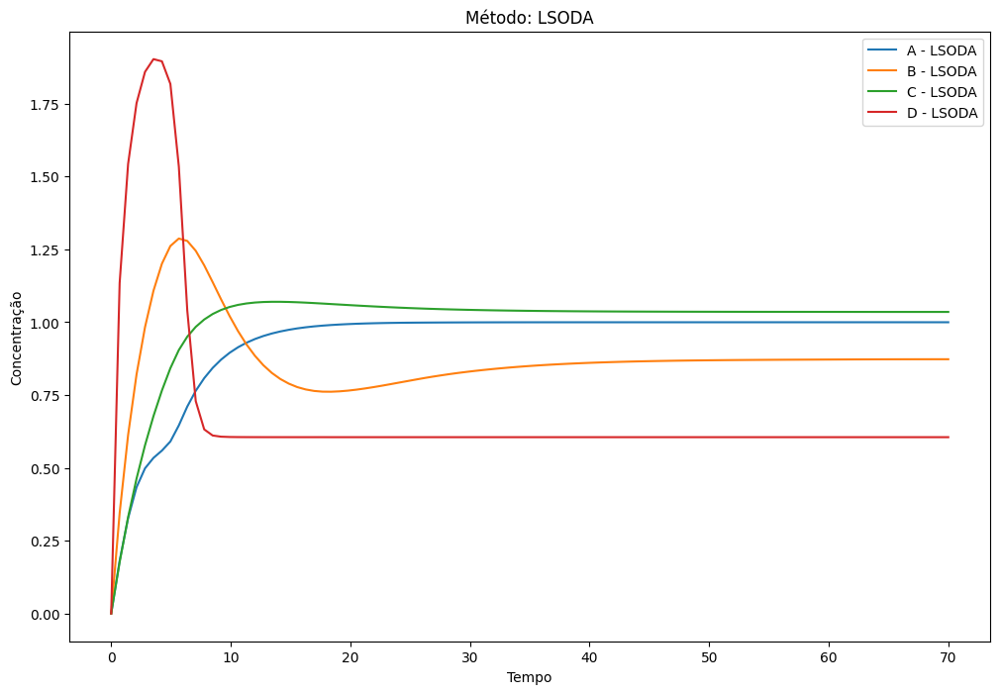

Sigma increased due to no improvement. New sigma: 11.2804141765781895, 'min': 51.273469043414494, 'max': 64.8278802870469}}}}
Sigma increased due to no improvement. New sigma: 11.1141726291958155, 'min': 49.93858032974359, 'max': 58.52433070052622}}}}
Sigma increased due to no improvement. New sigma: 13.4222312207453288, 'min': 51.35243148214499, 'max': 58.55673223554381}5}
Sigma increased due to no improvement. New sigma: 151.3597596482710028, 'min': 56.907196137591974, 'max': 61.432158456889596}
Sigma increased due to no improvement. New sigma: 151.2551386727228406, 'min': 56.26175925709105, 'max': 60.991983009633444}}
Sigma increased due to no improvement. New sigma: 153.170150545881445, 'min': 53.51496823968473, 'max': 127.61498093020892}}}
Sigma increased due to no improvement. New sigma: 15.3835451115199429, 'min': 45.42140008880722, 'max': 50.00364878085082}}}}


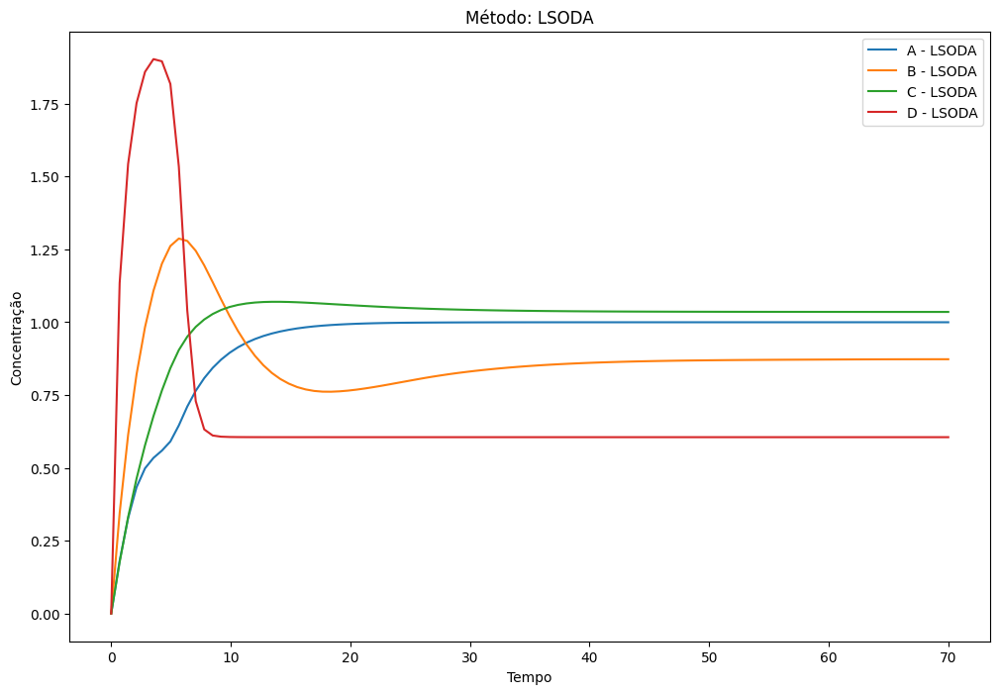

Sigma increased due to no improvement. New sigma: 15.6076040200383702, 'min': 51.76039583927999, 'max': 53.68976433576398}4}
Sigma increased due to no improvement. New sigma: 15.362802051808987, 'min': 48.35502724552472, 'max': 67.5627246059807}2165}


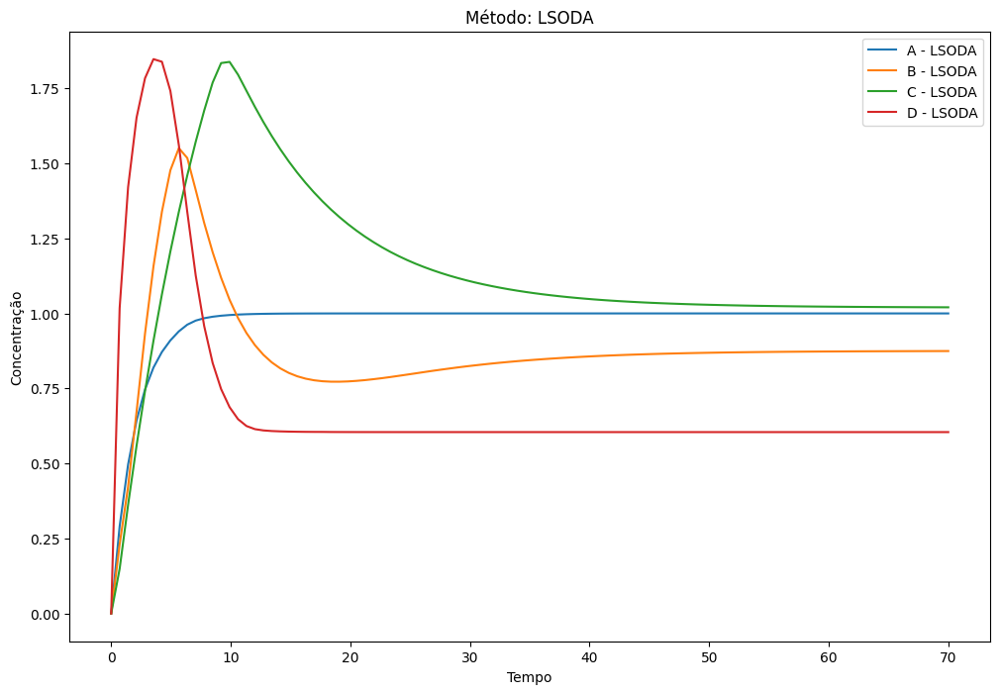

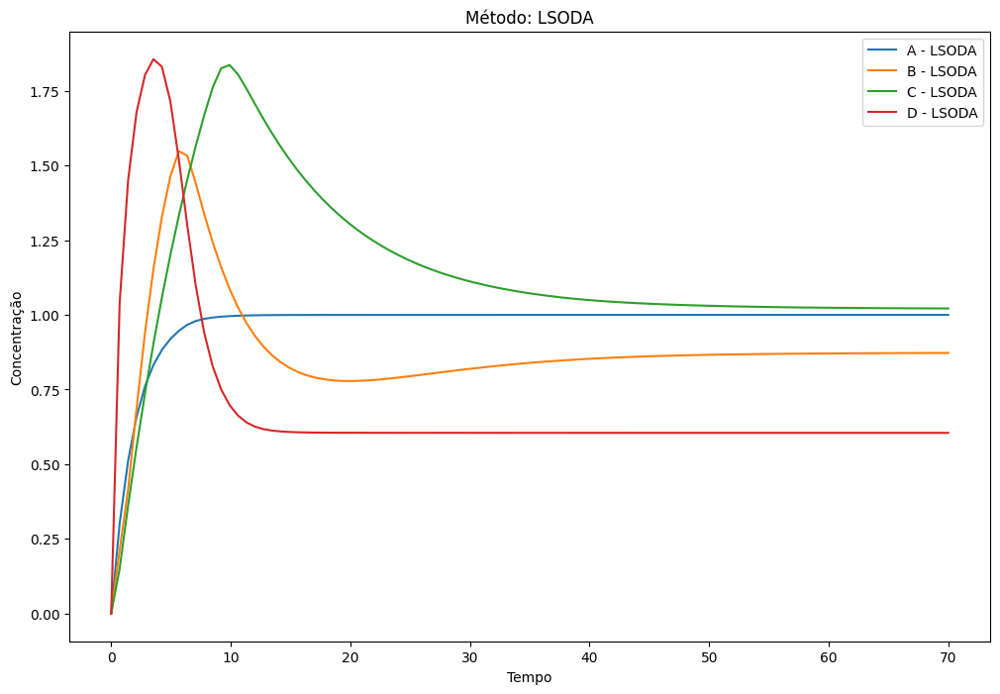

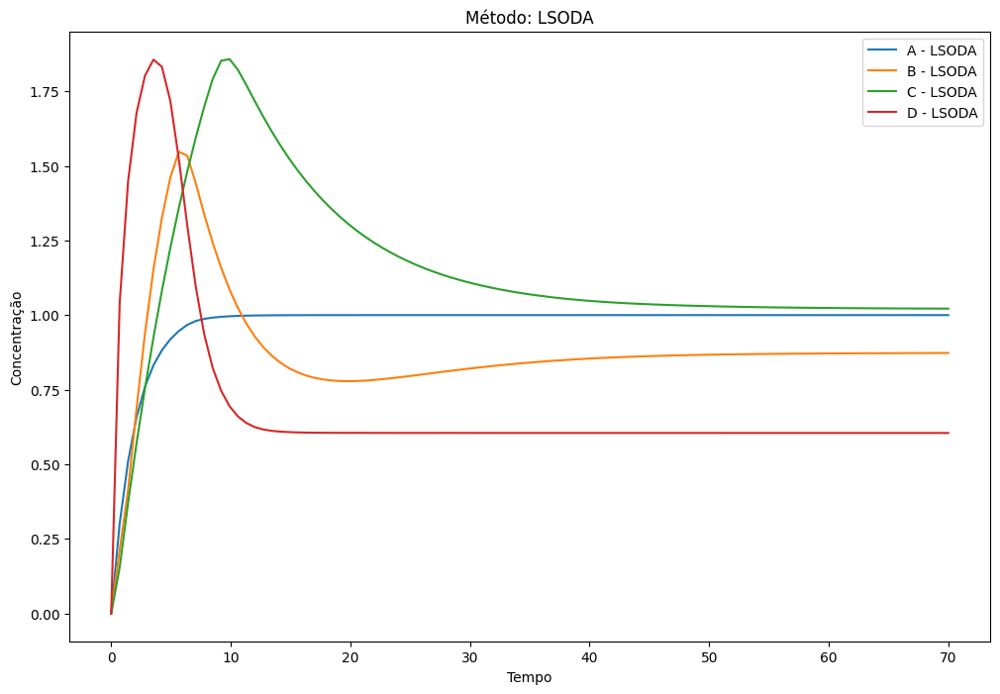

Sigma increased due to no improvement. New sigma: 10.009372972691731046, 'min': 33.29169361082831, 'max': 33.313957017330004}4}


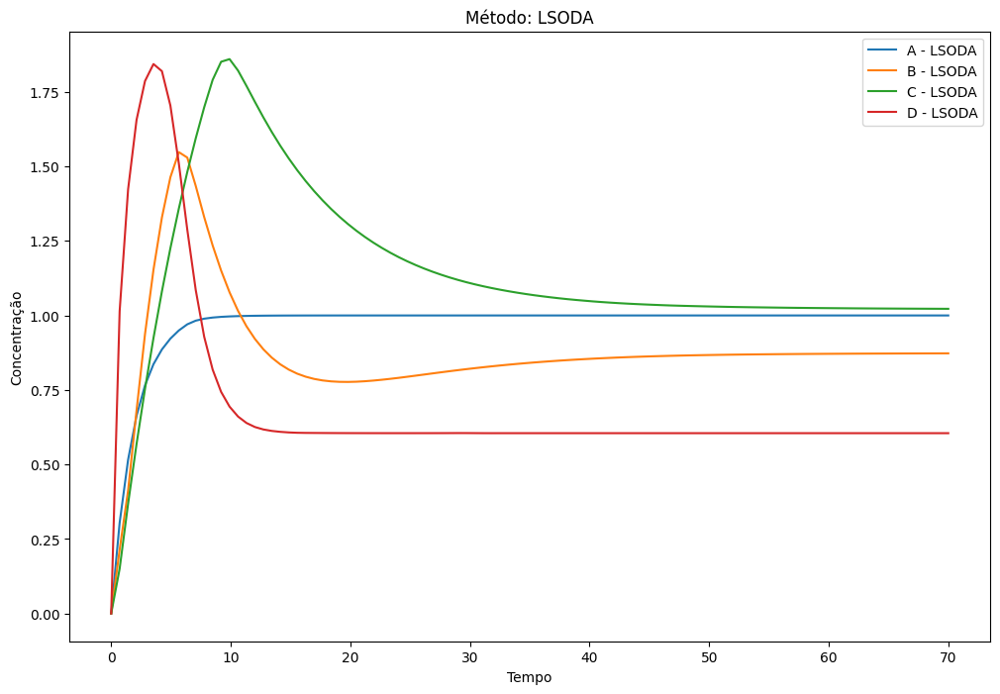

Sigma increased due to no improvement. New sigma: 10.004571350520635285, 'min': 33.27148191228377, 'max': 33.28078582656705}}}
Sigma increased due to no improvement. New sigma: 1.46890310443169859069, 'min': 33.27621989770507, 'max': 33.30777589666064}}}
Sigma increased due to no improvement. New sigma: 2.098447405246583639, 'min': 33.2791492748644, 'max': 33.36446314502179}}6}4}


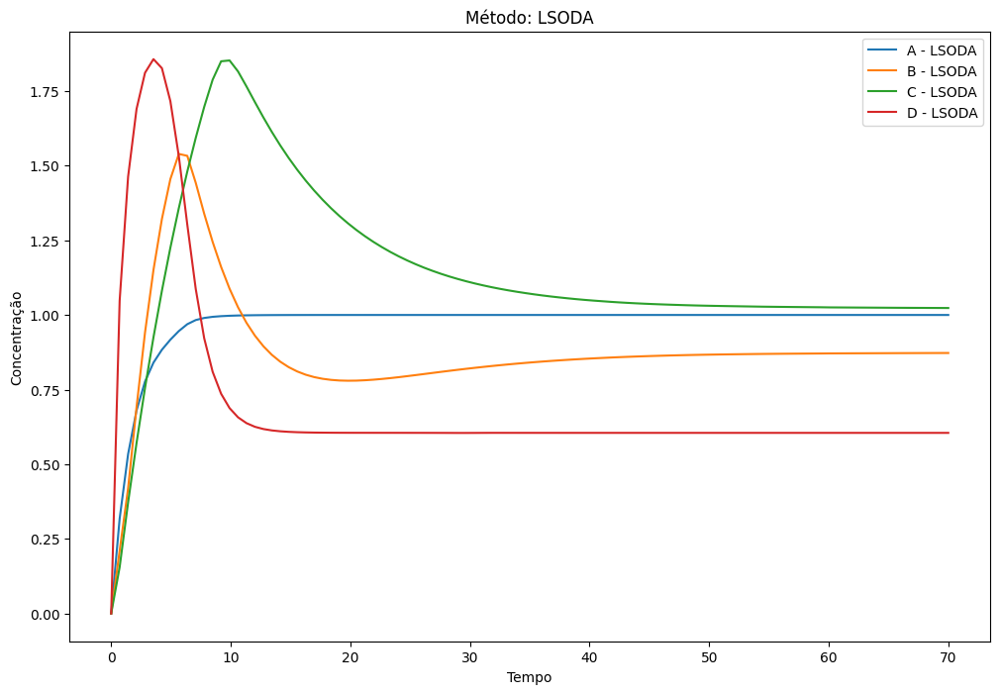

Sigma increased due to no improvement. New sigma: 10.0027031116695706973, 'min': 33.16863313908951, 'max': 33.176207042977694}
Sigma increased due to no improvement. New sigma: 10.003356849048316891, 'min': 33.16880299368247, 'max': 33.17888690457704}}}}
Sigma increased due to no improvement. New sigma: 1 0.006290546380149756, 'min': 33.16200126713797, 'max': 33.178881278659674}3}
Solver: RK45, Error: SQUARED17572525746418, 'std': 0.005143615739079532, 'min': 33.16844897054414, 'max': 33.18650613159894}3}}}


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ivp\common.py:39: UserWarning: The following arguments have no effect for a chosen solver: `min_step`.
  warn("The following arguments have no effect for a chosen solver: {}."


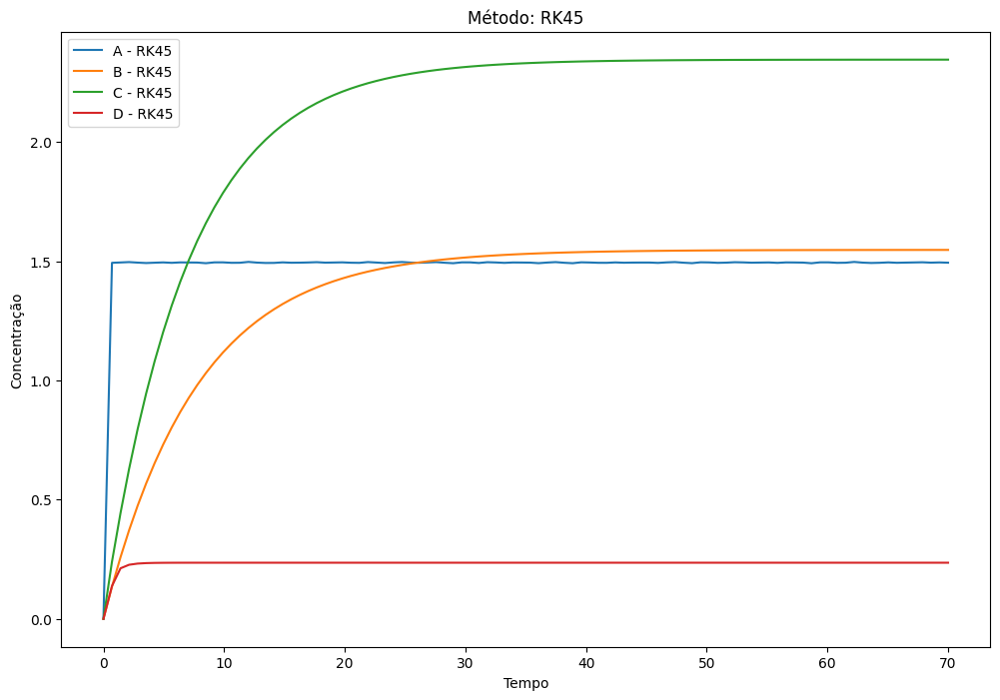

Sigma increased due to no improvement. New sigma: 1.1681603464165329, 'min': 5.039692113143521, 'max': 9.18088845475473}9}}
Sigma increased due to no improvement. New sigma: 2.5618034277195076, 'min': 7.624233811243178, 'max': 8.539671319640826}7}
Sigma increased due to no improvement. New sigma: 4.9975743620138347, 'min': 8.032328836005492, 'max': 10.031908019887931}}
Sigma increased due to no improvement. New sigma: 7.1659036641822351, 'min': 8.371019662154549, 'max': 24.495806866452394}}
Sigma increased due to no improvement. New sigma: 10.082731850186327, 'min': 6.1305936547519035, 'max': 20.62916427373885}}
Sigma increased due to no improvement. New sigma: 10.209174999907173, 'min': 7.848336678369665, 'max': 10.078102036941498}}


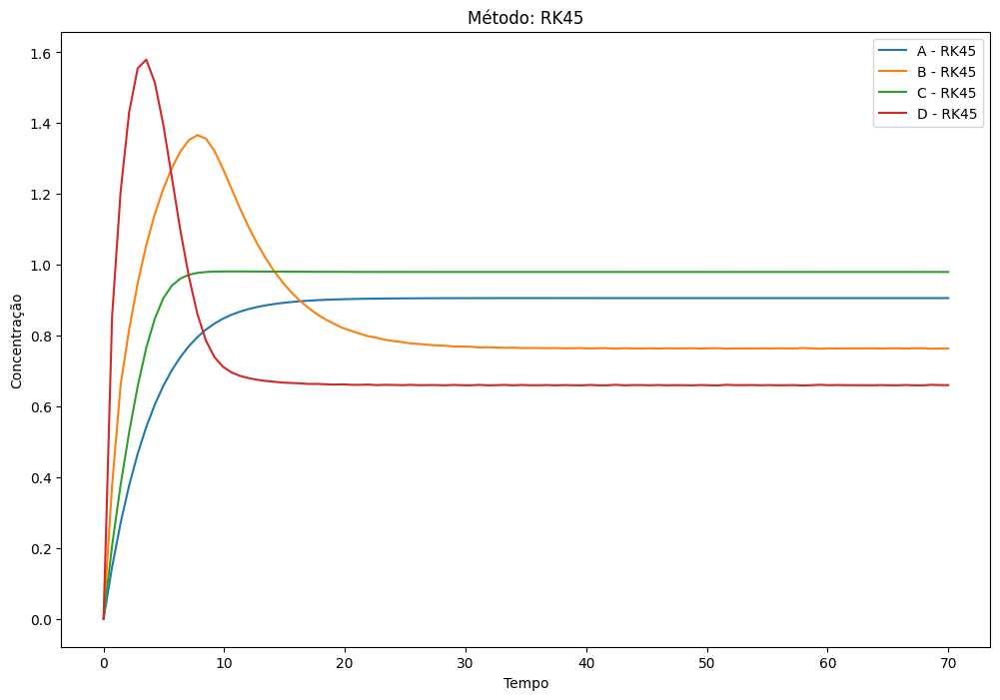

Sigma increased due to no improvement. New sigma: 6.1020812190625864, 'min': 7.532473481597805, 'max': 8.447543445886279}}
Sigma increased due to no improvement. New sigma: 6.574865670397399, 'min': 7.597946448255231, 'max': 9.04697919211176}9}}}
Sigma increased due to no improvement. New sigma: 11.813841183598775, 'min': 5.945289868287166, 'max': 14.37473725590925}}}
Sigma increased due to no improvement. New sigma: 11.543703223275008'min': 5.655360502564891, 'max': 20.722628742825698}}}}
Sigma increased due to no improvement. New sigma: 11.842347895721225, 'min': 5.514133675644868, 'max': 8.320340943877838}}}
Sigma increased due to no improvement. New sigma: 9.01327948554388178, 'min': 7.433063305031415, 'max': 7.895496252050127}}
Sigma increased due to no improvement. New sigma: 9.3710072141736136, 'min': 5.6044157368161915, 'max': 8.301452819988842}}
Sigma increased due to no improvement. New sigma: 9.0245525445526875, 'min': 5.253097425135868, 'max': 8.302609240449703}}}


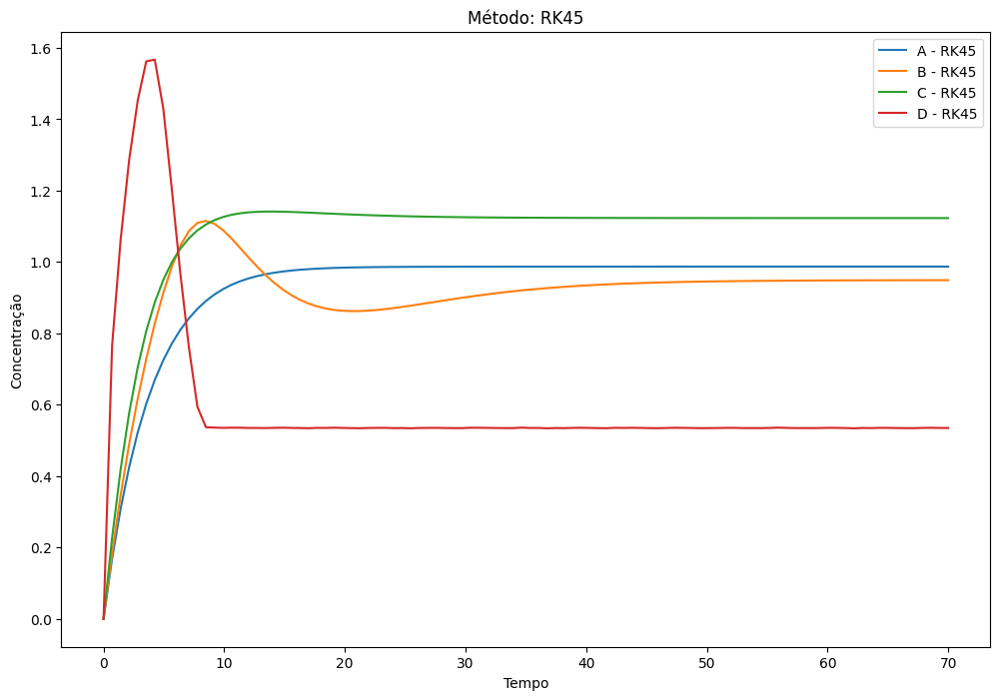

Sigma increased due to no improvement. New sigma: 15.9173936599935074, 'min': 6.113720888488566, 'max': 9.496697796640248}}}
Sigma increased due to no improvement. New sigma: 12.9410984215449701, 'min': 4.44831234418657, 'max': 8.937163733969387}}}}
Sigma increased due to no improvement. New sigma: 15.4284260147429009, 'min': 4.878511962715225, 'max': 9.959080981461833}}}
Sigma increased due to no improvement. New sigma: 15.49583887349358, 'min': 7.356961603295894, 'max': 18.45997765731815}8}}5}
Sigma increased due to no improvement. New sigma: 154526619471716016, 'min': 5.5969118215216795, 'max': 10.969913339788413}}


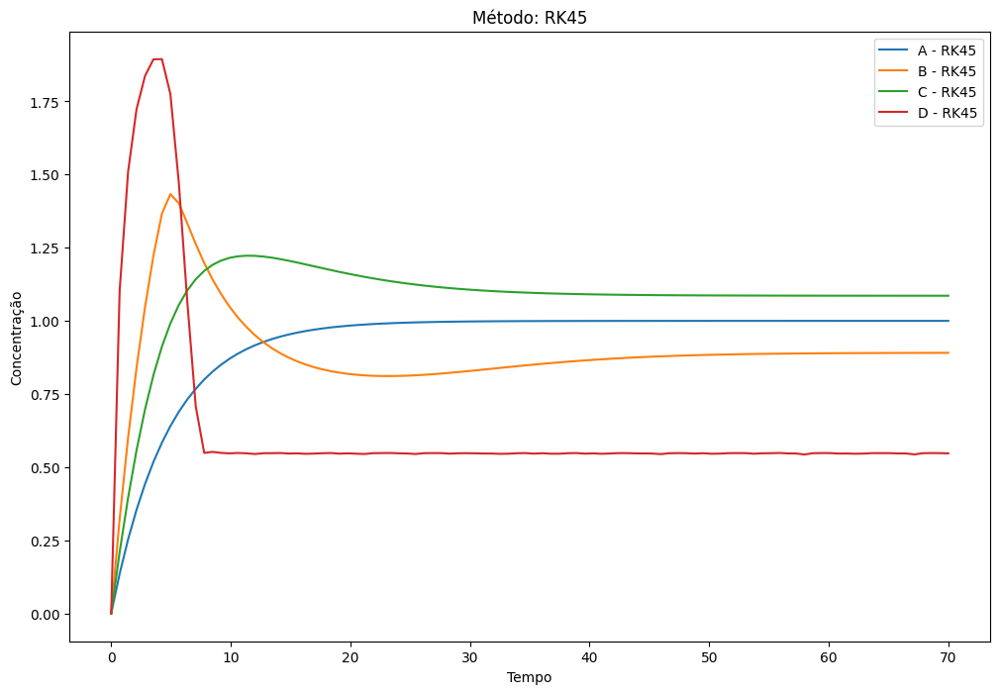

Sigma increased due to no improvement. New sigma: 1 0.00030656169467414065, 'min': 3.7831808020964095, 'max': 3.784478077786824}}
Sigma increased due to no improvement. New sigma: 10.00022965403788735643, 'min': 3.7115234069788605, 'max': 3.712531709116358}}}
Force-stopping RK45 for seed 7, error SQUARED due to timeout.736188576767, 'min': 3.708372358030958, 'max': 3.7109497326143708}}}
Solver: DOP853, Error: SQUARED
Timeout reached for RK45 on seed 7, error SQUARED': 0.0005541511467551677, 'min': 3.7088300489109924, 'max': 3.710958965670568}


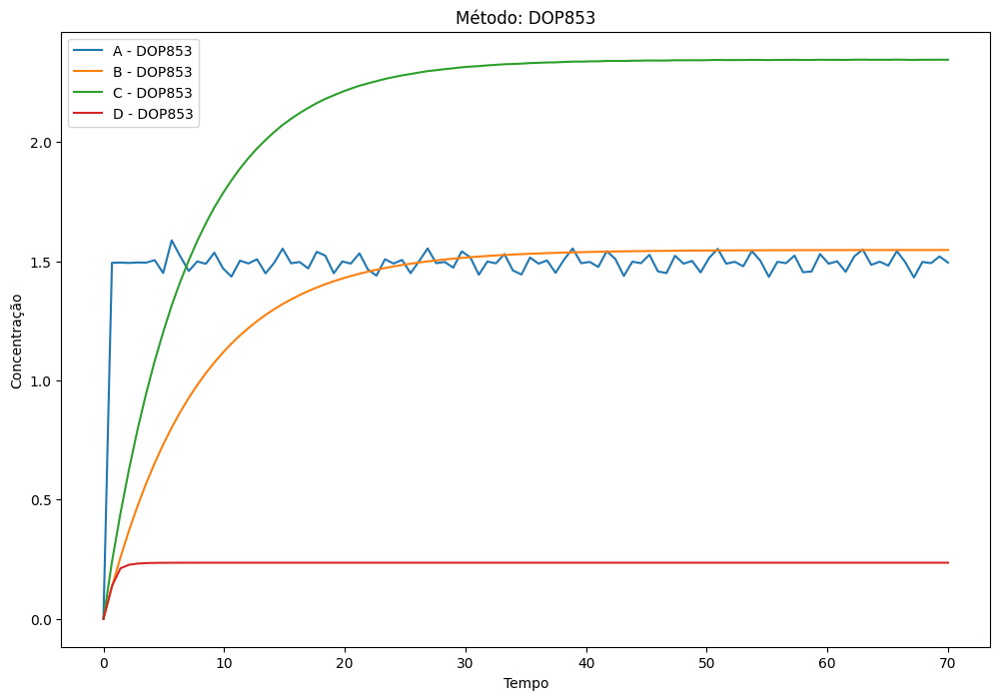

Sigma increased due to no improvement. New sigma: 10.009459996973784515, 'min': 3.7783831187378887, 'max': 3.809083322426784}}
Sigma increased due to no improvement. New sigma: 3.4089034639137665 'min': 5.265110041696643, 'max': 27.730364079064138}4}}}


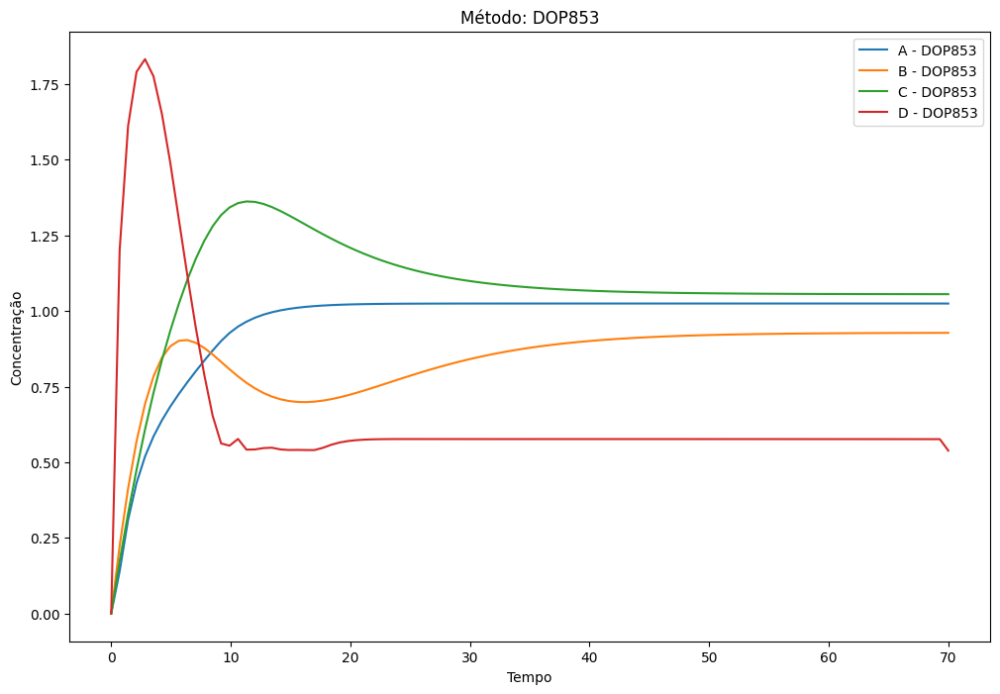

Sigma increased due to no improvement. New sigma: 5.7433085253297635, 'min': 8.382289438692897, 'max': 11.801791271102907}4}
Sigma increased due to no improvement. New sigma: 8.4705542673298584, 'min': 8.178596442961533, 'max': 19.307318851181336}}}
Sigma increased due to no improvement. New sigma: 8.1602342598952564, 'min': 5.7585018430173625, 'max': 18.74423913920011}}}
Sigma increased due to no improvement. New sigma: 12.0481482742181115, 'min': 7.206072338319222, 'max': 21.338247949646476}}
Sigma increased due to no improvement. New sigma: 13.683072899073128 'min': 6.403865588469865, 'max': 22.22100698324967}}}}}
Sigma increased due to no improvement. New sigma: 154141027808336775, 'min': 5.7567747333146375, 'max': 20.192757670967644}}
Sigma increased due to no improvement. New sigma: 15225212643288447, 'min': 4.768278812646619, 'max': 12.7950097588552}136}}
Sigma increased due to no improvement. New sigma: 15609682553470983, 'min': 5.208654224802947, 'max': 19.84582768815105}}6}


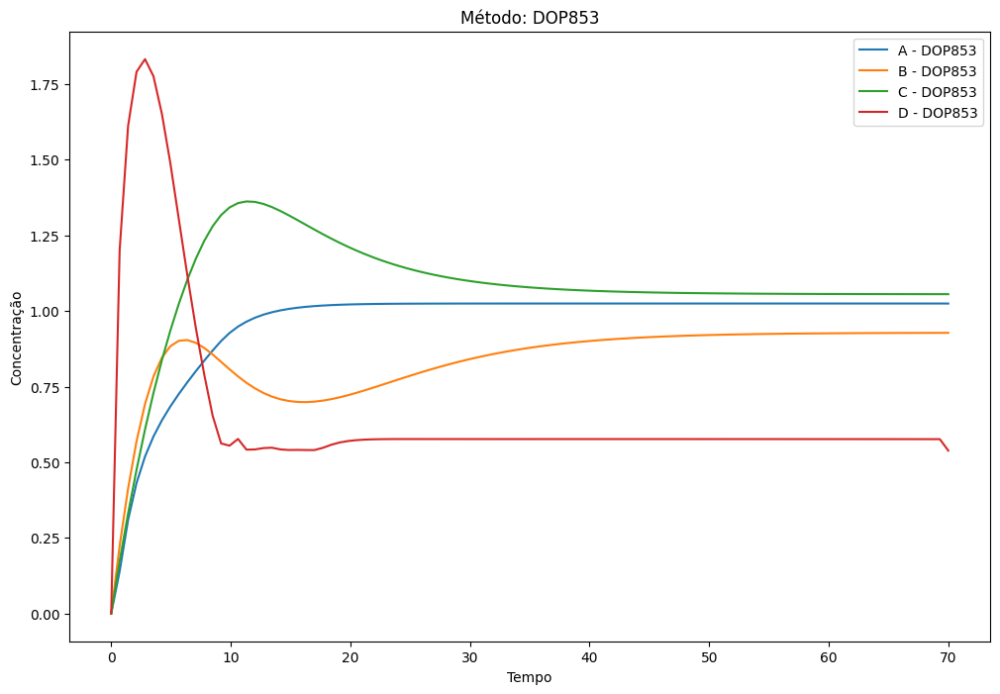

Sigma increased due to no improvement. New sigma: 15.4646653020522655, 'min': 4.675114657830194, 'max': 6.238658596119063}}
Sigma increased due to no improvement. New sigma: 15.6165462503796917, 'min': 4.109002941806446, 'max': 15.036719861037685}}
Sigma increased due to no improvement. New sigma: 150.3967703117619946, 'min': 4.327280577530779, 'max': 5.782070274246228}}
Sigma increased due to no improvement. New sigma: 14.4135666891405412, 'min': 4.073928420906, 'max': 5.472392412530347}094}}
Sigma increased due to no improvement. New sigma: 12.0816244624540144, 'min': 3.9745309684372723, 'max': 9.960255273616394}}


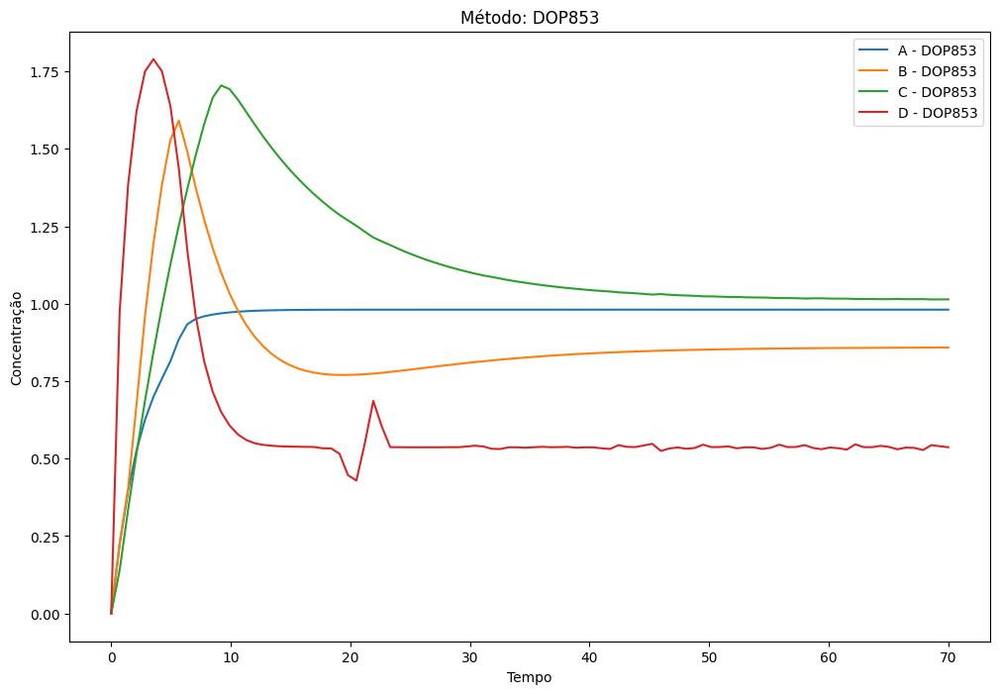

Sigma increased due to no improvement. New sigma: 1 0.0030778086182714575, 'min': 3.178419846802355, 'max': 3.190490115329163}}}
Sigma increased due to no improvement. New sigma: 10.7153309231872533, 'min': 3.1296907948684254, 'max': 5.364635996170184}}02}}


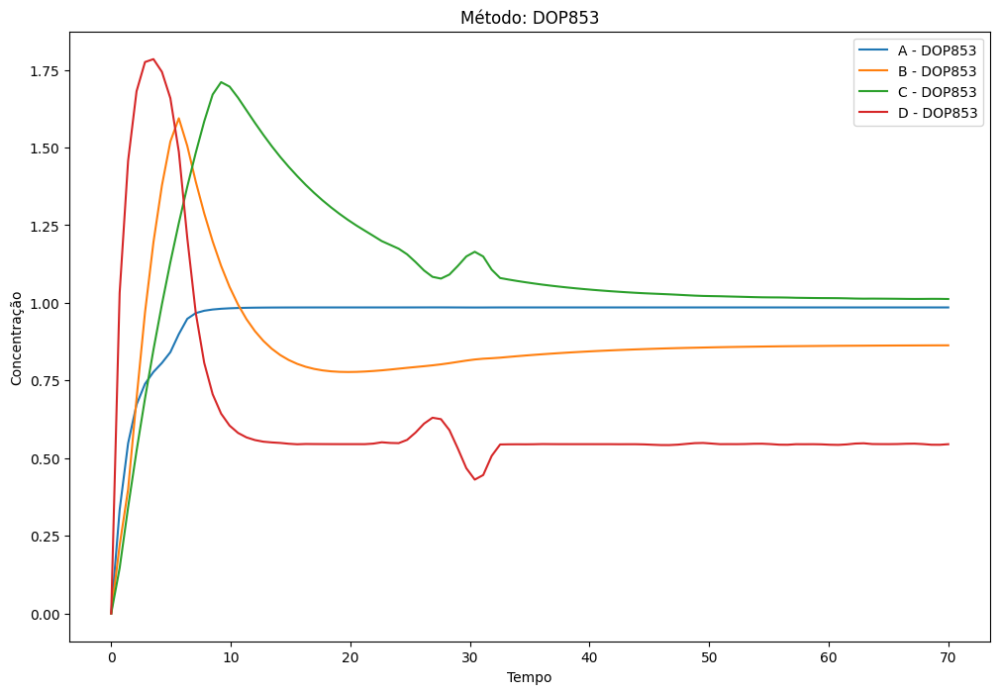

Sigma increased due to no improvement. New sigma: 1 0.0852198611073075, 'min': 3.1196797082133134, 'max': 3.437075518282405}}}}}
Sigma increased due to no improvement. New sigma: 3.099558195623064709475, 'min': 3.1108421355963025, 'max': 3.1392451090467177}
Sigma increased due to no improvement. New sigma: 3.656351103698247756, 'min': 3.1130852605353736, 'max': 3.35299560613607}}4}}}


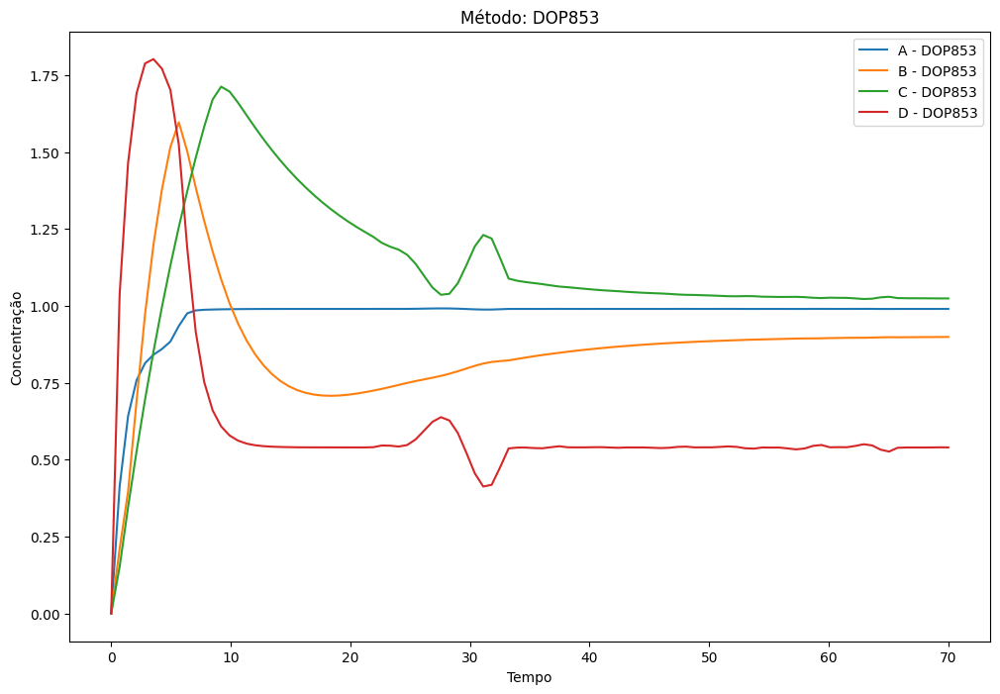

Sigma increased due to no improvement. New sigma: 10.0024531541415068374, 'min': 3.047330438669364, 'max': 3.0574971928745756}}}
Sigma increased due to no improvement. New sigma: 4.63770187959847164, 'min': 3.0574950054268526, 'max': 6.811142347234113}}43}
Sigma increased due to no improvement. New sigma: 6.9965118387156989137, 'min': 3.069498141958785, 'max': 3.1152397320731935}}}
Sigma increased due to no improvement. New sigma: 14.091842352162943522, 'min': 3.077783753966976, 'max': 3.2159215026435657}}
Sigma increased due to no improvement. New sigma: 15016516067284395444, 'min': 3.135736418519733, 'max': 3.2007832709894335}}}
Sigma increased due to no improvement. New sigma: 15.12690316656983916, 'min': 3.11048242169981, 'max': 3.6095558753715915}}8}}


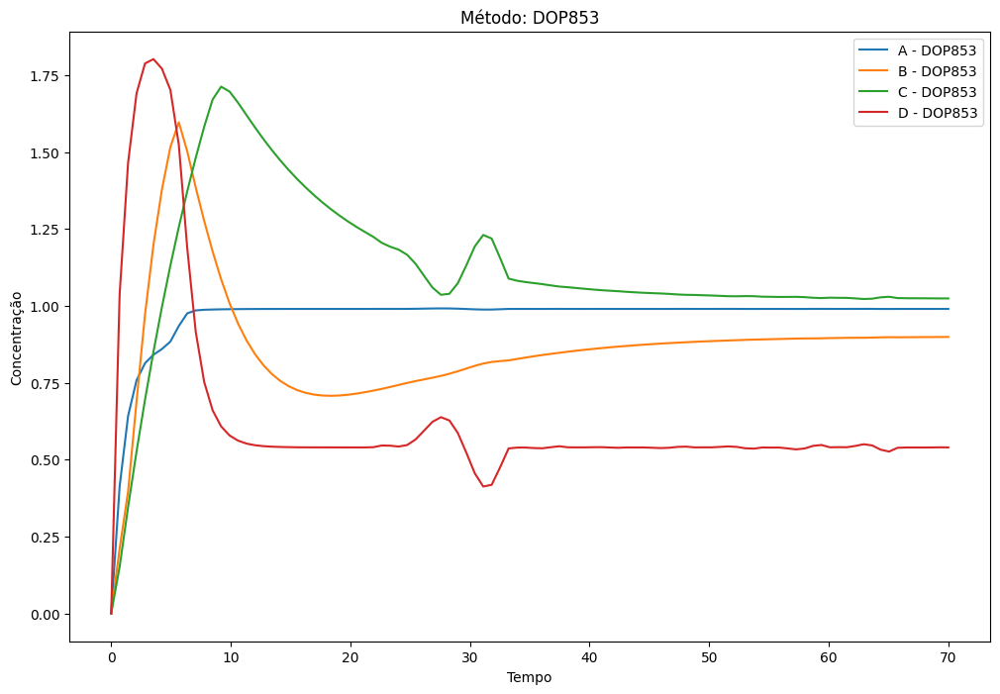

Sigma increased due to no improvement. New sigma: 150.016745035193661155, 'min': 3.151585548389542, 'max': 3.208479448232447}}
Sigma increased due to no improvement. New sigma: 3.54453610242934492153, 'min': 2.964585971469616, 'max': 2.9726077242997553}}}


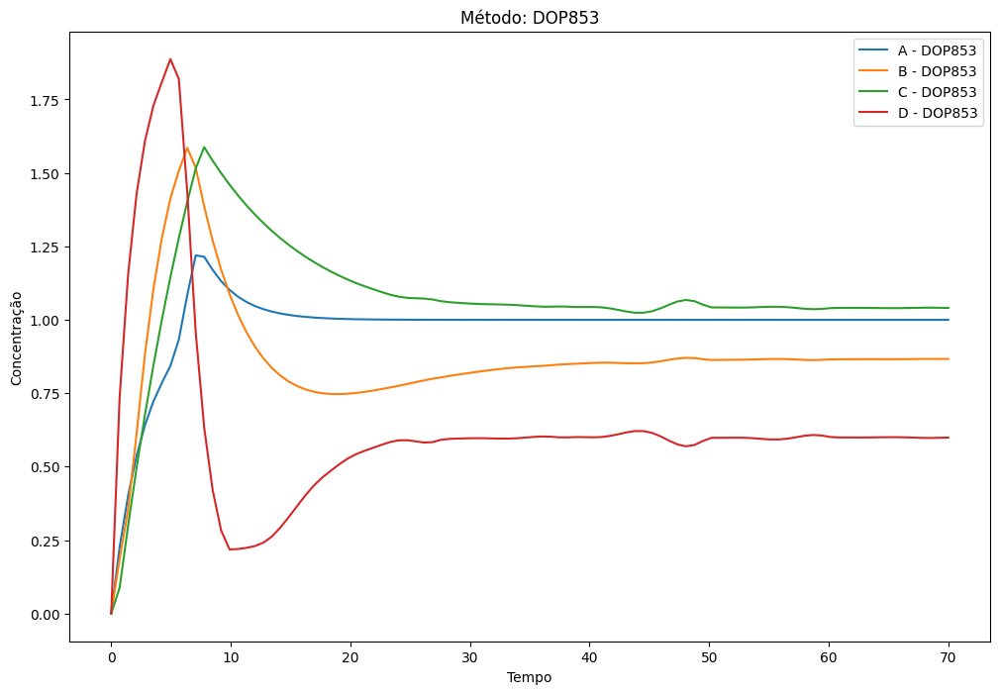

Sigma increased due to no improvement. New sigma: 2.8866318944104991379, 'min': 2.959700147325153, 'max': 2.9792028317102344}5}
Force-stopping DOP853 for seed 7, error SQUARED due to timeout.93764914, 'min': 2.9567960854137554, 'max': 2.983166572732371}}}}
Solver: LSODA, Error: SQUARED


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated error test failures (internal error).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


Timeout reached for DOP853 on seed 7, error SQUARED 0.004545062409309667, 'min': 2.9602455392152667, 'max': 2.974722568628749}


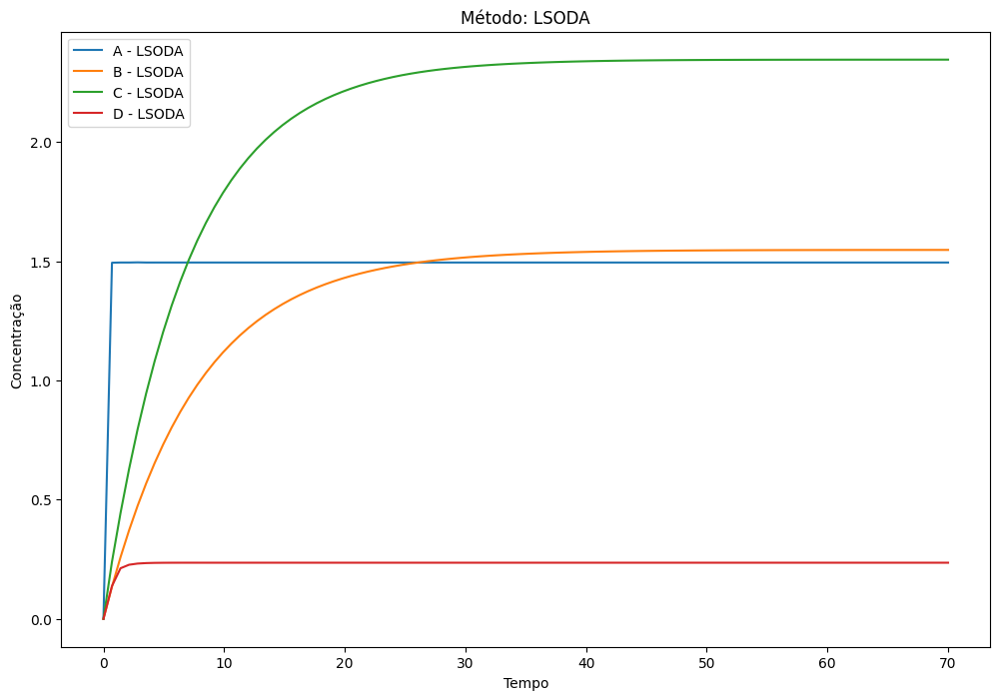

C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated convergence failures (perhaps bad Jacobian or tolerances).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


Sigma increased due to no improvement. New sigma: 1.8520814262636287, 'min': 5.398575862112282, 'max': 8.472953334128292}5}
Sigma increased due to no improvement. New sigma: 3.8525623639295947'min': 7.863155601506103, 'max': 13.133656203821975}7}}
Sigma increased due to no improvement. New sigma: 4.9967876940726638, 'min': 8.201856690923877, 'max': 11.930073811405228}}}
Sigma increased due to no improvement. New sigma: 7.43504646128522, 'min': 5.742826517551264, 'max': 8.659470463767981}34}}}
Sigma increased due to no improvement. New sigma: 8.4126791862556761, 'min': 7.311006564916222, 'max': 22.011659920201694}}}
Sigma increased due to no improvement. New sigma: 9.3783676530168382, 'min': 5.630949586930653, 'max': 25.490179605989034}}}


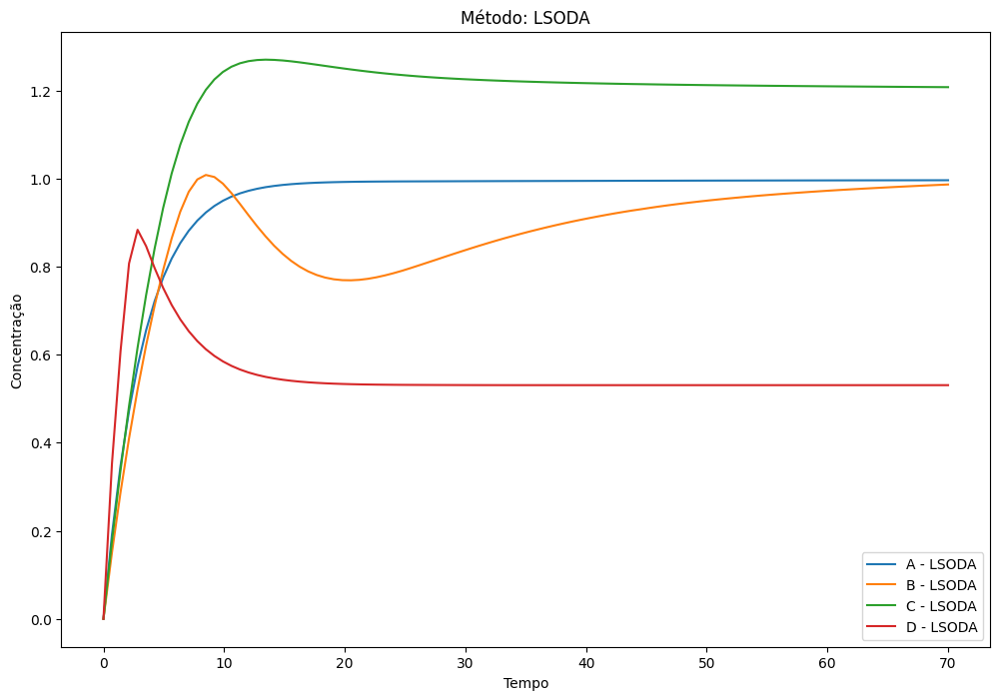

Sigma increased due to no improvement. New sigma: 9.5072818273938771, 'min': 6.955303148620052, 'max': 10.440386496641212}}
Sigma increased due to no improvement. New sigma: 7.3997387743047872, 'min': 7.540266454973149, 'max': 21.315399507295478}}
Sigma increased due to no improvement. New sigma: 4.9425096433958316, 'min': 5.140944250982405, 'max': 18.33353505345737}}}
Sigma increased due to no improvement. New sigma: 11.957472221099055, 'min': 5.754945902388592, 'max': 10.17054552408011}}}


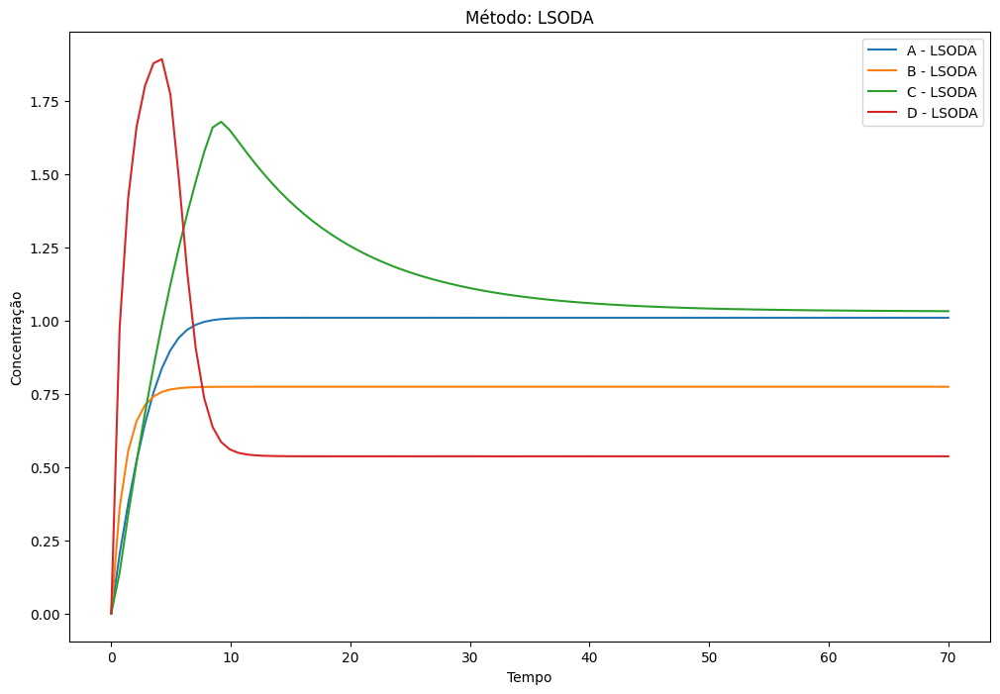

Sigma increased due to no improvement. New sigma: 10.03154835490463526, 'min': 3.694232816339484, 'max': 3.8080400211737357}5}5}
Sigma increased due to no improvement. New sigma: 1.9646727262319201404, 'min': 3.7084282239142934, 'max': 3.8000371269296096}}
Sigma increased due to no improvement. New sigma: 3.93434136968095958, 'min': 3.7272898254752556, 'max': 8.483485932890009}}}


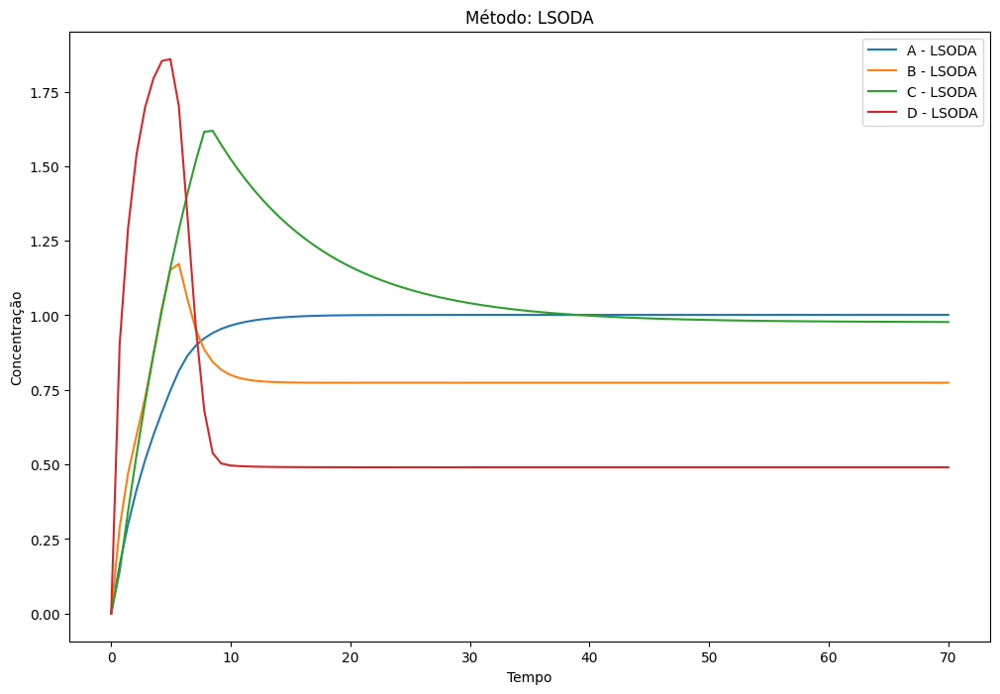

Sigma increased due to no improvement. New sigma: 3.53938528487195244, 'min': 3.700426898025669, 'max': 4.840351782565433}7}4}
Sigma increased due to no improvement. New sigma: 7.20354661432369877, 'min': 3.734330324970589, 'max': 6.912377739094631}743}


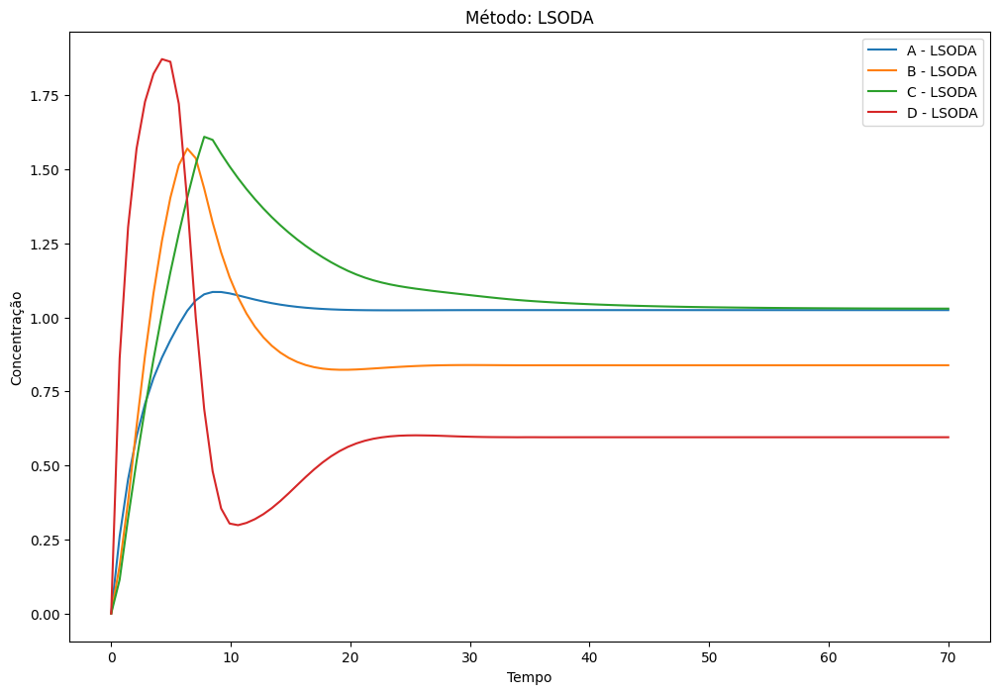

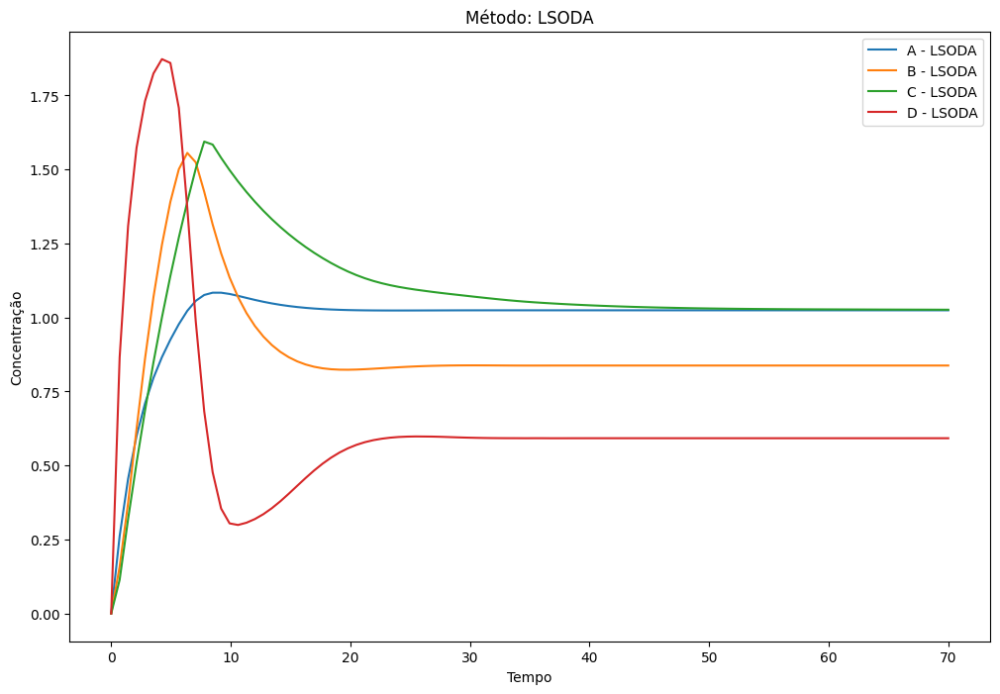

Sigma increased due to no improvement. New sigma: 1 0.01341954379272285, 'min': 2.9407350950383786, 'max': 2.9788251266667585}}}
Sigma increased due to no improvement. New sigma: 2.10265084956329185, 'min': 2.953556600850406, 'max': 2.975428395614219}105}}


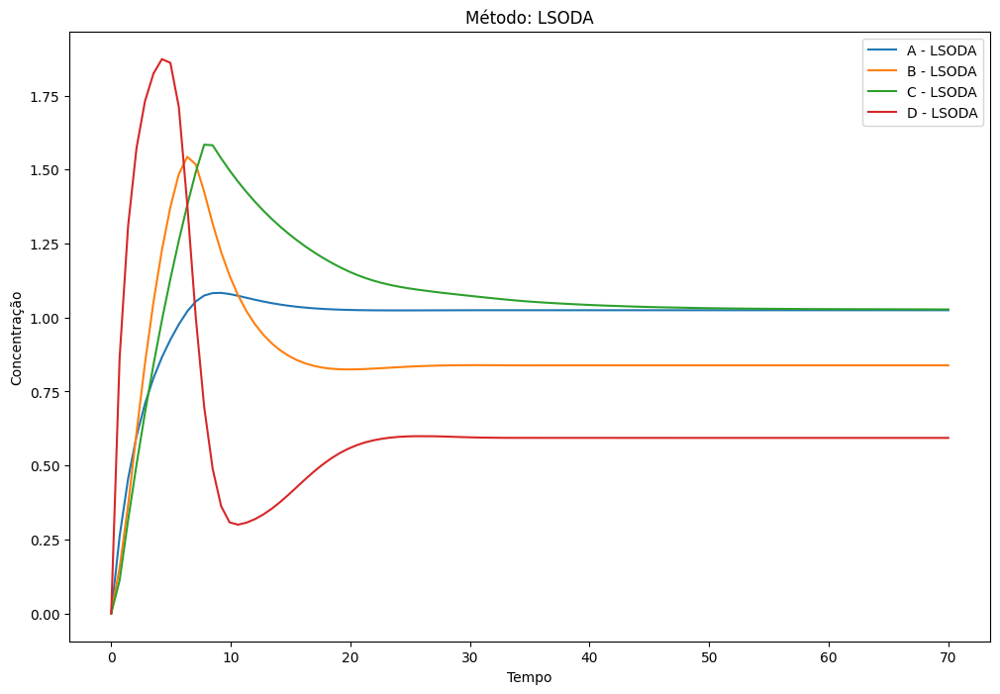

Sigma increased due to no improvement. New sigma: 7.0991806205940222771, 'min': 2.974626739757593, 'max': 3.0803743679560243}}
Sigma increased due to no improvement. New sigma: 15.09283669704415004, 'min': 3.029963847108438, 'max': 3.3605916343710978}3}
Sigma increased due to no improvement. New sigma: 15.548870942304975, 'min': 3.3529978574248798, 'max': 14.923822097338588}}}}
Sigma increased due to no improvement. New sigma: 15.240750268214607, 'min': 3.2630726701405295, 'max': 16.91052849127079}}}
Sigma increased due to no improvement. New sigma: 150.2515730944787988, 'min': 3.133835949880747, 'max': 4.112638223651761}6}}
Sigma increased due to no improvement. New sigma: 15.0098757665538443, 'min': 3.106760946663809, 'max': 6.97278218363466}52}}}


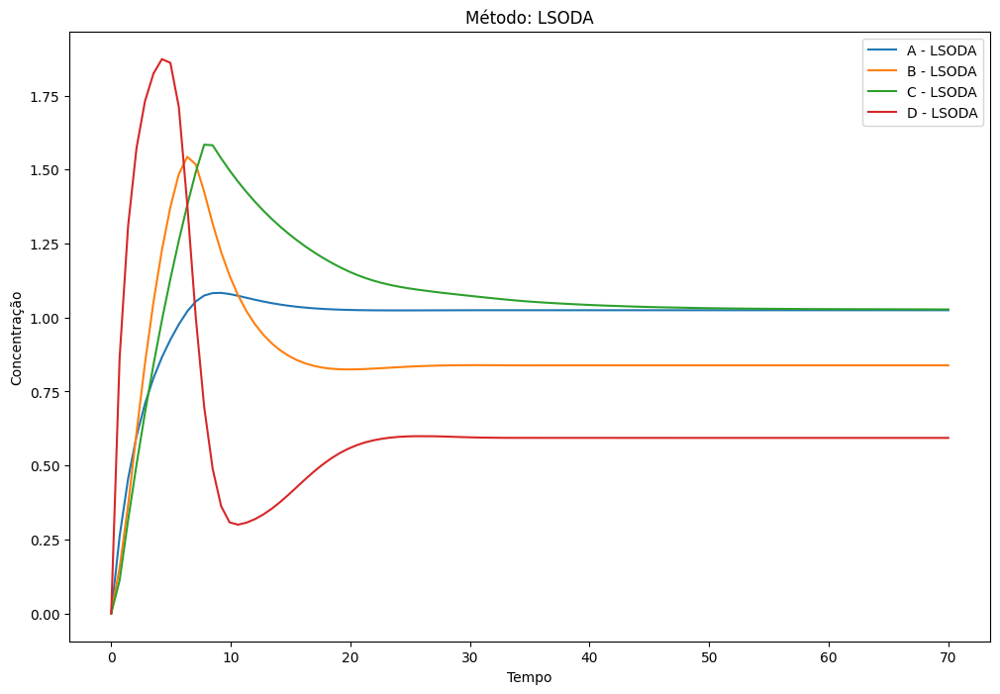

Sigma increased due to no improvement. New sigma: 15.04928084842529391, 'min': 3.1065028554111414, 'max': 3.2583989313509636}}
Sigma increased due to no improvement. New sigma: 150.039839460991512775, 'min': 3.1053568248713797, 'max': 3.25659941969}2916}
Sigma increased due to no improvement. New sigma: 15.017557025927497964, 'min': 3.0981264701054148, 'max': 3.160759641558148}}}
Sigma increased due to no improvement. New sigma: 15.0136113151369279, 'min': 3.0784946173096905, 'max': 3.126791819864196}329}
Sigma increased due to no improvement. New sigma: 15.010804721328721052, 'min': 3.0546719219972864, 'max': 3.094490291289118}}}


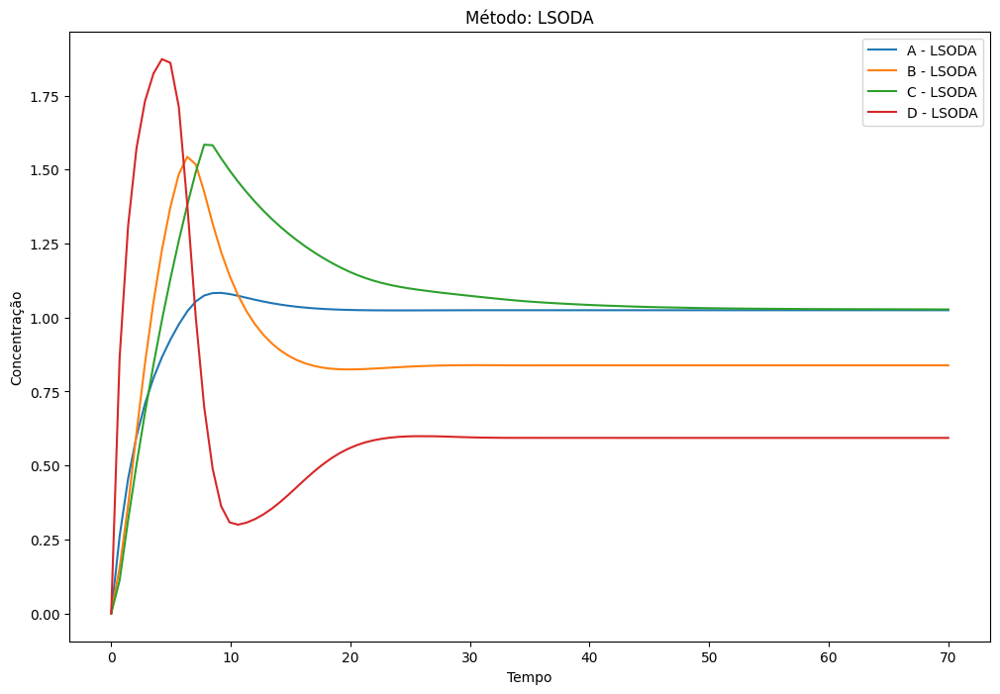

Sigma increased due to no improvement. New sigma: 150.004103456776231518, 'min': 3.059952512590235, 'max': 3.0750682662705984}
Sigma increased due to no improvement. New sigma: 15.004277634054247163, 'min': 3.057375251867989, 'max': 3.0719513851743465}}6}
Sigma increased due to no improvement. New sigma: 15.0012755480752665736, 'min': 3.0584046024643414, 'max': 3.0635137215064976}}
Sigma increased due to no improvement. New sigma: 15.0033882494220657225, 'min': 3.059653274651755, 'max': 3.0698901811815693}}}
Sigma increased due to no improvement. New sigma: 11.16264497599926634208, 'min': 3.06114032202925, 'max': 3.064512637089744}3}}
Sigma increased due to no improvement. New sigma: 8.76250126304826217698, 'min': 3.0605808768969904, 'max': 3.063017970997173}}}}


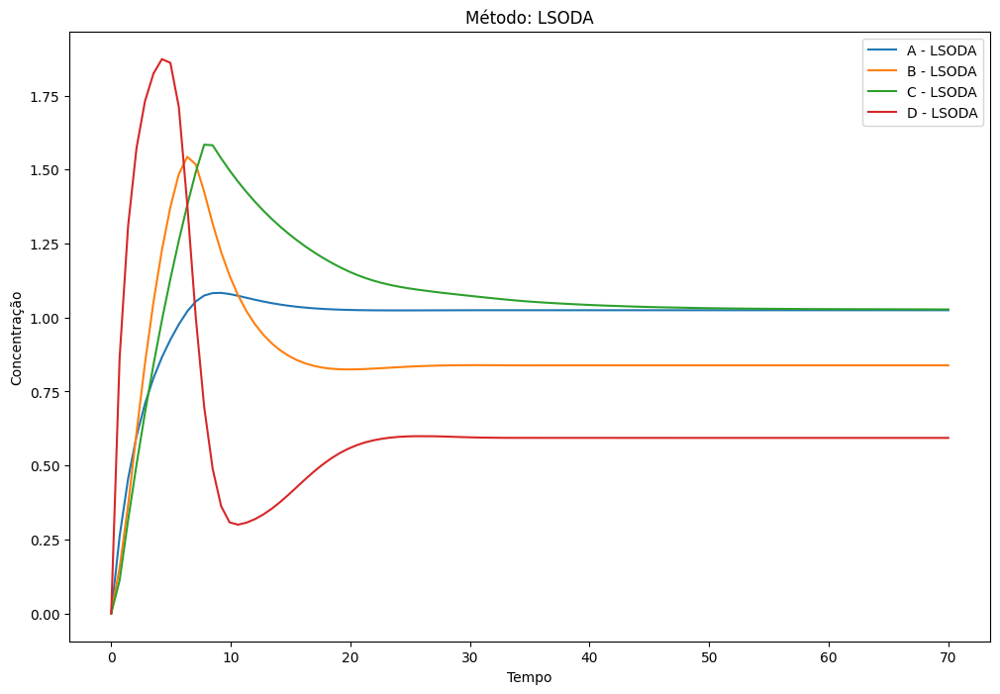

Sigma increased due to no improvement. New sigma: 8.89772178066136699585, 'min': 3.0605733624334053, 'max': 3.061705829630981}5}}
Sigma increased due to no improvement. New sigma: 150.002483910340136364, 'min': 3.0599826997960253, 'max': 3.067792162601302}}}
Sigma increased due to no improvement. New sigma: 150.004341994483115444, 'min': 3.0627878037680487, 'max': 3.0811218309840798}}
Sigma increased due to no improvement. New sigma: 150.000760894770920029, 'min': 3.0587736543558135, 'max': 3.061507942076168}2}}
Sigma increased due to no improvement. New sigma: 15.016999548537509842, 'min': 3.0488651319704565, 'max': 3.104781508299037}}}}
Solver: RK45, Error: MSE 3.0584180623574113, 'std': 0.006022765732046943, 'min': 3.052736000851955, 'max': 3.0750225328371776}}


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ivp\common.py:39: UserWarning: The following arguments have no effect for a chosen solver: `min_step`.
  warn("The following arguments have no effect for a chosen solver: {}."


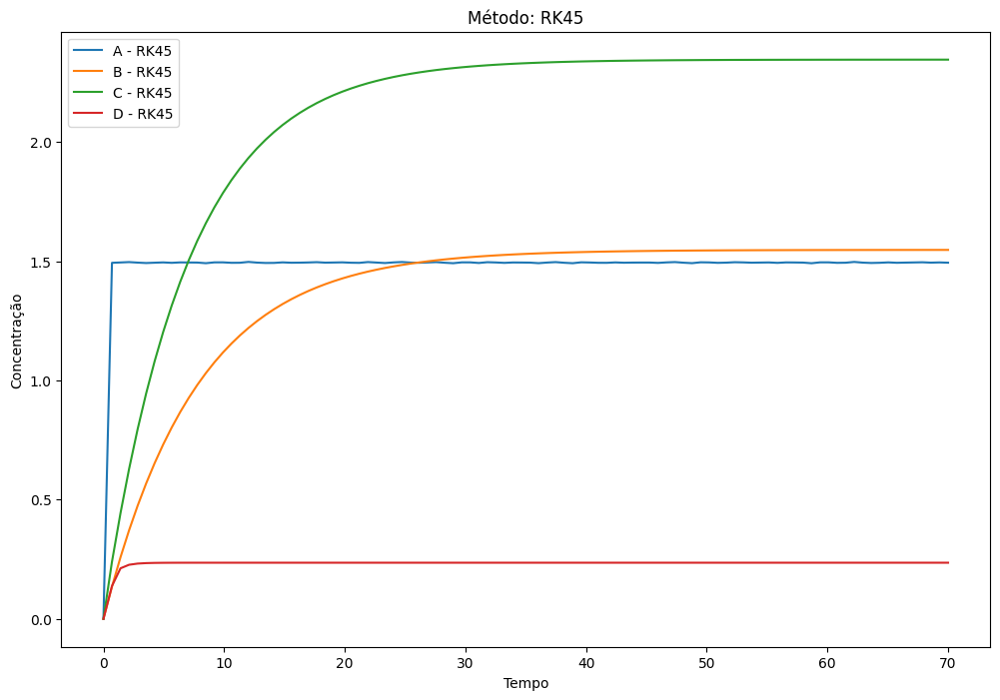

Sigma increased due to no improvement. New sigma: 1.1681603464165329031, 'min': 0.0634962414882025, 'max': 0.21072178204662173}3}
Sigma increased due to no improvement. New sigma: 2.56180342771950784671, 'min': 0.1453223530212592, 'max': 0.1823149656187401}}}
Sigma increased due to no improvement. New sigma: 4.99757436201383462038, 'min': 0.1612957663243133, 'max': 0.2515979462987295}}
Sigma increased due to no improvement. New sigma: 7.165903664182235808, 'min': 0.17518492546044528, 'max': 1.5001113850963401}4}}
Sigma increased due to no improvement. New sigma: 10.08273185018632767, 'min': 0.09396044639921072, 'max': 1.0639060465822583}}}
Sigma increased due to no improvement. New sigma: 10.2091749999071738824, 'min': 0.15399097154260646, 'max': 0.253920351667511}8}


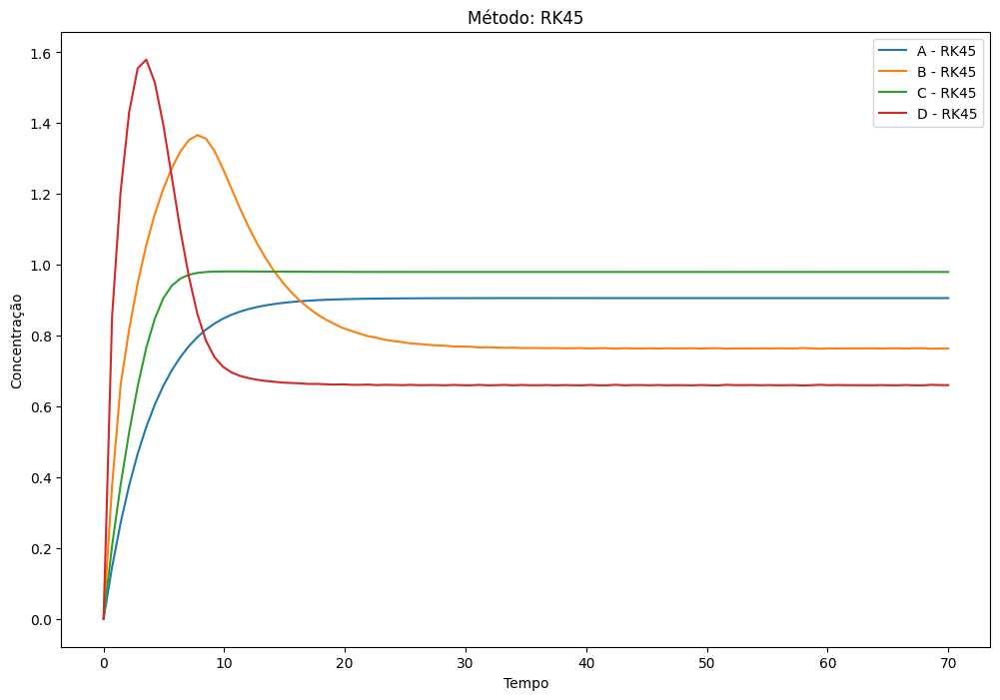

Sigma increased due to no improvement. New sigma: 6.1020812190625867037, 'min': 0.14184539187743533, 'max': 0.17840247567534065}}
Sigma increased due to no improvement. New sigma: 6.57486567039739937675, 'min': 0.1443219755763857, 'max': 0.20461958125625793}2}
Sigma increased due to no improvement. New sigma: 11.813841183598775679, 'min': 0.08836617904489504, 'max': 0.5165826779410635}}}
Sigma increased due to no improvement. New sigma: 11.54370322327500856, 'min': 0.07995775603492757, 'max': 1.0735683550324644}6}}
Sigma increased due to no improvement. New sigma: 11.842347895721225112, 'min': 0.07601417548220192, 'max': 0.17307018355592482}}
Sigma increased due to no improvement. New sigma: 9.0132794855438818997, 'min': 0.13812607524151133, 'max': 0.15584715266534402}}
Sigma increased due to no improvement. New sigma: 9.37100721417361366624, 'min': 0.07852368937768243, 'max': 0.17228529730625172}
Sigma increased due to no improvement. New sigma: 9.02455254455268711056, 'min': 0.068987

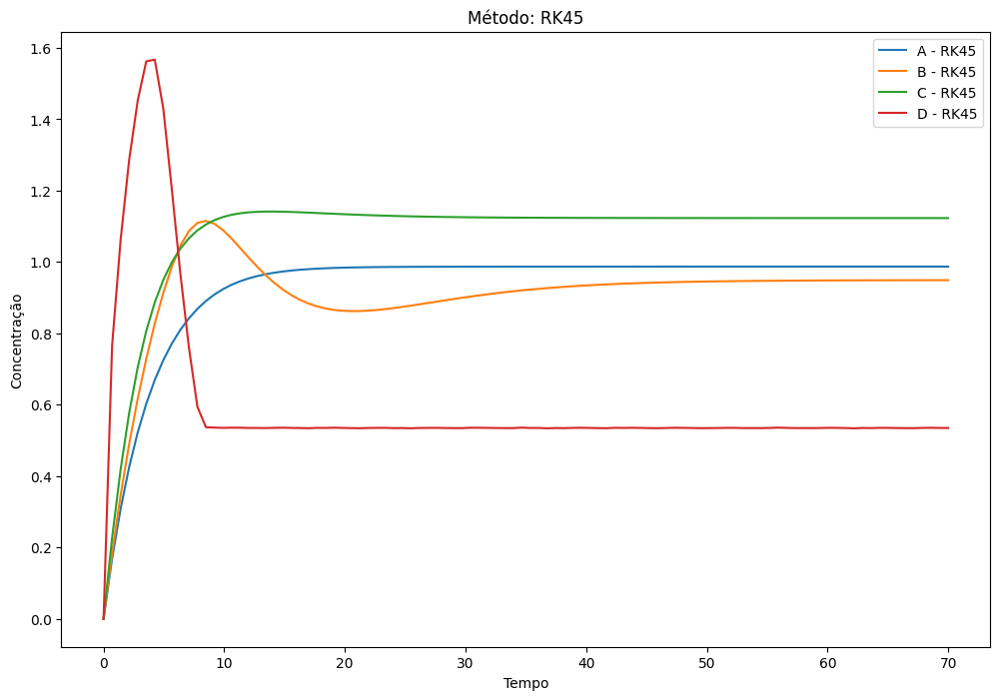

Sigma increased due to no improvement. New sigma: 15 0.035891829438938254, 'min': 0.09344395775585357, 'max': 0.2254681726017794}}
Sigma increased due to no improvement. New sigma: 12.941098421544946992, 'min': 0.049468706778606555, 'max': 0.19968223901944404}3}
Sigma increased due to no improvement. New sigma: 15 0.05385813139415715, 'min': 0.05949969742588889, 'max': 0.247958234988287}22}
Sigma increased due to no improvement. New sigma: 150.222425578019266, 'min': 0.13531221008092525, 'max': 0.8519269377717131}3}}2}
Sigma increased due to no improvement. New sigma: 15 0.05838363346111951, 'min': 0.07831355484472283, 'max': 0.30084749670616934}}


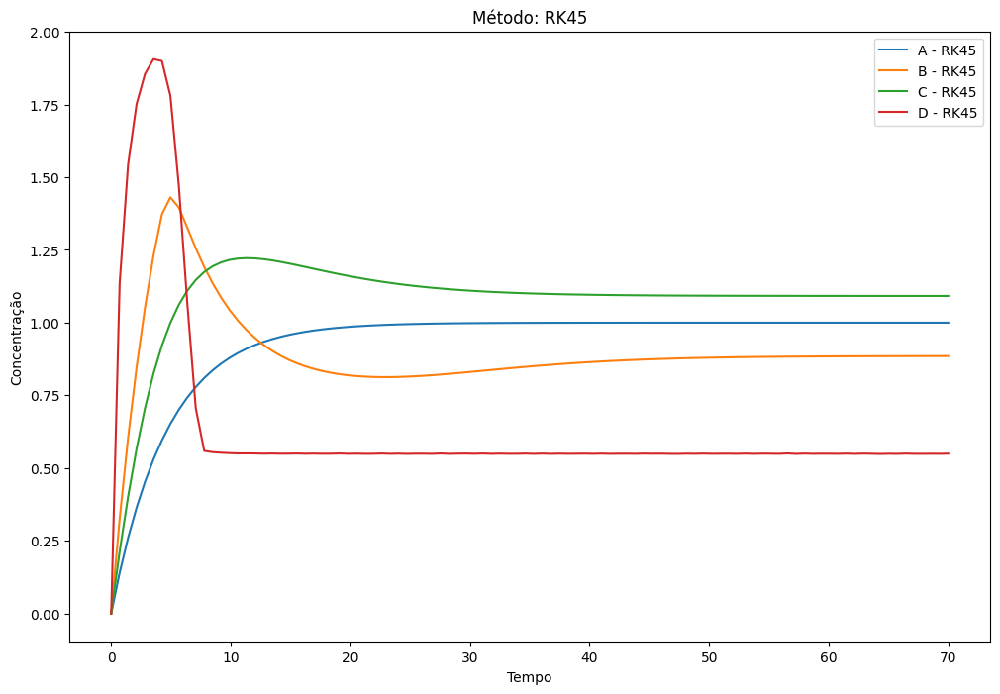

Sigma increased due to no improvement. New sigma: 1: 5.799884777739758e-06, 'min': 0.03578114245337709, 'max': 0.03580568580312263}}5}
Sigma increased due to no improvement. New sigma: 1: 9.193723384580791e-06, 'min': 0.034448832747027064, 'max': 0.0344774506306753}}6}}
Sigma increased due to no improvement. New sigma: 1.8976114239082251245e-05, 'min': 0.034445118272736, 'max': 0.03448608937106992}56}}
Force-stopping RK45 for seed 7, error MSE due to timeout.91323224935664e-05, 'min': 0.03455391103081955, 'max': 0.034812541530067735}
Solver: DOP853, Error: MSE
Timeout reached for RK45 on seed 7, error MSE, 'std': 0.00037998629706715757, 'min': 0.0344733128948294, 'max': 0.03601938260555384}


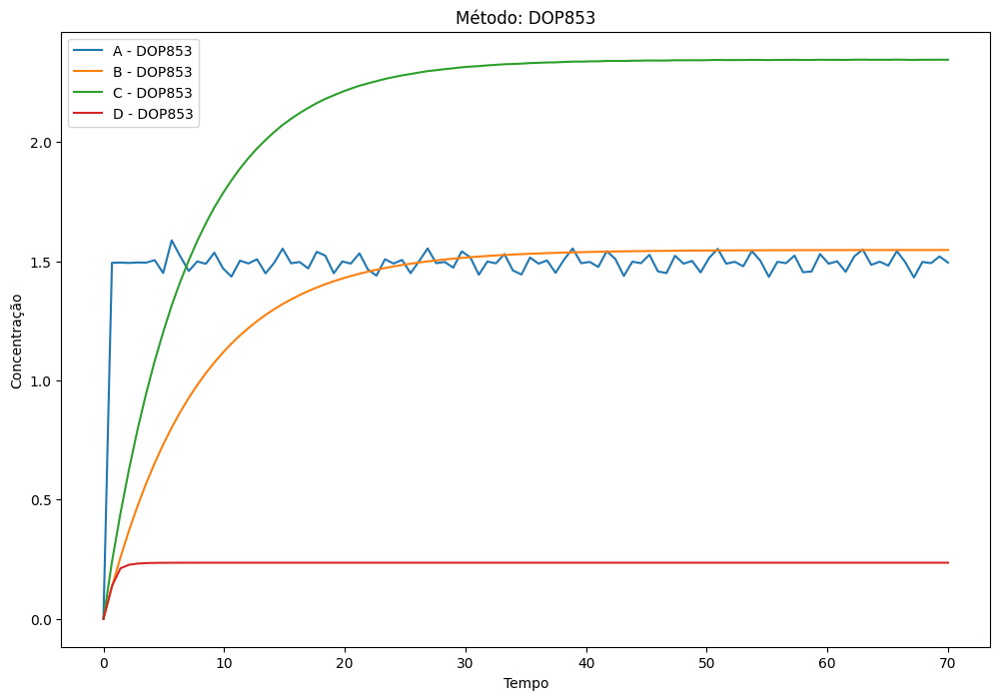

Sigma increased due to no improvement. New sigma: 1 0.00017942757248316896, 'min': 0.03569044747990864, 'max': 0.036272789392974666}}}
Sigma increased due to no improvement. New sigma: 3.408903463913766597, 'min': 0.06930345937793708, 'max': 1.922432729893627}55}8296}


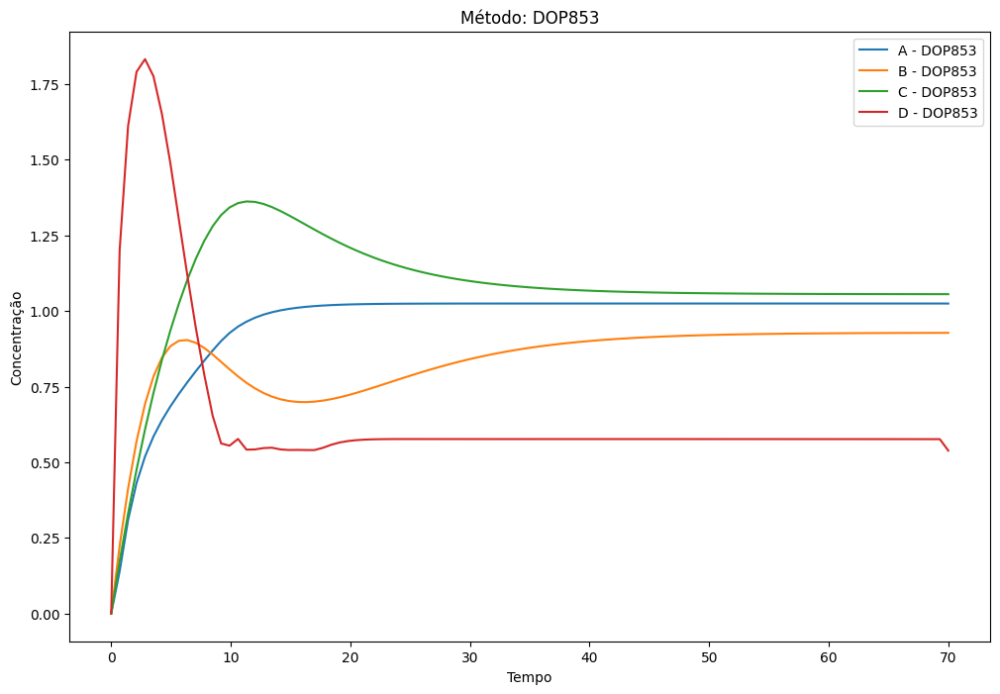

Sigma increased due to no improvement. New sigma: 5.7433085253297635536, 'min': 0.17565694058505618, 'max': 0.3482056930167022}
Sigma increased due to no improvement. New sigma: 8.47055426732985822, 'min': 0.16722359944205759, 'max': 0.9319314030529555}}}
Sigma increased due to no improvement. New sigma: 8.160234259895256383, 'min': 0.08290085869008593, 'max': 0.8783662522688034}}
Sigma increased due to no improvement. New sigma: 12.048148274218111986, 'min': 0.1298186963627237, 'max': 1.13830206390148}}5}
Sigma increased due to no improvement. New sigma: 13.6830728990731288, 'min': 0.10252373618797121, 'max': 1.2344328783740761}34}
Sigma increased due to no improvement. New sigma: 15.29522960593075426, 'min': 0.08285113832532458, 'max': 1.019368655896057}}}}
Sigma increased due to no improvement. New sigma: 15.09919241983274375, 'min': 0.056841207087836666, 'max': 0.40928068682299956}
Sigma increased due to no improvement. New sigma: 15.23120089595295676, 'min': 0.06782519708389399, '

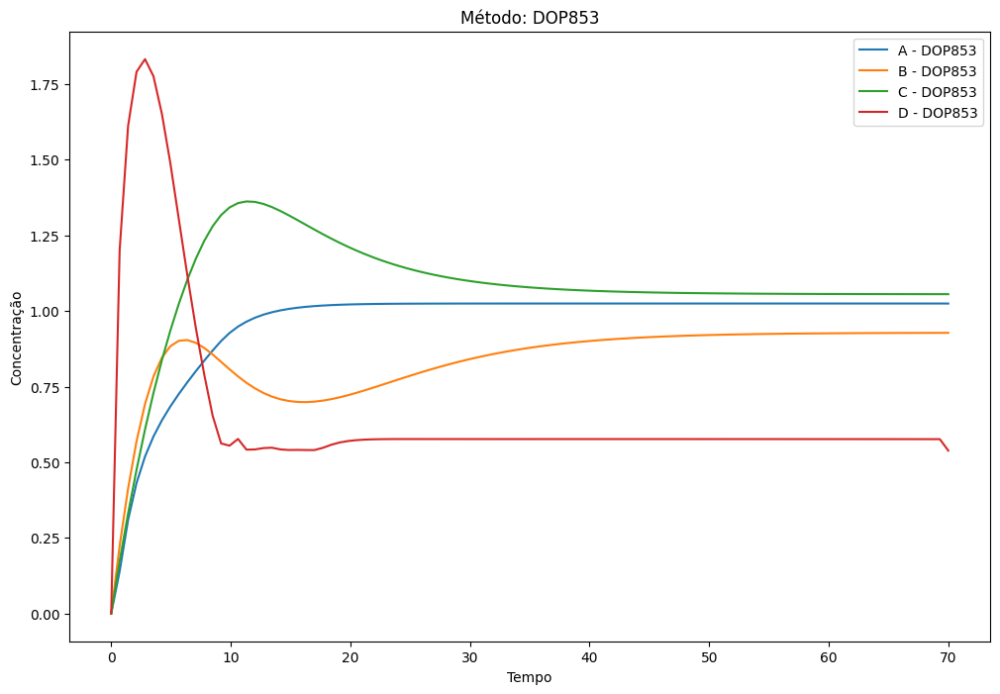

Sigma increased due to no improvement. New sigma: 15 0.012612797384374569, 'min': 0.0546417426596468, 'max': 0.09730215269732571}}
Sigma increased due to no improvement. New sigma: 15 0.17822060056668004, 'min': 0.04220976293943507, 'max': 0.5652573604483131}7}
Sigma increased due to no improvement. New sigma: 15 0.010090298886627205, 'min': 0.04681339299168776, 'max': 0.0835808416408046}}4}
Sigma increased due to no improvement. New sigma: 14.413566689140541224137, 'min': 0.04149223194666414, 'max': 0.07486769679179929}}
Sigma increased due to no improvement. New sigma: 12.08162446245401444, 'min': 0.03949224104766731, 'max': 0.2480167127890079}90886}


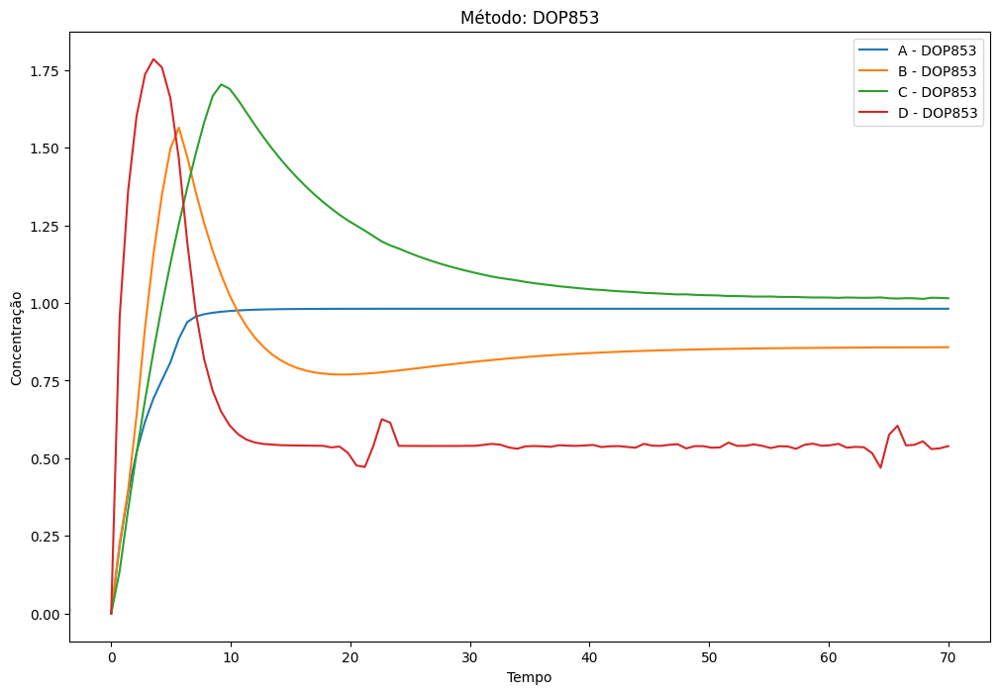

Sigma increased due to no improvement. New sigma: 1': 7.472054560041277e-05, 'min': 0.02521174295935112, 'max': 0.02550310164770618}6}}
Sigma increased due to no improvement. New sigma: 1: 0.00014110154555131165, 'min': 0.02455672182432073, 'max': 0.02521322284028776}43}
Sigma increased due to no improvement. New sigma: 1.33769071853744567255846, 'min': 0.024650262893999523, 'max': 0.02568217021384491}}}


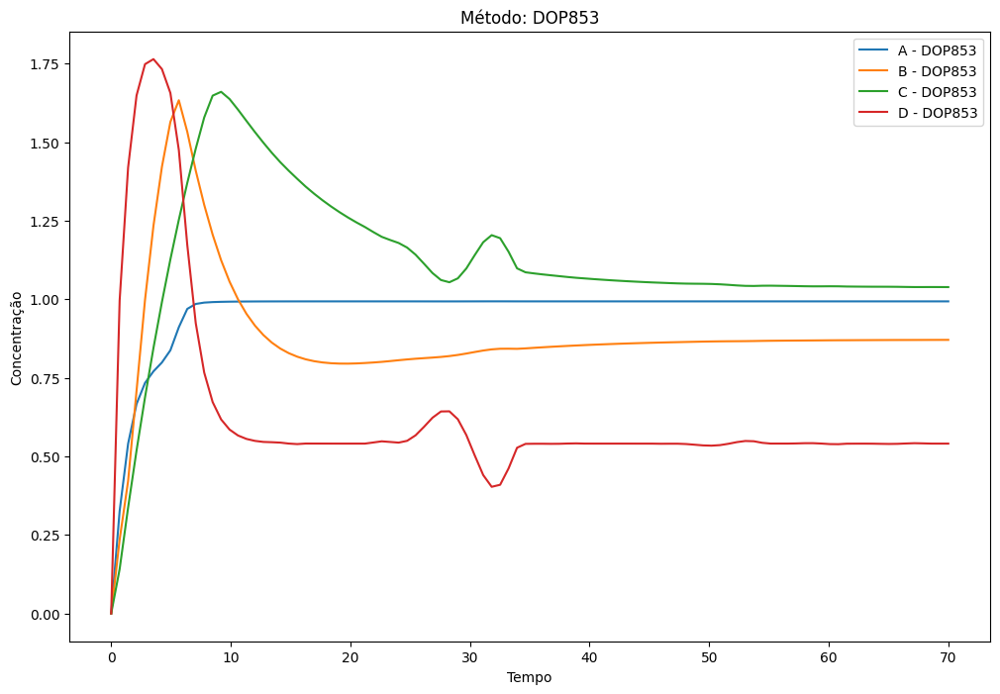

Sigma increased due to no improvement. New sigma: 1': 7.355315168944618e-05, 'min': 0.02441059814468286, 'max': 0.024731856549387907}}}
Sigma increased due to no improvement. New sigma: 2.352473233011845169e-05, 'min': 0.02454290204919645, 'max': 0.02480588103511599}08}}
Sigma increased due to no improvement. New sigma: 3.71386055957433046743367, 'min': 0.024538199257916164, 'max': 0.027287530587561556}}
Sigma increased due to no improvement. New sigma: 8.424048915707834212880865, 'min': 0.02427718861401972, 'max': 0.025268550148732558}}
Sigma increased due to no improvement. New sigma: 15: 0.002067180979540928, 'min': 0.024898532133301156, 'max': 0.03266935813297346}}}


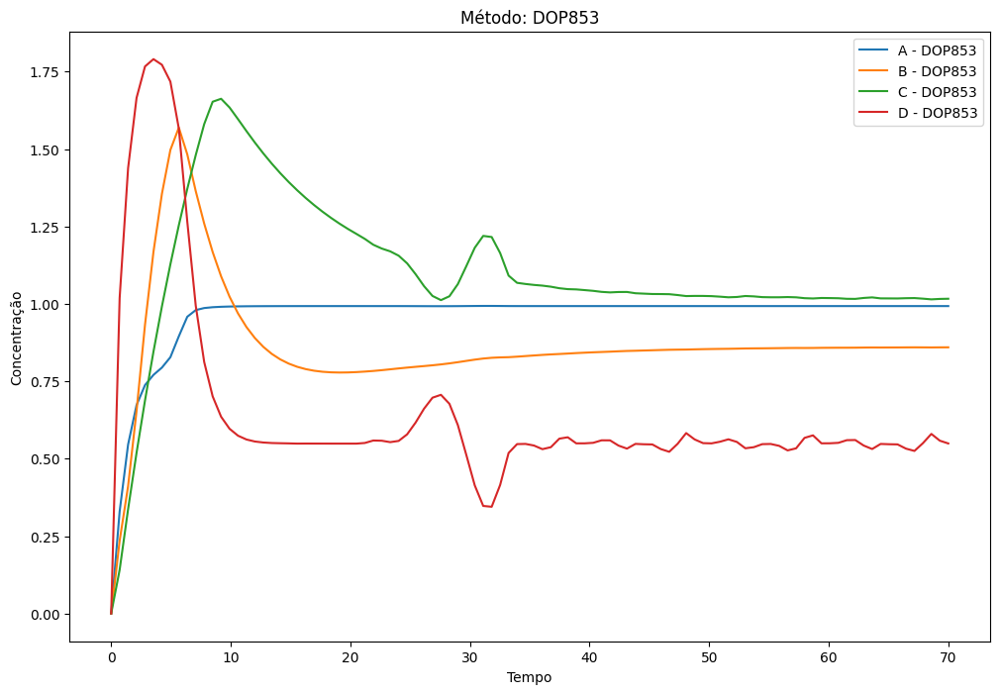

Sigma increased due to no improvement. New sigma: 15 0.30551678566401674, 'min': 0.02522879904547355, 'max': 0.7446699031636578}}
Sigma increased due to no improvement. New sigma: 15: 0.00527952215398057, 'min': 0.024299171205365667, 'max': 0.045060527519651734}3}
Sigma increased due to no improvement. New sigma: 1.442434605971515642e-05, 'min': 0.0218453475248391, 'max': 0.022105250159911275}65}}


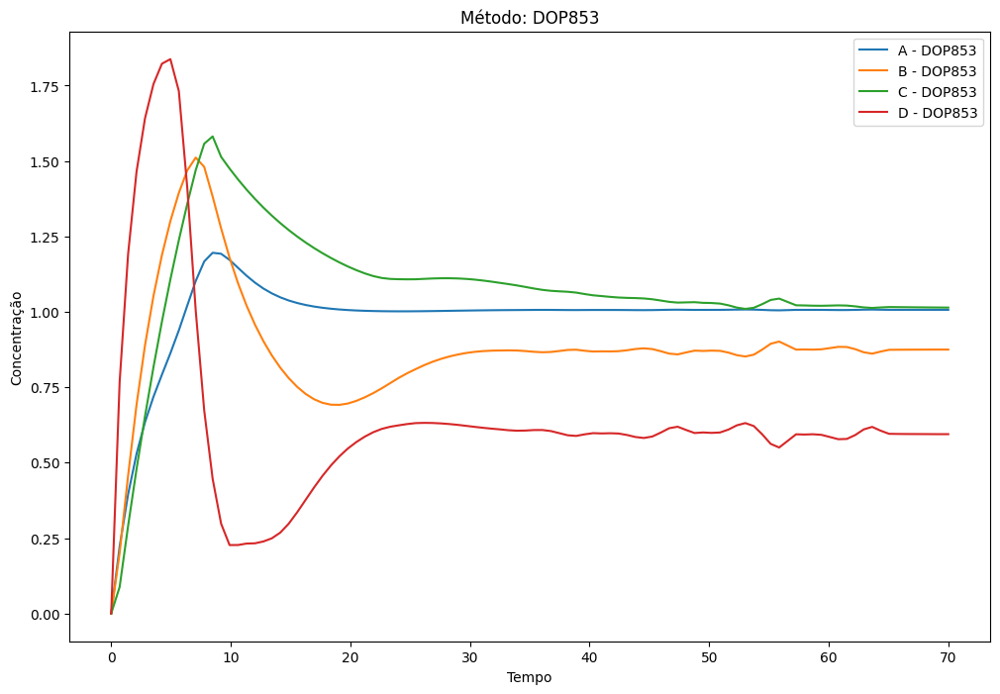

Sigma increased due to no improvement. New sigma: 3.1561991523376654376e-05, 'min': 0.02037444026247087, 'max': 0.020547742021303796}}}
Sigma increased due to no improvement. New sigma: 2.372946027392963226e-05, 'min': 0.020070341354914936, 'max': 0.020281207269466986}}}
Force-stopping DOP853 for seed 7, error MSE due to timeout.1546304873238943, 'min': 0.01996690053797666, 'max': 0.02062352518264843}}2}
Solver: LSODA, Error: MSE
Timeout reached for DOP853 on seed 7, error MSE'std': 8.240588771616254e-05, 'min': 0.019964369128254923, 'max': 0.020273258837708526}


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated error test failures (internal error).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


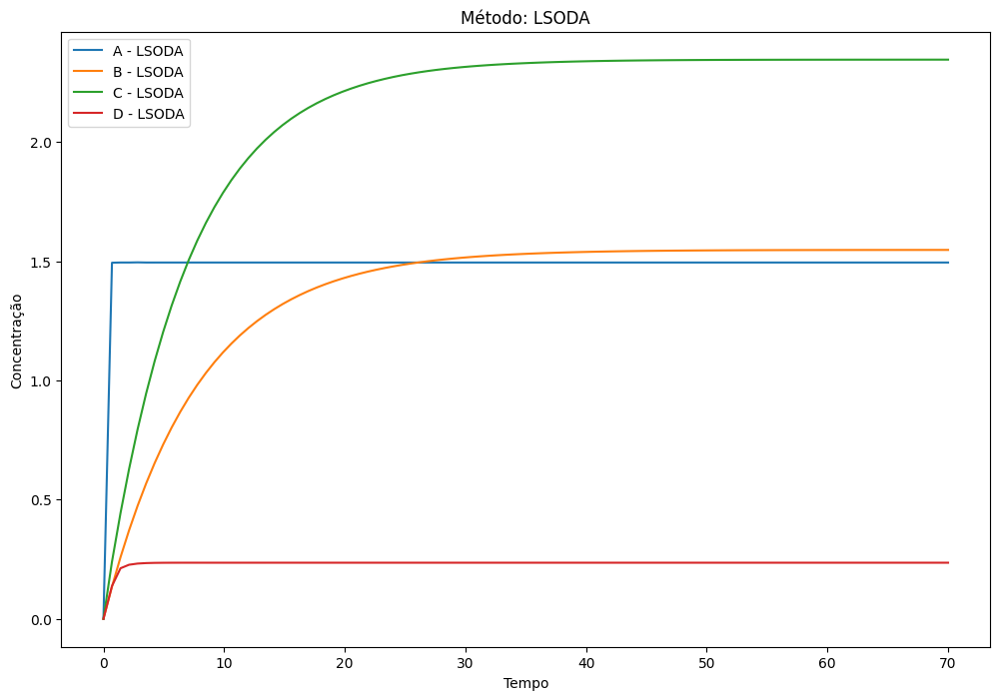

C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ode.py:1348: UserWarning: lsoda: Repeated convergence failures (perhaps bad Jacobian or tolerances).
  warnings.warn('{:s}: {:s}'.format(self.__class__.__name__,


Sigma increased due to no improvement. New sigma: 10.02909187749019778, 'min': 0.07286155334745344, 'max': 0.17947734550578937}6}
Sigma increased due to no improvement. New sigma: 3.8525623639295947653, 'min': 0.154573040033742, 'max': 0.4312323132004787}}}}}
Sigma increased due to no improvement. New sigma: 4.996787694072663696, 'min': 0.16817613294613196, 'max': 0.3558166528639422}5}
Sigma increased due to no improvement. New sigma: 7.43504646128522164444, 'min': 0.08245014102672499, 'max': 0.1874660717821752}
Sigma increased due to no improvement. New sigma: 8.412679186255676416, 'min': 0.13362704248062016, 'max': 1.211282931106534}}67}
Sigma increased due to no improvement. New sigma: 9.37836765301683883, 'min': 0.07926898312638622, 'max': 1.624373140863948}36}


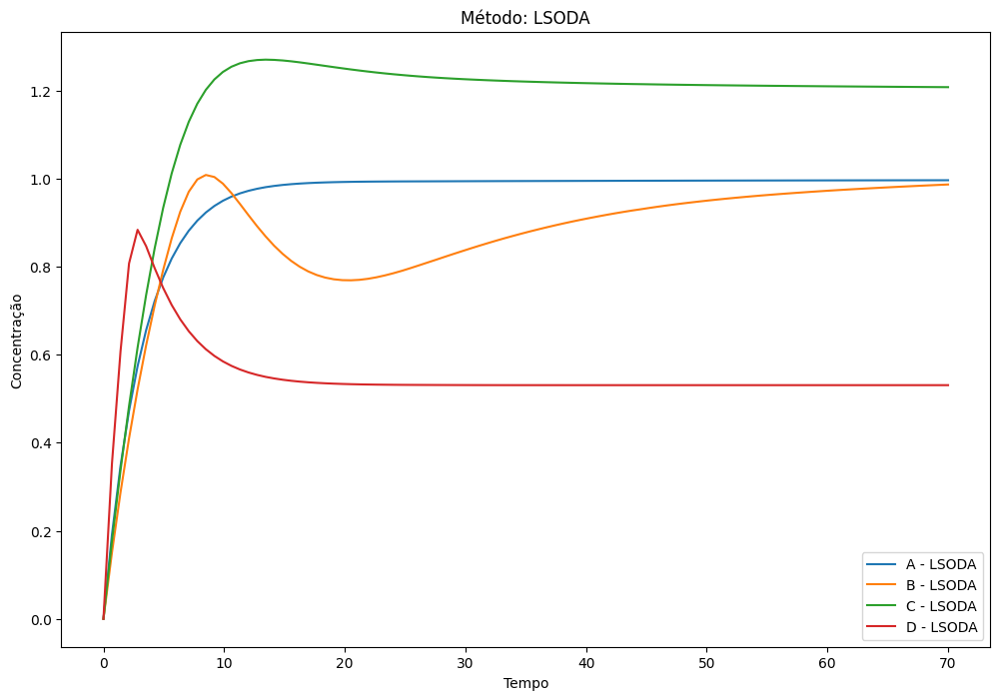

Sigma increased due to no improvement. New sigma: 9.50728182739387796225, 'min': 0.12094060472301006, 'max': 0.2725041754981205}
Sigma increased due to no improvement. New sigma: 7.3997387743047872746, 'min': 0.14213904552998335, 'max': 1.1358656403890308}}
Sigma increased due to no improvement. New sigma: 4.9425096433958313164, 'min': 0.0660732694792726, 'max': 0.8402962688908754}}}
Sigma increased due to no improvement. New sigma: 11.957472221099055344, 'min': 0.08279850584854813, 'max': 0.2585999906434649}}}


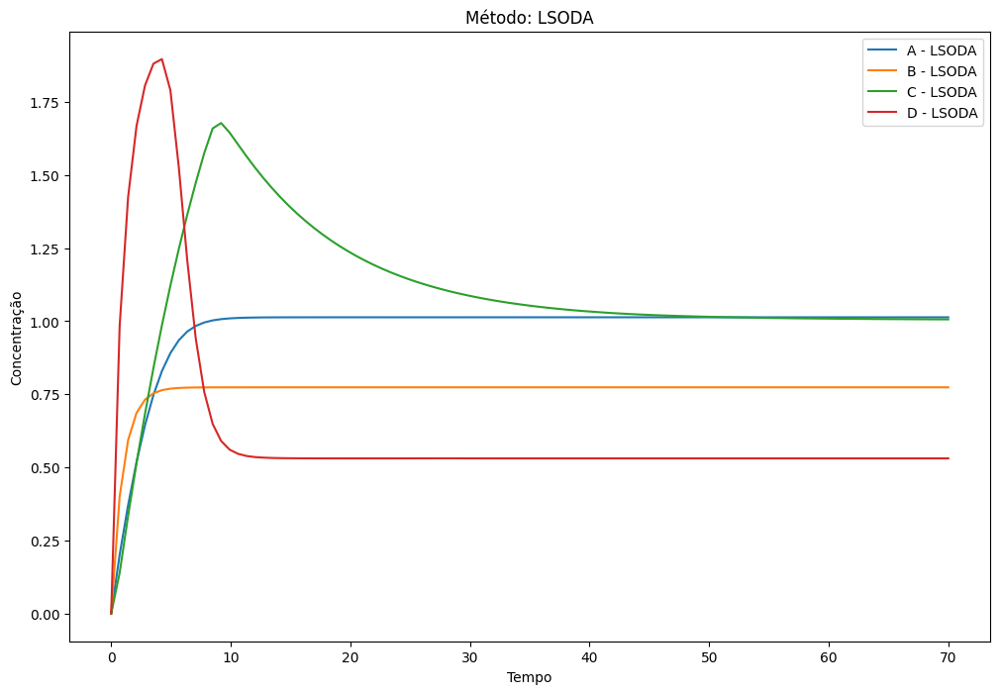

Sigma increased due to no improvement. New sigma: 1': 0.0004305548301452487, 'min': 0.03410708010249077, 'max': 0.035794552553417486}}}
Sigma increased due to no improvement. New sigma: 2.64146884187435786431165, 'min': 0.034414288167243366, 'max': 0.03859620559342941}


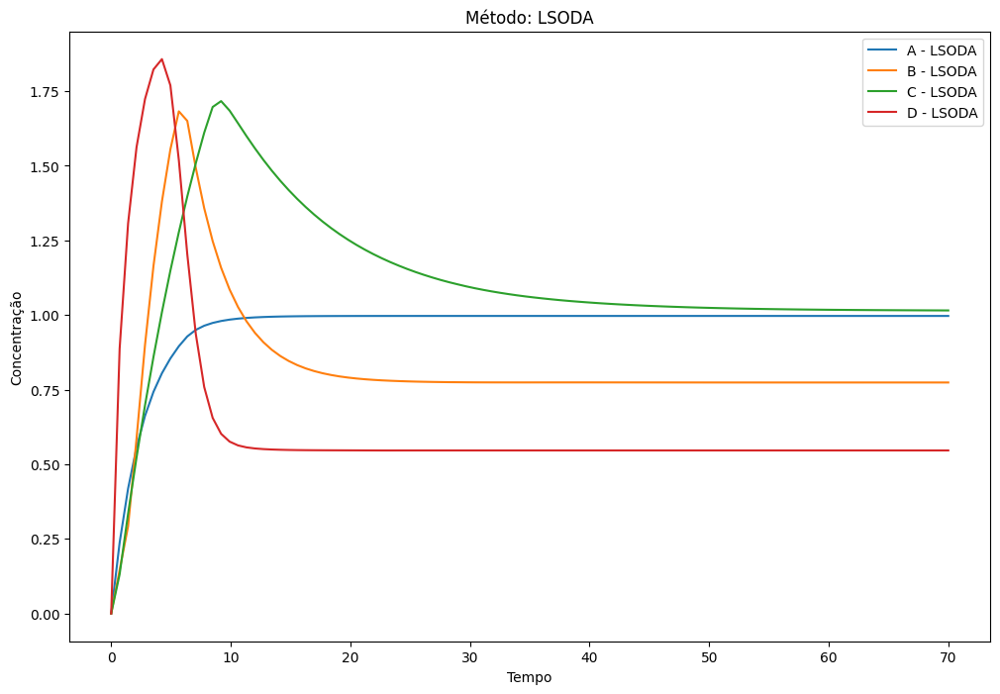

Sigma increased due to no improvement. New sigma: 1': 4.8732930681595416e-05, 'min': 0.025202589602320895, 'max': 0.025386882908054718}
Sigma increased due to no improvement. New sigma: 2.68727471928508651304721, 'min': 0.025302072808083064, 'max': 0.0269036231125009}}}
Sigma increased due to no improvement. New sigma: 3.372755502936022807389, 'min': 0.025348465796284872, 'max': 0.06095269830838978}}}}
Sigma increased due to no improvement. New sigma: 7.209765501829446605094, 'min': 0.02610011896099826, 'max': 0.09976934457251355}2}}}


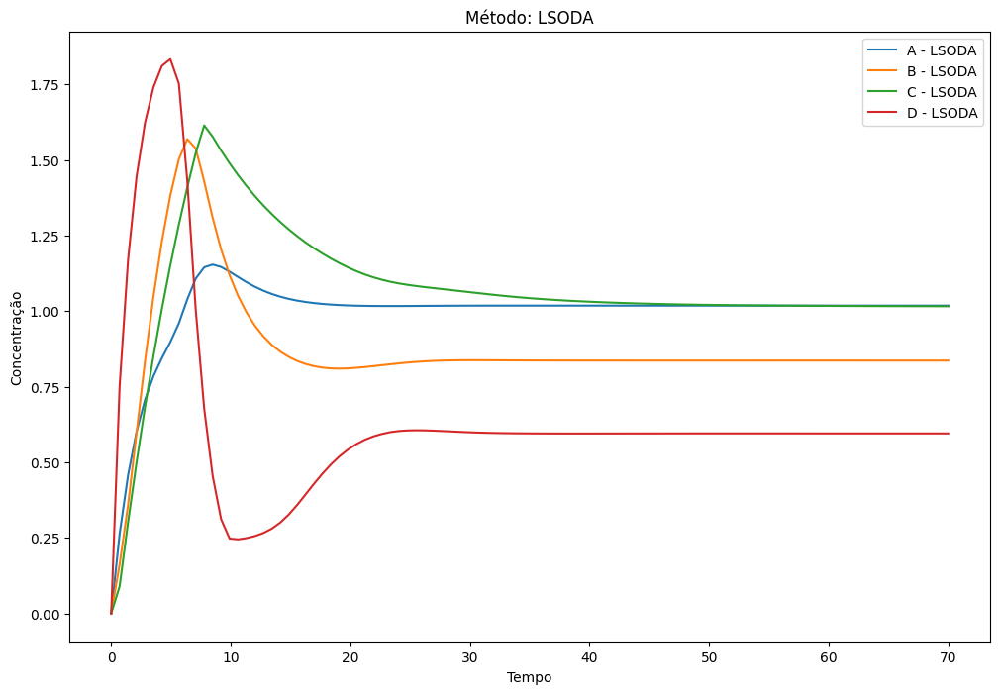

Sigma increased due to no improvement. New sigma: 1': 6.72829015418033e-05, 'min': 0.021423516254847938, 'max': 0.021662832947086593}}}
Sigma increased due to no improvement. New sigma: 2.95661092474327274043666, 'min': 0.021531220140492455, 'max': 0.023031539692358695}}
Sigma increased due to no improvement. New sigma: 6.49630998376041228322203, 'min': 0.021608354405569484, 'max': 0.02832782890491755}3}
Sigma increased due to no improvement. New sigma: 6.52496414976834693895895, 'min': 0.021688543576512464, 'max': 0.023201984128101018}


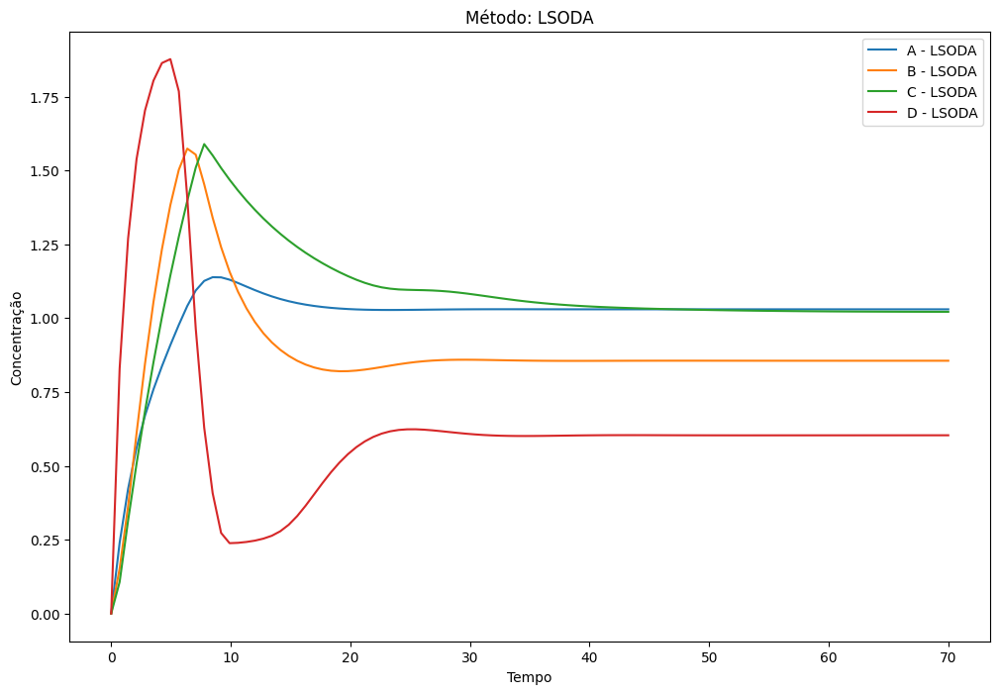

Sigma increased due to no improvement. New sigma: 2.9117997147497783750356, 'min': 0.02104364723507768, 'max': 0.03660409595911753}4}}}
Sigma increased due to no improvement. New sigma: 5.174533208061728176e-05, 'min': 0.021167976865699177, 'max': 0.02146517425232711}}}}
Sigma increased due to no improvement. New sigma: 8.293649392832119859355142, 'min': 0.021135204714312926, 'max': 0.021668029782905315}
Sigma increased due to no improvement. New sigma: 3.722811683248539612e-05, 'min': 0.02108102563988274, 'max': 0.02134898185437597}7}}}
Sigma increased due to no improvement. New sigma: 6.36527508975053368097164, 'min': 0.020969738011023198, 'max': 0.02129759687527343}}}


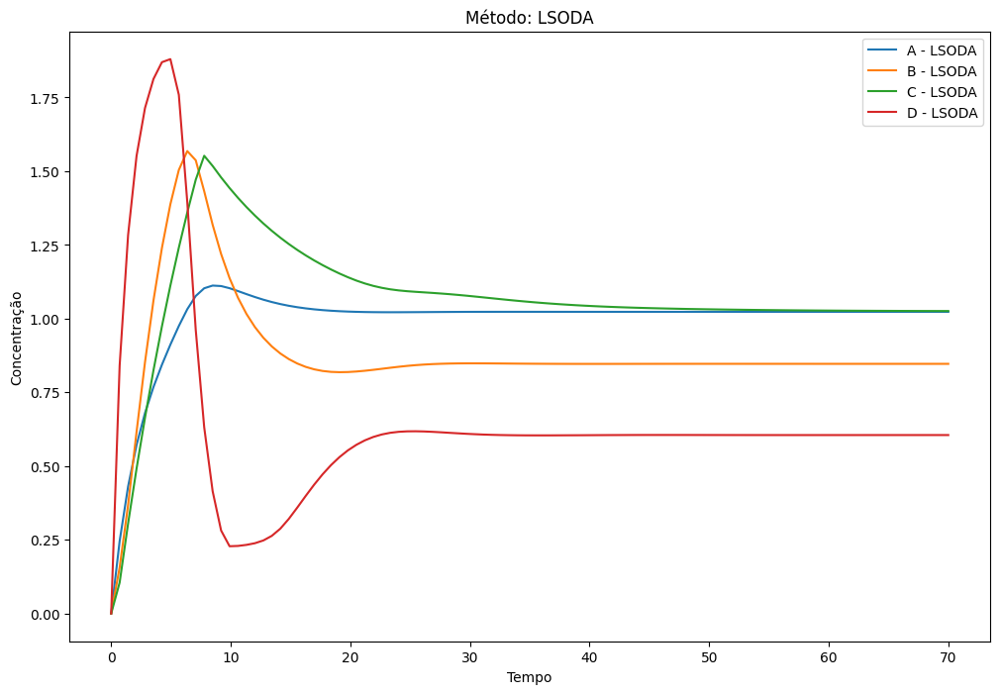

Sigma increased due to no improvement. New sigma: 8.91797282259174542937525, 'min': 0.021092719147445683, 'max': 0.0271296791622636}}}}
Sigma increased due to no improvement. New sigma: 12.39469939100837979e-05, 'min': 0.021004876275880626, 'max': 0.0212961627092943}202}
Sigma increased due to no improvement. New sigma: 15: 0.0001011321498049549, 'min': 0.021042884307230426, 'max': 0.021458139129040904}}
Sigma increased due to no improvement. New sigma: 15: 5.431876654223798e-05, 'min': 0.021194251775916332, 'max': 0.021368796890653283}}
Sigma increased due to no improvement. New sigma: 12.02564790564683748774513, 'min': 0.021234510533515393, 'max': 0.02170707688813507}
Sigma increased due to no improvement. New sigma: 12.183777814404067639e-05, 'min': 0.02112227406075629, 'max': 0.021391587217267784}}}


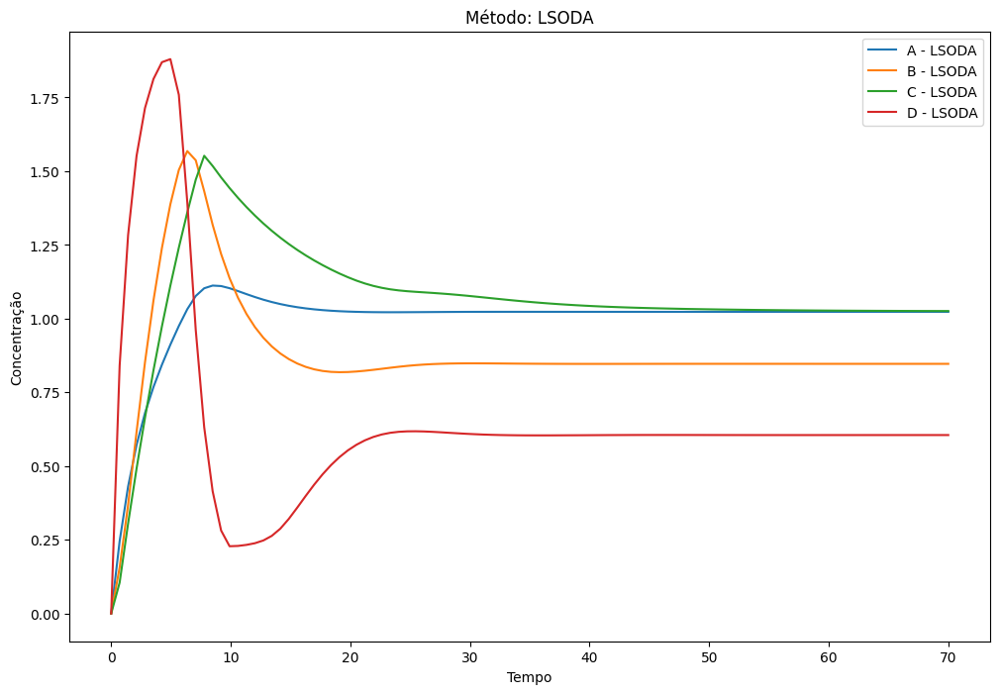

Sigma increased due to no improvement. New sigma: 10.11676735634063578e-05, 'min': 0.020924771310480268, 'max': 0.0211833534766272}13}
Sigma increased due to no improvement. New sigma: 4.718178531344305722897326, 'min': 0.020849143651459175, 'max': 0.021138947944690702}
Sigma increased due to no improvement. New sigma: 15: 9.604067293889014e-05, 'min': 0.020924664719729556, 'max': 0.021196827522592984}}
Sigma increased due to no improvement. New sigma: 15 5.2086062824884545e-05, 'min': 0.021070116333516794, 'max': 0.02122607006538865}}}
Sigma increased due to no improvement. New sigma: 14.569606562343758142e-05, 'min': 0.020891113381521567, 'max': 0.02115679410074467}}}


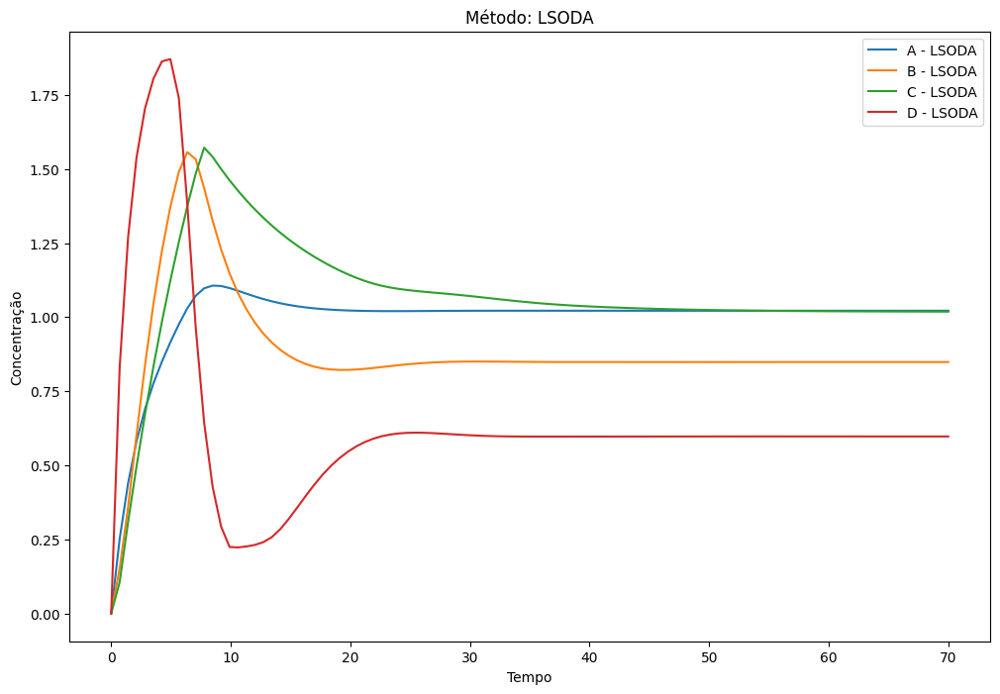

Sigma increased due to no improvement. New sigma: 15: 5.0394879761451324e-05, 'min': 0.021007072080953725, 'max': 0.021185844317214993}
Sigma increased due to no improvement. New sigma: 15 0.00042475167486212903, 'min': 0.021004086604330032, 'max': 0.0227809708555853}73}
Sigma increased due to no improvement. New sigma: 15: 0.0004210678618291595, 'min': 0.02095005117747146, 'max': 0.022651314693303334}}}
Sigma increased due to no improvement. New sigma: 15 9.346591505408331e-05, 'min': 0.02091480336564018, 'max': 0.021175797526810213}7}}
Sigma increased due to no improvement. New sigma: 15: 8.20397379373816e-05, 'min': 0.020915932140889836, 'max': 0.021212585078838705}}}


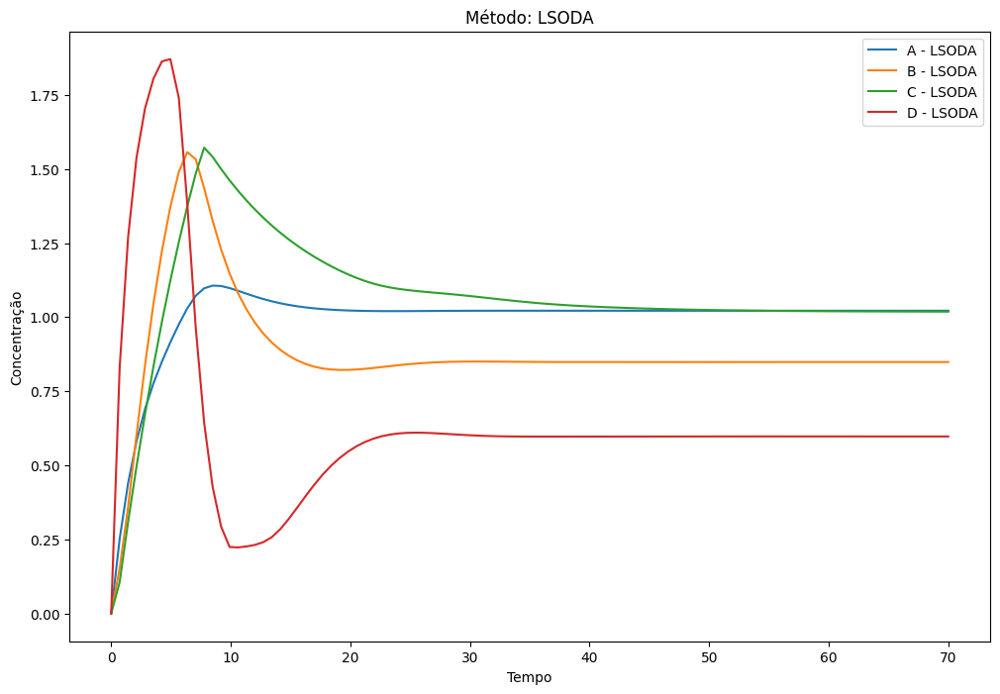

Sigma increased due to no improvement. New sigma: 15: 9.952883154777499e-05, 'min': 0.020920038683774584, 'max': 0.021212224952295432}}
Sigma increased due to no improvement. New sigma: 15: 7.944398853502354e-05, 'min': 0.020936584507749732, 'max': 0.0211549994593119}}}}
Sigma increased due to no improvement. New sigma: 15 8.700279101707224e-05, 'min': 0.020905486239675523, 'max': 0.02117141113889777}}}}
Sigma increased due to no improvement. New sigma: 15: 6.668935816661687e-05, 'min': 0.020899827752145987, 'max': 0.02112597121697777}}}
Sigma increased due to no improvement. New sigma: 15: 0.00010804467526565223, 'min': 0.02087528614668166, 'max': 0.02117187310843769}8}
Solver: RK45, Error: MABS0.02093901923162493, 'std': 9.044002947779273e-05, 'min': 0.020843860310152427, 'max': 0.021114219769296384}}}


C:\Users\anabi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\scipy\integrate\_ivp\common.py:39: UserWarning: The following arguments have no effect for a chosen solver: `min_step`.
  warn("The following arguments have no effect for a chosen solver: {}."


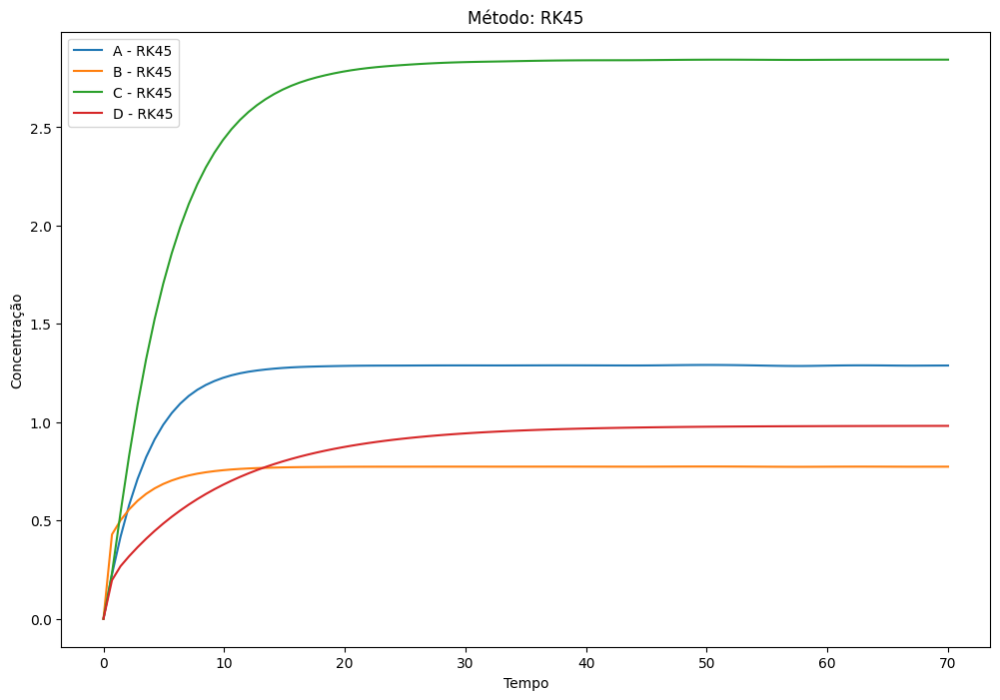

Sigma increased due to no improvement. New sigma: 1.510093041138014295, 'min': 0.26329312176978004, 'max': 0.3540092074129946}6}
Sigma increased due to no improvement. New sigma: 2.039831781752143488, 'min': 0.2666297192423109, 'max': 0.3368502540697495}7}}}
Sigma increased due to no improvement. New sigma: 4.9442660599345866476, 'min': 0.2516954220772965, 'max': 0.7456646617875852}}}
Sigma increased due to no improvement. New sigma: 9.213418262790714824, 'min': 0.27612352019559544, 'max': 1.124357685218159}}}
Sigma increased due to no improvement. New sigma: 1 0.02930966106185468, 'min': 0.12890607335902207, 'max': 0.23272996762537088}}


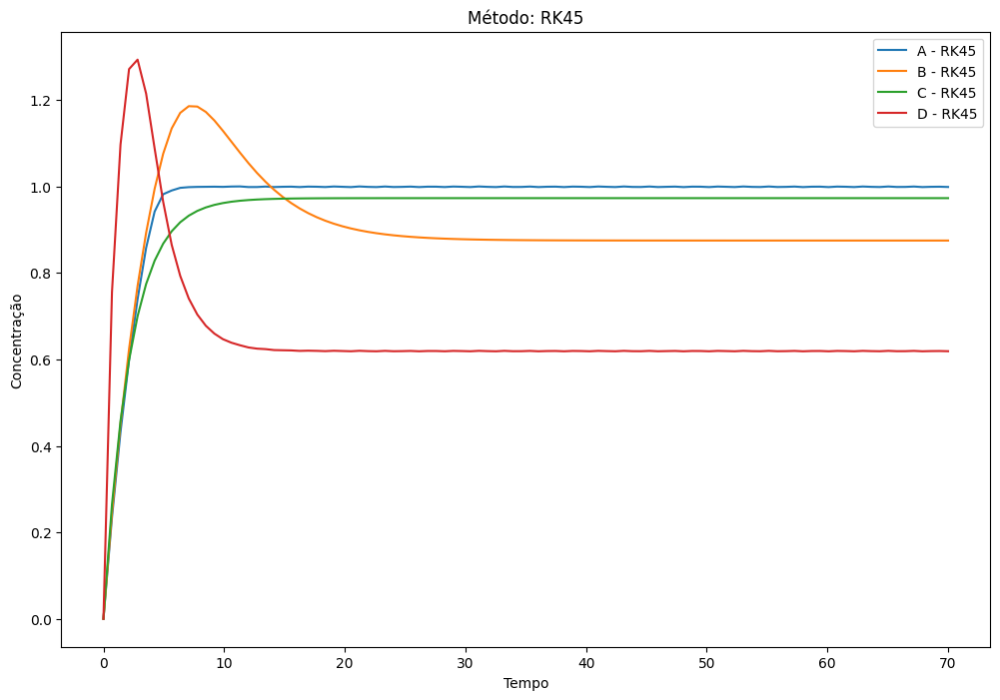

Sigma increased due to no improvement. New sigma: 3.0694723906622054316, 'min': 0.17202462804374097, 'max': 0.34368996925971546}}
Sigma increased due to no improvement. New sigma: 7.256520044206947524, 'min': 0.14384851688621514, 'max': 0.33201041648786783}}
Sigma increased due to no improvement. New sigma: 12.679125595490197006, 'min': 0.2487941960279821, 'max': 0.8007817429070583}6}
Sigma increased due to no improvement. New sigma: 12.69700996387460842, 'min': 0.2907417859171676, 'max': 0.9957413950254376}}4}
Sigma increased due to no improvement. New sigma: 13.77387250046225215, 'min': 0.261206964299668, 'max': 0.3293471764299863}4}5}
Sigma increased due to no improvement. New sigma: 14.117454417061782614, 'min': 0.188200389091933, 'max': 0.33046594775105326}5}}
Sigma increased due to no improvement. New sigma: 13.17890386003974238, 'min': 0.20768164143126408, 'max': 0.3971183124763764}7}
Sigma increased due to no improvement. New sigma: 15.05380471979123973, 'min': 0.14837407535560

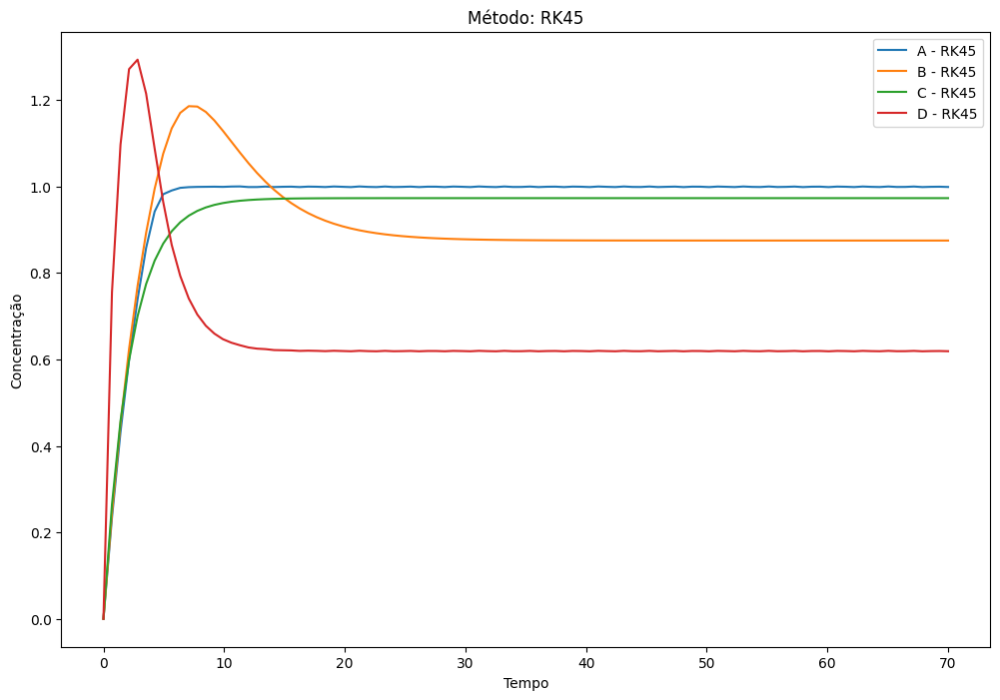

Sigma increased due to no improvement. New sigma: 150.39411075032873616, 'min': 0.16400656423709342, 'max': 1.3397975536736566}}}
Sigma increased due to no improvement. New sigma: 15015154998532529317, 'min': 0.2643262176565454, 'max': 0.32374100299948966}}26}
Sigma increased due to no improvement. New sigma: 150.06316571563950062, 'min': 0.25450295404189427, 'max': 0.4589678086528426}}13}
Sigma increased due to no improvement. New sigma: 150.050470013782279693, 'min': 0.1711587300128457, 'max': 0.3958241763207425}}6}
Sigma increased due to no improvement. New sigma: 150.10669371159170302, 'min': 0.16144716532591524, 'max': 0.5190219421213965}}}


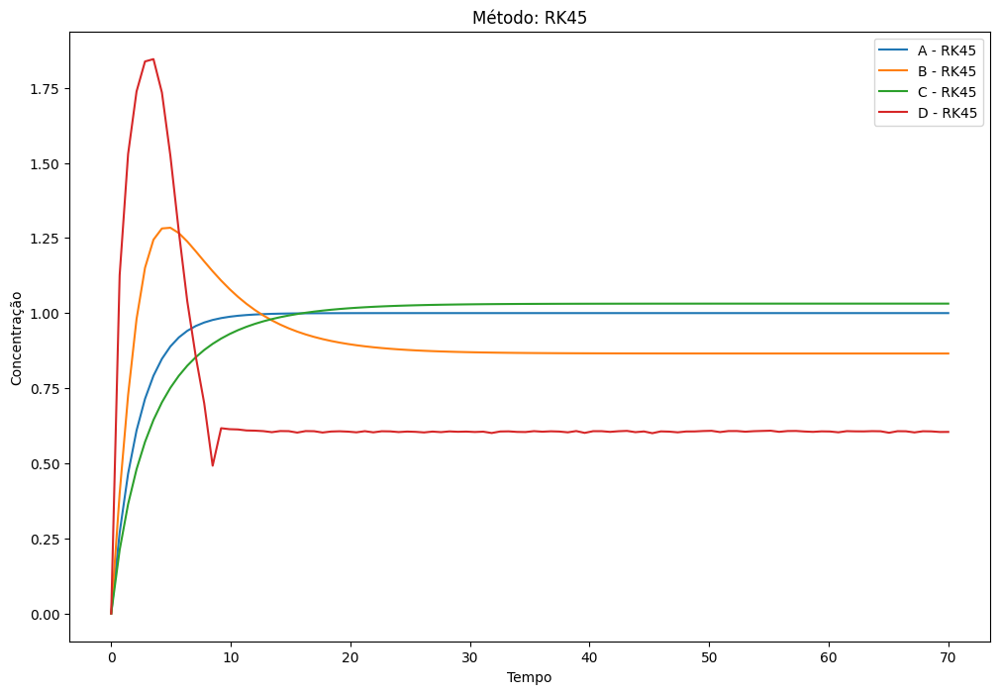

Sigma increased due to no improvement. New sigma: 1: 5.018315189233473e-06, 'min': 0.10911426241485948, 'max': 0.10913032906733179}}
Sigma increased due to no improvement. New sigma: 1.17364016841724376e-05, 'min': 0.10889239585245857, 'max': 0.10898701026553435}}}
Sigma increased due to no improvement. New sigma: 1.0546837782706695958e-05, 'min': 0.10801612297502697, 'max': 0.10811806910593472}


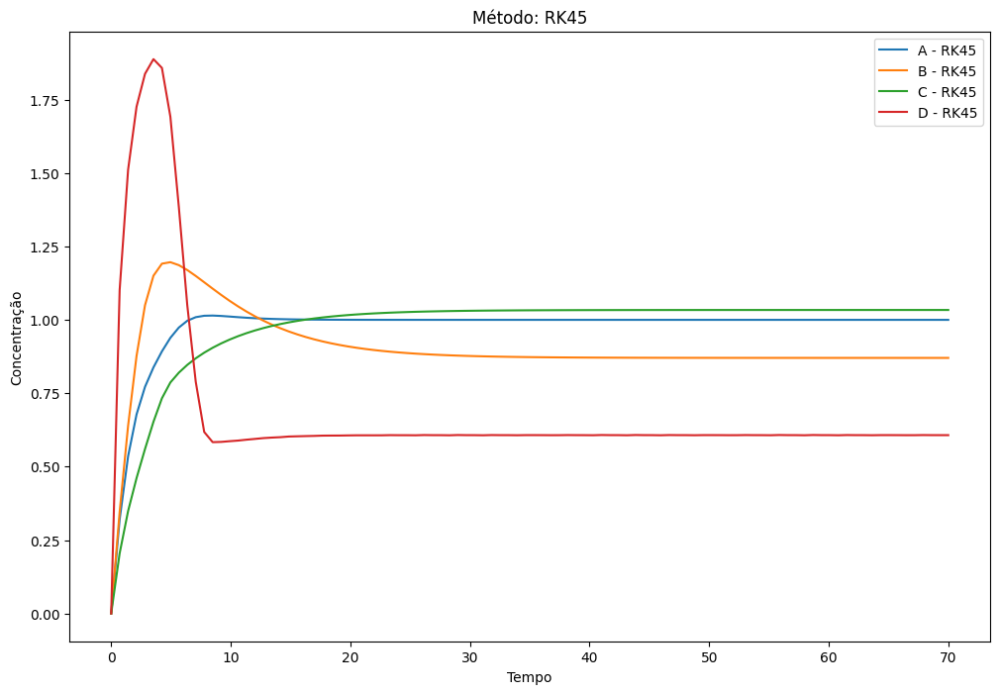

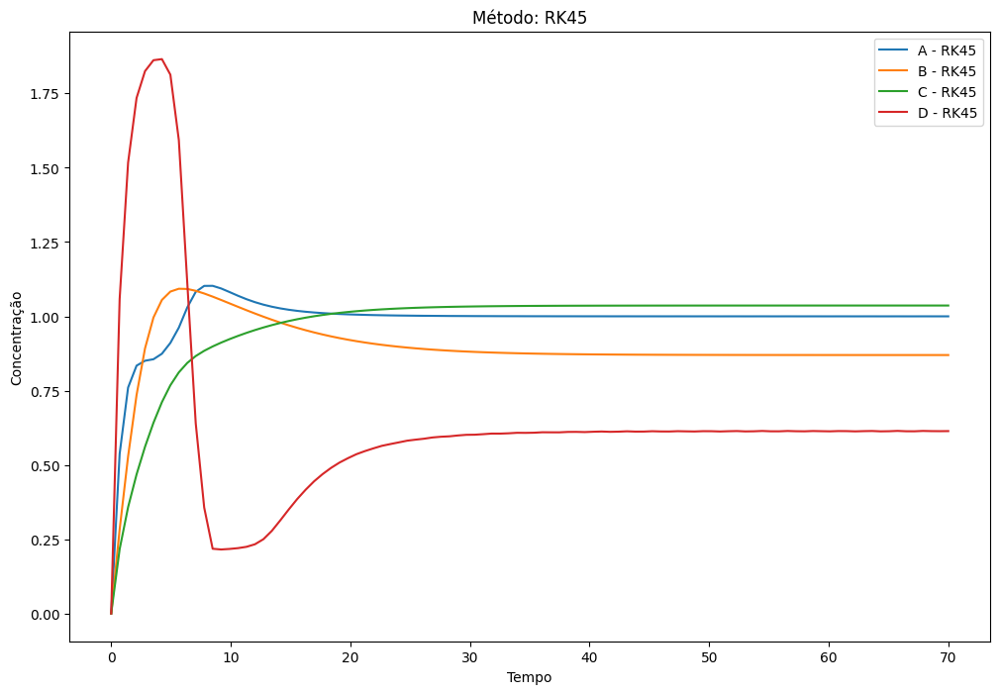

Sigma increased due to no improvement. New sigma: 1: 0.0009555886771644586, 'min': 0.09638632746296213, 'max': 0.09996881057966506}}
Sigma increased due to no improvement. New sigma: 1: 0.0005183855081983716, 'min': 0.09629567263175634, 'max': 0.09759463516574315}}
Sigma increased due to no improvement. New sigma: 1.046561577415184455e-06, 'min': 0.09613304900446203, 'max': 0.0961680403400905}8}
Sigma increased due to no improvement. New sigma: 1.7303578424376083194e-05, 'min': 0.09613495443903539, 'max': 0.09617222621109704}


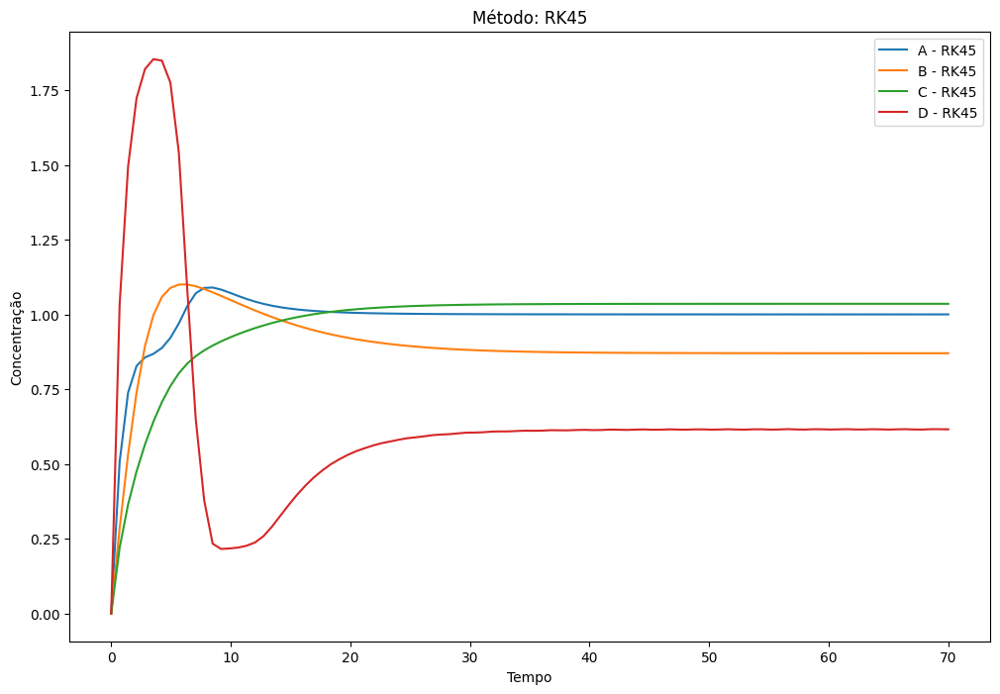

Sigma increased due to no improvement. New sigma: 1.340992659355127197e-06, 'min': 0.0958563672235815, 'max': 0.09587987037256351}}}
Sigma increased due to no improvement. New sigma: 4.29720681697706244728, 'min': 0.09580681019071935, 'max': 0.4512687942393269}}1}}
Sigma increased due to no improvement. New sigma: 5.26088483433956264e-05, 'min': 0.09585092194839173, 'max': 0.09602476001199577}4}
Sigma increased due to no improvement. New sigma: 6.319619413939296508e-05, 'min': 0.09600838317617587, 'max': 0.09616408875436677}}
Sigma increased due to no improvement. New sigma: 10.370191756501349455881, 'min': 0.0958801091828979, 'max': 0.09693134003503516}}}


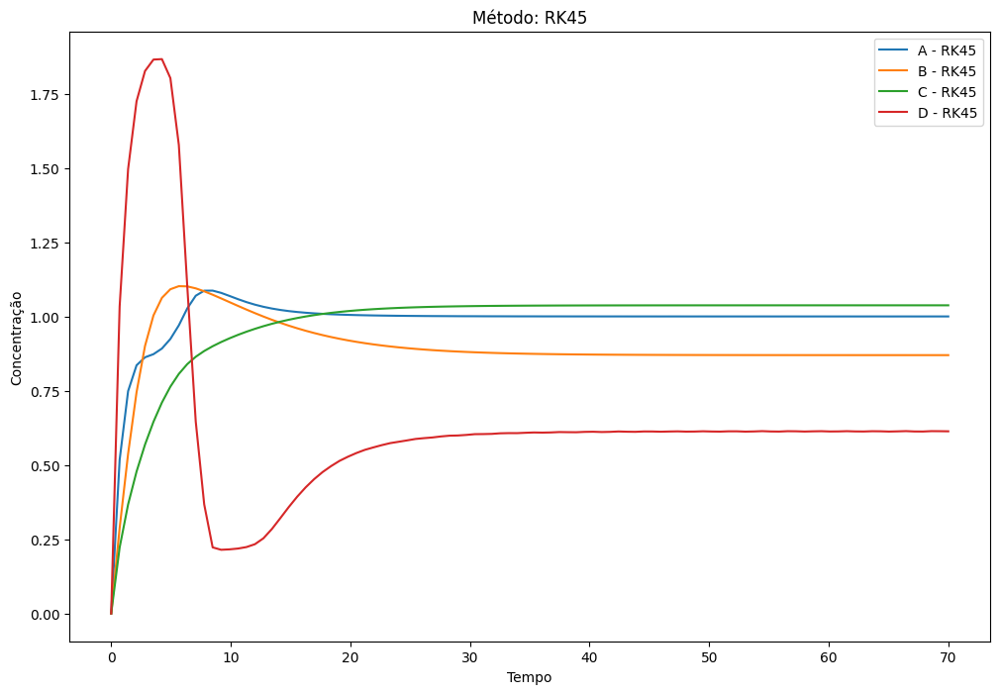

Sigma increased due to no improvement. New sigma: 15 0.0004060067165891029, 'min': 0.09581309257910851, 'max': 0.09727527500260867}}
Sigma increased due to no improvement. New sigma: 15 0.0015897349088969442, 'min': 0.09754403788860361, 'max': 0.10262679601250564}}
Sigma increased due to no improvement. New sigma: 15 0.010507674180930626, 'min': 0.09726435200064888, 'max': 0.13212205171977562}}}
Sigma increased due to no improvement. New sigma: 15 0.0003142344740988867, 'min': 0.09717682595862451, 'max': 0.09812627711929911}}
Sigma increased due to no improvement. New sigma: 15 0.00032173983238474363, 'min': 0.09716311377779377, 'max': 0.09813916731821078}
Sigma increased due to no improvement. New sigma: 15 0.0004927300896194964, 'min': 0.09692469150670266, 'max': 0.09879499463185408}}


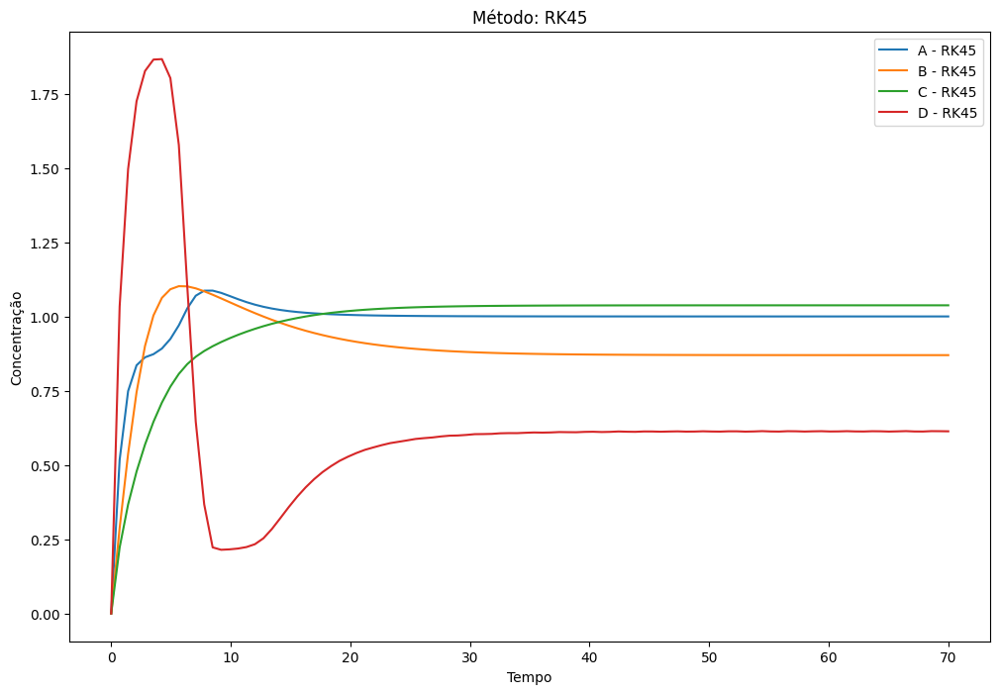

Sigma increased due to no improvement. New sigma: 15 0.00030191940223032933, 'min': 0.09696058154451052, 'max': 0.0981681691233986}}
Sigma increased due to no improvement. New sigma: 15 0.00024352828560021762, 'min': 0.0964775719425253, 'max': 0.09729212127472081}}
Sigma increased due to no improvement. New sigma: 15 9.134872677307531e-05, 'min': 0.09681704884080347, 'max': 0.09715403898036724}}
Sigma increased due to no improvement. New sigma: 15 8.573007767808259e-05, 'min': 0.09644477806990533, 'max': 0.09670772158131913}}
Sigma increased due to no improvement. New sigma: 15 7.424585984064625e-05, 'min': 0.09618112131052178, 'max': 0.09646612840200623}}


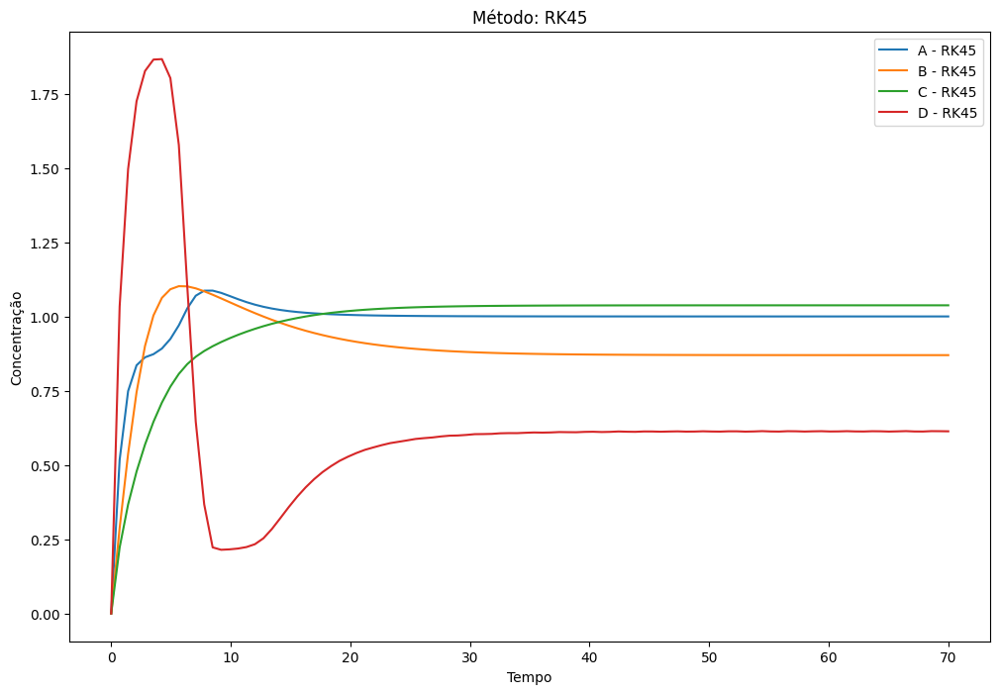

Sigma increased due to no improvement. New sigma: 15 7.777959122767123e-05, 'min': 0.0959797437958239, 'max': 0.09628159116965718}}}
Sigma increased due to no improvement. New sigma: 15.00030631855596397037, 'min': 0.09591009062762165, 'max': 0.0971039437840048}1}}
Force-stopping RK45 for seed 7, error MABS due to timeout.2029940336298373, 'min': 0.09595106330845002, 'max': 0.0966524796473521}}}
Solver: DOP853, Error: MABS
Timeout reached for RK45 on seed 7, error MABSstd': 0.00047297702257558167, 'min': 0.09589262117012692, 'max': 0.09766750052693711}


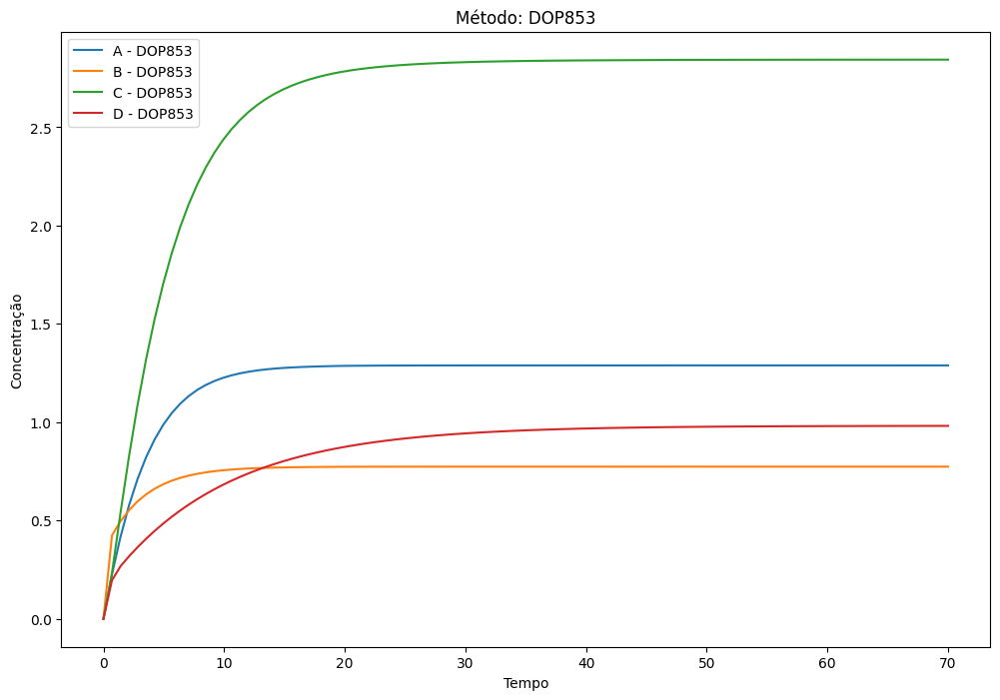

Sigma increased due to no improvement. New sigma: 1.600519356683822445, 'min': 0.26371109408312154, 'max': 0.35212870817258307}}
Sigma increased due to no improvement. New sigma: 1 0.030560084533771962, 'min': 0.2076150207717324, 'max': 0.3157558756277627}4}
Sigma increased due to no improvement. New sigma: 2.5110969231186244626, 'min': 0.2616035518227975, 'max': 0.39337423765882207}}}
Sigma increased due to no improvement. New sigma: 3.418564612338261417, 'min': 0.20749558678023766, 'max': 0.30518504079536046}}}
Sigma increased due to no improvement. New sigma: 6.551266458532938215, 'min': 0.2820418786949685, 'max': 0.8367063759723957}1}}


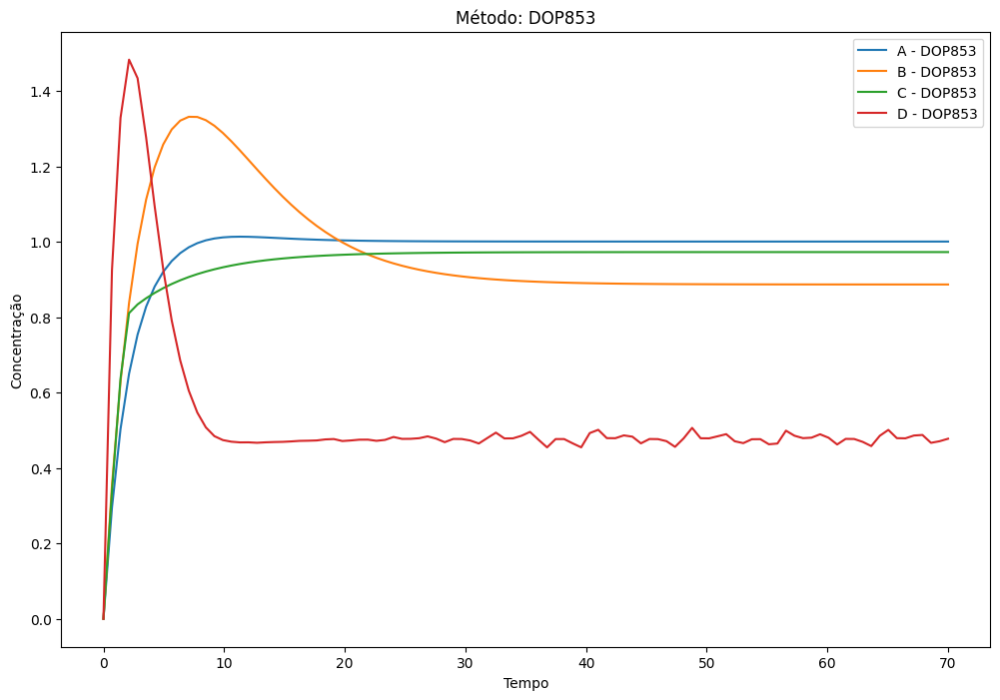

Sigma increased due to no improvement. New sigma: 6.932165273963598615, 'min': 0.15966355524437764, 'max': 0.8856099982609547}}
Sigma increased due to no improvement. New sigma: 7.0407677726738345693, 'min': 0.14983051500208266, 'max': 0.23702150497650265}}
Sigma increased due to no improvement. New sigma: 3.099347135630474331373, 'min': 0.13648243959721465, 'max': 0.14382120806240073}
Sigma increased due to no improvement. New sigma: 7.440774732315677919, 'min': 0.14625452075535686, 'max': 1.0203342809229061}}6}}
Sigma increased due to no improvement. New sigma: 8.01814192676099516272, 'min': 0.1505809018278389, 'max': 0.16501603595662936}}


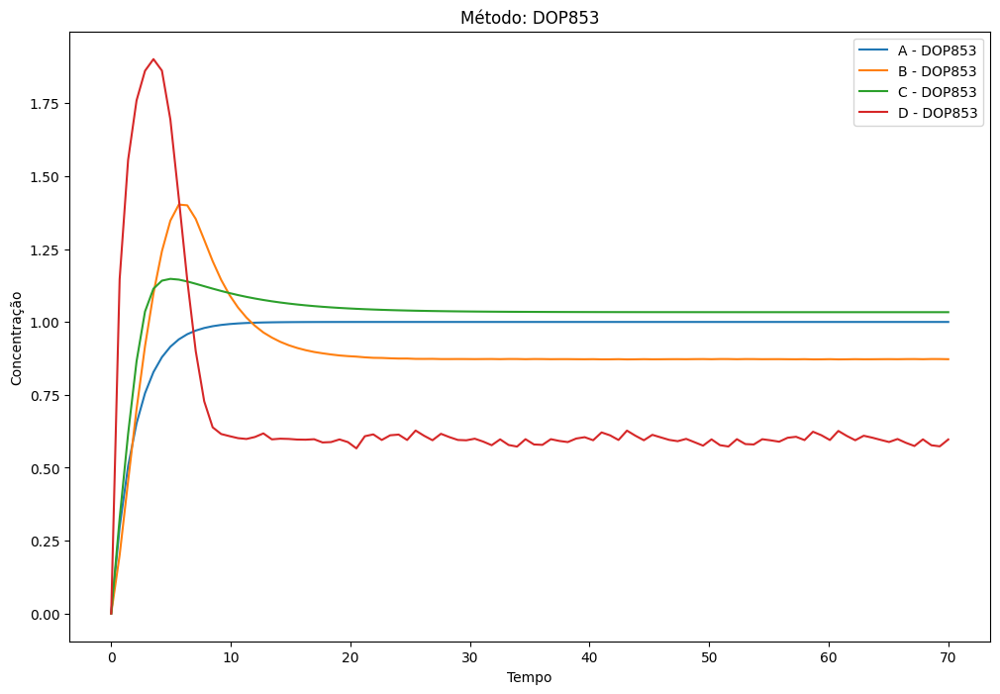

Sigma increased due to no improvement. New sigma: 1: 0.0005095933282331209, 'min': 0.10241485406648382, 'max': 0.10407846911972879}}
Sigma increased due to no improvement. New sigma: 2.7571393782865991253749, 'min': 0.10236936481979111, 'max': 0.10792789342319917}}
Sigma increased due to no improvement. New sigma: 5.01490691793995779365, 'min': 0.10380711952827382, 'max': 0.11461115263602001}}}
Sigma increased due to no improvement. New sigma: 9.963682977584172858633, 'min': 0.10730134855523676, 'max': 0.1404394249517835}}
Sigma increased due to no improvement. New sigma: 12.517617111779169633, 'min': 0.10896797068581193, 'max': 1.1525554272944945}18}
Sigma increased due to no improvement. New sigma: 150.012381896637463802, 'min': 0.11415859069954476, 'max': 0.15367222614909867}}


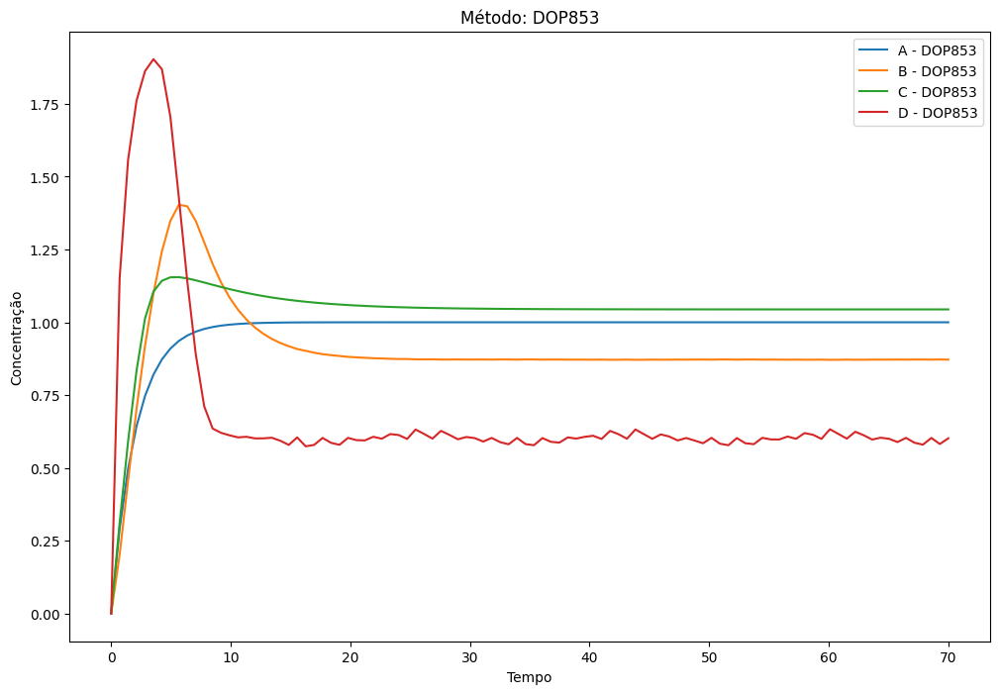

Sigma increased due to no improvement. New sigma: 14.77676002966263637017, 'min': 0.10554657984927558, 'max': 0.12388073208829335}}
Sigma increased due to no improvement. New sigma: 150.006665028349225559, 'min': 0.13662892167205137, 'max': 0.1623281343628705}5}
Sigma increased due to no improvement. New sigma: 15 0.0456286916012928, 'min': 0.12291404603466694, 'max': 0.2974484263713916}4}}}


In [ ]:
# Configuração do log
logging.basicConfig(
    filename="ABCD_CMAES_execution.log",
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s"
)

if os.path.exists('ABCD_CMAES.csv'):
    results_df = pd.read_csv('ABCD_CMAES.csv')
    existing_results = results_df[['seed', 'error_type', 'method']]
else:
    results_df = pd.DataFrame(columns=[
        'best_ind', 'error_type', 'method', 'seed', 'ABS_Fitness',
        'SQUARED_Fitness', 'MSE_Fitness', 'MABS_Fitness', 'execution_time'
    ])
    existing_results = pd.DataFrame(columns=['seed', 'error_type', 'method'])

all_methods = ['RK45', 'DOP853', 'LSODA']
errors = ['ABS', 'SQUARED', 'MSE', 'MABS']

seeds = 10
results = []

TIMEOUT_LIMIT = 60*30  # 30 min timeout

def run_evolution(seed, error, method, result_container):
    logging.info(f"Starting execution for: Solver={method}, Error={error}, Seed={seed}")
    print(f"Solver: {method}, Error: {error}")

    toolbox, hof, strategy, stats = instantiate_toolbox()
    np.random.seed(seed)
    toolbox.register("evaluate", Individual.cma_evaluate, method, error)
    population = toolbox.generate()
    Individual.apply_bounds(population, method, error)

    best_fitness = None
    no_improvement_counter = 0
    best_individual = None
    start_time = time.time()

    try:
        for gen in range(GENERATION_LIMIT):
            if time.time() - start_time > TIMEOUT_LIMIT:
                raise TimeoutError(f"Timeout reached for {method} on seed {seed}, error {error}")

            for i, ind in enumerate(population):
                ind.fitness.values = toolbox.evaluate(ind)

            record = stats.compile(population)
            current_best_fitness = min(ind.fitness.values[0] for ind in population)
            hof.update(population)

            if best_fitness is None or current_best_fitness < best_fitness - TOLERANCE:
                best_fitness = current_best_fitness
                no_improvement_counter = 0
                best_individual = hof[0]
            else:
                no_improvement_counter += 1

            if no_improvement_counter >= (NO_IMPROVEMENT_LIMIT + gen / 100):
                strategy.sigma = min(max(strategy.sigma * HARD_SIGMA_INCREASE_FACTOR, 1), 15)
                logging.info(f"Sigma increased: {strategy.sigma}")
                print(f"Sigma increased due to no improvement. New sigma: {strategy.sigma}")
                no_improvement_counter = 0

            toolbox.update(population)
            print(f"Generation {gen}: {record}", end='\r')

            if gen % 500 == 0 and best_individual:
                best_ind = Individual.list_to_ind(best_individual, method, error)
                best_ind.plot(comparison=False, method=method)

            population = toolbox.generate()
            Individual.apply_bounds(population, method, error)

    except TimeoutError as e:
        logging.warning(e)
        print(e)  # Log timeout event
    except Exception as e:
        logging.error(f"Unexpected error: {e}", exc_info=True)

    finally:
        end_time = time.time()
        execution_time = end_time - start_time

        # Se o melhor indivíduo não existir, salvar valores nulos
        errors_result = best_ind.calc_all_fitness() if best_ind else {
            'ABS_Fitness': None, 'SQUARED_Fitness': None, 'MSE_Fitness': None, 'MABS_Fitness': None
        }

        result_data = {
            'best_ind': best_ind if best_ind else None,
            'error_type': error,
            'method': method,
            'seed': seed,
            'ABS_Fitness': errors_result['ABS_Fitness'],
            'SQUARED_Fitness': errors_result['SQUARED_Fitness'],
            'MSE_Fitness': errors_result['MSE_Fitness'],
            'MABS_Fitness': errors_result['MABS_Fitness'],
            'execution_time': execution_time,
        }

        result_container.append(result_data)
        logging.info(f"Execution finished for {method}, seed {seed}, error {error} in {execution_time:.2f} seconds.")

# Main loop
for seed in range(seeds):
    for error in errors:
        for method in all_methods:
            if not existing_results[
                (existing_results['seed'] == seed) & 
                (existing_results['error_type'] == error) & 
                (existing_results['method'] == method)
            ].empty:
                logging.info(f"Skipping: seed={seed}, error={error}, method={method}")
                print(f"Skipping already processed: seed={seed}, error={error}, method={method}")
                continue

            result_container = []
            thread = threading.Thread(target=run_evolution, args=(seed, error, method, result_container))
            thread.start()
            thread.join(timeout=TIMEOUT_LIMIT)

            if thread.is_alive():
                logging.warning(f"Force-stopping {method} for seed {seed}, error {error} due to timeout.")
                print(f"Force-stopping {method} for seed {seed}, error {error} due to timeout.")

            if result_container:
                results.append(result_container[0])
                results_df = pd.concat([results_df, pd.DataFrame([result_container[0]])], ignore_index=True)
                results_df.to_csv('ABCD_CMAES.csv', index=False)
            else:
                logging.warning(f"WARNING: No results stored for {method}, seed {seed}, error {error}.")
                print(f"WARNING: No results stored for {method}, seed {seed}, error {error}.")


In [ ]:
results_df